## 1. Import Essential Library

In [1]:
from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
import matplotlib.pyplot as plt
import sys
import numpy as np
import os

Using TensorFlow backend.


In [0]:
if not os.path.exists('images'):
    os.mkdir('images')

## 2. Define hyper-parameters 

In [0]:
img_rows = 28
img_cols = 28
channels = 1
img_shape = (img_rows, img_cols, channels)
latent_dim = 100
epochs = 10000
batch_size=128
sample_interval=50
colab = True

## 3. Load MNIST Dataset and Prepare the target annotations for GAN

In [4]:
# Load the dataset
(X_train, _), (_, _) = mnist.load_data()
# Rescale -1 to 1
X_train = X_train / 127.5 - 1.
X_train = np.expand_dims(X_train, axis=3)
# Adversarial ground truths
valid = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

11493376/11490434 [==============================] - 1s 0us/step


## 4. Lets define a function called build_generator() which defines our generator structure. 
- Dense: units=256, input_dim=latent_dim
- LeakyReLU: alpha=0.2
- BatchNormalization: momentum=0.8
- Dense: units=512
- LeakyReLU: alpha=0.2
- BatchNormalization: momentum=0.8
- Dense: units=1024
- LeakyReLU: alpha=0.2
- BatchNormalization: momentum=0.8
- Dense: units=number of pixel in each image in MNIST, actiovation = 'tanh'
- Reshape: shape = img_shape

In [0]:
def build_generator():
    model = Sequential()
    
    model.add(Dense(units=256, input_dim=latent_dim))
    model.add(LeakyReLU(alpha= 0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(units=512))
    model.add(LeakyReLU(alpha= 0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(units=1024))
    model.add(LeakyReLU(alpha= 0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(units=28*28,activation='tanh'))
    model.add(Reshape(target_shape = img_shape))

    model.summary()
    noise = Input(shape=(latent_dim,))
    img = model(noise)

    return Model(noise, img)

## 5. Lets define a function called build_discriminator() which defines our  discriminator structure
- Flatten: input_shape=img_shape
- Dense: units=512
- LeakyReLU: alpha=0.2
- Dense: units=256
- LeakyReLU: alpha=0.2
- Dense: units=1, activation = 'sigmoid'

In [0]:
def build_discriminator():

    model = Sequential()

    model.add(Flatten(input_shape=img_shape))
    model.add(Dense(units=512))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(units=256))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(units=1,activation='sigmoid'))
    
    model.summary()

    img = Input(shape=img_shape)
    validity = model(img)

    return Model(inputs=img, outputs=validity)

## 6. Which optimizer do we use

In [0]:
optimizer = Adam(0.0002, 0.5)

## 7. In this section, we are trying to define a model and create it using compile.

In [8]:
# Build and compile the discriminator
discriminator = build_discriminator()
discriminator.compile(loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
_________________________________________________________________


## 8. Generator definition not creation

In [16]:
# Build the generator
generator = build_generator()
generator.compile(loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 256)               25856     
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
batch_normalization_7 (Batch (None, 256)               1024      
_________________________________________________________________
dense_13 (Dense)             (None, 512)               131584    
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 512)               0         
_________________________________________________________________
batch_normalization_8 (Batch (None, 512)               2048      
_________________________________________________________________
dense_14 (Dense)             (None, 1024)              525312    
__________

## 9. Define the combined model. A combination of discriminator and generator.

In [0]:
# The generator takes noise as input and generates imgs
z = Input(shape=(latent_dim,))
img = generator(z)

# For the combined model we will only train the generator
discriminator.trainable = False

# The discriminator takes generated images as input and determines validity
validity = discriminator(img)

# The combined model  (stacked generator and discriminator)
# Trains the generator to fool the discriminator
combined = Model(z, validity)

combined.compile(loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy'])

In [19]:
z = Input(shape=(latent_dim,))
img = generator(z)
img

<tf.Tensor 'model_3_1/sequential_4/reshape_2/Reshape:0' shape=(?, 28, 28, 1) dtype=float32>

## 10. This is a tool for visualizing the performance of generator

In [0]:
def sample_images(epoch):
    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = generator.predict(noise)

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
            axs[i,j].axis('off')
            cnt += 1
    if(colab == False):
        fig.savefig("images/%d.png" % epoch)
    else:
        plt.show()
    plt.close()

## 11. Training loop

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:975: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 0.284479, acc.: 83.20%] [G loss: 2.813138, acc.: 0.00%]


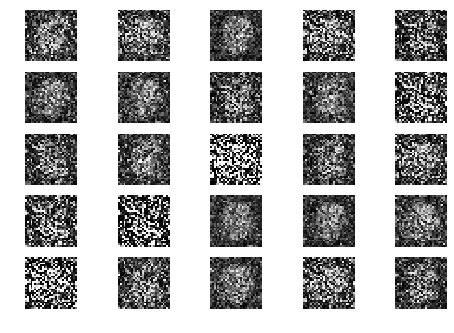

1 [D loss: 0.449354, acc.: 76.17%] [G loss: 1.945894, acc.: 22.66%]
2 [D loss: 0.359418, acc.: 79.69%] [G loss: 2.762080, acc.: 0.00%]
3 [D loss: 0.398933, acc.: 79.69%] [G loss: 2.360389, acc.: 3.12%]
4 [D loss: 0.375949, acc.: 81.25%] [G loss: 2.315346, acc.: 6.25%]
5 [D loss: 0.424418, acc.: 78.12%] [G loss: 2.304069, acc.: 1.56%]
6 [D loss: 0.479010, acc.: 73.44%] [G loss: 2.195882, acc.: 2.34%]
7 [D loss: 0.402025, acc.: 76.17%] [G loss: 2.473970, acc.: 1.56%]
8 [D loss: 0.572209, acc.: 68.75%] [G loss: 1.853995, acc.: 28.12%]
9 [D loss: 0.337393, acc.: 82.03%] [G loss: 2.441764, acc.: 0.00%]
10 [D loss: 0.546278, acc.: 71.09%] [G loss: 2.069696, acc.: 7.03%]
11 [D loss: 0.368188, acc.: 81.64%] [G loss: 2.813123, acc.: 0.00%]
12 [D loss: 0.531266, acc.: 67.97%] [G loss: 2.233864, acc.: 2.34%]
13 [D loss: 0.420516, acc.: 77.34%] [G loss: 2.523799, acc.: 0.00%]
14 [D loss: 0.653554, acc.: 63.67%] [G loss: 1.917717, acc.: 22.66%]
15 [D loss: 0.372171, acc.: 79.30%] [G loss: 2.871958,

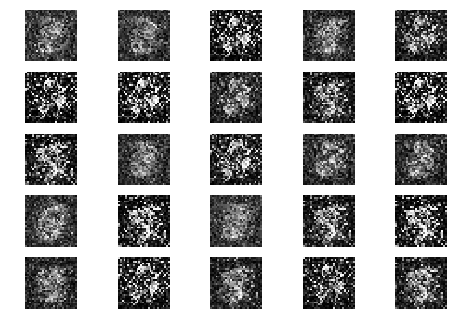

51 [D loss: 0.673433, acc.: 58.20%] [G loss: 1.568174, acc.: 25.00%]
52 [D loss: 0.614467, acc.: 63.28%] [G loss: 1.593311, acc.: 13.28%]
53 [D loss: 0.646139, acc.: 60.16%] [G loss: 1.516808, acc.: 10.16%]
54 [D loss: 0.572020, acc.: 67.58%] [G loss: 1.630796, acc.: 8.59%]
55 [D loss: 0.658004, acc.: 58.59%] [G loss: 1.347022, acc.: 25.78%]
56 [D loss: 0.592400, acc.: 64.84%] [G loss: 1.350248, acc.: 28.12%]
57 [D loss: 0.610398, acc.: 63.67%] [G loss: 1.374276, acc.: 16.41%]
58 [D loss: 0.674785, acc.: 58.20%] [G loss: 1.316616, acc.: 29.69%]
59 [D loss: 0.537260, acc.: 73.44%] [G loss: 1.679188, acc.: 6.25%]
60 [D loss: 0.629122, acc.: 65.23%] [G loss: 1.398068, acc.: 30.47%]
61 [D loss: 0.596409, acc.: 62.50%] [G loss: 1.498999, acc.: 22.66%]
62 [D loss: 0.637505, acc.: 64.45%] [G loss: 1.454615, acc.: 27.34%]
63 [D loss: 0.581871, acc.: 65.23%] [G loss: 1.576851, acc.: 9.38%]
64 [D loss: 0.644873, acc.: 60.55%] [G loss: 1.379079, acc.: 20.31%]
65 [D loss: 0.683667, acc.: 55.47%] [

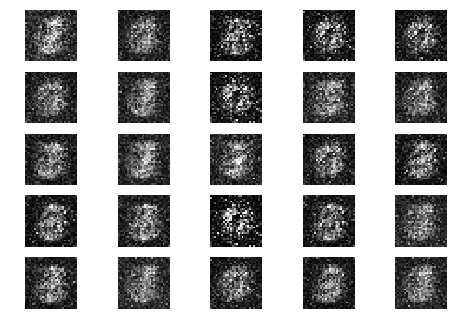

101 [D loss: 0.691363, acc.: 47.66%] [G loss: 0.619736, acc.: 82.03%]
102 [D loss: 0.702513, acc.: 44.92%] [G loss: 0.615590, acc.: 88.28%]
103 [D loss: 0.714038, acc.: 44.14%] [G loss: 0.600561, acc.: 94.53%]
104 [D loss: 0.685913, acc.: 48.05%] [G loss: 0.610285, acc.: 92.97%]
105 [D loss: 0.678774, acc.: 48.44%] [G loss: 0.629253, acc.: 84.38%]
106 [D loss: 0.703022, acc.: 46.09%] [G loss: 0.618256, acc.: 89.06%]
107 [D loss: 0.702880, acc.: 46.48%] [G loss: 0.615291, acc.: 96.09%]
108 [D loss: 0.699517, acc.: 45.70%] [G loss: 0.618977, acc.: 93.75%]
109 [D loss: 0.686290, acc.: 48.05%] [G loss: 0.624086, acc.: 95.31%]
110 [D loss: 0.679522, acc.: 48.44%] [G loss: 0.619419, acc.: 92.19%]
111 [D loss: 0.684917, acc.: 47.27%] [G loss: 0.637828, acc.: 85.94%]
112 [D loss: 0.676759, acc.: 48.83%] [G loss: 0.629404, acc.: 88.28%]
113 [D loss: 0.690297, acc.: 46.09%] [G loss: 0.622005, acc.: 87.50%]
114 [D loss: 0.690778, acc.: 46.48%] [G loss: 0.618649, acc.: 89.84%]
115 [D loss: 0.67165

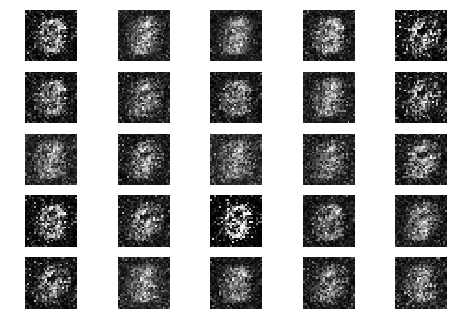

151 [D loss: 0.660753, acc.: 47.66%] [G loss: 0.663929, acc.: 81.25%]
152 [D loss: 0.648221, acc.: 48.83%] [G loss: 0.664375, acc.: 76.56%]
153 [D loss: 0.664013, acc.: 48.05%] [G loss: 0.659490, acc.: 76.56%]
154 [D loss: 0.649773, acc.: 48.44%] [G loss: 0.659250, acc.: 77.34%]
155 [D loss: 0.655097, acc.: 49.22%] [G loss: 0.652107, acc.: 84.38%]
156 [D loss: 0.642922, acc.: 48.44%] [G loss: 0.651784, acc.: 82.81%]
157 [D loss: 0.651035, acc.: 49.22%] [G loss: 0.653081, acc.: 88.28%]
158 [D loss: 0.660912, acc.: 49.22%] [G loss: 0.651521, acc.: 85.94%]
159 [D loss: 0.659672, acc.: 49.22%] [G loss: 0.653870, acc.: 82.81%]
160 [D loss: 0.658409, acc.: 48.83%] [G loss: 0.652425, acc.: 82.81%]
161 [D loss: 0.652556, acc.: 50.00%] [G loss: 0.654722, acc.: 75.78%]
162 [D loss: 0.659477, acc.: 49.22%] [G loss: 0.662652, acc.: 67.97%]
163 [D loss: 0.658076, acc.: 48.83%] [G loss: 0.663219, acc.: 71.88%]
164 [D loss: 0.648763, acc.: 48.05%] [G loss: 0.670255, acc.: 69.53%]
165 [D loss: 0.65679

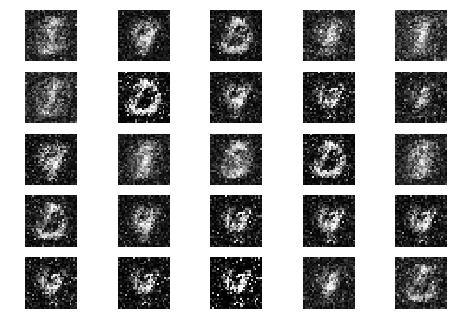

201 [D loss: 0.677309, acc.: 45.31%] [G loss: 0.669171, acc.: 67.19%]
202 [D loss: 0.678789, acc.: 47.66%] [G loss: 0.664930, acc.: 65.62%]
203 [D loss: 0.675784, acc.: 48.44%] [G loss: 0.667240, acc.: 71.09%]
204 [D loss: 0.671218, acc.: 49.61%] [G loss: 0.668679, acc.: 58.59%]
205 [D loss: 0.668264, acc.: 49.22%] [G loss: 0.667538, acc.: 60.16%]
206 [D loss: 0.664416, acc.: 49.22%] [G loss: 0.680362, acc.: 48.44%]
207 [D loss: 0.658958, acc.: 49.61%] [G loss: 0.678713, acc.: 49.22%]
208 [D loss: 0.659280, acc.: 50.39%] [G loss: 0.684644, acc.: 49.22%]
209 [D loss: 0.658251, acc.: 50.00%] [G loss: 0.688681, acc.: 51.56%]
210 [D loss: 0.662767, acc.: 49.61%] [G loss: 0.690635, acc.: 53.91%]
211 [D loss: 0.658943, acc.: 49.22%] [G loss: 0.680735, acc.: 63.28%]
212 [D loss: 0.657287, acc.: 49.22%] [G loss: 0.677652, acc.: 67.97%]
213 [D loss: 0.651565, acc.: 48.83%] [G loss: 0.679727, acc.: 62.50%]
214 [D loss: 0.651703, acc.: 49.22%] [G loss: 0.677204, acc.: 69.53%]
215 [D loss: 0.65933

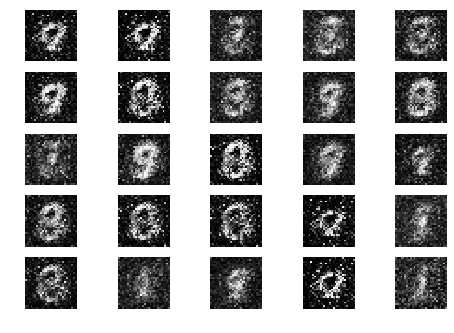

251 [D loss: 0.633639, acc.: 50.78%] [G loss: 0.728852, acc.: 17.97%]
252 [D loss: 0.625093, acc.: 53.12%] [G loss: 0.717488, acc.: 28.12%]
253 [D loss: 0.630051, acc.: 50.78%] [G loss: 0.715490, acc.: 33.59%]
254 [D loss: 0.630980, acc.: 53.12%] [G loss: 0.714553, acc.: 33.59%]
255 [D loss: 0.635159, acc.: 54.30%] [G loss: 0.718439, acc.: 30.47%]
256 [D loss: 0.619971, acc.: 57.81%] [G loss: 0.716385, acc.: 41.41%]
257 [D loss: 0.628175, acc.: 55.86%] [G loss: 0.721196, acc.: 37.50%]
258 [D loss: 0.619469, acc.: 55.86%] [G loss: 0.721362, acc.: 33.59%]
259 [D loss: 0.631954, acc.: 54.30%] [G loss: 0.717091, acc.: 32.81%]
260 [D loss: 0.633551, acc.: 53.91%] [G loss: 0.718748, acc.: 32.81%]
261 [D loss: 0.624990, acc.: 57.03%] [G loss: 0.708119, acc.: 44.53%]
262 [D loss: 0.631327, acc.: 60.55%] [G loss: 0.715713, acc.: 38.28%]
263 [D loss: 0.621349, acc.: 62.89%] [G loss: 0.721370, acc.: 33.59%]
264 [D loss: 0.621887, acc.: 62.11%] [G loss: 0.735727, acc.: 20.31%]
265 [D loss: 0.63900

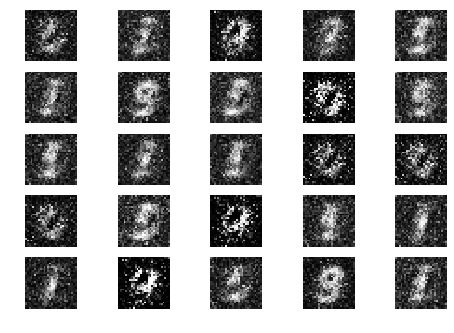

301 [D loss: 0.637364, acc.: 55.86%] [G loss: 0.721122, acc.: 28.12%]
302 [D loss: 0.631371, acc.: 57.81%] [G loss: 0.735196, acc.: 25.78%]
303 [D loss: 0.635092, acc.: 58.98%] [G loss: 0.713103, acc.: 31.25%]
304 [D loss: 0.643325, acc.: 60.94%] [G loss: 0.708703, acc.: 40.62%]
305 [D loss: 0.635505, acc.: 58.98%] [G loss: 0.707694, acc.: 42.97%]
306 [D loss: 0.654138, acc.: 56.64%] [G loss: 0.709014, acc.: 42.97%]
307 [D loss: 0.640581, acc.: 62.50%] [G loss: 0.702395, acc.: 46.88%]
308 [D loss: 0.656531, acc.: 62.50%] [G loss: 0.707895, acc.: 47.66%]
309 [D loss: 0.646544, acc.: 64.45%] [G loss: 0.720335, acc.: 44.53%]
310 [D loss: 0.664604, acc.: 62.11%] [G loss: 0.727938, acc.: 40.62%]
311 [D loss: 0.652163, acc.: 62.89%] [G loss: 0.730610, acc.: 36.72%]
312 [D loss: 0.655431, acc.: 61.72%] [G loss: 0.723565, acc.: 39.06%]
313 [D loss: 0.646496, acc.: 62.11%] [G loss: 0.736048, acc.: 35.16%]
314 [D loss: 0.643242, acc.: 62.89%] [G loss: 0.742260, acc.: 23.44%]
315 [D loss: 0.65361

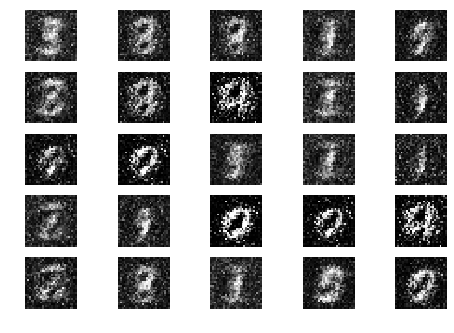

351 [D loss: 0.625607, acc.: 64.06%] [G loss: 0.754439, acc.: 21.09%]
352 [D loss: 0.614376, acc.: 62.11%] [G loss: 0.741503, acc.: 24.22%]
353 [D loss: 0.613766, acc.: 63.67%] [G loss: 0.731580, acc.: 33.59%]
354 [D loss: 0.627414, acc.: 62.11%] [G loss: 0.733243, acc.: 28.91%]
355 [D loss: 0.613909, acc.: 65.62%] [G loss: 0.749273, acc.: 25.78%]
356 [D loss: 0.632977, acc.: 63.67%] [G loss: 0.760874, acc.: 26.56%]
357 [D loss: 0.625196, acc.: 65.62%] [G loss: 0.765523, acc.: 24.22%]
358 [D loss: 0.628362, acc.: 67.97%] [G loss: 0.776652, acc.: 24.22%]
359 [D loss: 0.621171, acc.: 66.41%] [G loss: 0.780852, acc.: 23.44%]
360 [D loss: 0.618195, acc.: 63.67%] [G loss: 0.807854, acc.: 19.53%]
361 [D loss: 0.636104, acc.: 62.89%] [G loss: 0.791235, acc.: 23.44%]
362 [D loss: 0.661954, acc.: 54.30%] [G loss: 0.767648, acc.: 25.00%]
363 [D loss: 0.656295, acc.: 57.03%] [G loss: 0.762933, acc.: 28.12%]
364 [D loss: 0.650447, acc.: 63.28%] [G loss: 0.753156, acc.: 28.91%]
365 [D loss: 0.66920

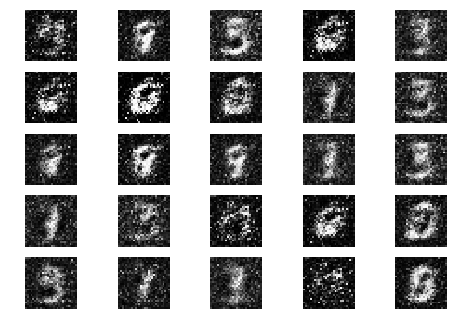

401 [D loss: 0.625524, acc.: 58.98%] [G loss: 0.771378, acc.: 8.59%]
402 [D loss: 0.620648, acc.: 66.02%] [G loss: 0.775227, acc.: 10.16%]
403 [D loss: 0.639257, acc.: 64.45%] [G loss: 0.768969, acc.: 17.97%]
404 [D loss: 0.630168, acc.: 63.28%] [G loss: 0.783321, acc.: 10.94%]
405 [D loss: 0.636160, acc.: 60.55%] [G loss: 0.769655, acc.: 16.41%]
406 [D loss: 0.629590, acc.: 60.16%] [G loss: 0.768826, acc.: 14.84%]
407 [D loss: 0.626269, acc.: 62.11%] [G loss: 0.767922, acc.: 23.44%]
408 [D loss: 0.623259, acc.: 66.02%] [G loss: 0.762206, acc.: 23.44%]
409 [D loss: 0.636124, acc.: 62.11%] [G loss: 0.754526, acc.: 18.75%]
410 [D loss: 0.625243, acc.: 62.89%] [G loss: 0.750471, acc.: 22.66%]
411 [D loss: 0.638381, acc.: 65.23%] [G loss: 0.745461, acc.: 25.78%]
412 [D loss: 0.651164, acc.: 62.50%] [G loss: 0.763026, acc.: 20.31%]
413 [D loss: 0.637112, acc.: 60.55%] [G loss: 0.770684, acc.: 7.81%]
414 [D loss: 0.635301, acc.: 65.23%] [G loss: 0.778080, acc.: 6.25%]
415 [D loss: 0.636712, 

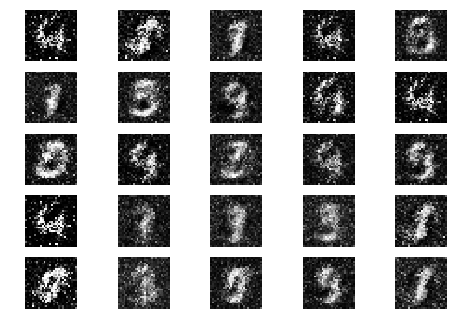

451 [D loss: 0.657567, acc.: 59.77%] [G loss: 0.785345, acc.: 10.94%]
452 [D loss: 0.645473, acc.: 57.42%] [G loss: 0.794105, acc.: 8.59%]
453 [D loss: 0.653023, acc.: 56.25%] [G loss: 0.800889, acc.: 14.06%]
454 [D loss: 0.636911, acc.: 64.06%] [G loss: 0.799628, acc.: 16.41%]
455 [D loss: 0.643165, acc.: 60.16%] [G loss: 0.769260, acc.: 22.66%]
456 [D loss: 0.638791, acc.: 62.11%] [G loss: 0.777045, acc.: 21.09%]
457 [D loss: 0.644154, acc.: 58.59%] [G loss: 0.771955, acc.: 20.31%]
458 [D loss: 0.644604, acc.: 58.98%] [G loss: 0.764675, acc.: 14.84%]
459 [D loss: 0.639275, acc.: 58.59%] [G loss: 0.791082, acc.: 10.16%]
460 [D loss: 0.644532, acc.: 59.38%] [G loss: 0.800386, acc.: 5.47%]
461 [D loss: 0.632889, acc.: 61.72%] [G loss: 0.799895, acc.: 4.69%]
462 [D loss: 0.646365, acc.: 55.47%] [G loss: 0.765331, acc.: 15.62%]
463 [D loss: 0.644261, acc.: 53.52%] [G loss: 0.770476, acc.: 13.28%]
464 [D loss: 0.645633, acc.: 56.25%] [G loss: 0.782111, acc.: 14.06%]
465 [D loss: 0.647240, 

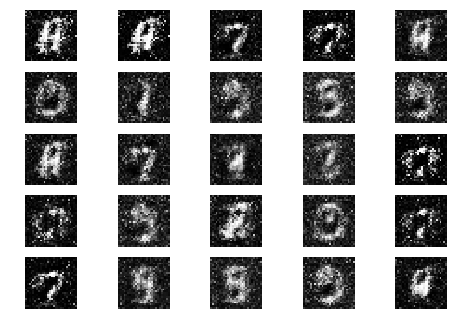

501 [D loss: 0.615630, acc.: 67.97%] [G loss: 0.799756, acc.: 2.34%]
502 [D loss: 0.642372, acc.: 55.86%] [G loss: 0.784280, acc.: 10.16%]
503 [D loss: 0.624049, acc.: 69.14%] [G loss: 0.782148, acc.: 14.84%]
504 [D loss: 0.636747, acc.: 63.28%] [G loss: 0.797747, acc.: 3.91%]
505 [D loss: 0.638475, acc.: 62.50%] [G loss: 0.800388, acc.: 10.94%]
506 [D loss: 0.640263, acc.: 64.45%] [G loss: 0.820817, acc.: 7.03%]
507 [D loss: 0.625210, acc.: 66.41%] [G loss: 0.822498, acc.: 13.28%]
508 [D loss: 0.617238, acc.: 72.66%] [G loss: 0.837474, acc.: 12.50%]
509 [D loss: 0.627304, acc.: 69.53%] [G loss: 0.843036, acc.: 7.03%]
510 [D loss: 0.612412, acc.: 70.31%] [G loss: 0.863025, acc.: 1.56%]
511 [D loss: 0.623859, acc.: 66.02%] [G loss: 0.847747, acc.: 7.81%]
512 [D loss: 0.639795, acc.: 58.20%] [G loss: 0.834632, acc.: 1.56%]
513 [D loss: 0.640915, acc.: 64.06%] [G loss: 0.843825, acc.: 4.69%]
514 [D loss: 0.645811, acc.: 56.25%] [G loss: 0.854360, acc.: 4.69%]
515 [D loss: 0.649736, acc.: 

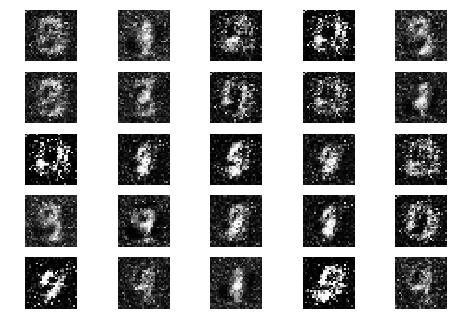

551 [D loss: 0.616206, acc.: 64.06%] [G loss: 0.789504, acc.: 18.75%]
552 [D loss: 0.600879, acc.: 72.27%] [G loss: 0.796888, acc.: 13.28%]
553 [D loss: 0.595672, acc.: 70.31%] [G loss: 0.803916, acc.: 15.62%]
554 [D loss: 0.627181, acc.: 65.62%] [G loss: 0.825996, acc.: 11.72%]
555 [D loss: 0.598537, acc.: 73.83%] [G loss: 0.813351, acc.: 14.84%]
556 [D loss: 0.611643, acc.: 69.14%] [G loss: 0.821023, acc.: 8.59%]
557 [D loss: 0.597754, acc.: 72.27%] [G loss: 0.839519, acc.: 6.25%]
558 [D loss: 0.596369, acc.: 72.27%] [G loss: 0.855621, acc.: 8.59%]
559 [D loss: 0.620778, acc.: 66.41%] [G loss: 0.854511, acc.: 3.12%]
560 [D loss: 0.615361, acc.: 66.41%] [G loss: 0.840793, acc.: 4.69%]
561 [D loss: 0.619273, acc.: 63.67%] [G loss: 0.833118, acc.: 7.81%]
562 [D loss: 0.629795, acc.: 61.72%] [G loss: 0.815300, acc.: 7.03%]
563 [D loss: 0.612362, acc.: 64.06%] [G loss: 0.815128, acc.: 10.16%]
564 [D loss: 0.628247, acc.: 60.94%] [G loss: 0.837047, acc.: 13.28%]
565 [D loss: 0.619676, acc.

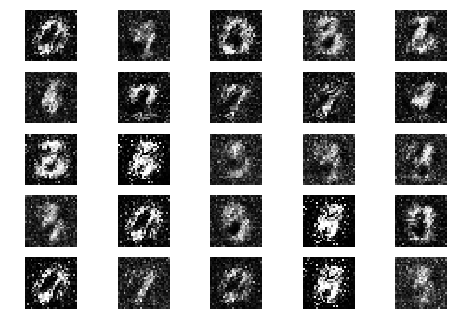

601 [D loss: 0.610185, acc.: 67.58%] [G loss: 0.819422, acc.: 7.81%]
602 [D loss: 0.602201, acc.: 69.92%] [G loss: 0.850664, acc.: 1.56%]
603 [D loss: 0.591592, acc.: 76.56%] [G loss: 0.859988, acc.: 6.25%]
604 [D loss: 0.601447, acc.: 73.05%] [G loss: 0.828263, acc.: 9.38%]
605 [D loss: 0.599009, acc.: 69.53%] [G loss: 0.816001, acc.: 7.03%]
606 [D loss: 0.604673, acc.: 65.62%] [G loss: 0.820714, acc.: 4.69%]
607 [D loss: 0.597458, acc.: 72.66%] [G loss: 0.820143, acc.: 13.28%]
608 [D loss: 0.599395, acc.: 66.41%] [G loss: 0.834744, acc.: 7.03%]
609 [D loss: 0.584141, acc.: 69.53%] [G loss: 0.837548, acc.: 7.03%]
610 [D loss: 0.599388, acc.: 73.44%] [G loss: 0.810625, acc.: 10.16%]
611 [D loss: 0.606465, acc.: 65.23%] [G loss: 0.809271, acc.: 10.16%]
612 [D loss: 0.591926, acc.: 69.14%] [G loss: 0.811134, acc.: 13.28%]
613 [D loss: 0.599199, acc.: 69.53%] [G loss: 0.811559, acc.: 9.38%]
614 [D loss: 0.598604, acc.: 71.09%] [G loss: 0.816858, acc.: 8.59%]
615 [D loss: 0.602607, acc.: 7

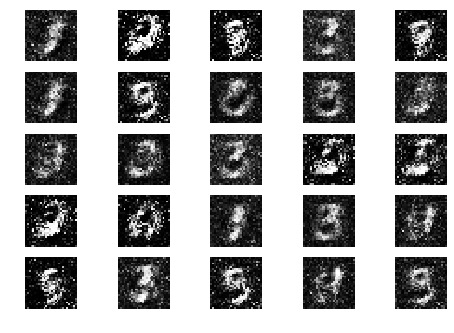

651 [D loss: 0.605739, acc.: 68.36%] [G loss: 0.855099, acc.: 6.25%]
652 [D loss: 0.596842, acc.: 70.31%] [G loss: 0.867055, acc.: 10.94%]
653 [D loss: 0.607127, acc.: 69.53%] [G loss: 0.881481, acc.: 7.81%]
654 [D loss: 0.588012, acc.: 74.22%] [G loss: 0.886564, acc.: 8.59%]
655 [D loss: 0.647663, acc.: 62.89%] [G loss: 0.875467, acc.: 12.50%]
656 [D loss: 0.643747, acc.: 65.23%] [G loss: 0.922401, acc.: 1.56%]
657 [D loss: 0.616462, acc.: 68.36%] [G loss: 0.954261, acc.: 0.78%]
658 [D loss: 0.616720, acc.: 69.53%] [G loss: 0.969994, acc.: 3.91%]
659 [D loss: 0.638024, acc.: 66.02%] [G loss: 0.935458, acc.: 3.91%]
660 [D loss: 0.617339, acc.: 69.14%] [G loss: 0.951122, acc.: 2.34%]
661 [D loss: 0.594173, acc.: 75.78%] [G loss: 0.960092, acc.: 1.56%]
662 [D loss: 0.609968, acc.: 72.66%] [G loss: 0.937116, acc.: 1.56%]
663 [D loss: 0.590489, acc.: 77.73%] [G loss: 0.929190, acc.: 3.12%]
664 [D loss: 0.598376, acc.: 69.92%] [G loss: 0.920562, acc.: 7.03%]
665 [D loss: 0.602214, acc.: 69.

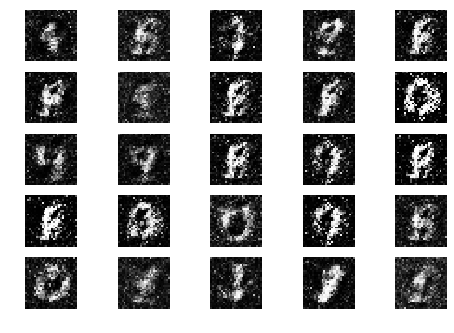

701 [D loss: 0.588588, acc.: 70.70%] [G loss: 0.933094, acc.: 3.12%]
702 [D loss: 0.575577, acc.: 75.78%] [G loss: 0.951660, acc.: 1.56%]
703 [D loss: 0.591640, acc.: 74.61%] [G loss: 0.916511, acc.: 9.38%]
704 [D loss: 0.561489, acc.: 78.52%] [G loss: 0.934662, acc.: 4.69%]
705 [D loss: 0.594935, acc.: 74.22%] [G loss: 0.903664, acc.: 7.03%]
706 [D loss: 0.565470, acc.: 79.69%] [G loss: 0.931873, acc.: 3.12%]
707 [D loss: 0.601822, acc.: 72.27%] [G loss: 0.943026, acc.: 2.34%]
708 [D loss: 0.595366, acc.: 70.70%] [G loss: 0.929120, acc.: 2.34%]
709 [D loss: 0.598770, acc.: 67.58%] [G loss: 0.917081, acc.: 0.78%]
710 [D loss: 0.581533, acc.: 74.22%] [G loss: 0.888838, acc.: 3.91%]
711 [D loss: 0.594731, acc.: 69.92%] [G loss: 0.876854, acc.: 4.69%]
712 [D loss: 0.619258, acc.: 62.11%] [G loss: 0.903216, acc.: 4.69%]
713 [D loss: 0.601767, acc.: 67.19%] [G loss: 0.953872, acc.: 5.47%]
714 [D loss: 0.616667, acc.: 68.75%] [G loss: 0.958384, acc.: 3.12%]
715 [D loss: 0.611108, acc.: 67.19

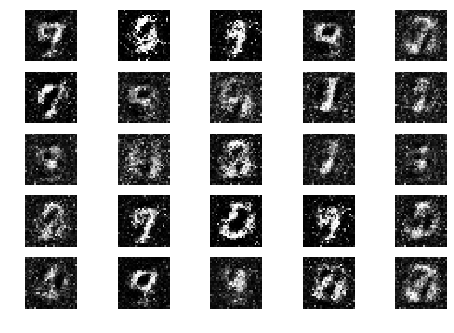

751 [D loss: 0.581619, acc.: 73.05%] [G loss: 0.902361, acc.: 3.91%]
752 [D loss: 0.586386, acc.: 75.00%] [G loss: 0.871339, acc.: 7.81%]
753 [D loss: 0.583141, acc.: 69.92%] [G loss: 0.873332, acc.: 10.16%]
754 [D loss: 0.613430, acc.: 64.45%] [G loss: 0.922342, acc.: 3.91%]
755 [D loss: 0.609648, acc.: 63.28%] [G loss: 0.912424, acc.: 3.12%]
756 [D loss: 0.597418, acc.: 73.44%] [G loss: 0.885600, acc.: 5.47%]
757 [D loss: 0.609056, acc.: 64.84%] [G loss: 0.892835, acc.: 7.03%]
758 [D loss: 0.602719, acc.: 67.58%] [G loss: 0.883504, acc.: 7.03%]
759 [D loss: 0.590148, acc.: 69.53%] [G loss: 0.932824, acc.: 7.03%]
760 [D loss: 0.607497, acc.: 73.05%] [G loss: 0.968260, acc.: 3.91%]
761 [D loss: 0.605525, acc.: 69.53%] [G loss: 0.984420, acc.: 3.12%]
762 [D loss: 0.624368, acc.: 66.02%] [G loss: 0.976471, acc.: 1.56%]
763 [D loss: 0.627900, acc.: 66.41%] [G loss: 0.931463, acc.: 6.25%]
764 [D loss: 0.613180, acc.: 66.80%] [G loss: 0.922143, acc.: 6.25%]
765 [D loss: 0.639403, acc.: 63.2

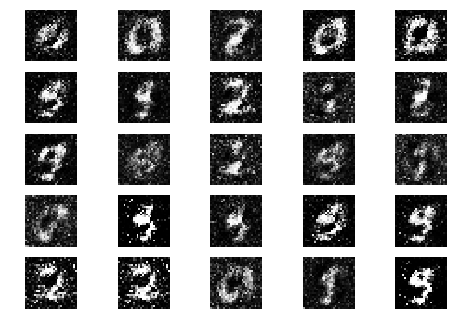

801 [D loss: 0.585651, acc.: 74.61%] [G loss: 0.984977, acc.: 0.78%]
802 [D loss: 0.589427, acc.: 71.48%] [G loss: 0.978816, acc.: 3.12%]
803 [D loss: 0.586872, acc.: 71.88%] [G loss: 0.945928, acc.: 3.91%]
804 [D loss: 0.567198, acc.: 76.95%] [G loss: 0.988502, acc.: 3.91%]
805 [D loss: 0.572282, acc.: 75.39%] [G loss: 0.954350, acc.: 2.34%]
806 [D loss: 0.575082, acc.: 73.05%] [G loss: 0.963128, acc.: 4.69%]
807 [D loss: 0.593285, acc.: 65.62%] [G loss: 0.952146, acc.: 7.81%]
808 [D loss: 0.601500, acc.: 68.36%] [G loss: 0.969268, acc.: 3.91%]
809 [D loss: 0.588279, acc.: 69.14%] [G loss: 0.956937, acc.: 2.34%]
810 [D loss: 0.574605, acc.: 72.27%] [G loss: 0.966035, acc.: 2.34%]
811 [D loss: 0.591507, acc.: 69.53%] [G loss: 0.931557, acc.: 7.81%]
812 [D loss: 0.559894, acc.: 72.66%] [G loss: 0.942485, acc.: 4.69%]
813 [D loss: 0.594008, acc.: 71.48%] [G loss: 0.929958, acc.: 3.91%]
814 [D loss: 0.592447, acc.: 70.31%] [G loss: 0.940296, acc.: 4.69%]
815 [D loss: 0.588148, acc.: 72.66

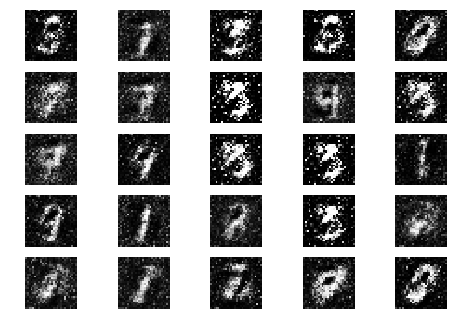

851 [D loss: 0.587637, acc.: 77.34%] [G loss: 0.951177, acc.: 4.69%]
852 [D loss: 0.604079, acc.: 69.53%] [G loss: 0.919270, acc.: 7.81%]
853 [D loss: 0.577070, acc.: 81.64%] [G loss: 0.950647, acc.: 5.47%]
854 [D loss: 0.582402, acc.: 74.61%] [G loss: 0.937852, acc.: 6.25%]
855 [D loss: 0.598292, acc.: 73.44%] [G loss: 0.927009, acc.: 7.81%]
856 [D loss: 0.582811, acc.: 75.78%] [G loss: 0.939413, acc.: 3.12%]
857 [D loss: 0.604545, acc.: 72.66%] [G loss: 0.889271, acc.: 7.03%]
858 [D loss: 0.564678, acc.: 76.56%] [G loss: 0.941434, acc.: 1.56%]
859 [D loss: 0.580954, acc.: 72.66%] [G loss: 0.973347, acc.: 4.69%]
860 [D loss: 0.557425, acc.: 80.47%] [G loss: 0.967957, acc.: 3.91%]
861 [D loss: 0.571747, acc.: 77.73%] [G loss: 0.943508, acc.: 5.47%]
862 [D loss: 0.596473, acc.: 73.83%] [G loss: 0.911357, acc.: 12.50%]
863 [D loss: 0.620097, acc.: 64.84%] [G loss: 0.906286, acc.: 7.03%]
864 [D loss: 0.596289, acc.: 68.75%] [G loss: 0.903442, acc.: 6.25%]
865 [D loss: 0.629969, acc.: 64.4

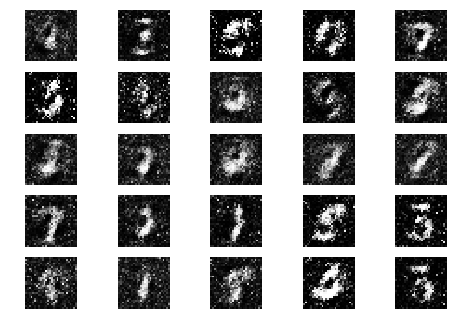

901 [D loss: 0.585757, acc.: 74.22%] [G loss: 0.929525, acc.: 3.12%]
902 [D loss: 0.576870, acc.: 78.52%] [G loss: 0.921623, acc.: 2.34%]
903 [D loss: 0.586085, acc.: 72.66%] [G loss: 0.920214, acc.: 2.34%]
904 [D loss: 0.570114, acc.: 76.56%] [G loss: 0.925078, acc.: 2.34%]
905 [D loss: 0.565466, acc.: 78.52%] [G loss: 0.930155, acc.: 3.91%]
906 [D loss: 0.594953, acc.: 76.17%] [G loss: 0.922122, acc.: 3.91%]
907 [D loss: 0.584561, acc.: 73.44%] [G loss: 0.920507, acc.: 2.34%]
908 [D loss: 0.565959, acc.: 76.56%] [G loss: 0.919491, acc.: 10.94%]
909 [D loss: 0.579827, acc.: 73.83%] [G loss: 0.939970, acc.: 8.59%]
910 [D loss: 0.572718, acc.: 76.95%] [G loss: 0.940539, acc.: 7.03%]
911 [D loss: 0.581888, acc.: 75.78%] [G loss: 0.958637, acc.: 4.69%]
912 [D loss: 0.565152, acc.: 78.52%] [G loss: 0.960100, acc.: 4.69%]
913 [D loss: 0.575120, acc.: 78.12%] [G loss: 0.946267, acc.: 6.25%]
914 [D loss: 0.571731, acc.: 75.00%] [G loss: 0.952640, acc.: 2.34%]
915 [D loss: 0.598492, acc.: 74.2

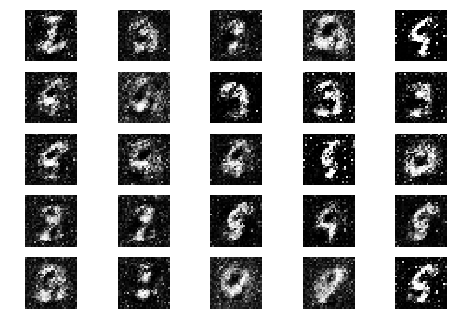

951 [D loss: 0.565514, acc.: 76.17%] [G loss: 0.980506, acc.: 2.34%]
952 [D loss: 0.574815, acc.: 76.95%] [G loss: 0.993592, acc.: 3.91%]
953 [D loss: 0.602551, acc.: 72.66%] [G loss: 0.980498, acc.: 7.03%]
954 [D loss: 0.606001, acc.: 71.09%] [G loss: 1.006798, acc.: 5.47%]
955 [D loss: 0.581203, acc.: 75.78%] [G loss: 1.017817, acc.: 5.47%]
956 [D loss: 0.576276, acc.: 75.78%] [G loss: 1.012069, acc.: 2.34%]
957 [D loss: 0.586947, acc.: 75.39%] [G loss: 0.994021, acc.: 3.91%]
958 [D loss: 0.607215, acc.: 66.41%] [G loss: 0.989932, acc.: 2.34%]
959 [D loss: 0.593793, acc.: 70.70%] [G loss: 1.034402, acc.: 0.00%]
960 [D loss: 0.591798, acc.: 71.09%] [G loss: 1.000139, acc.: 1.56%]
961 [D loss: 0.586908, acc.: 70.70%] [G loss: 0.953188, acc.: 7.81%]
962 [D loss: 0.586257, acc.: 71.48%] [G loss: 0.963496, acc.: 14.06%]
963 [D loss: 0.586099, acc.: 73.83%] [G loss: 0.952093, acc.: 7.81%]
964 [D loss: 0.563342, acc.: 75.78%] [G loss: 0.945612, acc.: 7.03%]
965 [D loss: 0.599247, acc.: 66.8

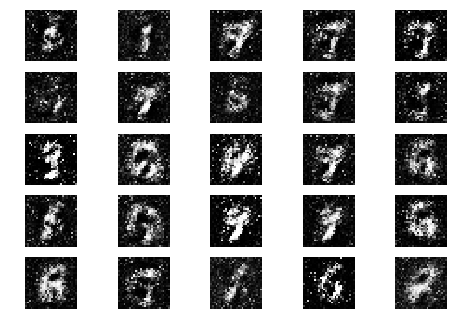

1001 [D loss: 0.543781, acc.: 79.69%] [G loss: 1.061507, acc.: 0.00%]
1002 [D loss: 0.571001, acc.: 76.17%] [G loss: 1.043942, acc.: 0.78%]
1003 [D loss: 0.562862, acc.: 76.17%] [G loss: 1.057345, acc.: 0.78%]
1004 [D loss: 0.556911, acc.: 81.25%] [G loss: 1.052055, acc.: 2.34%]
1005 [D loss: 0.552627, acc.: 76.56%] [G loss: 1.036567, acc.: 0.78%]
1006 [D loss: 0.557733, acc.: 78.12%] [G loss: 1.013332, acc.: 3.12%]
1007 [D loss: 0.544521, acc.: 77.34%] [G loss: 1.009766, acc.: 2.34%]
1008 [D loss: 0.575405, acc.: 72.66%] [G loss: 0.998868, acc.: 3.12%]
1009 [D loss: 0.561721, acc.: 72.66%] [G loss: 0.973082, acc.: 3.12%]
1010 [D loss: 0.539372, acc.: 81.25%] [G loss: 0.964620, acc.: 1.56%]
1011 [D loss: 0.566892, acc.: 75.39%] [G loss: 0.990413, acc.: 2.34%]
1012 [D loss: 0.543938, acc.: 77.34%] [G loss: 0.998270, acc.: 3.91%]
1013 [D loss: 0.573201, acc.: 73.83%] [G loss: 1.025133, acc.: 2.34%]
1014 [D loss: 0.551067, acc.: 80.47%] [G loss: 0.999575, acc.: 3.12%]
1015 [D loss: 0.5323

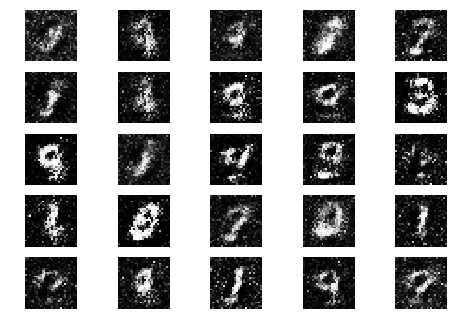

1051 [D loss: 0.553698, acc.: 76.95%] [G loss: 1.020203, acc.: 4.69%]
1052 [D loss: 0.549138, acc.: 78.12%] [G loss: 1.047331, acc.: 2.34%]
1053 [D loss: 0.548342, acc.: 78.12%] [G loss: 1.051826, acc.: 1.56%]
1054 [D loss: 0.532676, acc.: 80.86%] [G loss: 1.070589, acc.: 1.56%]
1055 [D loss: 0.571348, acc.: 74.22%] [G loss: 1.003188, acc.: 4.69%]
1056 [D loss: 0.543204, acc.: 79.30%] [G loss: 1.013279, acc.: 3.91%]
1057 [D loss: 0.529000, acc.: 81.25%] [G loss: 1.057309, acc.: 3.12%]
1058 [D loss: 0.524378, acc.: 82.42%] [G loss: 1.074109, acc.: 2.34%]
1059 [D loss: 0.559322, acc.: 75.00%] [G loss: 1.063286, acc.: 0.78%]
1060 [D loss: 0.559511, acc.: 78.12%] [G loss: 1.024873, acc.: 5.47%]
1061 [D loss: 0.565819, acc.: 76.17%] [G loss: 0.985416, acc.: 7.03%]
1062 [D loss: 0.559225, acc.: 73.44%] [G loss: 1.033493, acc.: 6.25%]
1063 [D loss: 0.541061, acc.: 80.47%] [G loss: 1.020116, acc.: 3.91%]
1064 [D loss: 0.553387, acc.: 74.22%] [G loss: 1.055523, acc.: 2.34%]
1065 [D loss: 0.5751

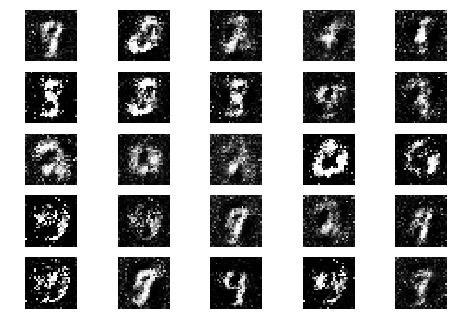

1101 [D loss: 0.558095, acc.: 74.61%] [G loss: 1.030544, acc.: 3.91%]
1102 [D loss: 0.548046, acc.: 75.00%] [G loss: 1.041885, acc.: 7.03%]
1103 [D loss: 0.564325, acc.: 74.22%] [G loss: 1.043298, acc.: 5.47%]
1104 [D loss: 0.571614, acc.: 75.00%] [G loss: 1.097317, acc.: 3.12%]
1105 [D loss: 0.586703, acc.: 73.05%] [G loss: 1.102776, acc.: 2.34%]
1106 [D loss: 0.598120, acc.: 70.31%] [G loss: 1.037440, acc.: 4.69%]
1107 [D loss: 0.603557, acc.: 69.14%] [G loss: 1.032289, acc.: 3.91%]
1108 [D loss: 0.573461, acc.: 69.92%] [G loss: 1.045929, acc.: 1.56%]
1109 [D loss: 0.577766, acc.: 71.48%] [G loss: 1.040613, acc.: 3.91%]
1110 [D loss: 0.594242, acc.: 72.27%] [G loss: 1.049077, acc.: 1.56%]
1111 [D loss: 0.599405, acc.: 70.31%] [G loss: 0.995040, acc.: 9.38%]
1112 [D loss: 0.588099, acc.: 71.88%] [G loss: 0.991347, acc.: 9.38%]
1113 [D loss: 0.559603, acc.: 75.00%] [G loss: 1.008290, acc.: 4.69%]
1114 [D loss: 0.571660, acc.: 73.05%] [G loss: 1.032282, acc.: 4.69%]
1115 [D loss: 0.5771

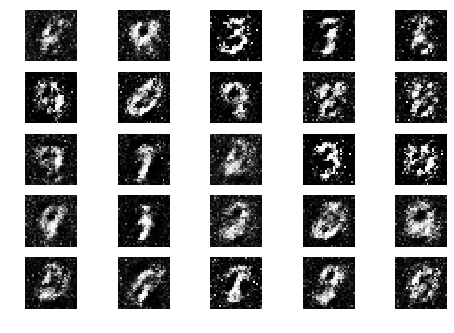

1151 [D loss: 0.591472, acc.: 69.14%] [G loss: 0.972544, acc.: 5.47%]
1152 [D loss: 0.544703, acc.: 78.12%] [G loss: 1.016630, acc.: 5.47%]
1153 [D loss: 0.580296, acc.: 75.78%] [G loss: 0.961598, acc.: 10.94%]
1154 [D loss: 0.560444, acc.: 76.95%] [G loss: 0.957859, acc.: 9.38%]
1155 [D loss: 0.555237, acc.: 76.17%] [G loss: 1.009831, acc.: 7.03%]
1156 [D loss: 0.584174, acc.: 72.27%] [G loss: 1.004753, acc.: 7.81%]
1157 [D loss: 0.601698, acc.: 69.92%] [G loss: 0.945865, acc.: 10.94%]
1158 [D loss: 0.550382, acc.: 78.12%] [G loss: 1.024756, acc.: 4.69%]
1159 [D loss: 0.547418, acc.: 77.73%] [G loss: 1.040560, acc.: 5.47%]
1160 [D loss: 0.570503, acc.: 75.39%] [G loss: 0.994654, acc.: 7.03%]
1161 [D loss: 0.570476, acc.: 77.34%] [G loss: 0.966817, acc.: 9.38%]
1162 [D loss: 0.547323, acc.: 78.91%] [G loss: 0.938607, acc.: 7.03%]
1163 [D loss: 0.563769, acc.: 74.22%] [G loss: 0.970379, acc.: 4.69%]
1164 [D loss: 0.542196, acc.: 76.56%] [G loss: 1.026389, acc.: 7.03%]
1165 [D loss: 0.58

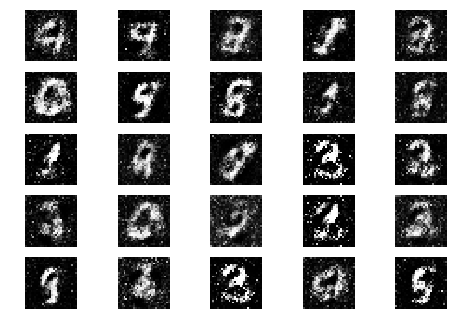

1201 [D loss: 0.585620, acc.: 75.00%] [G loss: 0.964944, acc.: 9.38%]
1202 [D loss: 0.556757, acc.: 78.12%] [G loss: 0.991650, acc.: 9.38%]
1203 [D loss: 0.607279, acc.: 69.92%] [G loss: 0.968980, acc.: 14.06%]
1204 [D loss: 0.559256, acc.: 77.73%] [G loss: 0.971670, acc.: 9.38%]
1205 [D loss: 0.560295, acc.: 73.83%] [G loss: 0.950429, acc.: 11.72%]
1206 [D loss: 0.577659, acc.: 73.44%] [G loss: 0.967965, acc.: 10.16%]
1207 [D loss: 0.570735, acc.: 76.17%] [G loss: 0.925581, acc.: 14.84%]
1208 [D loss: 0.574228, acc.: 76.56%] [G loss: 0.936244, acc.: 14.06%]
1209 [D loss: 0.594976, acc.: 73.05%] [G loss: 0.945905, acc.: 14.84%]
1210 [D loss: 0.583988, acc.: 70.70%] [G loss: 0.898478, acc.: 17.19%]
1211 [D loss: 0.561647, acc.: 76.56%] [G loss: 0.954655, acc.: 11.72%]
1212 [D loss: 0.562669, acc.: 76.17%] [G loss: 0.957689, acc.: 8.59%]
1213 [D loss: 0.585231, acc.: 71.09%] [G loss: 0.992562, acc.: 10.94%]
1214 [D loss: 0.579163, acc.: 75.39%] [G loss: 0.927393, acc.: 18.75%]
1215 [D lo

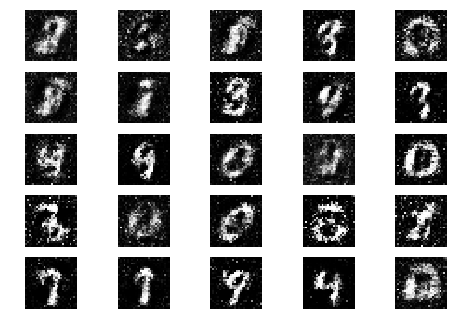

1251 [D loss: 0.575839, acc.: 76.56%] [G loss: 0.928412, acc.: 10.94%]
1252 [D loss: 0.581957, acc.: 75.00%] [G loss: 0.925643, acc.: 12.50%]
1253 [D loss: 0.567191, acc.: 73.05%] [G loss: 0.960791, acc.: 7.03%]
1254 [D loss: 0.571252, acc.: 76.95%] [G loss: 0.925399, acc.: 13.28%]
1255 [D loss: 0.570706, acc.: 75.00%] [G loss: 0.937203, acc.: 15.62%]
1256 [D loss: 0.574227, acc.: 74.61%] [G loss: 0.967811, acc.: 9.38%]
1257 [D loss: 0.568120, acc.: 73.83%] [G loss: 0.937811, acc.: 18.75%]
1258 [D loss: 0.567722, acc.: 75.39%] [G loss: 0.957506, acc.: 15.62%]
1259 [D loss: 0.584416, acc.: 71.09%] [G loss: 0.945257, acc.: 15.62%]
1260 [D loss: 0.569284, acc.: 75.78%] [G loss: 0.964066, acc.: 12.50%]
1261 [D loss: 0.620587, acc.: 64.45%] [G loss: 0.943710, acc.: 13.28%]
1262 [D loss: 0.574624, acc.: 74.22%] [G loss: 0.962129, acc.: 12.50%]
1263 [D loss: 0.593154, acc.: 71.09%] [G loss: 0.966678, acc.: 7.03%]
1264 [D loss: 0.567429, acc.: 70.70%] [G loss: 0.973601, acc.: 10.16%]
1265 [D l

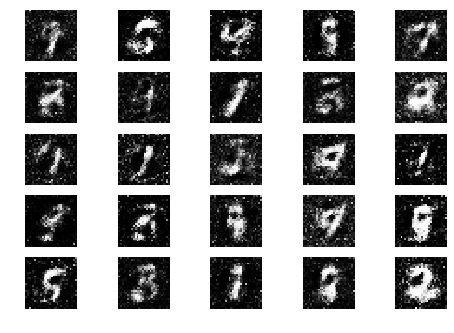

1301 [D loss: 0.622448, acc.: 65.62%] [G loss: 0.939046, acc.: 12.50%]
1302 [D loss: 0.589339, acc.: 72.27%] [G loss: 0.999911, acc.: 11.72%]
1303 [D loss: 0.570270, acc.: 75.00%] [G loss: 0.948854, acc.: 21.09%]
1304 [D loss: 0.578531, acc.: 69.92%] [G loss: 0.954383, acc.: 13.28%]
1305 [D loss: 0.602007, acc.: 70.70%] [G loss: 0.903892, acc.: 23.44%]
1306 [D loss: 0.613752, acc.: 68.75%] [G loss: 0.965818, acc.: 11.72%]
1307 [D loss: 0.583573, acc.: 68.36%] [G loss: 1.008477, acc.: 4.69%]
1308 [D loss: 0.586797, acc.: 70.70%] [G loss: 0.970212, acc.: 10.94%]
1309 [D loss: 0.568827, acc.: 74.61%] [G loss: 0.955658, acc.: 12.50%]
1310 [D loss: 0.582144, acc.: 72.66%] [G loss: 0.979670, acc.: 9.38%]
1311 [D loss: 0.579429, acc.: 75.78%] [G loss: 0.980322, acc.: 7.81%]
1312 [D loss: 0.555861, acc.: 76.95%] [G loss: 1.014334, acc.: 7.81%]
1313 [D loss: 0.603222, acc.: 68.36%] [G loss: 1.004461, acc.: 7.81%]
1314 [D loss: 0.567169, acc.: 74.22%] [G loss: 1.008163, acc.: 7.03%]
1315 [D loss

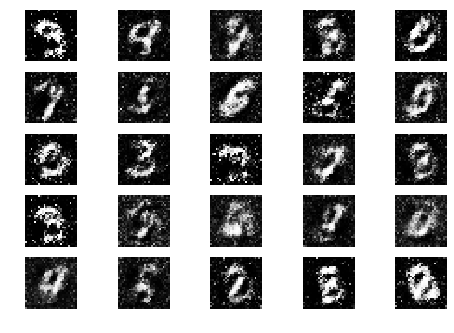

1351 [D loss: 0.586193, acc.: 73.83%] [G loss: 0.986002, acc.: 9.38%]
1352 [D loss: 0.643089, acc.: 63.67%] [G loss: 0.920704, acc.: 14.84%]
1353 [D loss: 0.580795, acc.: 73.44%] [G loss: 0.976821, acc.: 8.59%]
1354 [D loss: 0.592019, acc.: 74.22%] [G loss: 0.944212, acc.: 12.50%]
1355 [D loss: 0.610864, acc.: 66.02%] [G loss: 0.913717, acc.: 14.84%]
1356 [D loss: 0.605792, acc.: 69.92%] [G loss: 0.925206, acc.: 17.19%]
1357 [D loss: 0.564445, acc.: 73.44%] [G loss: 0.962495, acc.: 9.38%]
1358 [D loss: 0.569231, acc.: 74.61%] [G loss: 0.977458, acc.: 10.94%]
1359 [D loss: 0.592935, acc.: 71.48%] [G loss: 0.988634, acc.: 13.28%]
1360 [D loss: 0.586570, acc.: 71.88%] [G loss: 0.990419, acc.: 8.59%]
1361 [D loss: 0.578907, acc.: 73.83%] [G loss: 1.014429, acc.: 6.25%]
1362 [D loss: 0.559749, acc.: 78.52%] [G loss: 0.981489, acc.: 4.69%]
1363 [D loss: 0.573755, acc.: 79.30%] [G loss: 0.947983, acc.: 9.38%]
1364 [D loss: 0.595786, acc.: 71.48%] [G loss: 0.959949, acc.: 10.94%]
1365 [D loss:

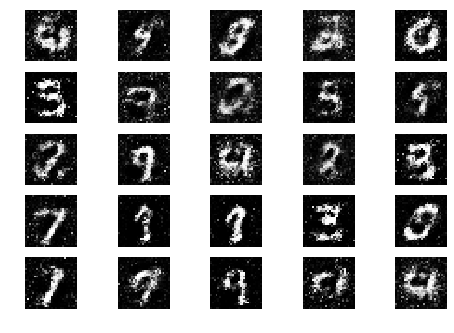

1401 [D loss: 0.632488, acc.: 67.58%] [G loss: 0.935445, acc.: 12.50%]
1402 [D loss: 0.601380, acc.: 69.14%] [G loss: 0.903459, acc.: 13.28%]
1403 [D loss: 0.578579, acc.: 72.66%] [G loss: 0.898380, acc.: 18.75%]
1404 [D loss: 0.591238, acc.: 70.31%] [G loss: 0.926072, acc.: 13.28%]
1405 [D loss: 0.561107, acc.: 75.00%] [G loss: 0.976039, acc.: 16.41%]
1406 [D loss: 0.642515, acc.: 61.33%] [G loss: 0.922239, acc.: 15.62%]
1407 [D loss: 0.656577, acc.: 61.33%] [G loss: 0.945055, acc.: 17.19%]
1408 [D loss: 0.637056, acc.: 65.23%] [G loss: 0.936469, acc.: 12.50%]
1409 [D loss: 0.567993, acc.: 72.66%] [G loss: 0.913181, acc.: 19.53%]
1410 [D loss: 0.576900, acc.: 74.61%] [G loss: 0.976047, acc.: 15.62%]
1411 [D loss: 0.588541, acc.: 70.70%] [G loss: 0.941158, acc.: 19.53%]
1412 [D loss: 0.607723, acc.: 67.19%] [G loss: 0.939137, acc.: 22.66%]
1413 [D loss: 0.608914, acc.: 68.36%] [G loss: 0.919111, acc.: 22.66%]
1414 [D loss: 0.591042, acc.: 73.44%] [G loss: 0.938588, acc.: 14.84%]
1415 [

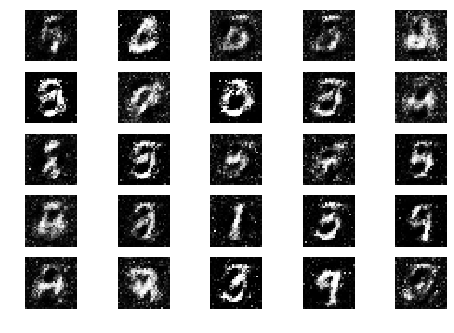

1451 [D loss: 0.611296, acc.: 67.58%] [G loss: 0.919456, acc.: 10.16%]
1452 [D loss: 0.612518, acc.: 64.06%] [G loss: 0.907076, acc.: 14.06%]
1453 [D loss: 0.604249, acc.: 71.48%] [G loss: 0.916014, acc.: 14.84%]
1454 [D loss: 0.608837, acc.: 66.80%] [G loss: 0.937842, acc.: 9.38%]
1455 [D loss: 0.601213, acc.: 69.53%] [G loss: 0.882263, acc.: 13.28%]
1456 [D loss: 0.589392, acc.: 68.36%] [G loss: 0.900949, acc.: 13.28%]
1457 [D loss: 0.588797, acc.: 71.09%] [G loss: 0.938649, acc.: 12.50%]
1458 [D loss: 0.594753, acc.: 70.70%] [G loss: 0.939761, acc.: 8.59%]
1459 [D loss: 0.606188, acc.: 68.75%] [G loss: 0.935402, acc.: 11.72%]
1460 [D loss: 0.599988, acc.: 70.31%] [G loss: 0.936642, acc.: 8.59%]
1461 [D loss: 0.602765, acc.: 73.83%] [G loss: 0.899954, acc.: 17.19%]
1462 [D loss: 0.603244, acc.: 69.53%] [G loss: 0.907013, acc.: 14.06%]
1463 [D loss: 0.610852, acc.: 69.14%] [G loss: 0.907544, acc.: 12.50%]
1464 [D loss: 0.597094, acc.: 72.27%] [G loss: 0.889269, acc.: 13.28%]
1465 [D l

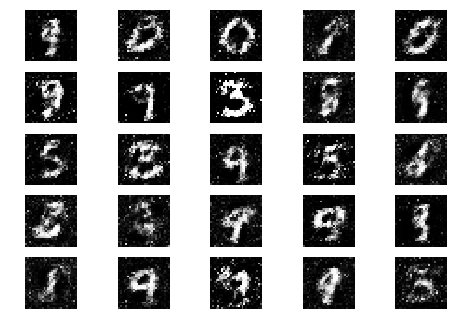

1501 [D loss: 0.599549, acc.: 67.58%] [G loss: 0.897973, acc.: 17.97%]
1502 [D loss: 0.583211, acc.: 73.44%] [G loss: 0.923086, acc.: 14.84%]
1503 [D loss: 0.604289, acc.: 68.75%] [G loss: 0.919811, acc.: 13.28%]
1504 [D loss: 0.593166, acc.: 71.48%] [G loss: 0.903287, acc.: 19.53%]
1505 [D loss: 0.592638, acc.: 71.09%] [G loss: 0.928003, acc.: 17.19%]
1506 [D loss: 0.595201, acc.: 69.14%] [G loss: 0.941630, acc.: 14.84%]
1507 [D loss: 0.617103, acc.: 69.14%] [G loss: 0.941403, acc.: 12.50%]
1508 [D loss: 0.595820, acc.: 69.53%] [G loss: 0.903486, acc.: 14.06%]
1509 [D loss: 0.592108, acc.: 73.05%] [G loss: 0.924927, acc.: 10.16%]
1510 [D loss: 0.636781, acc.: 66.02%] [G loss: 0.936725, acc.: 12.50%]
1511 [D loss: 0.624425, acc.: 67.58%] [G loss: 0.880186, acc.: 20.31%]
1512 [D loss: 0.573471, acc.: 74.61%] [G loss: 0.915781, acc.: 17.19%]
1513 [D loss: 0.577171, acc.: 74.22%] [G loss: 0.899070, acc.: 20.31%]
1514 [D loss: 0.620825, acc.: 65.62%] [G loss: 0.895550, acc.: 14.06%]
1515 [

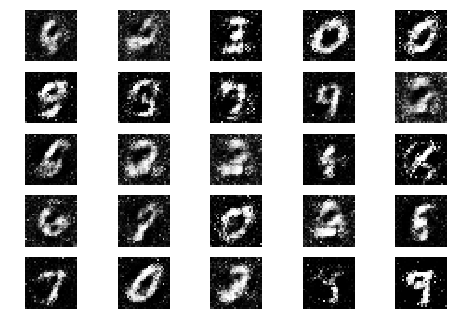

1551 [D loss: 0.606483, acc.: 68.75%] [G loss: 0.906156, acc.: 16.41%]
1552 [D loss: 0.581281, acc.: 75.39%] [G loss: 0.890948, acc.: 17.97%]
1553 [D loss: 0.626873, acc.: 67.19%] [G loss: 0.892712, acc.: 21.09%]
1554 [D loss: 0.612662, acc.: 67.97%] [G loss: 0.910414, acc.: 14.84%]
1555 [D loss: 0.576019, acc.: 76.56%] [G loss: 0.908609, acc.: 17.19%]
1556 [D loss: 0.601187, acc.: 68.36%] [G loss: 0.901946, acc.: 15.62%]
1557 [D loss: 0.598472, acc.: 72.27%] [G loss: 0.933802, acc.: 10.16%]
1558 [D loss: 0.622833, acc.: 65.62%] [G loss: 0.927151, acc.: 17.97%]
1559 [D loss: 0.626326, acc.: 67.97%] [G loss: 0.903329, acc.: 11.72%]
1560 [D loss: 0.612367, acc.: 66.41%] [G loss: 0.876224, acc.: 17.97%]
1561 [D loss: 0.584551, acc.: 72.27%] [G loss: 0.861430, acc.: 22.66%]
1562 [D loss: 0.597251, acc.: 73.44%] [G loss: 0.905035, acc.: 17.19%]
1563 [D loss: 0.596537, acc.: 73.05%] [G loss: 0.889958, acc.: 14.84%]
1564 [D loss: 0.574921, acc.: 75.78%] [G loss: 0.912933, acc.: 10.16%]
1565 [

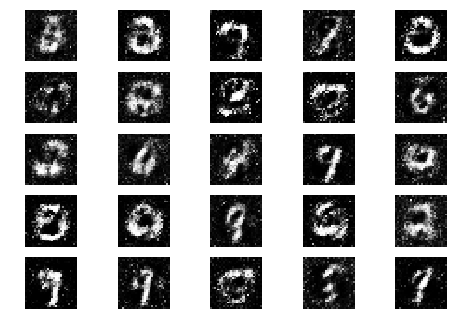

1601 [D loss: 0.626473, acc.: 66.02%] [G loss: 0.875246, acc.: 16.41%]
1602 [D loss: 0.604882, acc.: 67.97%] [G loss: 0.924034, acc.: 15.62%]
1603 [D loss: 0.627104, acc.: 67.97%] [G loss: 0.886066, acc.: 11.72%]
1604 [D loss: 0.594910, acc.: 72.27%] [G loss: 0.924365, acc.: 15.62%]
1605 [D loss: 0.613913, acc.: 68.36%] [G loss: 0.900671, acc.: 11.72%]
1606 [D loss: 0.599202, acc.: 76.56%] [G loss: 0.884974, acc.: 18.75%]
1607 [D loss: 0.602553, acc.: 71.09%] [G loss: 0.860685, acc.: 22.66%]
1608 [D loss: 0.607042, acc.: 66.80%] [G loss: 0.869278, acc.: 21.09%]
1609 [D loss: 0.615938, acc.: 66.41%] [G loss: 0.857456, acc.: 28.12%]
1610 [D loss: 0.603572, acc.: 71.09%] [G loss: 0.878974, acc.: 21.09%]
1611 [D loss: 0.599584, acc.: 70.31%] [G loss: 0.907519, acc.: 16.41%]
1612 [D loss: 0.606853, acc.: 70.31%] [G loss: 0.932939, acc.: 14.06%]
1613 [D loss: 0.636633, acc.: 60.94%] [G loss: 0.918482, acc.: 17.19%]
1614 [D loss: 0.601821, acc.: 72.27%] [G loss: 0.919176, acc.: 14.84%]
1615 [

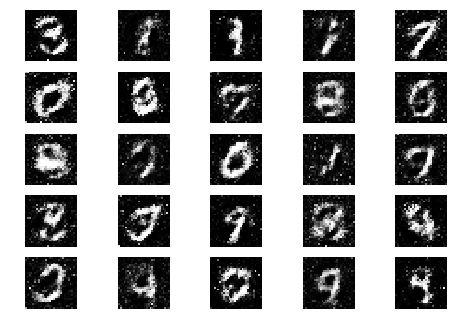

1651 [D loss: 0.606730, acc.: 73.83%] [G loss: 0.885983, acc.: 21.09%]
1652 [D loss: 0.611255, acc.: 69.92%] [G loss: 0.930990, acc.: 11.72%]
1653 [D loss: 0.605617, acc.: 70.70%] [G loss: 0.923288, acc.: 13.28%]
1654 [D loss: 0.582808, acc.: 73.83%] [G loss: 0.899022, acc.: 16.41%]
1655 [D loss: 0.584218, acc.: 72.27%] [G loss: 0.899694, acc.: 11.72%]
1656 [D loss: 0.605503, acc.: 71.09%] [G loss: 0.884546, acc.: 14.84%]
1657 [D loss: 0.604418, acc.: 69.53%] [G loss: 0.932141, acc.: 12.50%]
1658 [D loss: 0.629321, acc.: 67.19%] [G loss: 0.922597, acc.: 14.06%]
1659 [D loss: 0.598320, acc.: 71.09%] [G loss: 0.869651, acc.: 20.31%]
1660 [D loss: 0.593607, acc.: 74.22%] [G loss: 0.872636, acc.: 22.66%]
1661 [D loss: 0.588261, acc.: 72.27%] [G loss: 0.903049, acc.: 17.97%]
1662 [D loss: 0.597754, acc.: 69.92%] [G loss: 0.917966, acc.: 16.41%]
1663 [D loss: 0.596290, acc.: 70.31%] [G loss: 0.920040, acc.: 12.50%]
1664 [D loss: 0.588954, acc.: 74.22%] [G loss: 0.889904, acc.: 21.09%]
1665 [

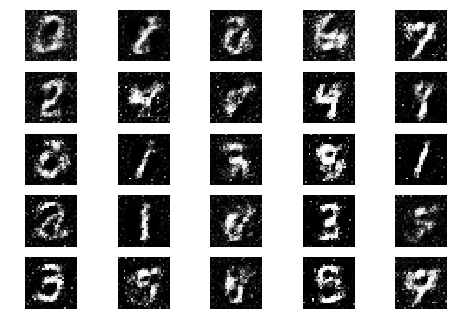

1701 [D loss: 0.594176, acc.: 71.48%] [G loss: 0.874108, acc.: 20.31%]
1702 [D loss: 0.610094, acc.: 67.97%] [G loss: 0.883186, acc.: 19.53%]
1703 [D loss: 0.616959, acc.: 68.36%] [G loss: 0.916164, acc.: 12.50%]
1704 [D loss: 0.595052, acc.: 71.88%] [G loss: 0.913651, acc.: 15.62%]
1705 [D loss: 0.594820, acc.: 72.66%] [G loss: 0.855331, acc.: 31.25%]
1706 [D loss: 0.612459, acc.: 69.53%] [G loss: 0.919500, acc.: 17.97%]
1707 [D loss: 0.624890, acc.: 66.41%] [G loss: 0.930095, acc.: 15.62%]
1708 [D loss: 0.617952, acc.: 67.58%] [G loss: 0.929246, acc.: 15.62%]
1709 [D loss: 0.593685, acc.: 73.05%] [G loss: 0.896467, acc.: 19.53%]
1710 [D loss: 0.632965, acc.: 65.23%] [G loss: 0.904914, acc.: 17.97%]
1711 [D loss: 0.628346, acc.: 65.62%] [G loss: 0.904272, acc.: 16.41%]
1712 [D loss: 0.634315, acc.: 66.41%] [G loss: 0.883626, acc.: 19.53%]
1713 [D loss: 0.614895, acc.: 65.62%] [G loss: 0.889509, acc.: 14.84%]
1714 [D loss: 0.628170, acc.: 68.36%] [G loss: 0.872337, acc.: 20.31%]
1715 [

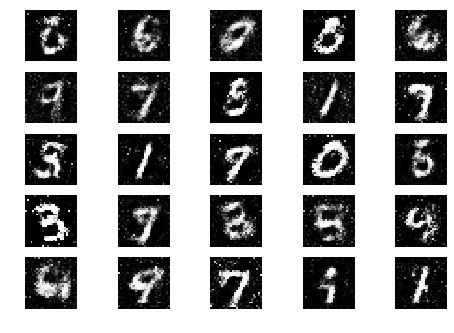

1751 [D loss: 0.609992, acc.: 66.80%] [G loss: 0.924957, acc.: 21.09%]
1752 [D loss: 0.612477, acc.: 69.14%] [G loss: 0.904158, acc.: 16.41%]
1753 [D loss: 0.599199, acc.: 70.31%] [G loss: 0.901535, acc.: 19.53%]
1754 [D loss: 0.643678, acc.: 62.50%] [G loss: 0.927352, acc.: 13.28%]
1755 [D loss: 0.587314, acc.: 74.22%] [G loss: 0.876711, acc.: 17.97%]
1756 [D loss: 0.598846, acc.: 74.22%] [G loss: 0.902255, acc.: 16.41%]
1757 [D loss: 0.614923, acc.: 71.09%] [G loss: 0.917298, acc.: 17.19%]
1758 [D loss: 0.592145, acc.: 74.22%] [G loss: 0.904228, acc.: 20.31%]
1759 [D loss: 0.610967, acc.: 69.14%] [G loss: 0.913382, acc.: 21.88%]
1760 [D loss: 0.636400, acc.: 66.80%] [G loss: 0.919792, acc.: 15.62%]
1761 [D loss: 0.626850, acc.: 67.19%] [G loss: 0.901992, acc.: 15.62%]
1762 [D loss: 0.602231, acc.: 73.05%] [G loss: 0.897835, acc.: 16.41%]
1763 [D loss: 0.623601, acc.: 72.66%] [G loss: 0.908006, acc.: 14.06%]
1764 [D loss: 0.581833, acc.: 73.83%] [G loss: 0.890697, acc.: 22.66%]
1765 [

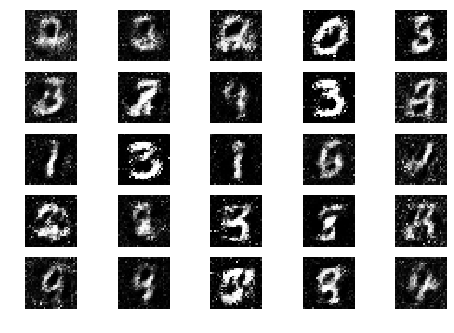

1801 [D loss: 0.591445, acc.: 71.09%] [G loss: 0.915785, acc.: 17.97%]
1802 [D loss: 0.609871, acc.: 69.92%] [G loss: 0.923066, acc.: 14.84%]
1803 [D loss: 0.596371, acc.: 73.83%] [G loss: 0.869368, acc.: 20.31%]
1804 [D loss: 0.574821, acc.: 74.61%] [G loss: 0.892253, acc.: 24.22%]
1805 [D loss: 0.599682, acc.: 68.36%] [G loss: 0.880961, acc.: 24.22%]
1806 [D loss: 0.597068, acc.: 71.48%] [G loss: 0.929874, acc.: 16.41%]
1807 [D loss: 0.600543, acc.: 69.53%] [G loss: 0.894826, acc.: 18.75%]
1808 [D loss: 0.581535, acc.: 74.61%] [G loss: 0.949578, acc.: 13.28%]
1809 [D loss: 0.581221, acc.: 72.27%] [G loss: 0.898394, acc.: 19.53%]
1810 [D loss: 0.644144, acc.: 64.45%] [G loss: 0.913484, acc.: 15.62%]
1811 [D loss: 0.617699, acc.: 69.53%] [G loss: 0.887825, acc.: 13.28%]
1812 [D loss: 0.601774, acc.: 71.48%] [G loss: 0.887905, acc.: 17.97%]
1813 [D loss: 0.623913, acc.: 66.41%] [G loss: 0.892850, acc.: 21.09%]
1814 [D loss: 0.610135, acc.: 67.97%] [G loss: 0.905621, acc.: 12.50%]
1815 [

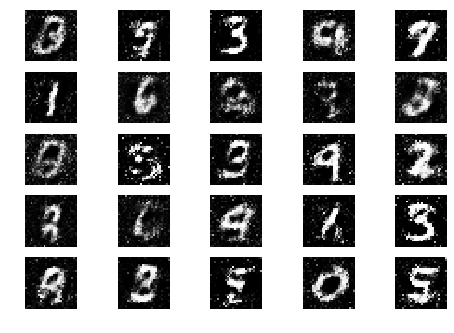

1851 [D loss: 0.585523, acc.: 73.05%] [G loss: 0.914755, acc.: 15.62%]
1852 [D loss: 0.592854, acc.: 72.27%] [G loss: 0.893654, acc.: 17.97%]
1853 [D loss: 0.587995, acc.: 76.17%] [G loss: 0.900310, acc.: 20.31%]
1854 [D loss: 0.608306, acc.: 72.66%] [G loss: 0.929764, acc.: 13.28%]
1855 [D loss: 0.586720, acc.: 74.22%] [G loss: 0.885095, acc.: 22.66%]
1856 [D loss: 0.627062, acc.: 68.75%] [G loss: 0.908751, acc.: 15.62%]
1857 [D loss: 0.598214, acc.: 73.83%] [G loss: 0.889667, acc.: 17.97%]
1858 [D loss: 0.595843, acc.: 73.83%] [G loss: 0.945617, acc.: 16.41%]
1859 [D loss: 0.578242, acc.: 76.56%] [G loss: 0.908997, acc.: 16.41%]
1860 [D loss: 0.617372, acc.: 66.02%] [G loss: 0.912802, acc.: 13.28%]
1861 [D loss: 0.605141, acc.: 72.66%] [G loss: 0.906098, acc.: 19.53%]
1862 [D loss: 0.610209, acc.: 72.66%] [G loss: 0.914070, acc.: 17.97%]
1863 [D loss: 0.602841, acc.: 72.27%] [G loss: 0.903727, acc.: 16.41%]
1864 [D loss: 0.610762, acc.: 66.02%] [G loss: 0.905105, acc.: 14.84%]
1865 [

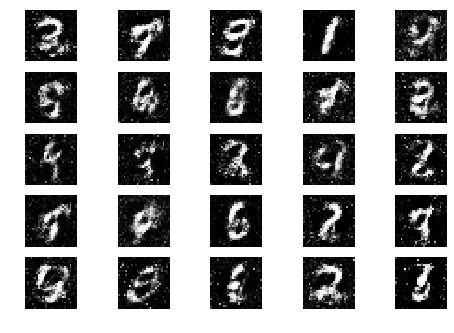

1901 [D loss: 0.600215, acc.: 71.48%] [G loss: 0.922350, acc.: 15.62%]
1902 [D loss: 0.613043, acc.: 67.19%] [G loss: 0.928354, acc.: 13.28%]
1903 [D loss: 0.581111, acc.: 76.56%] [G loss: 0.928026, acc.: 12.50%]
1904 [D loss: 0.580019, acc.: 73.83%] [G loss: 0.875368, acc.: 18.75%]
1905 [D loss: 0.573323, acc.: 75.00%] [G loss: 0.936901, acc.: 13.28%]
1906 [D loss: 0.592682, acc.: 72.66%] [G loss: 0.924522, acc.: 20.31%]
1907 [D loss: 0.593584, acc.: 70.70%] [G loss: 0.915977, acc.: 15.62%]
1908 [D loss: 0.605395, acc.: 72.27%] [G loss: 0.905934, acc.: 16.41%]
1909 [D loss: 0.583854, acc.: 73.05%] [G loss: 0.915855, acc.: 20.31%]
1910 [D loss: 0.606188, acc.: 67.97%] [G loss: 0.923478, acc.: 14.84%]
1911 [D loss: 0.600191, acc.: 70.31%] [G loss: 0.901071, acc.: 16.41%]
1912 [D loss: 0.593545, acc.: 71.09%] [G loss: 0.891555, acc.: 16.41%]
1913 [D loss: 0.576805, acc.: 71.48%] [G loss: 0.898420, acc.: 23.44%]
1914 [D loss: 0.620380, acc.: 67.19%] [G loss: 0.895568, acc.: 23.44%]
1915 [

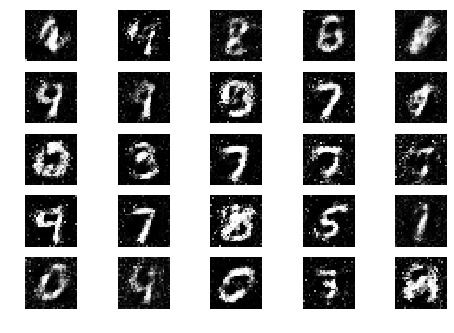

1951 [D loss: 0.632170, acc.: 68.36%] [G loss: 0.891103, acc.: 17.19%]
1952 [D loss: 0.611772, acc.: 67.58%] [G loss: 0.922780, acc.: 17.97%]
1953 [D loss: 0.598252, acc.: 71.09%] [G loss: 0.884396, acc.: 21.88%]
1954 [D loss: 0.612798, acc.: 68.36%] [G loss: 0.923377, acc.: 20.31%]
1955 [D loss: 0.609247, acc.: 68.36%] [G loss: 0.889608, acc.: 21.88%]
1956 [D loss: 0.616680, acc.: 67.97%] [G loss: 0.936186, acc.: 15.62%]
1957 [D loss: 0.636944, acc.: 64.06%] [G loss: 0.958348, acc.: 13.28%]
1958 [D loss: 0.606539, acc.: 69.53%] [G loss: 0.884322, acc.: 22.66%]
1959 [D loss: 0.611466, acc.: 68.75%] [G loss: 0.876580, acc.: 26.56%]
1960 [D loss: 0.610088, acc.: 70.70%] [G loss: 0.891999, acc.: 19.53%]
1961 [D loss: 0.609175, acc.: 69.53%] [G loss: 0.894624, acc.: 19.53%]
1962 [D loss: 0.628761, acc.: 66.41%] [G loss: 0.900403, acc.: 17.19%]
1963 [D loss: 0.586697, acc.: 76.95%] [G loss: 0.901621, acc.: 19.53%]
1964 [D loss: 0.610953, acc.: 68.36%] [G loss: 0.902166, acc.: 17.97%]
1965 [

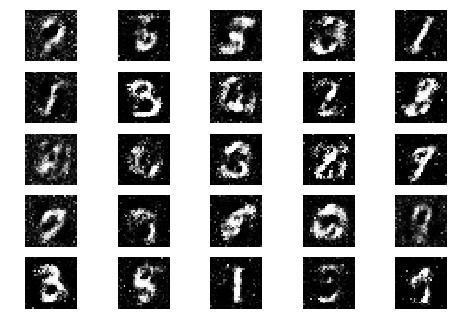

2001 [D loss: 0.601272, acc.: 72.27%] [G loss: 0.885708, acc.: 18.75%]
2002 [D loss: 0.624288, acc.: 66.80%] [G loss: 0.879103, acc.: 24.22%]
2003 [D loss: 0.618716, acc.: 67.58%] [G loss: 0.904000, acc.: 21.88%]
2004 [D loss: 0.595643, acc.: 72.66%] [G loss: 0.876749, acc.: 14.84%]
2005 [D loss: 0.608250, acc.: 69.14%] [G loss: 0.886776, acc.: 15.62%]
2006 [D loss: 0.597475, acc.: 74.22%] [G loss: 0.900483, acc.: 16.41%]
2007 [D loss: 0.586907, acc.: 72.27%] [G loss: 0.913688, acc.: 17.19%]
2008 [D loss: 0.592833, acc.: 70.70%] [G loss: 0.898128, acc.: 20.31%]
2009 [D loss: 0.596677, acc.: 72.66%] [G loss: 0.889780, acc.: 18.75%]
2010 [D loss: 0.600036, acc.: 70.31%] [G loss: 0.911594, acc.: 16.41%]
2011 [D loss: 0.580322, acc.: 73.44%] [G loss: 0.885038, acc.: 19.53%]
2012 [D loss: 0.619503, acc.: 66.80%] [G loss: 0.903220, acc.: 21.09%]
2013 [D loss: 0.615414, acc.: 70.31%] [G loss: 0.887751, acc.: 18.75%]
2014 [D loss: 0.594145, acc.: 75.00%] [G loss: 0.881265, acc.: 19.53%]
2015 [

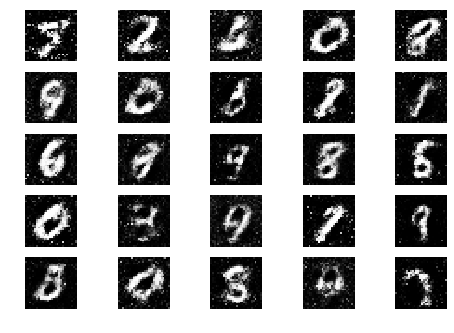

2051 [D loss: 0.620094, acc.: 66.41%] [G loss: 0.873067, acc.: 23.44%]
2052 [D loss: 0.629454, acc.: 65.23%] [G loss: 0.851521, acc.: 23.44%]
2053 [D loss: 0.611046, acc.: 71.09%] [G loss: 0.875721, acc.: 17.19%]
2054 [D loss: 0.604205, acc.: 71.88%] [G loss: 0.903802, acc.: 15.62%]
2055 [D loss: 0.593436, acc.: 74.22%] [G loss: 0.867216, acc.: 22.66%]
2056 [D loss: 0.577650, acc.: 75.78%] [G loss: 0.900644, acc.: 20.31%]
2057 [D loss: 0.598478, acc.: 70.70%] [G loss: 0.879934, acc.: 20.31%]
2058 [D loss: 0.607768, acc.: 68.36%] [G loss: 0.899993, acc.: 24.22%]
2059 [D loss: 0.585686, acc.: 76.17%] [G loss: 0.877706, acc.: 18.75%]
2060 [D loss: 0.588468, acc.: 72.66%] [G loss: 0.900636, acc.: 17.97%]
2061 [D loss: 0.624921, acc.: 68.36%] [G loss: 0.902140, acc.: 19.53%]
2062 [D loss: 0.590446, acc.: 74.22%] [G loss: 0.917116, acc.: 17.19%]
2063 [D loss: 0.608914, acc.: 69.14%] [G loss: 0.898791, acc.: 18.75%]
2064 [D loss: 0.628393, acc.: 67.19%] [G loss: 0.856973, acc.: 24.22%]
2065 [

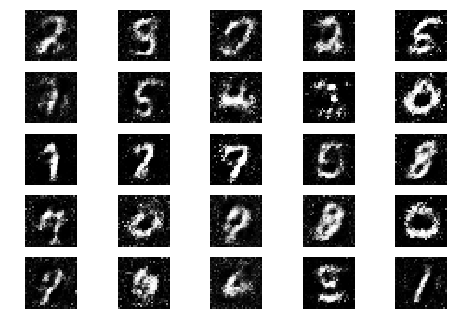

2101 [D loss: 0.594573, acc.: 71.88%] [G loss: 0.883549, acc.: 18.75%]
2102 [D loss: 0.634263, acc.: 64.45%] [G loss: 0.864770, acc.: 23.44%]
2103 [D loss: 0.599269, acc.: 74.61%] [G loss: 0.864333, acc.: 25.78%]
2104 [D loss: 0.609717, acc.: 70.31%] [G loss: 0.861707, acc.: 22.66%]
2105 [D loss: 0.616302, acc.: 65.62%] [G loss: 0.878137, acc.: 21.88%]
2106 [D loss: 0.614521, acc.: 66.80%] [G loss: 0.872589, acc.: 20.31%]
2107 [D loss: 0.629760, acc.: 68.36%] [G loss: 0.877354, acc.: 17.97%]
2108 [D loss: 0.600042, acc.: 71.48%] [G loss: 0.868998, acc.: 25.78%]
2109 [D loss: 0.617990, acc.: 68.75%] [G loss: 0.912839, acc.: 13.28%]
2110 [D loss: 0.614859, acc.: 70.31%] [G loss: 0.866409, acc.: 23.44%]
2111 [D loss: 0.602282, acc.: 70.31%] [G loss: 0.900146, acc.: 16.41%]
2112 [D loss: 0.611021, acc.: 67.97%] [G loss: 0.855572, acc.: 29.69%]
2113 [D loss: 0.589975, acc.: 73.83%] [G loss: 0.893001, acc.: 22.66%]
2114 [D loss: 0.609853, acc.: 67.19%] [G loss: 0.870346, acc.: 28.91%]
2115 [

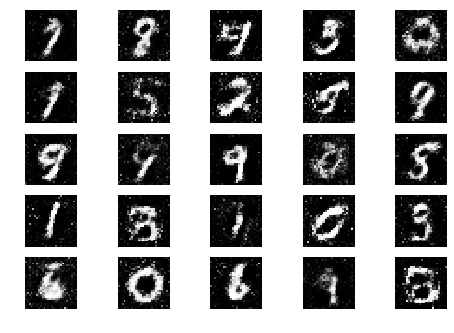

2151 [D loss: 0.602396, acc.: 69.53%] [G loss: 0.929902, acc.: 14.06%]
2152 [D loss: 0.622946, acc.: 68.36%] [G loss: 0.904679, acc.: 20.31%]
2153 [D loss: 0.614633, acc.: 70.70%] [G loss: 0.869697, acc.: 20.31%]
2154 [D loss: 0.635306, acc.: 64.84%] [G loss: 0.887060, acc.: 23.44%]
2155 [D loss: 0.580647, acc.: 70.70%] [G loss: 0.899413, acc.: 16.41%]
2156 [D loss: 0.622243, acc.: 67.58%] [G loss: 0.938464, acc.: 16.41%]
2157 [D loss: 0.611156, acc.: 75.39%] [G loss: 0.910279, acc.: 13.28%]
2158 [D loss: 0.605827, acc.: 70.70%] [G loss: 0.913223, acc.: 15.62%]
2159 [D loss: 0.597741, acc.: 69.53%] [G loss: 0.903700, acc.: 21.88%]
2160 [D loss: 0.598696, acc.: 73.44%] [G loss: 0.927919, acc.: 18.75%]
2161 [D loss: 0.587820, acc.: 70.31%] [G loss: 0.945696, acc.: 11.72%]
2162 [D loss: 0.623120, acc.: 65.62%] [G loss: 0.897444, acc.: 20.31%]
2163 [D loss: 0.628270, acc.: 64.84%] [G loss: 0.906421, acc.: 18.75%]
2164 [D loss: 0.621177, acc.: 66.02%] [G loss: 0.848001, acc.: 28.91%]
2165 [

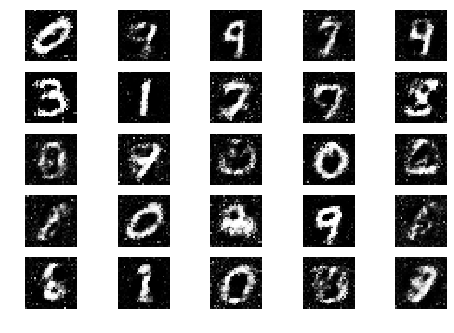

2201 [D loss: 0.626394, acc.: 69.14%] [G loss: 0.883931, acc.: 20.31%]
2202 [D loss: 0.628489, acc.: 66.02%] [G loss: 0.885446, acc.: 20.31%]
2203 [D loss: 0.621225, acc.: 66.02%] [G loss: 0.904673, acc.: 14.84%]
2204 [D loss: 0.600075, acc.: 73.05%] [G loss: 0.885340, acc.: 17.19%]
2205 [D loss: 0.604042, acc.: 71.48%] [G loss: 0.887372, acc.: 17.97%]
2206 [D loss: 0.624735, acc.: 70.31%] [G loss: 0.866628, acc.: 24.22%]
2207 [D loss: 0.615476, acc.: 68.75%] [G loss: 0.877240, acc.: 25.00%]
2208 [D loss: 0.606125, acc.: 69.53%] [G loss: 0.893670, acc.: 17.97%]
2209 [D loss: 0.604309, acc.: 68.75%] [G loss: 0.875981, acc.: 20.31%]
2210 [D loss: 0.626258, acc.: 67.97%] [G loss: 0.831469, acc.: 27.34%]
2211 [D loss: 0.619460, acc.: 67.58%] [G loss: 0.888706, acc.: 17.19%]
2212 [D loss: 0.625634, acc.: 69.53%] [G loss: 0.876848, acc.: 25.00%]
2213 [D loss: 0.612713, acc.: 66.02%] [G loss: 0.913137, acc.: 21.09%]
2214 [D loss: 0.613949, acc.: 69.53%] [G loss: 0.897157, acc.: 19.53%]
2215 [

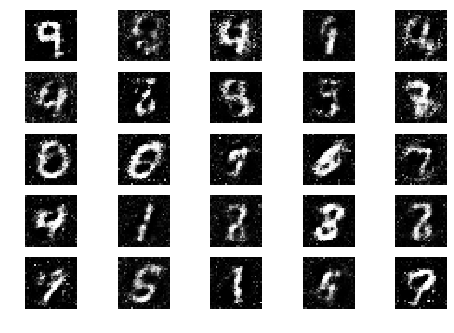

2251 [D loss: 0.584941, acc.: 75.39%] [G loss: 0.917146, acc.: 16.41%]
2252 [D loss: 0.594505, acc.: 68.36%] [G loss: 0.892445, acc.: 25.78%]
2253 [D loss: 0.610750, acc.: 69.53%] [G loss: 0.905401, acc.: 19.53%]
2254 [D loss: 0.607792, acc.: 70.31%] [G loss: 0.927104, acc.: 17.19%]
2255 [D loss: 0.612704, acc.: 68.36%] [G loss: 0.891871, acc.: 27.34%]
2256 [D loss: 0.640349, acc.: 64.84%] [G loss: 0.899451, acc.: 19.53%]
2257 [D loss: 0.615508, acc.: 66.02%] [G loss: 0.862181, acc.: 25.78%]
2258 [D loss: 0.606350, acc.: 71.48%] [G loss: 0.903101, acc.: 14.06%]
2259 [D loss: 0.618472, acc.: 67.97%] [G loss: 0.898697, acc.: 24.22%]
2260 [D loss: 0.577813, acc.: 72.27%] [G loss: 0.877438, acc.: 16.41%]
2261 [D loss: 0.587382, acc.: 73.83%] [G loss: 0.861390, acc.: 23.44%]
2262 [D loss: 0.596895, acc.: 71.09%] [G loss: 0.869962, acc.: 21.88%]
2263 [D loss: 0.630979, acc.: 66.41%] [G loss: 0.897721, acc.: 17.97%]
2264 [D loss: 0.630309, acc.: 67.58%] [G loss: 0.880216, acc.: 24.22%]
2265 [

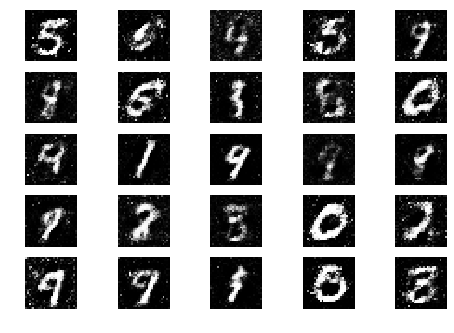

2301 [D loss: 0.609703, acc.: 70.31%] [G loss: 0.896710, acc.: 21.09%]
2302 [D loss: 0.619920, acc.: 71.09%] [G loss: 0.887263, acc.: 20.31%]
2303 [D loss: 0.617489, acc.: 67.97%] [G loss: 0.875660, acc.: 20.31%]
2304 [D loss: 0.616157, acc.: 69.53%] [G loss: 0.896649, acc.: 21.88%]
2305 [D loss: 0.585599, acc.: 74.61%] [G loss: 0.912088, acc.: 18.75%]
2306 [D loss: 0.589972, acc.: 73.05%] [G loss: 0.915350, acc.: 18.75%]
2307 [D loss: 0.603172, acc.: 69.92%] [G loss: 0.879403, acc.: 23.44%]
2308 [D loss: 0.614043, acc.: 70.70%] [G loss: 0.880324, acc.: 19.53%]
2309 [D loss: 0.622960, acc.: 67.97%] [G loss: 0.877507, acc.: 24.22%]
2310 [D loss: 0.589537, acc.: 73.83%] [G loss: 0.894310, acc.: 21.88%]
2311 [D loss: 0.616509, acc.: 67.97%] [G loss: 0.898413, acc.: 19.53%]
2312 [D loss: 0.630861, acc.: 63.67%] [G loss: 0.867958, acc.: 21.09%]
2313 [D loss: 0.611945, acc.: 69.14%] [G loss: 0.867881, acc.: 24.22%]
2314 [D loss: 0.617664, acc.: 68.36%] [G loss: 0.889077, acc.: 20.31%]
2315 [

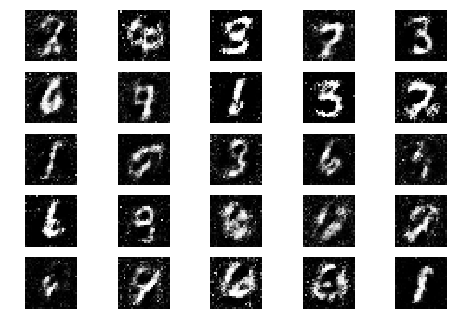

2351 [D loss: 0.620167, acc.: 67.19%] [G loss: 0.882403, acc.: 20.31%]
2352 [D loss: 0.651570, acc.: 59.77%] [G loss: 0.843310, acc.: 20.31%]
2353 [D loss: 0.633884, acc.: 67.19%] [G loss: 0.878549, acc.: 24.22%]
2354 [D loss: 0.592702, acc.: 69.92%] [G loss: 0.876504, acc.: 26.56%]
2355 [D loss: 0.618419, acc.: 65.62%] [G loss: 0.865228, acc.: 25.00%]
2356 [D loss: 0.592185, acc.: 69.14%] [G loss: 0.840268, acc.: 28.91%]
2357 [D loss: 0.621728, acc.: 67.19%] [G loss: 0.885947, acc.: 21.88%]
2358 [D loss: 0.619163, acc.: 68.36%] [G loss: 0.902016, acc.: 17.97%]
2359 [D loss: 0.573575, acc.: 75.78%] [G loss: 0.883292, acc.: 28.12%]
2360 [D loss: 0.614062, acc.: 67.58%] [G loss: 0.890781, acc.: 21.09%]
2361 [D loss: 0.608911, acc.: 64.84%] [G loss: 0.872008, acc.: 26.56%]
2362 [D loss: 0.633900, acc.: 62.50%] [G loss: 0.912668, acc.: 14.84%]
2363 [D loss: 0.629310, acc.: 65.23%] [G loss: 0.911524, acc.: 15.62%]
2364 [D loss: 0.621800, acc.: 69.92%] [G loss: 0.892520, acc.: 22.66%]
2365 [

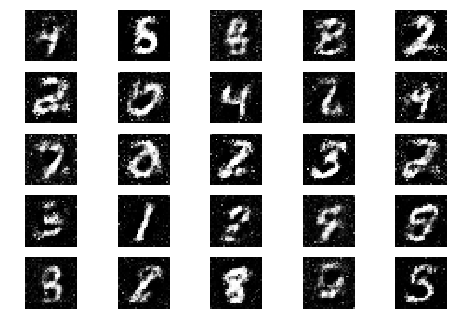

2401 [D loss: 0.639163, acc.: 67.58%] [G loss: 0.829343, acc.: 26.56%]
2402 [D loss: 0.642213, acc.: 62.89%] [G loss: 0.909965, acc.: 13.28%]
2403 [D loss: 0.610011, acc.: 72.27%] [G loss: 0.869726, acc.: 22.66%]
2404 [D loss: 0.613746, acc.: 67.58%] [G loss: 0.913538, acc.: 18.75%]
2405 [D loss: 0.626637, acc.: 67.97%] [G loss: 0.894233, acc.: 16.41%]
2406 [D loss: 0.598946, acc.: 69.92%] [G loss: 0.921589, acc.: 18.75%]
2407 [D loss: 0.640777, acc.: 59.77%] [G loss: 0.901848, acc.: 20.31%]
2408 [D loss: 0.624161, acc.: 65.23%] [G loss: 0.855935, acc.: 23.44%]
2409 [D loss: 0.645480, acc.: 61.33%] [G loss: 0.870060, acc.: 20.31%]
2410 [D loss: 0.606046, acc.: 68.75%] [G loss: 0.895664, acc.: 21.09%]
2411 [D loss: 0.616223, acc.: 68.36%] [G loss: 0.894637, acc.: 22.66%]
2412 [D loss: 0.628231, acc.: 64.84%] [G loss: 0.859502, acc.: 24.22%]
2413 [D loss: 0.629982, acc.: 68.36%] [G loss: 0.865023, acc.: 24.22%]
2414 [D loss: 0.644091, acc.: 63.28%] [G loss: 0.870836, acc.: 17.97%]
2415 [

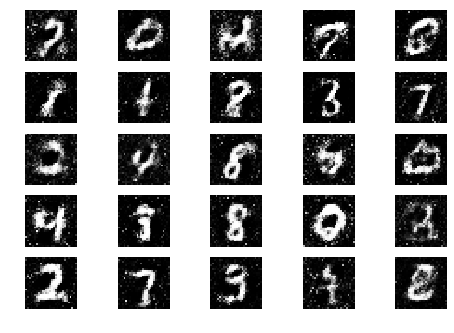

2451 [D loss: 0.601535, acc.: 71.88%] [G loss: 0.887791, acc.: 26.56%]
2452 [D loss: 0.625734, acc.: 64.45%] [G loss: 0.886824, acc.: 20.31%]
2453 [D loss: 0.632001, acc.: 68.75%] [G loss: 0.873835, acc.: 19.53%]
2454 [D loss: 0.639992, acc.: 63.67%] [G loss: 0.826550, acc.: 28.91%]
2455 [D loss: 0.651386, acc.: 61.72%] [G loss: 0.882980, acc.: 21.88%]
2456 [D loss: 0.618613, acc.: 68.36%] [G loss: 0.914779, acc.: 12.50%]
2457 [D loss: 0.621979, acc.: 66.41%] [G loss: 0.871333, acc.: 21.09%]
2458 [D loss: 0.611816, acc.: 66.02%] [G loss: 0.860374, acc.: 19.53%]
2459 [D loss: 0.619668, acc.: 67.19%] [G loss: 0.866299, acc.: 25.00%]
2460 [D loss: 0.651834, acc.: 63.28%] [G loss: 0.869715, acc.: 21.88%]
2461 [D loss: 0.627095, acc.: 68.75%] [G loss: 0.870619, acc.: 20.31%]
2462 [D loss: 0.621642, acc.: 66.80%] [G loss: 0.866924, acc.: 19.53%]
2463 [D loss: 0.640477, acc.: 64.84%] [G loss: 0.851456, acc.: 23.44%]
2464 [D loss: 0.611074, acc.: 67.97%] [G loss: 0.891104, acc.: 21.09%]
2465 [

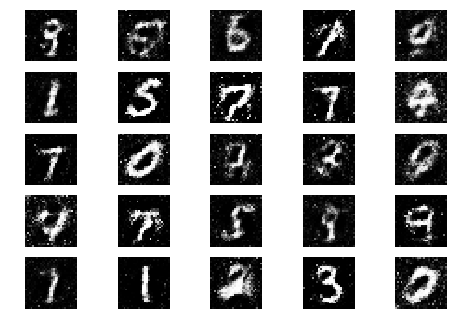

2501 [D loss: 0.641471, acc.: 66.41%] [G loss: 0.884068, acc.: 25.78%]
2502 [D loss: 0.612837, acc.: 67.58%] [G loss: 0.848971, acc.: 24.22%]
2503 [D loss: 0.608354, acc.: 69.14%] [G loss: 0.902037, acc.: 19.53%]
2504 [D loss: 0.638202, acc.: 66.02%] [G loss: 0.898347, acc.: 20.31%]
2505 [D loss: 0.627864, acc.: 67.58%] [G loss: 0.900643, acc.: 19.53%]
2506 [D loss: 0.623728, acc.: 67.97%] [G loss: 0.885202, acc.: 24.22%]
2507 [D loss: 0.624957, acc.: 66.41%] [G loss: 0.869655, acc.: 21.88%]
2508 [D loss: 0.629378, acc.: 65.62%] [G loss: 0.853918, acc.: 23.44%]
2509 [D loss: 0.641450, acc.: 66.02%] [G loss: 0.870301, acc.: 26.56%]
2510 [D loss: 0.632089, acc.: 62.89%] [G loss: 0.866986, acc.: 22.66%]
2511 [D loss: 0.621204, acc.: 71.88%] [G loss: 0.836518, acc.: 31.25%]
2512 [D loss: 0.631589, acc.: 67.97%] [G loss: 0.908265, acc.: 21.09%]
2513 [D loss: 0.635393, acc.: 65.62%] [G loss: 0.881185, acc.: 22.66%]
2514 [D loss: 0.624467, acc.: 67.58%] [G loss: 0.869786, acc.: 25.00%]
2515 [

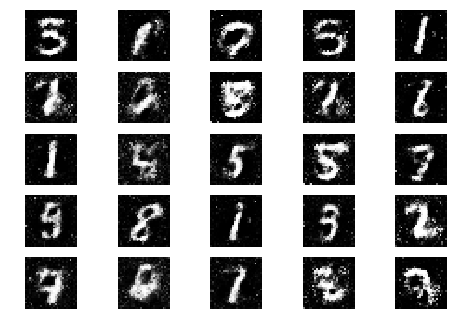

2551 [D loss: 0.631800, acc.: 66.41%] [G loss: 0.819752, acc.: 28.91%]
2552 [D loss: 0.627455, acc.: 63.28%] [G loss: 0.871245, acc.: 21.88%]
2553 [D loss: 0.630816, acc.: 66.02%] [G loss: 0.886585, acc.: 19.53%]
2554 [D loss: 0.620305, acc.: 72.66%] [G loss: 0.882568, acc.: 17.19%]
2555 [D loss: 0.600209, acc.: 73.05%] [G loss: 0.898322, acc.: 14.84%]
2556 [D loss: 0.609252, acc.: 71.09%] [G loss: 0.862337, acc.: 22.66%]
2557 [D loss: 0.616099, acc.: 68.75%] [G loss: 0.893835, acc.: 16.41%]
2558 [D loss: 0.644364, acc.: 60.55%] [G loss: 0.836433, acc.: 25.00%]
2559 [D loss: 0.636485, acc.: 71.88%] [G loss: 0.898302, acc.: 19.53%]
2560 [D loss: 0.603931, acc.: 71.48%] [G loss: 0.849615, acc.: 18.75%]
2561 [D loss: 0.617603, acc.: 73.05%] [G loss: 0.885122, acc.: 17.97%]
2562 [D loss: 0.609759, acc.: 71.48%] [G loss: 0.853567, acc.: 25.00%]
2563 [D loss: 0.634686, acc.: 67.97%] [G loss: 0.820883, acc.: 27.34%]
2564 [D loss: 0.615203, acc.: 69.14%] [G loss: 0.887180, acc.: 22.66%]
2565 [

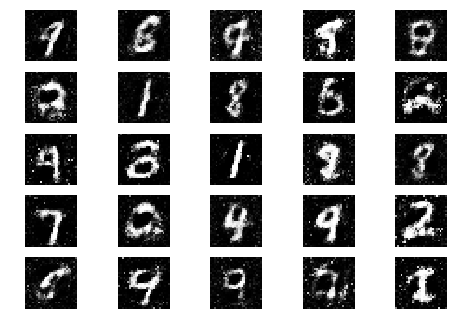

2601 [D loss: 0.605132, acc.: 69.92%] [G loss: 0.888061, acc.: 17.97%]
2602 [D loss: 0.633467, acc.: 67.58%] [G loss: 0.875988, acc.: 23.44%]
2603 [D loss: 0.621698, acc.: 70.31%] [G loss: 0.867691, acc.: 20.31%]
2604 [D loss: 0.606283, acc.: 69.14%] [G loss: 0.850565, acc.: 22.66%]
2605 [D loss: 0.628948, acc.: 64.45%] [G loss: 0.872278, acc.: 22.66%]
2606 [D loss: 0.648818, acc.: 64.45%] [G loss: 0.870496, acc.: 25.00%]
2607 [D loss: 0.623147, acc.: 66.80%] [G loss: 0.859034, acc.: 21.09%]
2608 [D loss: 0.594373, acc.: 71.88%] [G loss: 0.869775, acc.: 29.69%]
2609 [D loss: 0.580104, acc.: 73.05%] [G loss: 0.906604, acc.: 23.44%]
2610 [D loss: 0.608543, acc.: 71.88%] [G loss: 0.901833, acc.: 27.34%]
2611 [D loss: 0.626602, acc.: 64.84%] [G loss: 0.885962, acc.: 17.97%]
2612 [D loss: 0.655399, acc.: 60.55%] [G loss: 0.866202, acc.: 24.22%]
2613 [D loss: 0.611237, acc.: 67.19%] [G loss: 0.886275, acc.: 21.09%]
2614 [D loss: 0.594880, acc.: 71.09%] [G loss: 0.891050, acc.: 28.12%]
2615 [

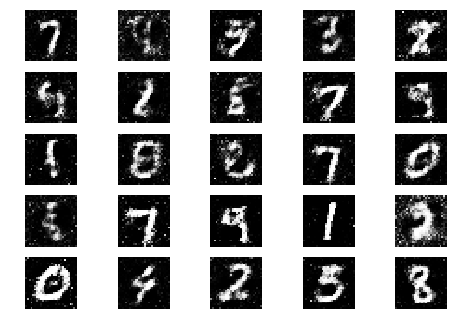

2651 [D loss: 0.603651, acc.: 71.88%] [G loss: 0.877989, acc.: 21.09%]
2652 [D loss: 0.649194, acc.: 63.28%] [G loss: 0.850592, acc.: 23.44%]
2653 [D loss: 0.614396, acc.: 69.92%] [G loss: 0.870923, acc.: 20.31%]
2654 [D loss: 0.610820, acc.: 71.09%] [G loss: 0.873414, acc.: 20.31%]
2655 [D loss: 0.609427, acc.: 69.92%] [G loss: 0.873613, acc.: 19.53%]
2656 [D loss: 0.617844, acc.: 68.75%] [G loss: 0.866040, acc.: 21.09%]
2657 [D loss: 0.599747, acc.: 71.09%] [G loss: 0.855876, acc.: 25.00%]
2658 [D loss: 0.651810, acc.: 61.33%] [G loss: 0.832489, acc.: 28.91%]
2659 [D loss: 0.614118, acc.: 70.31%] [G loss: 0.897830, acc.: 21.09%]
2660 [D loss: 0.624716, acc.: 68.75%] [G loss: 0.899682, acc.: 20.31%]
2661 [D loss: 0.615928, acc.: 67.19%] [G loss: 0.842121, acc.: 22.66%]
2662 [D loss: 0.617858, acc.: 67.97%] [G loss: 0.815865, acc.: 28.91%]
2663 [D loss: 0.612771, acc.: 71.09%] [G loss: 0.840573, acc.: 29.69%]
2664 [D loss: 0.596796, acc.: 75.39%] [G loss: 0.867017, acc.: 27.34%]
2665 [

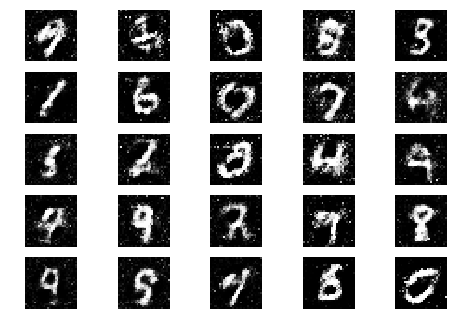

2701 [D loss: 0.629293, acc.: 64.45%] [G loss: 0.835467, acc.: 27.34%]
2702 [D loss: 0.632377, acc.: 65.62%] [G loss: 0.871038, acc.: 20.31%]
2703 [D loss: 0.614253, acc.: 68.75%] [G loss: 0.864658, acc.: 20.31%]
2704 [D loss: 0.624755, acc.: 69.14%] [G loss: 0.918606, acc.: 17.97%]
2705 [D loss: 0.623593, acc.: 67.19%] [G loss: 0.886811, acc.: 19.53%]
2706 [D loss: 0.601778, acc.: 67.19%] [G loss: 0.871625, acc.: 23.44%]
2707 [D loss: 0.605696, acc.: 74.22%] [G loss: 0.910340, acc.: 15.62%]
2708 [D loss: 0.610453, acc.: 71.88%] [G loss: 0.896107, acc.: 22.66%]
2709 [D loss: 0.620847, acc.: 64.84%] [G loss: 0.874167, acc.: 25.00%]
2710 [D loss: 0.629790, acc.: 65.62%] [G loss: 0.868386, acc.: 25.00%]
2711 [D loss: 0.640318, acc.: 65.62%] [G loss: 0.890326, acc.: 19.53%]
2712 [D loss: 0.615630, acc.: 69.53%] [G loss: 0.895328, acc.: 20.31%]
2713 [D loss: 0.620403, acc.: 69.53%] [G loss: 0.868702, acc.: 29.69%]
2714 [D loss: 0.633094, acc.: 65.23%] [G loss: 0.857092, acc.: 24.22%]
2715 [

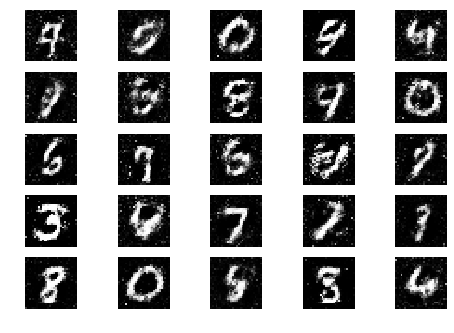

2751 [D loss: 0.610564, acc.: 72.27%] [G loss: 0.852925, acc.: 25.00%]
2752 [D loss: 0.662053, acc.: 59.38%] [G loss: 0.859235, acc.: 21.09%]
2753 [D loss: 0.638828, acc.: 66.41%] [G loss: 0.893147, acc.: 13.28%]
2754 [D loss: 0.645629, acc.: 69.14%] [G loss: 0.831318, acc.: 25.00%]
2755 [D loss: 0.639885, acc.: 63.67%] [G loss: 0.867353, acc.: 17.19%]
2756 [D loss: 0.632281, acc.: 64.45%] [G loss: 0.835562, acc.: 28.12%]
2757 [D loss: 0.645005, acc.: 66.80%] [G loss: 0.817530, acc.: 28.91%]
2758 [D loss: 0.610130, acc.: 72.27%] [G loss: 0.850093, acc.: 23.44%]
2759 [D loss: 0.628636, acc.: 65.23%] [G loss: 0.856796, acc.: 23.44%]
2760 [D loss: 0.610865, acc.: 70.31%] [G loss: 0.872515, acc.: 25.00%]
2761 [D loss: 0.624706, acc.: 68.75%] [G loss: 0.899570, acc.: 19.53%]
2762 [D loss: 0.637955, acc.: 63.28%] [G loss: 0.856924, acc.: 24.22%]
2763 [D loss: 0.640651, acc.: 68.36%] [G loss: 0.857332, acc.: 22.66%]
2764 [D loss: 0.633134, acc.: 63.67%] [G loss: 0.846656, acc.: 30.47%]
2765 [

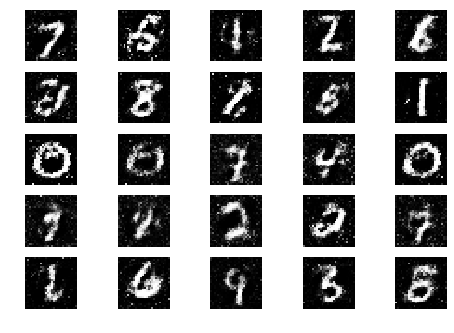

2801 [D loss: 0.632183, acc.: 64.45%] [G loss: 0.873199, acc.: 24.22%]
2802 [D loss: 0.631938, acc.: 68.75%] [G loss: 0.877596, acc.: 22.66%]
2803 [D loss: 0.616631, acc.: 66.41%] [G loss: 0.884016, acc.: 21.09%]
2804 [D loss: 0.621405, acc.: 66.02%] [G loss: 0.880906, acc.: 19.53%]
2805 [D loss: 0.626647, acc.: 61.72%] [G loss: 0.859552, acc.: 23.44%]
2806 [D loss: 0.638057, acc.: 63.28%] [G loss: 0.857086, acc.: 23.44%]
2807 [D loss: 0.602627, acc.: 69.53%] [G loss: 0.872242, acc.: 23.44%]
2808 [D loss: 0.631612, acc.: 66.41%] [G loss: 0.889195, acc.: 19.53%]
2809 [D loss: 0.630612, acc.: 63.67%] [G loss: 0.922440, acc.: 14.06%]
2810 [D loss: 0.639813, acc.: 64.06%] [G loss: 0.891623, acc.: 21.09%]
2811 [D loss: 0.639250, acc.: 67.19%] [G loss: 0.847441, acc.: 23.44%]
2812 [D loss: 0.627647, acc.: 66.41%] [G loss: 0.897805, acc.: 16.41%]
2813 [D loss: 0.648914, acc.: 61.33%] [G loss: 0.901458, acc.: 14.84%]
2814 [D loss: 0.626877, acc.: 67.19%] [G loss: 0.856192, acc.: 25.78%]
2815 [

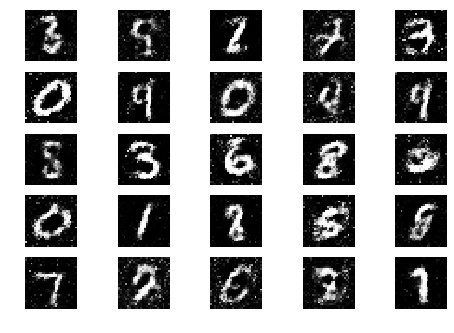

2851 [D loss: 0.603254, acc.: 71.09%] [G loss: 0.838901, acc.: 29.69%]
2852 [D loss: 0.639784, acc.: 63.67%] [G loss: 0.862947, acc.: 24.22%]
2853 [D loss: 0.639416, acc.: 64.06%] [G loss: 0.861031, acc.: 22.66%]
2854 [D loss: 0.628969, acc.: 65.62%] [G loss: 0.901144, acc.: 18.75%]
2855 [D loss: 0.595886, acc.: 72.27%] [G loss: 0.852815, acc.: 24.22%]
2856 [D loss: 0.652130, acc.: 62.50%] [G loss: 0.856965, acc.: 27.34%]
2857 [D loss: 0.630081, acc.: 65.62%] [G loss: 0.856997, acc.: 27.34%]
2858 [D loss: 0.624056, acc.: 67.58%] [G loss: 0.869574, acc.: 28.91%]
2859 [D loss: 0.646643, acc.: 66.02%] [G loss: 0.902765, acc.: 21.09%]
2860 [D loss: 0.632050, acc.: 66.41%] [G loss: 0.882049, acc.: 21.09%]
2861 [D loss: 0.621063, acc.: 67.58%] [G loss: 0.893062, acc.: 21.09%]
2862 [D loss: 0.657529, acc.: 61.33%] [G loss: 0.877949, acc.: 21.09%]
2863 [D loss: 0.641963, acc.: 61.33%] [G loss: 0.882750, acc.: 24.22%]
2864 [D loss: 0.631189, acc.: 66.80%] [G loss: 0.866997, acc.: 24.22%]
2865 [

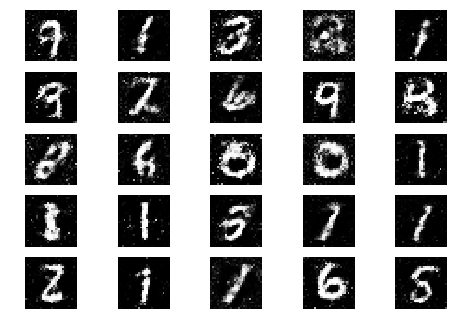

2901 [D loss: 0.623194, acc.: 67.19%] [G loss: 0.836556, acc.: 25.78%]
2902 [D loss: 0.653658, acc.: 60.55%] [G loss: 0.875439, acc.: 24.22%]
2903 [D loss: 0.615559, acc.: 71.48%] [G loss: 0.864861, acc.: 24.22%]
2904 [D loss: 0.635138, acc.: 64.45%] [G loss: 0.858176, acc.: 27.34%]
2905 [D loss: 0.630045, acc.: 66.41%] [G loss: 0.842692, acc.: 25.78%]
2906 [D loss: 0.631381, acc.: 65.62%] [G loss: 0.844188, acc.: 23.44%]
2907 [D loss: 0.624233, acc.: 67.58%] [G loss: 0.842840, acc.: 29.69%]
2908 [D loss: 0.647357, acc.: 64.06%] [G loss: 0.876622, acc.: 23.44%]
2909 [D loss: 0.623576, acc.: 66.02%] [G loss: 0.845822, acc.: 23.44%]
2910 [D loss: 0.638947, acc.: 65.23%] [G loss: 0.867817, acc.: 25.00%]
2911 [D loss: 0.622235, acc.: 66.80%] [G loss: 0.864288, acc.: 21.88%]
2912 [D loss: 0.640946, acc.: 64.06%] [G loss: 0.850667, acc.: 21.88%]
2913 [D loss: 0.653003, acc.: 64.84%] [G loss: 0.911484, acc.: 10.16%]
2914 [D loss: 0.616954, acc.: 69.14%] [G loss: 0.883934, acc.: 19.53%]
2915 [

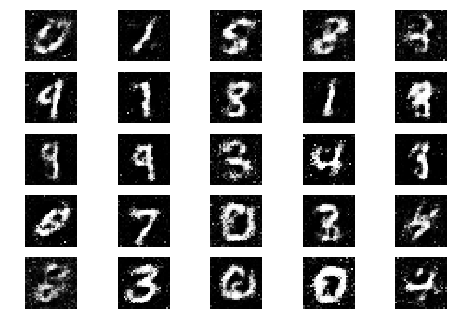

2951 [D loss: 0.651193, acc.: 62.50%] [G loss: 0.886523, acc.: 17.97%]
2952 [D loss: 0.647771, acc.: 65.23%] [G loss: 0.897441, acc.: 17.19%]
2953 [D loss: 0.618822, acc.: 70.31%] [G loss: 0.834940, acc.: 29.69%]
2954 [D loss: 0.627005, acc.: 69.14%] [G loss: 0.812081, acc.: 32.03%]
2955 [D loss: 0.659869, acc.: 62.50%] [G loss: 0.858317, acc.: 24.22%]
2956 [D loss: 0.639076, acc.: 63.67%] [G loss: 0.851533, acc.: 25.00%]
2957 [D loss: 0.639912, acc.: 62.50%] [G loss: 0.858748, acc.: 22.66%]
2958 [D loss: 0.624220, acc.: 68.36%] [G loss: 0.850891, acc.: 24.22%]
2959 [D loss: 0.641965, acc.: 61.33%] [G loss: 0.876219, acc.: 27.34%]
2960 [D loss: 0.625578, acc.: 67.58%] [G loss: 0.854980, acc.: 27.34%]
2961 [D loss: 0.600994, acc.: 71.48%] [G loss: 0.883780, acc.: 22.66%]
2962 [D loss: 0.616227, acc.: 71.09%] [G loss: 0.889634, acc.: 25.00%]
2963 [D loss: 0.653517, acc.: 62.89%] [G loss: 0.866831, acc.: 24.22%]
2964 [D loss: 0.611932, acc.: 71.48%] [G loss: 0.912081, acc.: 20.31%]
2965 [

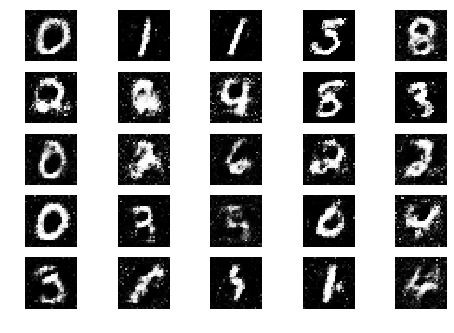

3001 [D loss: 0.626809, acc.: 64.45%] [G loss: 0.867513, acc.: 30.47%]
3002 [D loss: 0.631782, acc.: 64.84%] [G loss: 0.831784, acc.: 38.28%]
3003 [D loss: 0.646789, acc.: 64.45%] [G loss: 0.864939, acc.: 25.78%]
3004 [D loss: 0.627716, acc.: 63.28%] [G loss: 0.929642, acc.: 22.66%]
3005 [D loss: 0.639803, acc.: 65.23%] [G loss: 0.886475, acc.: 21.88%]
3006 [D loss: 0.648009, acc.: 60.16%] [G loss: 0.885216, acc.: 23.44%]
3007 [D loss: 0.643666, acc.: 62.89%] [G loss: 0.824662, acc.: 31.25%]
3008 [D loss: 0.634190, acc.: 65.62%] [G loss: 0.878297, acc.: 16.41%]
3009 [D loss: 0.634381, acc.: 64.84%] [G loss: 0.819619, acc.: 32.03%]
3010 [D loss: 0.616838, acc.: 67.58%] [G loss: 0.832563, acc.: 25.00%]
3011 [D loss: 0.641976, acc.: 65.23%] [G loss: 0.851349, acc.: 29.69%]
3012 [D loss: 0.656370, acc.: 60.94%] [G loss: 0.861639, acc.: 23.44%]
3013 [D loss: 0.636400, acc.: 62.11%] [G loss: 0.871155, acc.: 21.88%]
3014 [D loss: 0.625680, acc.: 67.19%] [G loss: 0.876206, acc.: 25.00%]
3015 [

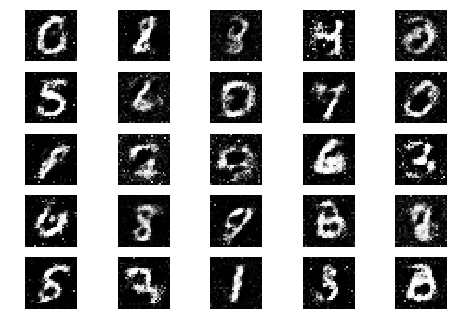

3051 [D loss: 0.634772, acc.: 63.28%] [G loss: 0.857572, acc.: 29.69%]
3052 [D loss: 0.654723, acc.: 60.94%] [G loss: 0.834535, acc.: 26.56%]
3053 [D loss: 0.634552, acc.: 66.80%] [G loss: 0.846170, acc.: 24.22%]
3054 [D loss: 0.638793, acc.: 62.50%] [G loss: 0.822050, acc.: 29.69%]
3055 [D loss: 0.643519, acc.: 64.06%] [G loss: 0.858981, acc.: 24.22%]
3056 [D loss: 0.639323, acc.: 67.58%] [G loss: 0.882922, acc.: 17.19%]
3057 [D loss: 0.640779, acc.: 64.06%] [G loss: 0.880473, acc.: 22.66%]
3058 [D loss: 0.635582, acc.: 67.58%] [G loss: 0.879980, acc.: 19.53%]
3059 [D loss: 0.631067, acc.: 66.02%] [G loss: 0.818072, acc.: 28.91%]
3060 [D loss: 0.660037, acc.: 60.55%] [G loss: 0.877827, acc.: 28.91%]
3061 [D loss: 0.634757, acc.: 64.45%] [G loss: 0.848815, acc.: 24.22%]
3062 [D loss: 0.656482, acc.: 60.94%] [G loss: 0.861567, acc.: 25.00%]
3063 [D loss: 0.651592, acc.: 61.33%] [G loss: 0.830858, acc.: 29.69%]
3064 [D loss: 0.640141, acc.: 64.45%] [G loss: 0.870820, acc.: 24.22%]
3065 [

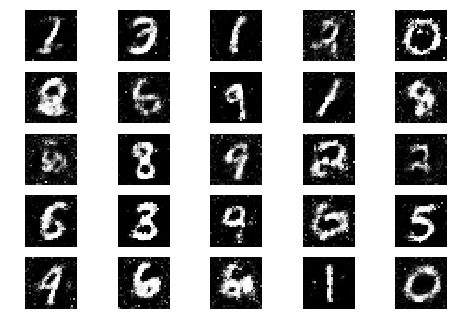

3101 [D loss: 0.653380, acc.: 60.16%] [G loss: 0.893151, acc.: 17.97%]
3102 [D loss: 0.633527, acc.: 65.23%] [G loss: 0.830802, acc.: 23.44%]
3103 [D loss: 0.643914, acc.: 66.41%] [G loss: 0.818011, acc.: 30.47%]
3104 [D loss: 0.635478, acc.: 66.41%] [G loss: 0.830279, acc.: 26.56%]
3105 [D loss: 0.626333, acc.: 67.97%] [G loss: 0.847037, acc.: 29.69%]
3106 [D loss: 0.603409, acc.: 68.36%] [G loss: 0.854566, acc.: 25.78%]
3107 [D loss: 0.602385, acc.: 71.88%] [G loss: 0.842366, acc.: 28.12%]
3108 [D loss: 0.633097, acc.: 62.50%] [G loss: 0.866441, acc.: 16.41%]
3109 [D loss: 0.621533, acc.: 67.58%] [G loss: 0.858823, acc.: 23.44%]
3110 [D loss: 0.627997, acc.: 67.58%] [G loss: 0.858597, acc.: 27.34%]
3111 [D loss: 0.626568, acc.: 69.14%] [G loss: 0.887613, acc.: 22.66%]
3112 [D loss: 0.620823, acc.: 68.36%] [G loss: 0.850475, acc.: 25.00%]
3113 [D loss: 0.643209, acc.: 63.28%] [G loss: 0.876887, acc.: 20.31%]
3114 [D loss: 0.646040, acc.: 62.89%] [G loss: 0.869689, acc.: 20.31%]
3115 [

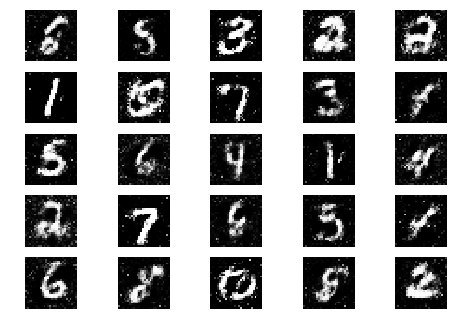

3151 [D loss: 0.615311, acc.: 71.09%] [G loss: 0.829045, acc.: 31.25%]
3152 [D loss: 0.666998, acc.: 57.42%] [G loss: 0.854391, acc.: 25.78%]
3153 [D loss: 0.634545, acc.: 66.41%] [G loss: 0.861879, acc.: 25.78%]
3154 [D loss: 0.623548, acc.: 70.31%] [G loss: 0.869266, acc.: 22.66%]
3155 [D loss: 0.658764, acc.: 60.55%] [G loss: 0.862562, acc.: 22.66%]
3156 [D loss: 0.616060, acc.: 70.31%] [G loss: 0.872283, acc.: 21.09%]
3157 [D loss: 0.640184, acc.: 64.45%] [G loss: 0.862049, acc.: 21.09%]
3158 [D loss: 0.626314, acc.: 65.23%] [G loss: 0.866700, acc.: 18.75%]
3159 [D loss: 0.640324, acc.: 67.19%] [G loss: 0.861285, acc.: 26.56%]
3160 [D loss: 0.661108, acc.: 65.62%] [G loss: 0.853813, acc.: 25.00%]
3161 [D loss: 0.634181, acc.: 67.58%] [G loss: 0.857865, acc.: 24.22%]
3162 [D loss: 0.639307, acc.: 68.36%] [G loss: 0.848564, acc.: 26.56%]
3163 [D loss: 0.621172, acc.: 72.27%] [G loss: 0.841298, acc.: 26.56%]
3164 [D loss: 0.640302, acc.: 64.06%] [G loss: 0.825271, acc.: 28.91%]
3165 [

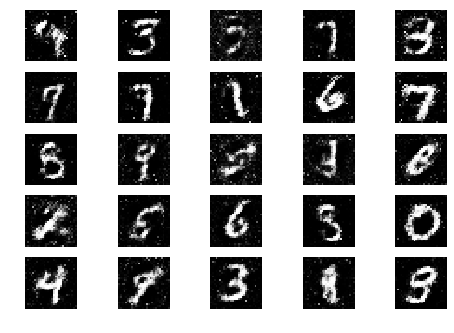

3201 [D loss: 0.621743, acc.: 67.19%] [G loss: 0.846163, acc.: 26.56%]
3202 [D loss: 0.630437, acc.: 66.80%] [G loss: 0.865827, acc.: 23.44%]
3203 [D loss: 0.636001, acc.: 67.97%] [G loss: 0.876481, acc.: 30.47%]
3204 [D loss: 0.625768, acc.: 68.36%] [G loss: 0.855349, acc.: 26.56%]
3205 [D loss: 0.649353, acc.: 61.72%] [G loss: 0.835869, acc.: 31.25%]
3206 [D loss: 0.656170, acc.: 62.11%] [G loss: 0.862107, acc.: 18.75%]
3207 [D loss: 0.625395, acc.: 69.92%] [G loss: 0.845125, acc.: 24.22%]
3208 [D loss: 0.637085, acc.: 64.06%] [G loss: 0.848730, acc.: 30.47%]
3209 [D loss: 0.650689, acc.: 61.72%] [G loss: 0.852992, acc.: 23.44%]
3210 [D loss: 0.642117, acc.: 64.06%] [G loss: 0.886525, acc.: 21.88%]
3211 [D loss: 0.646064, acc.: 64.84%] [G loss: 0.891575, acc.: 21.88%]
3212 [D loss: 0.624163, acc.: 66.41%] [G loss: 0.895933, acc.: 19.53%]
3213 [D loss: 0.642810, acc.: 61.72%] [G loss: 0.904536, acc.: 21.88%]
3214 [D loss: 0.621107, acc.: 67.19%] [G loss: 0.882036, acc.: 25.00%]
3215 [

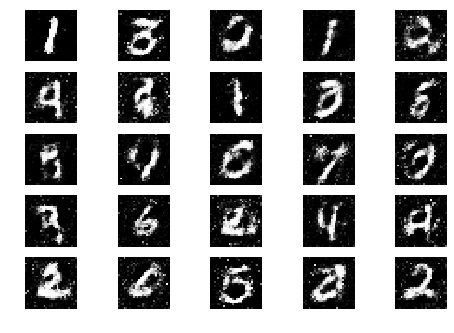

3251 [D loss: 0.635349, acc.: 66.02%] [G loss: 0.847665, acc.: 22.66%]
3252 [D loss: 0.638121, acc.: 64.84%] [G loss: 0.850784, acc.: 28.91%]
3253 [D loss: 0.648480, acc.: 62.50%] [G loss: 0.865798, acc.: 21.88%]
3254 [D loss: 0.628077, acc.: 67.58%] [G loss: 0.837811, acc.: 30.47%]
3255 [D loss: 0.646988, acc.: 61.33%] [G loss: 0.819414, acc.: 27.34%]
3256 [D loss: 0.647005, acc.: 64.06%] [G loss: 0.835738, acc.: 31.25%]
3257 [D loss: 0.658421, acc.: 60.16%] [G loss: 0.836986, acc.: 31.25%]
3258 [D loss: 0.656052, acc.: 60.55%] [G loss: 0.865381, acc.: 21.09%]
3259 [D loss: 0.651849, acc.: 63.28%] [G loss: 0.833548, acc.: 25.00%]
3260 [D loss: 0.646091, acc.: 62.11%] [G loss: 0.878243, acc.: 12.50%]
3261 [D loss: 0.652108, acc.: 61.33%] [G loss: 0.864847, acc.: 18.75%]
3262 [D loss: 0.636536, acc.: 65.62%] [G loss: 0.874111, acc.: 17.19%]
3263 [D loss: 0.646123, acc.: 61.72%] [G loss: 0.875305, acc.: 15.62%]
3264 [D loss: 0.638118, acc.: 63.67%] [G loss: 0.896994, acc.: 21.09%]
3265 [

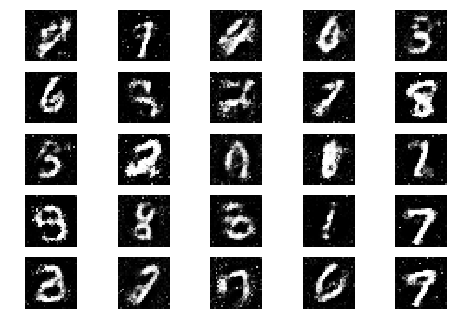

3301 [D loss: 0.647063, acc.: 66.80%] [G loss: 0.842360, acc.: 26.56%]
3302 [D loss: 0.656445, acc.: 59.38%] [G loss: 0.847499, acc.: 25.00%]
3303 [D loss: 0.647263, acc.: 61.72%] [G loss: 0.854743, acc.: 25.00%]
3304 [D loss: 0.668205, acc.: 59.38%] [G loss: 0.845804, acc.: 21.09%]
3305 [D loss: 0.624845, acc.: 69.92%] [G loss: 0.881501, acc.: 20.31%]
3306 [D loss: 0.652213, acc.: 62.89%] [G loss: 0.851182, acc.: 26.56%]
3307 [D loss: 0.652689, acc.: 63.67%] [G loss: 0.857873, acc.: 19.53%]
3308 [D loss: 0.616579, acc.: 71.88%] [G loss: 0.844569, acc.: 28.91%]
3309 [D loss: 0.636703, acc.: 66.02%] [G loss: 0.869158, acc.: 23.44%]
3310 [D loss: 0.639154, acc.: 64.06%] [G loss: 0.864164, acc.: 22.66%]
3311 [D loss: 0.654073, acc.: 60.55%] [G loss: 0.844725, acc.: 25.78%]
3312 [D loss: 0.655638, acc.: 60.94%] [G loss: 0.856661, acc.: 22.66%]
3313 [D loss: 0.668032, acc.: 62.11%] [G loss: 0.864563, acc.: 25.00%]
3314 [D loss: 0.654835, acc.: 61.33%] [G loss: 0.826402, acc.: 31.25%]
3315 [

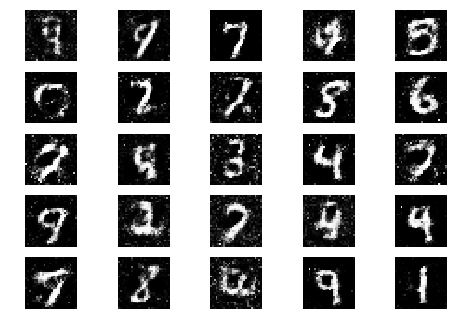

3351 [D loss: 0.642549, acc.: 63.28%] [G loss: 0.855065, acc.: 26.56%]
3352 [D loss: 0.636214, acc.: 65.23%] [G loss: 0.854931, acc.: 25.78%]
3353 [D loss: 0.650189, acc.: 61.72%] [G loss: 0.842758, acc.: 22.66%]
3354 [D loss: 0.641780, acc.: 63.67%] [G loss: 0.860396, acc.: 27.34%]
3355 [D loss: 0.647558, acc.: 63.28%] [G loss: 0.857245, acc.: 27.34%]
3356 [D loss: 0.638549, acc.: 65.23%] [G loss: 0.812068, acc.: 32.81%]
3357 [D loss: 0.634282, acc.: 64.45%] [G loss: 0.840485, acc.: 27.34%]
3358 [D loss: 0.633527, acc.: 61.33%] [G loss: 0.831880, acc.: 31.25%]
3359 [D loss: 0.659192, acc.: 62.89%] [G loss: 0.848933, acc.: 30.47%]
3360 [D loss: 0.647777, acc.: 64.45%] [G loss: 0.868949, acc.: 20.31%]
3361 [D loss: 0.649969, acc.: 67.97%] [G loss: 0.892280, acc.: 22.66%]
3362 [D loss: 0.650134, acc.: 63.28%] [G loss: 0.852159, acc.: 25.78%]
3363 [D loss: 0.645430, acc.: 66.80%] [G loss: 0.868829, acc.: 21.88%]
3364 [D loss: 0.658475, acc.: 60.94%] [G loss: 0.876925, acc.: 23.44%]
3365 [

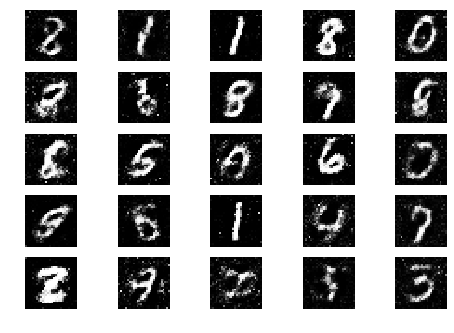

3401 [D loss: 0.653350, acc.: 63.67%] [G loss: 0.920863, acc.: 15.62%]
3402 [D loss: 0.652635, acc.: 62.89%] [G loss: 0.887475, acc.: 17.19%]
3403 [D loss: 0.662499, acc.: 61.33%] [G loss: 0.858989, acc.: 19.53%]
3404 [D loss: 0.653525, acc.: 63.28%] [G loss: 0.837557, acc.: 21.09%]
3405 [D loss: 0.637727, acc.: 68.75%] [G loss: 0.865346, acc.: 22.66%]
3406 [D loss: 0.680546, acc.: 56.64%] [G loss: 0.827842, acc.: 28.91%]
3407 [D loss: 0.669765, acc.: 60.16%] [G loss: 0.856323, acc.: 23.44%]
3408 [D loss: 0.637893, acc.: 67.19%] [G loss: 0.845407, acc.: 24.22%]
3409 [D loss: 0.650703, acc.: 64.06%] [G loss: 0.865462, acc.: 21.09%]
3410 [D loss: 0.657239, acc.: 61.72%] [G loss: 0.854272, acc.: 18.75%]
3411 [D loss: 0.638824, acc.: 64.06%] [G loss: 0.836741, acc.: 27.34%]
3412 [D loss: 0.673573, acc.: 57.42%] [G loss: 0.836215, acc.: 26.56%]
3413 [D loss: 0.634277, acc.: 64.45%] [G loss: 0.828532, acc.: 26.56%]
3414 [D loss: 0.655827, acc.: 63.28%] [G loss: 0.861604, acc.: 17.97%]
3415 [

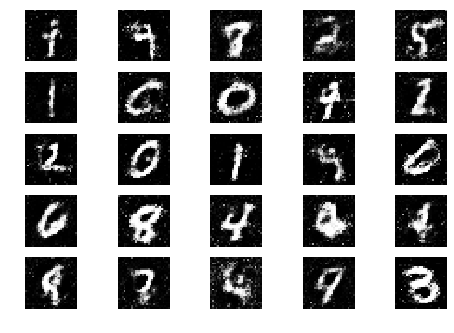

3451 [D loss: 0.652107, acc.: 62.89%] [G loss: 0.865648, acc.: 21.09%]
3452 [D loss: 0.628838, acc.: 65.62%] [G loss: 0.872325, acc.: 24.22%]
3453 [D loss: 0.653366, acc.: 60.16%] [G loss: 0.821864, acc.: 32.81%]
3454 [D loss: 0.642086, acc.: 62.89%] [G loss: 0.831724, acc.: 24.22%]
3455 [D loss: 0.631984, acc.: 66.80%] [G loss: 0.871343, acc.: 23.44%]
3456 [D loss: 0.648681, acc.: 64.06%] [G loss: 0.871819, acc.: 25.78%]
3457 [D loss: 0.656152, acc.: 60.55%] [G loss: 0.830274, acc.: 28.91%]
3458 [D loss: 0.656827, acc.: 61.33%] [G loss: 0.851012, acc.: 25.78%]
3459 [D loss: 0.649357, acc.: 62.50%] [G loss: 0.822429, acc.: 26.56%]
3460 [D loss: 0.624695, acc.: 69.92%] [G loss: 0.874996, acc.: 14.06%]
3461 [D loss: 0.637801, acc.: 64.06%] [G loss: 0.851708, acc.: 23.44%]
3462 [D loss: 0.648309, acc.: 61.33%] [G loss: 0.858157, acc.: 21.09%]
3463 [D loss: 0.654662, acc.: 62.89%] [G loss: 0.855400, acc.: 27.34%]
3464 [D loss: 0.660996, acc.: 60.55%] [G loss: 0.819099, acc.: 29.69%]
3465 [

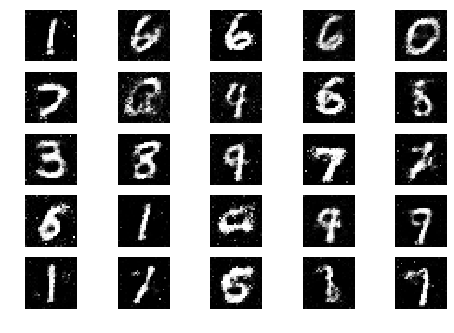

3501 [D loss: 0.629518, acc.: 66.02%] [G loss: 0.875047, acc.: 21.88%]
3502 [D loss: 0.622615, acc.: 67.58%] [G loss: 0.856942, acc.: 24.22%]
3503 [D loss: 0.641175, acc.: 63.67%] [G loss: 0.844936, acc.: 22.66%]
3504 [D loss: 0.654625, acc.: 58.98%] [G loss: 0.864723, acc.: 23.44%]
3505 [D loss: 0.655852, acc.: 59.38%] [G loss: 0.861713, acc.: 20.31%]
3506 [D loss: 0.626921, acc.: 62.89%] [G loss: 0.855746, acc.: 25.00%]
3507 [D loss: 0.636651, acc.: 63.67%] [G loss: 0.863080, acc.: 25.00%]
3508 [D loss: 0.630388, acc.: 64.06%] [G loss: 0.879136, acc.: 28.12%]
3509 [D loss: 0.633380, acc.: 66.80%] [G loss: 0.879691, acc.: 25.78%]
3510 [D loss: 0.658237, acc.: 61.33%] [G loss: 0.876763, acc.: 25.00%]
3511 [D loss: 0.635635, acc.: 66.80%] [G loss: 0.889420, acc.: 17.19%]
3512 [D loss: 0.655479, acc.: 62.89%] [G loss: 0.852699, acc.: 26.56%]
3513 [D loss: 0.662493, acc.: 58.20%] [G loss: 0.841096, acc.: 25.00%]
3514 [D loss: 0.643318, acc.: 62.11%] [G loss: 0.878610, acc.: 23.44%]
3515 [

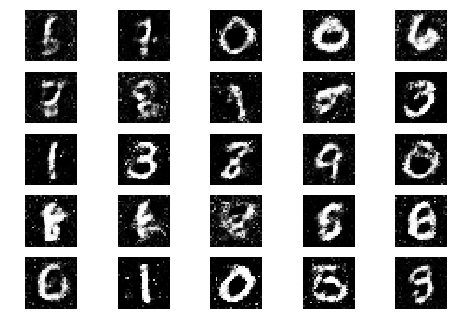

3551 [D loss: 0.652088, acc.: 64.84%] [G loss: 0.825304, acc.: 27.34%]
3552 [D loss: 0.640149, acc.: 62.50%] [G loss: 0.841037, acc.: 21.88%]
3553 [D loss: 0.640027, acc.: 62.89%] [G loss: 0.810885, acc.: 28.12%]
3554 [D loss: 0.638822, acc.: 69.14%] [G loss: 0.837609, acc.: 28.91%]
3555 [D loss: 0.633181, acc.: 66.80%] [G loss: 0.823799, acc.: 33.59%]
3556 [D loss: 0.661460, acc.: 57.81%] [G loss: 0.819380, acc.: 29.69%]
3557 [D loss: 0.641219, acc.: 63.67%] [G loss: 0.841676, acc.: 23.44%]
3558 [D loss: 0.626422, acc.: 64.45%] [G loss: 0.822471, acc.: 29.69%]
3559 [D loss: 0.651456, acc.: 64.84%] [G loss: 0.831033, acc.: 25.78%]
3560 [D loss: 0.675222, acc.: 53.91%] [G loss: 0.869052, acc.: 27.34%]
3561 [D loss: 0.645214, acc.: 62.11%] [G loss: 0.858397, acc.: 20.31%]
3562 [D loss: 0.652622, acc.: 63.28%] [G loss: 0.865645, acc.: 24.22%]
3563 [D loss: 0.667238, acc.: 58.98%] [G loss: 0.843400, acc.: 25.78%]
3564 [D loss: 0.631874, acc.: 65.62%] [G loss: 0.831982, acc.: 24.22%]
3565 [

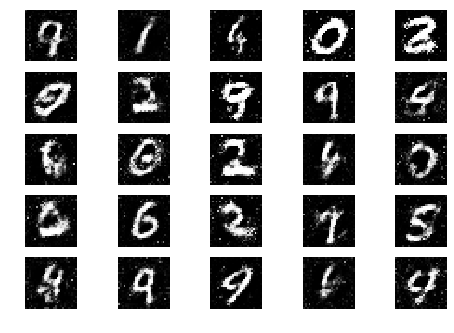

3601 [D loss: 0.631872, acc.: 67.97%] [G loss: 0.827795, acc.: 31.25%]
3602 [D loss: 0.642786, acc.: 63.28%] [G loss: 0.841058, acc.: 27.34%]
3603 [D loss: 0.634281, acc.: 66.80%] [G loss: 0.865453, acc.: 28.91%]
3604 [D loss: 0.665255, acc.: 58.59%] [G loss: 0.860222, acc.: 25.78%]
3605 [D loss: 0.640461, acc.: 64.84%] [G loss: 0.859149, acc.: 20.31%]
3606 [D loss: 0.636771, acc.: 66.41%] [G loss: 0.840140, acc.: 24.22%]
3607 [D loss: 0.657254, acc.: 65.23%] [G loss: 0.840451, acc.: 25.00%]
3608 [D loss: 0.649370, acc.: 65.23%] [G loss: 0.844648, acc.: 25.00%]
3609 [D loss: 0.631226, acc.: 69.53%] [G loss: 0.845300, acc.: 27.34%]
3610 [D loss: 0.659089, acc.: 61.72%] [G loss: 0.831051, acc.: 30.47%]
3611 [D loss: 0.654458, acc.: 64.45%] [G loss: 0.859672, acc.: 23.44%]
3612 [D loss: 0.654474, acc.: 62.11%] [G loss: 0.873447, acc.: 19.53%]
3613 [D loss: 0.650431, acc.: 59.77%] [G loss: 0.858523, acc.: 21.09%]
3614 [D loss: 0.645739, acc.: 64.06%] [G loss: 0.821161, acc.: 26.56%]
3615 [

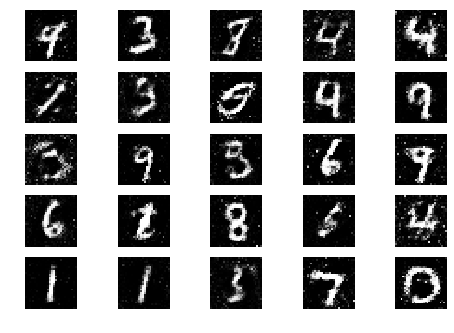

3651 [D loss: 0.648313, acc.: 59.38%] [G loss: 0.831491, acc.: 32.81%]
3652 [D loss: 0.641520, acc.: 65.23%] [G loss: 0.839047, acc.: 31.25%]
3653 [D loss: 0.641626, acc.: 63.67%] [G loss: 0.837126, acc.: 23.44%]
3654 [D loss: 0.631536, acc.: 63.67%] [G loss: 0.850336, acc.: 28.12%]
3655 [D loss: 0.628457, acc.: 64.06%] [G loss: 0.840291, acc.: 30.47%]
3656 [D loss: 0.658813, acc.: 60.94%] [G loss: 0.827072, acc.: 25.00%]
3657 [D loss: 0.646007, acc.: 64.45%] [G loss: 0.847955, acc.: 21.09%]
3658 [D loss: 0.639207, acc.: 67.19%] [G loss: 0.840300, acc.: 24.22%]
3659 [D loss: 0.636381, acc.: 65.62%] [G loss: 0.854982, acc.: 24.22%]
3660 [D loss: 0.646075, acc.: 62.89%] [G loss: 0.864772, acc.: 22.66%]
3661 [D loss: 0.653490, acc.: 60.55%] [G loss: 0.825679, acc.: 29.69%]
3662 [D loss: 0.643643, acc.: 63.28%] [G loss: 0.837895, acc.: 28.12%]
3663 [D loss: 0.627303, acc.: 67.19%] [G loss: 0.831188, acc.: 35.16%]
3664 [D loss: 0.683630, acc.: 55.86%] [G loss: 0.824089, acc.: 29.69%]
3665 [

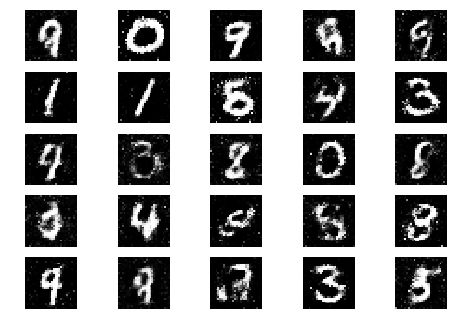

3701 [D loss: 0.684482, acc.: 59.38%] [G loss: 0.834055, acc.: 25.00%]
3702 [D loss: 0.665080, acc.: 60.55%] [G loss: 0.844316, acc.: 29.69%]
3703 [D loss: 0.622369, acc.: 70.70%] [G loss: 0.864874, acc.: 21.88%]
3704 [D loss: 0.676693, acc.: 55.47%] [G loss: 0.849004, acc.: 16.41%]
3705 [D loss: 0.644610, acc.: 67.19%] [G loss: 0.846008, acc.: 25.00%]
3706 [D loss: 0.648060, acc.: 64.06%] [G loss: 0.850090, acc.: 26.56%]
3707 [D loss: 0.636275, acc.: 64.84%] [G loss: 0.858154, acc.: 24.22%]
3708 [D loss: 0.650556, acc.: 64.45%] [G loss: 0.844248, acc.: 25.00%]
3709 [D loss: 0.649161, acc.: 64.06%] [G loss: 0.865643, acc.: 27.34%]
3710 [D loss: 0.677499, acc.: 54.69%] [G loss: 0.817597, acc.: 25.00%]
3711 [D loss: 0.631107, acc.: 66.80%] [G loss: 0.849663, acc.: 20.31%]
3712 [D loss: 0.646631, acc.: 61.72%] [G loss: 0.863989, acc.: 25.00%]
3713 [D loss: 0.629409, acc.: 66.41%] [G loss: 0.876738, acc.: 23.44%]
3714 [D loss: 0.654069, acc.: 61.72%] [G loss: 0.859894, acc.: 20.31%]
3715 [

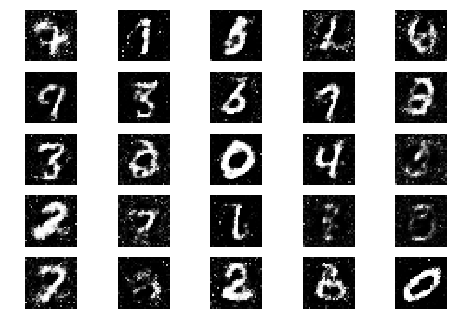

3751 [D loss: 0.656297, acc.: 61.33%] [G loss: 0.886724, acc.: 18.75%]
3752 [D loss: 0.659375, acc.: 60.55%] [G loss: 0.876862, acc.: 22.66%]
3753 [D loss: 0.648359, acc.: 64.84%] [G loss: 0.886765, acc.: 18.75%]
3754 [D loss: 0.647361, acc.: 64.84%] [G loss: 0.821571, acc.: 32.03%]
3755 [D loss: 0.640371, acc.: 61.72%] [G loss: 0.835678, acc.: 27.34%]
3756 [D loss: 0.653196, acc.: 64.06%] [G loss: 0.825155, acc.: 28.12%]
3757 [D loss: 0.662637, acc.: 61.33%] [G loss: 0.864685, acc.: 18.75%]
3758 [D loss: 0.672589, acc.: 62.11%] [G loss: 0.863142, acc.: 22.66%]
3759 [D loss: 0.642630, acc.: 65.62%] [G loss: 0.847324, acc.: 32.81%]
3760 [D loss: 0.640770, acc.: 62.89%] [G loss: 0.823008, acc.: 29.69%]
3761 [D loss: 0.641144, acc.: 60.94%] [G loss: 0.839075, acc.: 28.91%]
3762 [D loss: 0.663664, acc.: 57.81%] [G loss: 0.856305, acc.: 28.12%]
3763 [D loss: 0.634719, acc.: 67.19%] [G loss: 0.873104, acc.: 20.31%]
3764 [D loss: 0.658722, acc.: 58.98%] [G loss: 0.843629, acc.: 26.56%]
3765 [

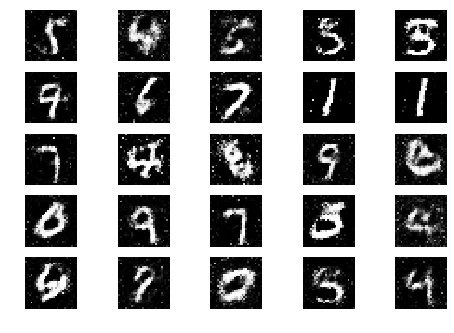

3801 [D loss: 0.651577, acc.: 64.84%] [G loss: 0.855572, acc.: 21.09%]
3802 [D loss: 0.659338, acc.: 60.16%] [G loss: 0.844965, acc.: 24.22%]
3803 [D loss: 0.661995, acc.: 60.94%] [G loss: 0.840757, acc.: 24.22%]
3804 [D loss: 0.647180, acc.: 61.72%] [G loss: 0.824851, acc.: 30.47%]
3805 [D loss: 0.643197, acc.: 62.89%] [G loss: 0.818389, acc.: 34.38%]
3806 [D loss: 0.635534, acc.: 64.84%] [G loss: 0.839008, acc.: 27.34%]
3807 [D loss: 0.654124, acc.: 62.11%] [G loss: 0.828972, acc.: 31.25%]
3808 [D loss: 0.658177, acc.: 60.16%] [G loss: 0.843909, acc.: 21.88%]
3809 [D loss: 0.662572, acc.: 60.55%] [G loss: 0.861300, acc.: 21.88%]
3810 [D loss: 0.660158, acc.: 58.59%] [G loss: 0.866063, acc.: 21.88%]
3811 [D loss: 0.638017, acc.: 64.45%] [G loss: 0.836629, acc.: 21.09%]
3812 [D loss: 0.629467, acc.: 64.45%] [G loss: 0.870090, acc.: 27.34%]
3813 [D loss: 0.662155, acc.: 58.59%] [G loss: 0.841617, acc.: 26.56%]
3814 [D loss: 0.662973, acc.: 59.38%] [G loss: 0.831827, acc.: 27.34%]
3815 [

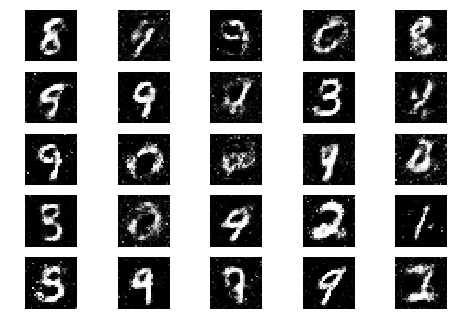

3851 [D loss: 0.624046, acc.: 69.92%] [G loss: 0.854138, acc.: 25.00%]
3852 [D loss: 0.651016, acc.: 62.89%] [G loss: 0.841490, acc.: 19.53%]
3853 [D loss: 0.631969, acc.: 67.97%] [G loss: 0.841342, acc.: 23.44%]
3854 [D loss: 0.649004, acc.: 64.84%] [G loss: 0.814915, acc.: 25.00%]
3855 [D loss: 0.638343, acc.: 64.06%] [G loss: 0.840160, acc.: 19.53%]
3856 [D loss: 0.670220, acc.: 59.38%] [G loss: 0.824213, acc.: 23.44%]
3857 [D loss: 0.652523, acc.: 62.89%] [G loss: 0.857921, acc.: 24.22%]
3858 [D loss: 0.655383, acc.: 62.11%] [G loss: 0.806573, acc.: 27.34%]
3859 [D loss: 0.631594, acc.: 70.31%] [G loss: 0.822059, acc.: 30.47%]
3860 [D loss: 0.646687, acc.: 62.89%] [G loss: 0.850779, acc.: 27.34%]
3861 [D loss: 0.667938, acc.: 58.59%] [G loss: 0.797493, acc.: 28.91%]
3862 [D loss: 0.645365, acc.: 62.50%] [G loss: 0.852076, acc.: 23.44%]
3863 [D loss: 0.639614, acc.: 64.06%] [G loss: 0.845543, acc.: 27.34%]
3864 [D loss: 0.650195, acc.: 61.72%] [G loss: 0.833896, acc.: 29.69%]
3865 [

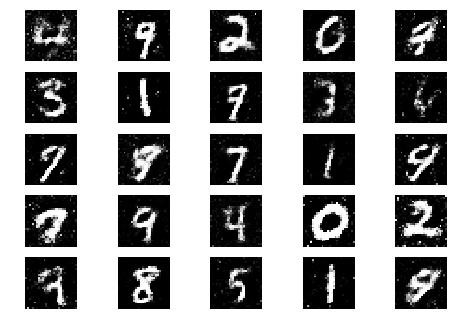

3901 [D loss: 0.664593, acc.: 62.89%] [G loss: 0.882118, acc.: 22.66%]
3902 [D loss: 0.662078, acc.: 59.38%] [G loss: 0.836605, acc.: 28.91%]
3903 [D loss: 0.639740, acc.: 60.55%] [G loss: 0.843887, acc.: 22.66%]
3904 [D loss: 0.657027, acc.: 64.45%] [G loss: 0.805207, acc.: 27.34%]
3905 [D loss: 0.637108, acc.: 65.23%] [G loss: 0.866177, acc.: 21.09%]
3906 [D loss: 0.654642, acc.: 63.28%] [G loss: 0.852694, acc.: 29.69%]
3907 [D loss: 0.666209, acc.: 62.50%] [G loss: 0.857405, acc.: 22.66%]
3908 [D loss: 0.650946, acc.: 63.67%] [G loss: 0.856169, acc.: 29.69%]
3909 [D loss: 0.664670, acc.: 61.72%] [G loss: 0.830333, acc.: 29.69%]
3910 [D loss: 0.665926, acc.: 62.50%] [G loss: 0.861120, acc.: 18.75%]
3911 [D loss: 0.655606, acc.: 64.06%] [G loss: 0.824619, acc.: 32.03%]
3912 [D loss: 0.657050, acc.: 57.81%] [G loss: 0.837715, acc.: 26.56%]
3913 [D loss: 0.651588, acc.: 62.50%] [G loss: 0.852651, acc.: 17.19%]
3914 [D loss: 0.635386, acc.: 69.14%] [G loss: 0.872121, acc.: 18.75%]
3915 [

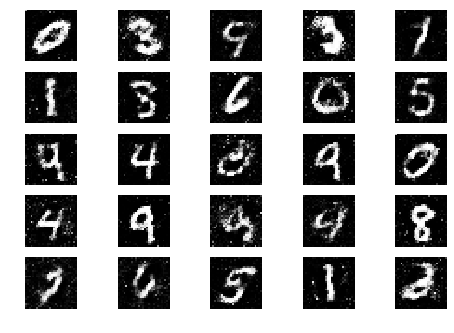

3951 [D loss: 0.666532, acc.: 60.16%] [G loss: 0.838838, acc.: 25.00%]
3952 [D loss: 0.678642, acc.: 58.98%] [G loss: 0.844318, acc.: 26.56%]
3953 [D loss: 0.653529, acc.: 63.67%] [G loss: 0.856523, acc.: 20.31%]
3954 [D loss: 0.658393, acc.: 64.45%] [G loss: 0.837420, acc.: 24.22%]
3955 [D loss: 0.694460, acc.: 53.91%] [G loss: 0.835234, acc.: 25.78%]
3956 [D loss: 0.650589, acc.: 62.11%] [G loss: 0.867672, acc.: 19.53%]
3957 [D loss: 0.643228, acc.: 67.19%] [G loss: 0.862331, acc.: 26.56%]
3958 [D loss: 0.656072, acc.: 62.50%] [G loss: 0.884731, acc.: 17.19%]
3959 [D loss: 0.663340, acc.: 62.89%] [G loss: 0.860646, acc.: 22.66%]
3960 [D loss: 0.631798, acc.: 64.45%] [G loss: 0.827849, acc.: 28.91%]
3961 [D loss: 0.659577, acc.: 61.72%] [G loss: 0.852793, acc.: 31.25%]
3962 [D loss: 0.641398, acc.: 66.41%] [G loss: 0.841876, acc.: 25.78%]
3963 [D loss: 0.649838, acc.: 63.67%] [G loss: 0.873483, acc.: 25.78%]
3964 [D loss: 0.659658, acc.: 60.16%] [G loss: 0.821633, acc.: 30.47%]
3965 [

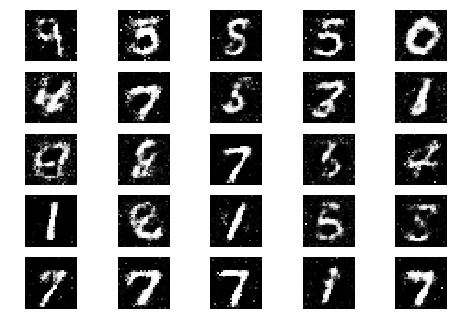

4001 [D loss: 0.662745, acc.: 59.77%] [G loss: 0.877403, acc.: 16.41%]
4002 [D loss: 0.627180, acc.: 65.62%] [G loss: 0.825938, acc.: 23.44%]
4003 [D loss: 0.663520, acc.: 59.38%] [G loss: 0.848514, acc.: 25.00%]
4004 [D loss: 0.654895, acc.: 61.72%] [G loss: 0.838049, acc.: 23.44%]
4005 [D loss: 0.657880, acc.: 63.28%] [G loss: 0.838159, acc.: 27.34%]
4006 [D loss: 0.657952, acc.: 60.94%] [G loss: 0.833764, acc.: 28.12%]
4007 [D loss: 0.640083, acc.: 64.45%] [G loss: 0.858967, acc.: 26.56%]
4008 [D loss: 0.653366, acc.: 60.16%] [G loss: 0.842140, acc.: 23.44%]
4009 [D loss: 0.643624, acc.: 64.45%] [G loss: 0.842171, acc.: 23.44%]
4010 [D loss: 0.653405, acc.: 60.94%] [G loss: 0.822805, acc.: 29.69%]
4011 [D loss: 0.663208, acc.: 62.50%] [G loss: 0.822816, acc.: 28.12%]
4012 [D loss: 0.647603, acc.: 64.84%] [G loss: 0.817226, acc.: 30.47%]
4013 [D loss: 0.652930, acc.: 63.67%] [G loss: 0.814687, acc.: 29.69%]
4014 [D loss: 0.661940, acc.: 62.50%] [G loss: 0.812203, acc.: 31.25%]
4015 [

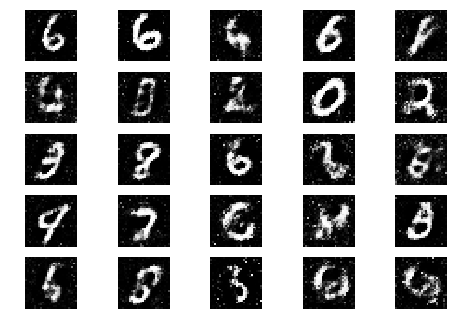

4051 [D loss: 0.654813, acc.: 65.23%] [G loss: 0.860291, acc.: 25.78%]
4052 [D loss: 0.648175, acc.: 62.50%] [G loss: 0.852440, acc.: 25.00%]
4053 [D loss: 0.657467, acc.: 57.81%] [G loss: 0.856569, acc.: 17.97%]
4054 [D loss: 0.644887, acc.: 59.38%] [G loss: 0.820803, acc.: 22.66%]
4055 [D loss: 0.657379, acc.: 63.28%] [G loss: 0.823467, acc.: 25.00%]
4056 [D loss: 0.642594, acc.: 65.23%] [G loss: 0.826267, acc.: 26.56%]
4057 [D loss: 0.655335, acc.: 66.02%] [G loss: 0.819919, acc.: 28.12%]
4058 [D loss: 0.663680, acc.: 62.50%] [G loss: 0.821859, acc.: 34.38%]
4059 [D loss: 0.651211, acc.: 61.72%] [G loss: 0.854986, acc.: 25.00%]
4060 [D loss: 0.670878, acc.: 59.77%] [G loss: 0.837292, acc.: 28.91%]
4061 [D loss: 0.649470, acc.: 65.62%] [G loss: 0.837161, acc.: 26.56%]
4062 [D loss: 0.656121, acc.: 63.67%] [G loss: 0.834595, acc.: 27.34%]
4063 [D loss: 0.646157, acc.: 64.84%] [G loss: 0.869627, acc.: 20.31%]
4064 [D loss: 0.676644, acc.: 61.33%] [G loss: 0.877800, acc.: 17.97%]
4065 [

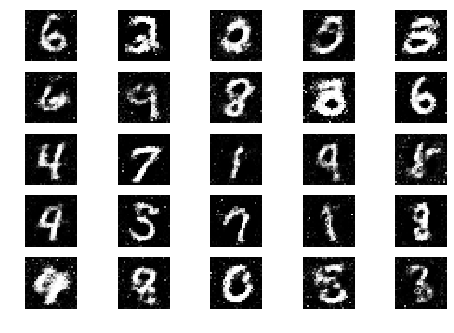

4101 [D loss: 0.672497, acc.: 52.73%] [G loss: 0.804421, acc.: 29.69%]
4102 [D loss: 0.636996, acc.: 64.45%] [G loss: 0.838625, acc.: 29.69%]
4103 [D loss: 0.633472, acc.: 65.23%] [G loss: 0.818050, acc.: 26.56%]
4104 [D loss: 0.623875, acc.: 67.58%] [G loss: 0.863860, acc.: 25.78%]
4105 [D loss: 0.674596, acc.: 57.81%] [G loss: 0.853689, acc.: 29.69%]
4106 [D loss: 0.636743, acc.: 65.23%] [G loss: 0.836437, acc.: 28.12%]
4107 [D loss: 0.634285, acc.: 63.28%] [G loss: 0.848599, acc.: 27.34%]
4108 [D loss: 0.637978, acc.: 65.23%] [G loss: 0.848747, acc.: 25.00%]
4109 [D loss: 0.671857, acc.: 55.47%] [G loss: 0.871231, acc.: 21.09%]
4110 [D loss: 0.636765, acc.: 67.19%] [G loss: 0.834420, acc.: 23.44%]
4111 [D loss: 0.648056, acc.: 63.67%] [G loss: 0.870581, acc.: 18.75%]
4112 [D loss: 0.654425, acc.: 60.55%] [G loss: 0.840244, acc.: 25.78%]
4113 [D loss: 0.668811, acc.: 58.98%] [G loss: 0.860219, acc.: 22.66%]
4114 [D loss: 0.663604, acc.: 64.06%] [G loss: 0.853540, acc.: 17.19%]
4115 [

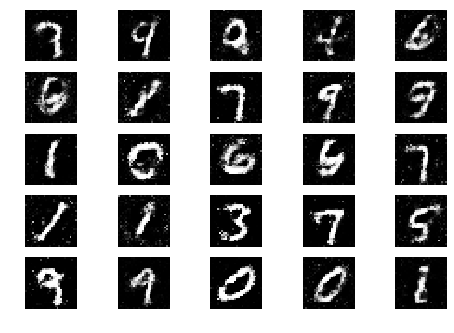

4151 [D loss: 0.635527, acc.: 67.58%] [G loss: 0.852680, acc.: 21.88%]
4152 [D loss: 0.644816, acc.: 61.33%] [G loss: 0.830009, acc.: 30.47%]
4153 [D loss: 0.650953, acc.: 62.11%] [G loss: 0.854746, acc.: 29.69%]
4154 [D loss: 0.685233, acc.: 56.25%] [G loss: 0.824683, acc.: 27.34%]
4155 [D loss: 0.658974, acc.: 56.64%] [G loss: 0.854457, acc.: 21.88%]
4156 [D loss: 0.645245, acc.: 60.16%] [G loss: 0.857369, acc.: 25.78%]
4157 [D loss: 0.655522, acc.: 59.77%] [G loss: 0.861631, acc.: 25.78%]
4158 [D loss: 0.665296, acc.: 59.38%] [G loss: 0.796046, acc.: 39.06%]
4159 [D loss: 0.677076, acc.: 58.20%] [G loss: 0.872426, acc.: 22.66%]
4160 [D loss: 0.660378, acc.: 65.23%] [G loss: 0.885373, acc.: 16.41%]
4161 [D loss: 0.657264, acc.: 58.98%] [G loss: 0.848302, acc.: 17.97%]
4162 [D loss: 0.661901, acc.: 60.16%] [G loss: 0.856141, acc.: 24.22%]
4163 [D loss: 0.653021, acc.: 62.89%] [G loss: 0.839647, acc.: 23.44%]
4164 [D loss: 0.644759, acc.: 64.84%] [G loss: 0.825263, acc.: 28.12%]
4165 [

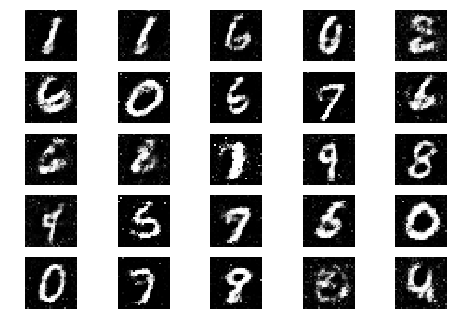

4201 [D loss: 0.651155, acc.: 60.55%] [G loss: 0.836547, acc.: 30.47%]
4202 [D loss: 0.664918, acc.: 59.38%] [G loss: 0.826589, acc.: 28.91%]
4203 [D loss: 0.651267, acc.: 61.33%] [G loss: 0.821163, acc.: 31.25%]
4204 [D loss: 0.660403, acc.: 59.77%] [G loss: 0.840511, acc.: 26.56%]
4205 [D loss: 0.645784, acc.: 66.02%] [G loss: 0.814557, acc.: 31.25%]
4206 [D loss: 0.675582, acc.: 58.59%] [G loss: 0.811754, acc.: 33.59%]
4207 [D loss: 0.645762, acc.: 63.28%] [G loss: 0.840603, acc.: 29.69%]
4208 [D loss: 0.654314, acc.: 59.77%] [G loss: 0.818992, acc.: 31.25%]
4209 [D loss: 0.663746, acc.: 62.11%] [G loss: 0.830246, acc.: 26.56%]
4210 [D loss: 0.639162, acc.: 64.45%] [G loss: 0.868592, acc.: 20.31%]
4211 [D loss: 0.665396, acc.: 57.42%] [G loss: 0.833506, acc.: 25.78%]
4212 [D loss: 0.663079, acc.: 61.33%] [G loss: 0.811889, acc.: 32.03%]
4213 [D loss: 0.651116, acc.: 62.11%] [G loss: 0.824963, acc.: 32.81%]
4214 [D loss: 0.674346, acc.: 54.69%] [G loss: 0.833894, acc.: 28.91%]
4215 [

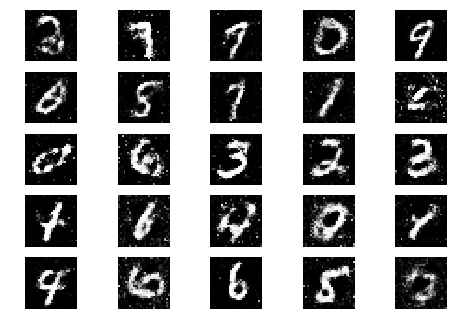

4251 [D loss: 0.666736, acc.: 63.67%] [G loss: 0.819481, acc.: 23.44%]
4252 [D loss: 0.636574, acc.: 67.97%] [G loss: 0.836738, acc.: 32.81%]
4253 [D loss: 0.667545, acc.: 60.16%] [G loss: 0.868652, acc.: 22.66%]
4254 [D loss: 0.660879, acc.: 60.16%] [G loss: 0.817832, acc.: 32.03%]
4255 [D loss: 0.663968, acc.: 59.77%] [G loss: 0.832052, acc.: 31.25%]
4256 [D loss: 0.632720, acc.: 66.02%] [G loss: 0.852003, acc.: 27.34%]
4257 [D loss: 0.651549, acc.: 62.50%] [G loss: 0.792508, acc.: 35.16%]
4258 [D loss: 0.674930, acc.: 55.86%] [G loss: 0.819974, acc.: 30.47%]
4259 [D loss: 0.678485, acc.: 56.64%] [G loss: 0.835667, acc.: 30.47%]
4260 [D loss: 0.664073, acc.: 55.86%] [G loss: 0.816478, acc.: 32.81%]
4261 [D loss: 0.677437, acc.: 62.11%] [G loss: 0.836477, acc.: 28.91%]
4262 [D loss: 0.673915, acc.: 55.08%] [G loss: 0.837069, acc.: 29.69%]
4263 [D loss: 0.678087, acc.: 56.64%] [G loss: 0.845814, acc.: 25.78%]
4264 [D loss: 0.676877, acc.: 57.42%] [G loss: 0.840430, acc.: 25.78%]
4265 [

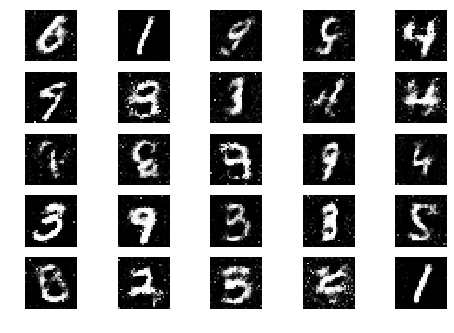

4301 [D loss: 0.664743, acc.: 56.25%] [G loss: 0.857262, acc.: 22.66%]
4302 [D loss: 0.656297, acc.: 60.16%] [G loss: 0.848731, acc.: 21.09%]
4303 [D loss: 0.638399, acc.: 66.02%] [G loss: 0.812791, acc.: 27.34%]
4304 [D loss: 0.673579, acc.: 57.81%] [G loss: 0.799580, acc.: 32.03%]
4305 [D loss: 0.649503, acc.: 64.84%] [G loss: 0.808619, acc.: 28.12%]
4306 [D loss: 0.639731, acc.: 66.41%] [G loss: 0.842918, acc.: 23.44%]
4307 [D loss: 0.649033, acc.: 60.94%] [G loss: 0.813849, acc.: 32.81%]
4308 [D loss: 0.633819, acc.: 63.28%] [G loss: 0.867049, acc.: 27.34%]
4309 [D loss: 0.662366, acc.: 59.38%] [G loss: 0.880881, acc.: 24.22%]
4310 [D loss: 0.664491, acc.: 61.33%] [G loss: 0.820466, acc.: 33.59%]
4311 [D loss: 0.670497, acc.: 62.11%] [G loss: 0.844567, acc.: 24.22%]
4312 [D loss: 0.643931, acc.: 64.06%] [G loss: 0.817330, acc.: 32.03%]
4313 [D loss: 0.650261, acc.: 62.11%] [G loss: 0.848114, acc.: 24.22%]
4314 [D loss: 0.680998, acc.: 54.69%] [G loss: 0.809454, acc.: 28.91%]
4315 [

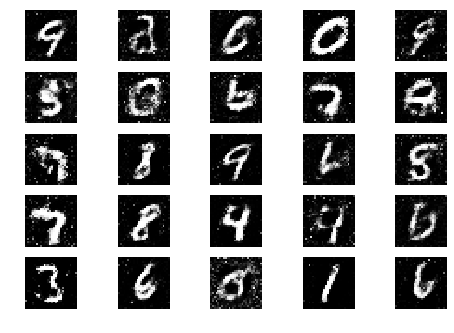

4351 [D loss: 0.660538, acc.: 58.59%] [G loss: 0.872212, acc.: 25.00%]
4352 [D loss: 0.686840, acc.: 54.69%] [G loss: 0.812412, acc.: 21.09%]
4353 [D loss: 0.635626, acc.: 66.41%] [G loss: 0.817999, acc.: 26.56%]
4354 [D loss: 0.632824, acc.: 65.23%] [G loss: 0.801264, acc.: 28.91%]
4355 [D loss: 0.651884, acc.: 62.11%] [G loss: 0.839539, acc.: 23.44%]
4356 [D loss: 0.649019, acc.: 64.06%] [G loss: 0.843853, acc.: 27.34%]
4357 [D loss: 0.639836, acc.: 66.02%] [G loss: 0.838027, acc.: 25.00%]
4358 [D loss: 0.671393, acc.: 62.11%] [G loss: 0.872787, acc.: 20.31%]
4359 [D loss: 0.665330, acc.: 58.59%] [G loss: 0.824178, acc.: 26.56%]
4360 [D loss: 0.643974, acc.: 62.50%] [G loss: 0.857224, acc.: 21.88%]
4361 [D loss: 0.659922, acc.: 61.33%] [G loss: 0.854612, acc.: 23.44%]
4362 [D loss: 0.694381, acc.: 53.52%] [G loss: 0.853608, acc.: 21.88%]
4363 [D loss: 0.657925, acc.: 59.77%] [G loss: 0.836426, acc.: 25.00%]
4364 [D loss: 0.647627, acc.: 65.23%] [G loss: 0.875810, acc.: 17.97%]
4365 [

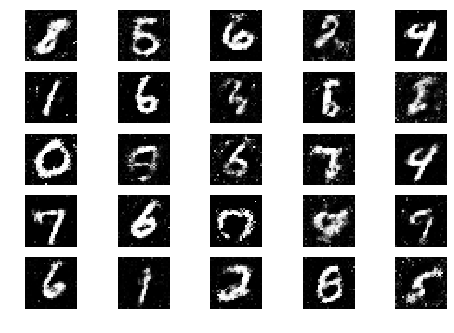

4401 [D loss: 0.643477, acc.: 63.67%] [G loss: 0.857384, acc.: 21.88%]
4402 [D loss: 0.685544, acc.: 56.25%] [G loss: 0.845310, acc.: 16.41%]
4403 [D loss: 0.639989, acc.: 67.97%] [G loss: 0.866719, acc.: 20.31%]
4404 [D loss: 0.678603, acc.: 58.98%] [G loss: 0.853181, acc.: 22.66%]
4405 [D loss: 0.638065, acc.: 67.97%] [G loss: 0.859062, acc.: 23.44%]
4406 [D loss: 0.648400, acc.: 59.77%] [G loss: 0.877627, acc.: 20.31%]
4407 [D loss: 0.657245, acc.: 59.38%] [G loss: 0.843157, acc.: 29.69%]
4408 [D loss: 0.662037, acc.: 60.55%] [G loss: 0.822110, acc.: 30.47%]
4409 [D loss: 0.653807, acc.: 66.02%] [G loss: 0.845692, acc.: 25.78%]
4410 [D loss: 0.658766, acc.: 61.33%] [G loss: 0.835814, acc.: 29.69%]
4411 [D loss: 0.680941, acc.: 59.38%] [G loss: 0.824820, acc.: 28.12%]
4412 [D loss: 0.674376, acc.: 57.81%] [G loss: 0.814766, acc.: 31.25%]
4413 [D loss: 0.657779, acc.: 60.16%] [G loss: 0.826412, acc.: 30.47%]
4414 [D loss: 0.676935, acc.: 56.25%] [G loss: 0.851206, acc.: 25.78%]
4415 [

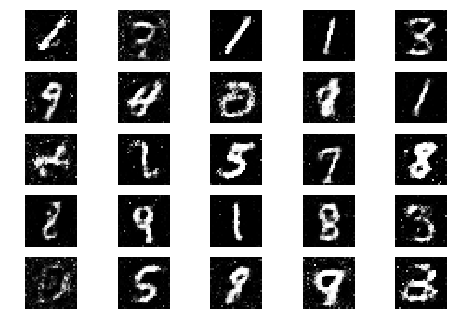

4451 [D loss: 0.665729, acc.: 59.77%] [G loss: 0.845802, acc.: 27.34%]
4452 [D loss: 0.653538, acc.: 61.72%] [G loss: 0.831252, acc.: 32.81%]
4453 [D loss: 0.636397, acc.: 64.45%] [G loss: 0.863951, acc.: 21.09%]
4454 [D loss: 0.658755, acc.: 60.16%] [G loss: 0.839411, acc.: 21.88%]
4455 [D loss: 0.657838, acc.: 61.72%] [G loss: 0.845140, acc.: 27.34%]
4456 [D loss: 0.658996, acc.: 58.59%] [G loss: 0.834415, acc.: 26.56%]
4457 [D loss: 0.660261, acc.: 60.16%] [G loss: 0.839244, acc.: 28.12%]
4458 [D loss: 0.671237, acc.: 55.47%] [G loss: 0.861875, acc.: 21.09%]
4459 [D loss: 0.652258, acc.: 62.50%] [G loss: 0.823640, acc.: 25.00%]
4460 [D loss: 0.639968, acc.: 67.19%] [G loss: 0.844606, acc.: 23.44%]
4461 [D loss: 0.664378, acc.: 60.55%] [G loss: 0.812402, acc.: 30.47%]
4462 [D loss: 0.667062, acc.: 60.94%] [G loss: 0.823867, acc.: 29.69%]
4463 [D loss: 0.651972, acc.: 62.50%] [G loss: 0.804535, acc.: 28.12%]
4464 [D loss: 0.671160, acc.: 56.64%] [G loss: 0.828240, acc.: 32.81%]
4465 [

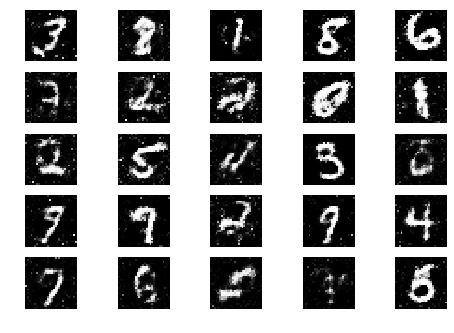

4501 [D loss: 0.656864, acc.: 61.33%] [G loss: 0.827016, acc.: 32.81%]
4502 [D loss: 0.665643, acc.: 60.94%] [G loss: 0.854596, acc.: 21.88%]
4503 [D loss: 0.650663, acc.: 68.36%] [G loss: 0.809877, acc.: 31.25%]
4504 [D loss: 0.660314, acc.: 60.94%] [G loss: 0.834731, acc.: 28.91%]
4505 [D loss: 0.657925, acc.: 61.72%] [G loss: 0.827113, acc.: 26.56%]
4506 [D loss: 0.669210, acc.: 60.55%] [G loss: 0.819490, acc.: 27.34%]
4507 [D loss: 0.670330, acc.: 55.86%] [G loss: 0.831708, acc.: 25.00%]
4508 [D loss: 0.671579, acc.: 58.59%] [G loss: 0.855435, acc.: 20.31%]
4509 [D loss: 0.655060, acc.: 62.11%] [G loss: 0.852194, acc.: 30.47%]
4510 [D loss: 0.667085, acc.: 55.86%] [G loss: 0.841007, acc.: 28.12%]
4511 [D loss: 0.659346, acc.: 63.28%] [G loss: 0.853888, acc.: 28.12%]
4512 [D loss: 0.632278, acc.: 63.67%] [G loss: 0.874131, acc.: 29.69%]
4513 [D loss: 0.667703, acc.: 53.91%] [G loss: 0.836608, acc.: 29.69%]
4514 [D loss: 0.664849, acc.: 58.59%] [G loss: 0.830447, acc.: 32.03%]
4515 [

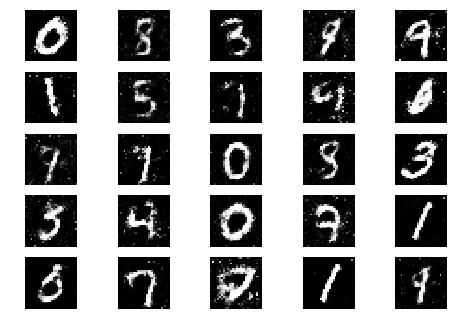

4551 [D loss: 0.662475, acc.: 58.98%] [G loss: 0.833184, acc.: 31.25%]
4552 [D loss: 0.661523, acc.: 60.16%] [G loss: 0.801125, acc.: 35.16%]
4553 [D loss: 0.656114, acc.: 61.33%] [G loss: 0.804630, acc.: 38.28%]
4554 [D loss: 0.659281, acc.: 58.98%] [G loss: 0.861736, acc.: 26.56%]
4555 [D loss: 0.654556, acc.: 62.89%] [G loss: 0.831643, acc.: 28.91%]
4556 [D loss: 0.647620, acc.: 62.50%] [G loss: 0.816789, acc.: 26.56%]
4557 [D loss: 0.685595, acc.: 55.86%] [G loss: 0.818005, acc.: 32.81%]
4558 [D loss: 0.671482, acc.: 54.69%] [G loss: 0.817223, acc.: 27.34%]
4559 [D loss: 0.651710, acc.: 62.50%] [G loss: 0.824998, acc.: 27.34%]
4560 [D loss: 0.662507, acc.: 60.55%] [G loss: 0.833016, acc.: 25.78%]
4561 [D loss: 0.641718, acc.: 65.23%] [G loss: 0.835411, acc.: 28.12%]
4562 [D loss: 0.662569, acc.: 60.55%] [G loss: 0.798753, acc.: 35.94%]
4563 [D loss: 0.644148, acc.: 65.62%] [G loss: 0.803257, acc.: 28.91%]
4564 [D loss: 0.647259, acc.: 63.28%] [G loss: 0.844101, acc.: 28.91%]
4565 [

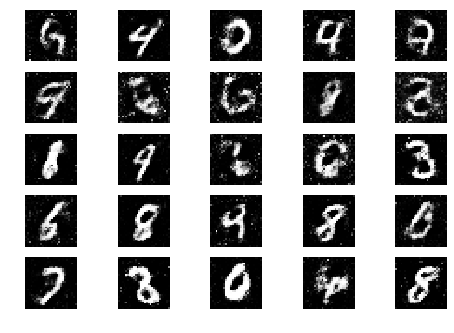

4601 [D loss: 0.625325, acc.: 64.45%] [G loss: 0.820634, acc.: 28.91%]
4602 [D loss: 0.661501, acc.: 58.98%] [G loss: 0.842185, acc.: 19.53%]
4603 [D loss: 0.647254, acc.: 62.11%] [G loss: 0.827569, acc.: 23.44%]
4604 [D loss: 0.635652, acc.: 63.28%] [G loss: 0.861109, acc.: 22.66%]
4605 [D loss: 0.652870, acc.: 60.16%] [G loss: 0.836705, acc.: 28.12%]
4606 [D loss: 0.662993, acc.: 60.55%] [G loss: 0.819388, acc.: 29.69%]
4607 [D loss: 0.659214, acc.: 59.38%] [G loss: 0.853337, acc.: 21.09%]
4608 [D loss: 0.633398, acc.: 62.89%] [G loss: 0.860297, acc.: 21.09%]
4609 [D loss: 0.658145, acc.: 61.33%] [G loss: 0.830264, acc.: 25.78%]
4610 [D loss: 0.672613, acc.: 55.86%] [G loss: 0.858696, acc.: 16.41%]
4611 [D loss: 0.651454, acc.: 62.50%] [G loss: 0.858399, acc.: 20.31%]
4612 [D loss: 0.652684, acc.: 60.94%] [G loss: 0.834518, acc.: 23.44%]
4613 [D loss: 0.646583, acc.: 66.02%] [G loss: 0.823323, acc.: 28.91%]
4614 [D loss: 0.680235, acc.: 57.42%] [G loss: 0.814686, acc.: 32.81%]
4615 [

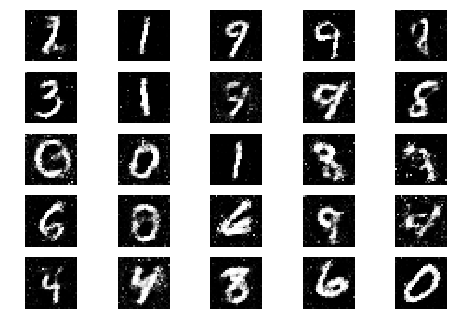

4651 [D loss: 0.653465, acc.: 60.94%] [G loss: 0.837865, acc.: 28.91%]
4652 [D loss: 0.663687, acc.: 58.98%] [G loss: 0.847913, acc.: 25.78%]
4653 [D loss: 0.673332, acc.: 57.03%] [G loss: 0.843320, acc.: 20.31%]
4654 [D loss: 0.667022, acc.: 62.50%] [G loss: 0.867183, acc.: 28.91%]
4655 [D loss: 0.672707, acc.: 53.91%] [G loss: 0.850701, acc.: 22.66%]
4656 [D loss: 0.647086, acc.: 61.72%] [G loss: 0.850367, acc.: 24.22%]
4657 [D loss: 0.663449, acc.: 63.28%] [G loss: 0.822342, acc.: 33.59%]
4658 [D loss: 0.647510, acc.: 65.23%] [G loss: 0.839261, acc.: 28.91%]
4659 [D loss: 0.668229, acc.: 60.16%] [G loss: 0.828791, acc.: 33.59%]
4660 [D loss: 0.664134, acc.: 60.94%] [G loss: 0.829366, acc.: 31.25%]
4661 [D loss: 0.673135, acc.: 61.33%] [G loss: 0.831649, acc.: 33.59%]
4662 [D loss: 0.644105, acc.: 63.28%] [G loss: 0.859151, acc.: 25.00%]
4663 [D loss: 0.655453, acc.: 58.59%] [G loss: 0.875146, acc.: 21.88%]
4664 [D loss: 0.669180, acc.: 58.98%] [G loss: 0.859600, acc.: 22.66%]
4665 [

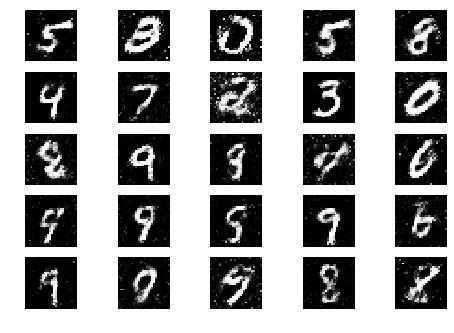

4701 [D loss: 0.658697, acc.: 57.81%] [G loss: 0.818314, acc.: 30.47%]
4702 [D loss: 0.654346, acc.: 59.77%] [G loss: 0.872724, acc.: 25.78%]
4703 [D loss: 0.683649, acc.: 55.08%] [G loss: 0.872947, acc.: 25.78%]
4704 [D loss: 0.678868, acc.: 58.98%] [G loss: 0.861282, acc.: 22.66%]
4705 [D loss: 0.668275, acc.: 57.81%] [G loss: 0.850008, acc.: 25.00%]
4706 [D loss: 0.664631, acc.: 58.59%] [G loss: 0.845456, acc.: 21.88%]
4707 [D loss: 0.657165, acc.: 62.11%] [G loss: 0.827006, acc.: 25.78%]
4708 [D loss: 0.665026, acc.: 56.64%] [G loss: 0.835865, acc.: 27.34%]
4709 [D loss: 0.661098, acc.: 63.28%] [G loss: 0.839412, acc.: 25.00%]
4710 [D loss: 0.658890, acc.: 59.77%] [G loss: 0.861054, acc.: 21.09%]
4711 [D loss: 0.664363, acc.: 62.11%] [G loss: 0.837770, acc.: 25.78%]
4712 [D loss: 0.651796, acc.: 61.33%] [G loss: 0.850411, acc.: 21.88%]
4713 [D loss: 0.642170, acc.: 64.06%] [G loss: 0.830932, acc.: 31.25%]
4714 [D loss: 0.673537, acc.: 57.81%] [G loss: 0.848696, acc.: 24.22%]
4715 [

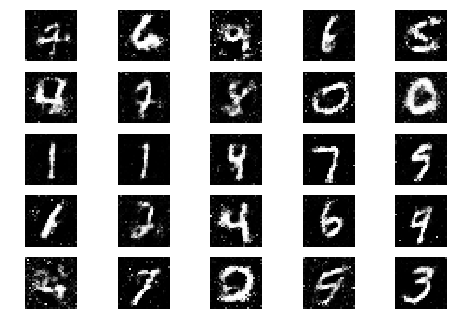

4751 [D loss: 0.670006, acc.: 58.20%] [G loss: 0.817514, acc.: 27.34%]
4752 [D loss: 0.655346, acc.: 61.72%] [G loss: 0.836306, acc.: 25.78%]
4753 [D loss: 0.637597, acc.: 64.06%] [G loss: 0.837641, acc.: 25.00%]
4754 [D loss: 0.667814, acc.: 56.25%] [G loss: 0.834453, acc.: 26.56%]
4755 [D loss: 0.666006, acc.: 55.86%] [G loss: 0.823952, acc.: 27.34%]
4756 [D loss: 0.669886, acc.: 59.38%] [G loss: 0.814672, acc.: 25.00%]
4757 [D loss: 0.657232, acc.: 60.16%] [G loss: 0.864601, acc.: 25.00%]
4758 [D loss: 0.650123, acc.: 60.94%] [G loss: 0.851133, acc.: 28.12%]
4759 [D loss: 0.665972, acc.: 61.72%] [G loss: 0.838471, acc.: 22.66%]
4760 [D loss: 0.650712, acc.: 60.55%] [G loss: 0.849133, acc.: 27.34%]
4761 [D loss: 0.660941, acc.: 61.33%] [G loss: 0.834266, acc.: 25.00%]
4762 [D loss: 0.669078, acc.: 58.98%] [G loss: 0.860149, acc.: 21.09%]
4763 [D loss: 0.661330, acc.: 62.50%] [G loss: 0.809711, acc.: 26.56%]
4764 [D loss: 0.650697, acc.: 64.06%] [G loss: 0.842533, acc.: 22.66%]
4765 [

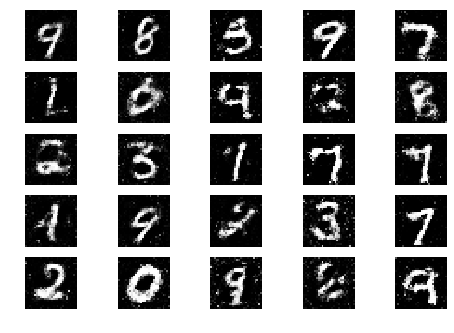

4801 [D loss: 0.667598, acc.: 60.55%] [G loss: 0.827226, acc.: 26.56%]
4802 [D loss: 0.673410, acc.: 57.81%] [G loss: 0.840686, acc.: 26.56%]
4803 [D loss: 0.648656, acc.: 62.89%] [G loss: 0.841537, acc.: 27.34%]
4804 [D loss: 0.691071, acc.: 57.03%] [G loss: 0.815015, acc.: 32.03%]
4805 [D loss: 0.652554, acc.: 63.67%] [G loss: 0.862840, acc.: 21.88%]
4806 [D loss: 0.663155, acc.: 58.98%] [G loss: 0.831869, acc.: 26.56%]
4807 [D loss: 0.651070, acc.: 67.58%] [G loss: 0.812966, acc.: 31.25%]
4808 [D loss: 0.673195, acc.: 59.38%] [G loss: 0.844370, acc.: 19.53%]
4809 [D loss: 0.651157, acc.: 60.94%] [G loss: 0.827862, acc.: 25.78%]
4810 [D loss: 0.662340, acc.: 66.02%] [G loss: 0.820927, acc.: 26.56%]
4811 [D loss: 0.666746, acc.: 58.98%] [G loss: 0.816304, acc.: 25.00%]
4812 [D loss: 0.675068, acc.: 55.86%] [G loss: 0.805845, acc.: 32.81%]
4813 [D loss: 0.636210, acc.: 67.58%] [G loss: 0.818076, acc.: 32.03%]
4814 [D loss: 0.651970, acc.: 60.55%] [G loss: 0.789352, acc.: 34.38%]
4815 [

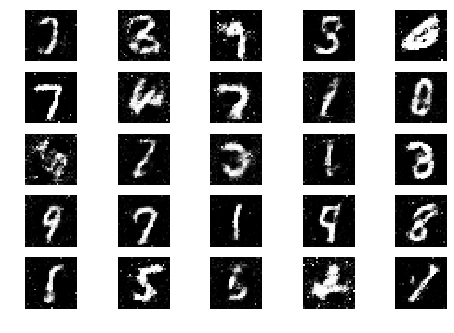

4851 [D loss: 0.653705, acc.: 62.50%] [G loss: 0.832573, acc.: 31.25%]
4852 [D loss: 0.682690, acc.: 56.25%] [G loss: 0.840882, acc.: 26.56%]
4853 [D loss: 0.666735, acc.: 61.33%] [G loss: 0.827980, acc.: 32.03%]
4854 [D loss: 0.687761, acc.: 56.64%] [G loss: 0.858996, acc.: 25.00%]
4855 [D loss: 0.653469, acc.: 64.84%] [G loss: 0.833501, acc.: 24.22%]
4856 [D loss: 0.656471, acc.: 59.77%] [G loss: 0.831959, acc.: 25.78%]
4857 [D loss: 0.664952, acc.: 57.81%] [G loss: 0.861184, acc.: 31.25%]
4858 [D loss: 0.664594, acc.: 60.16%] [G loss: 0.835009, acc.: 31.25%]
4859 [D loss: 0.677317, acc.: 60.94%] [G loss: 0.839556, acc.: 25.00%]
4860 [D loss: 0.688010, acc.: 55.08%] [G loss: 0.852763, acc.: 30.47%]
4861 [D loss: 0.644177, acc.: 60.55%] [G loss: 0.828719, acc.: 26.56%]
4862 [D loss: 0.680812, acc.: 58.20%] [G loss: 0.794347, acc.: 33.59%]
4863 [D loss: 0.648473, acc.: 64.84%] [G loss: 0.800885, acc.: 33.59%]
4864 [D loss: 0.637751, acc.: 63.67%] [G loss: 0.792623, acc.: 35.94%]
4865 [

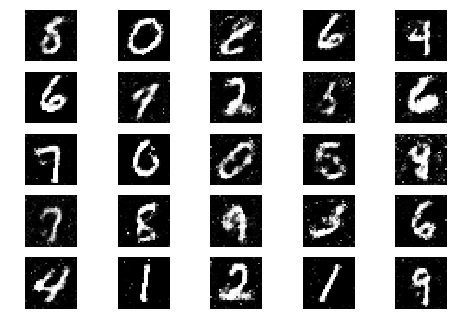

4901 [D loss: 0.656813, acc.: 58.20%] [G loss: 0.825325, acc.: 29.69%]
4902 [D loss: 0.652330, acc.: 62.50%] [G loss: 0.856822, acc.: 25.78%]
4903 [D loss: 0.684070, acc.: 55.47%] [G loss: 0.822035, acc.: 27.34%]
4904 [D loss: 0.673429, acc.: 61.33%] [G loss: 0.833109, acc.: 27.34%]
4905 [D loss: 0.659274, acc.: 58.59%] [G loss: 0.863165, acc.: 18.75%]
4906 [D loss: 0.631978, acc.: 68.36%] [G loss: 0.870399, acc.: 18.75%]
4907 [D loss: 0.657695, acc.: 58.59%] [G loss: 0.876437, acc.: 21.88%]
4908 [D loss: 0.662421, acc.: 56.64%] [G loss: 0.829920, acc.: 25.78%]
4909 [D loss: 0.674931, acc.: 55.47%] [G loss: 0.787511, acc.: 38.28%]
4910 [D loss: 0.672831, acc.: 58.98%] [G loss: 0.796568, acc.: 27.34%]
4911 [D loss: 0.658301, acc.: 62.50%] [G loss: 0.823087, acc.: 25.78%]
4912 [D loss: 0.651408, acc.: 64.84%] [G loss: 0.814003, acc.: 27.34%]
4913 [D loss: 0.666553, acc.: 62.50%] [G loss: 0.827614, acc.: 27.34%]
4914 [D loss: 0.667922, acc.: 58.59%] [G loss: 0.847697, acc.: 27.34%]
4915 [

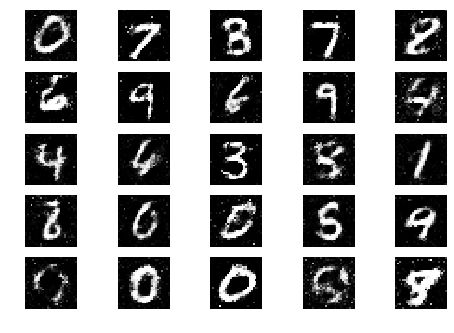

4951 [D loss: 0.671855, acc.: 57.42%] [G loss: 0.856352, acc.: 28.12%]
4952 [D loss: 0.679579, acc.: 56.64%] [G loss: 0.842006, acc.: 29.69%]
4953 [D loss: 0.638270, acc.: 64.06%] [G loss: 0.844937, acc.: 21.09%]
4954 [D loss: 0.662480, acc.: 62.50%] [G loss: 0.829205, acc.: 25.78%]
4955 [D loss: 0.687646, acc.: 59.38%] [G loss: 0.849143, acc.: 21.09%]
4956 [D loss: 0.661101, acc.: 62.89%] [G loss: 0.820177, acc.: 32.81%]
4957 [D loss: 0.679316, acc.: 53.52%] [G loss: 0.823936, acc.: 28.91%]
4958 [D loss: 0.678915, acc.: 59.38%] [G loss: 0.833679, acc.: 23.44%]
4959 [D loss: 0.692856, acc.: 51.17%] [G loss: 0.799808, acc.: 32.03%]
4960 [D loss: 0.653974, acc.: 66.02%] [G loss: 0.836591, acc.: 25.78%]
4961 [D loss: 0.652459, acc.: 66.80%] [G loss: 0.804434, acc.: 26.56%]
4962 [D loss: 0.673316, acc.: 59.38%] [G loss: 0.825842, acc.: 26.56%]
4963 [D loss: 0.686828, acc.: 53.91%] [G loss: 0.832362, acc.: 26.56%]
4964 [D loss: 0.672128, acc.: 60.94%] [G loss: 0.838023, acc.: 22.66%]
4965 [

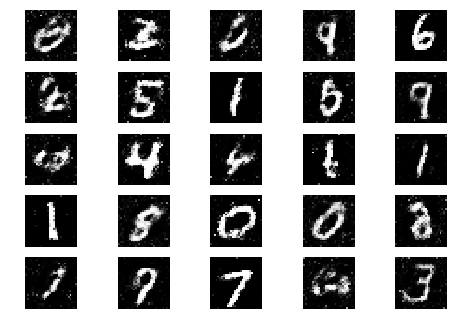

5001 [D loss: 0.644078, acc.: 66.80%] [G loss: 0.825370, acc.: 28.91%]
5002 [D loss: 0.666885, acc.: 57.03%] [G loss: 0.844458, acc.: 30.47%]
5003 [D loss: 0.682927, acc.: 54.69%] [G loss: 0.844773, acc.: 26.56%]
5004 [D loss: 0.667156, acc.: 60.55%] [G loss: 0.836690, acc.: 20.31%]
5005 [D loss: 0.670097, acc.: 59.38%] [G loss: 0.837646, acc.: 29.69%]
5006 [D loss: 0.670708, acc.: 62.11%] [G loss: 0.888771, acc.: 19.53%]
5007 [D loss: 0.647383, acc.: 64.06%] [G loss: 0.831920, acc.: 28.12%]
5008 [D loss: 0.645638, acc.: 62.50%] [G loss: 0.847009, acc.: 23.44%]
5009 [D loss: 0.673924, acc.: 57.03%] [G loss: 0.824205, acc.: 31.25%]
5010 [D loss: 0.666731, acc.: 62.11%] [G loss: 0.872276, acc.: 21.88%]
5011 [D loss: 0.682028, acc.: 59.38%] [G loss: 0.849747, acc.: 28.12%]
5012 [D loss: 0.658074, acc.: 58.59%] [G loss: 0.849388, acc.: 25.00%]
5013 [D loss: 0.674060, acc.: 59.38%] [G loss: 0.860422, acc.: 24.22%]
5014 [D loss: 0.672524, acc.: 59.38%] [G loss: 0.818650, acc.: 21.09%]
5015 [

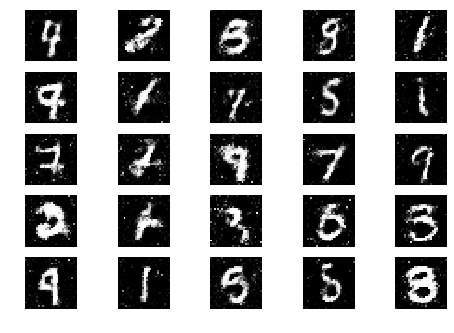

5051 [D loss: 0.684121, acc.: 55.47%] [G loss: 0.859496, acc.: 25.00%]
5052 [D loss: 0.670076, acc.: 59.77%] [G loss: 0.844100, acc.: 24.22%]
5053 [D loss: 0.646551, acc.: 64.45%] [G loss: 0.814741, acc.: 27.34%]
5054 [D loss: 0.674756, acc.: 55.86%] [G loss: 0.847787, acc.: 28.12%]
5055 [D loss: 0.648165, acc.: 64.06%] [G loss: 0.867112, acc.: 26.56%]
5056 [D loss: 0.668283, acc.: 57.42%] [G loss: 0.849425, acc.: 21.09%]
5057 [D loss: 0.670867, acc.: 57.03%] [G loss: 0.827935, acc.: 21.09%]
5058 [D loss: 0.677377, acc.: 57.81%] [G loss: 0.817160, acc.: 28.12%]
5059 [D loss: 0.656853, acc.: 61.33%] [G loss: 0.831299, acc.: 25.00%]
5060 [D loss: 0.650297, acc.: 58.98%] [G loss: 0.823596, acc.: 26.56%]
5061 [D loss: 0.679871, acc.: 59.77%] [G loss: 0.783347, acc.: 30.47%]
5062 [D loss: 0.682261, acc.: 55.86%] [G loss: 0.843037, acc.: 28.91%]
5063 [D loss: 0.651869, acc.: 60.55%] [G loss: 0.801796, acc.: 31.25%]
5064 [D loss: 0.667935, acc.: 60.55%] [G loss: 0.857653, acc.: 27.34%]
5065 [

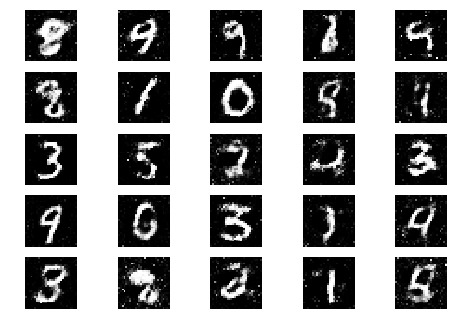

5101 [D loss: 0.674376, acc.: 61.72%] [G loss: 0.845722, acc.: 26.56%]
5102 [D loss: 0.652448, acc.: 60.55%] [G loss: 0.835827, acc.: 30.47%]
5103 [D loss: 0.688676, acc.: 57.03%] [G loss: 0.850435, acc.: 27.34%]
5104 [D loss: 0.664752, acc.: 58.98%] [G loss: 0.834608, acc.: 31.25%]
5105 [D loss: 0.675489, acc.: 56.64%] [G loss: 0.852072, acc.: 22.66%]
5106 [D loss: 0.662277, acc.: 62.50%] [G loss: 0.830520, acc.: 22.66%]
5107 [D loss: 0.685227, acc.: 55.08%] [G loss: 0.832290, acc.: 21.88%]
5108 [D loss: 0.658019, acc.: 60.94%] [G loss: 0.844983, acc.: 21.88%]
5109 [D loss: 0.667587, acc.: 60.55%] [G loss: 0.839363, acc.: 28.12%]
5110 [D loss: 0.651973, acc.: 60.55%] [G loss: 0.814488, acc.: 29.69%]
5111 [D loss: 0.669060, acc.: 57.81%] [G loss: 0.869013, acc.: 24.22%]
5112 [D loss: 0.680976, acc.: 54.69%] [G loss: 0.888736, acc.: 24.22%]
5113 [D loss: 0.663351, acc.: 62.50%] [G loss: 0.842806, acc.: 28.91%]
5114 [D loss: 0.680186, acc.: 57.81%] [G loss: 0.807855, acc.: 30.47%]
5115 [

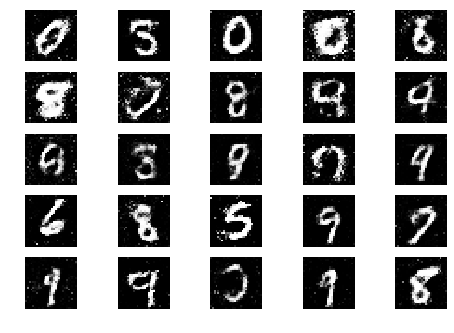

5151 [D loss: 0.665199, acc.: 64.06%] [G loss: 0.835939, acc.: 28.12%]
5152 [D loss: 0.666599, acc.: 59.77%] [G loss: 0.828703, acc.: 25.78%]
5153 [D loss: 0.653068, acc.: 64.84%] [G loss: 0.830039, acc.: 27.34%]
5154 [D loss: 0.659487, acc.: 60.55%] [G loss: 0.812170, acc.: 31.25%]
5155 [D loss: 0.681593, acc.: 56.25%] [G loss: 0.851519, acc.: 22.66%]
5156 [D loss: 0.679411, acc.: 56.64%] [G loss: 0.852042, acc.: 26.56%]
5157 [D loss: 0.671611, acc.: 57.81%] [G loss: 0.851296, acc.: 18.75%]
5158 [D loss: 0.664746, acc.: 59.77%] [G loss: 0.805098, acc.: 32.81%]
5159 [D loss: 0.654261, acc.: 61.33%] [G loss: 0.848032, acc.: 28.12%]
5160 [D loss: 0.662434, acc.: 61.72%] [G loss: 0.820347, acc.: 25.00%]
5161 [D loss: 0.653987, acc.: 58.59%] [G loss: 0.849540, acc.: 25.00%]
5162 [D loss: 0.648329, acc.: 64.45%] [G loss: 0.820163, acc.: 29.69%]
5163 [D loss: 0.684162, acc.: 56.64%] [G loss: 0.835507, acc.: 24.22%]
5164 [D loss: 0.653899, acc.: 64.45%] [G loss: 0.856297, acc.: 26.56%]
5165 [

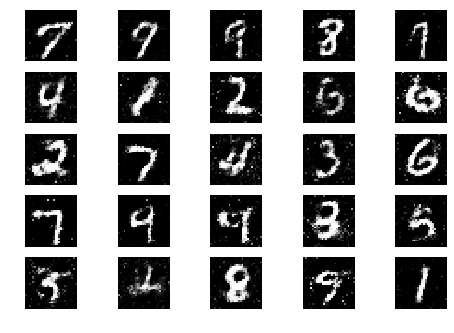

5201 [D loss: 0.653166, acc.: 59.77%] [G loss: 0.846075, acc.: 28.12%]
5202 [D loss: 0.646474, acc.: 62.89%] [G loss: 0.823916, acc.: 28.12%]
5203 [D loss: 0.657976, acc.: 62.50%] [G loss: 0.843470, acc.: 22.66%]
5204 [D loss: 0.669771, acc.: 59.77%] [G loss: 0.824284, acc.: 29.69%]
5205 [D loss: 0.661623, acc.: 59.38%] [G loss: 0.838059, acc.: 28.12%]
5206 [D loss: 0.670660, acc.: 57.42%] [G loss: 0.860546, acc.: 27.34%]
5207 [D loss: 0.682058, acc.: 58.98%] [G loss: 0.832949, acc.: 33.59%]
5208 [D loss: 0.650498, acc.: 64.84%] [G loss: 0.847119, acc.: 26.56%]
5209 [D loss: 0.667154, acc.: 60.16%] [G loss: 0.808851, acc.: 30.47%]
5210 [D loss: 0.671532, acc.: 57.81%] [G loss: 0.827950, acc.: 26.56%]
5211 [D loss: 0.684903, acc.: 59.77%] [G loss: 0.819553, acc.: 28.91%]
5212 [D loss: 0.650621, acc.: 61.33%] [G loss: 0.826290, acc.: 26.56%]
5213 [D loss: 0.644941, acc.: 62.89%] [G loss: 0.839609, acc.: 19.53%]
5214 [D loss: 0.650433, acc.: 63.67%] [G loss: 0.836335, acc.: 26.56%]
5215 [

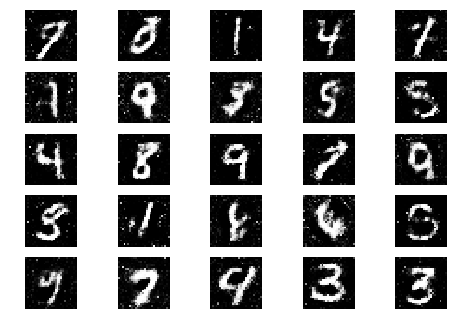

5251 [D loss: 0.649021, acc.: 60.16%] [G loss: 0.855576, acc.: 26.56%]
5252 [D loss: 0.654449, acc.: 57.42%] [G loss: 0.891994, acc.: 17.97%]
5253 [D loss: 0.677555, acc.: 60.16%] [G loss: 0.837113, acc.: 21.09%]
5254 [D loss: 0.674733, acc.: 58.59%] [G loss: 0.837559, acc.: 25.00%]
5255 [D loss: 0.645636, acc.: 64.84%] [G loss: 0.855428, acc.: 21.09%]
5256 [D loss: 0.665976, acc.: 60.55%] [G loss: 0.857114, acc.: 20.31%]
5257 [D loss: 0.690143, acc.: 57.81%] [G loss: 0.835885, acc.: 19.53%]
5258 [D loss: 0.656796, acc.: 64.06%] [G loss: 0.821608, acc.: 25.00%]
5259 [D loss: 0.676150, acc.: 56.64%] [G loss: 0.841966, acc.: 28.91%]
5260 [D loss: 0.647593, acc.: 63.67%] [G loss: 0.830364, acc.: 21.88%]
5261 [D loss: 0.649138, acc.: 62.50%] [G loss: 0.830704, acc.: 24.22%]
5262 [D loss: 0.658456, acc.: 61.72%] [G loss: 0.827709, acc.: 27.34%]
5263 [D loss: 0.663461, acc.: 61.33%] [G loss: 0.847866, acc.: 22.66%]
5264 [D loss: 0.665664, acc.: 61.33%] [G loss: 0.828572, acc.: 24.22%]
5265 [

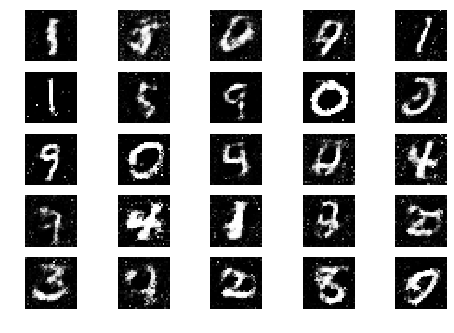

5301 [D loss: 0.649829, acc.: 64.06%] [G loss: 0.820133, acc.: 33.59%]
5302 [D loss: 0.648440, acc.: 63.28%] [G loss: 0.839920, acc.: 27.34%]
5303 [D loss: 0.669835, acc.: 56.64%] [G loss: 0.836530, acc.: 25.00%]
5304 [D loss: 0.649819, acc.: 62.50%] [G loss: 0.835597, acc.: 25.00%]
5305 [D loss: 0.652448, acc.: 59.77%] [G loss: 0.832758, acc.: 25.00%]
5306 [D loss: 0.676575, acc.: 55.47%] [G loss: 0.844463, acc.: 24.22%]
5307 [D loss: 0.649597, acc.: 63.28%] [G loss: 0.829352, acc.: 28.91%]
5308 [D loss: 0.661371, acc.: 60.55%] [G loss: 0.846959, acc.: 25.00%]
5309 [D loss: 0.679516, acc.: 52.34%] [G loss: 0.840930, acc.: 25.78%]
5310 [D loss: 0.677278, acc.: 53.52%] [G loss: 0.854943, acc.: 20.31%]
5311 [D loss: 0.683384, acc.: 55.08%] [G loss: 0.844216, acc.: 32.03%]
5312 [D loss: 0.674613, acc.: 57.42%] [G loss: 0.842280, acc.: 20.31%]
5313 [D loss: 0.652013, acc.: 64.06%] [G loss: 0.846998, acc.: 25.00%]
5314 [D loss: 0.675725, acc.: 57.03%] [G loss: 0.797053, acc.: 27.34%]
5315 [

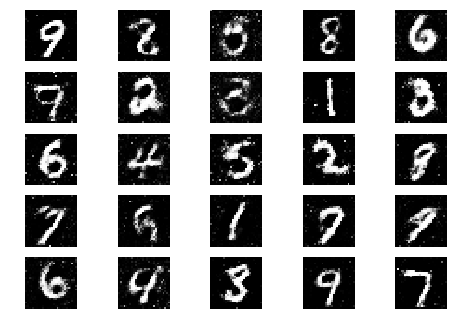

5351 [D loss: 0.661931, acc.: 60.16%] [G loss: 0.827993, acc.: 30.47%]
5352 [D loss: 0.655216, acc.: 61.33%] [G loss: 0.826033, acc.: 28.12%]
5353 [D loss: 0.687124, acc.: 53.52%] [G loss: 0.836694, acc.: 25.00%]
5354 [D loss: 0.639644, acc.: 63.28%] [G loss: 0.838070, acc.: 25.78%]
5355 [D loss: 0.675233, acc.: 57.03%] [G loss: 0.854682, acc.: 21.09%]
5356 [D loss: 0.662310, acc.: 59.38%] [G loss: 0.838756, acc.: 33.59%]
5357 [D loss: 0.673504, acc.: 57.42%] [G loss: 0.863485, acc.: 27.34%]
5358 [D loss: 0.661962, acc.: 62.11%] [G loss: 0.857367, acc.: 24.22%]
5359 [D loss: 0.695668, acc.: 48.83%] [G loss: 0.806406, acc.: 29.69%]
5360 [D loss: 0.643571, acc.: 61.72%] [G loss: 0.800829, acc.: 32.81%]
5361 [D loss: 0.654351, acc.: 62.50%] [G loss: 0.828605, acc.: 25.78%]
5362 [D loss: 0.659367, acc.: 57.81%] [G loss: 0.794727, acc.: 35.16%]
5363 [D loss: 0.656661, acc.: 55.47%] [G loss: 0.813396, acc.: 28.12%]
5364 [D loss: 0.655867, acc.: 60.55%] [G loss: 0.823674, acc.: 32.81%]
5365 [

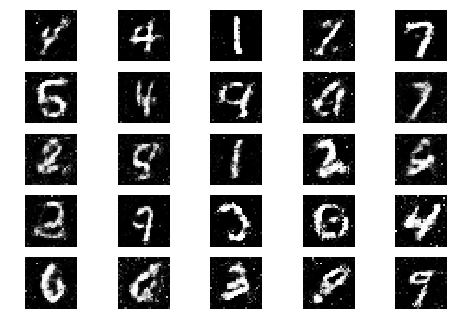

5401 [D loss: 0.654165, acc.: 61.33%] [G loss: 0.844465, acc.: 24.22%]
5402 [D loss: 0.663281, acc.: 64.06%] [G loss: 0.811387, acc.: 28.12%]
5403 [D loss: 0.672892, acc.: 58.59%] [G loss: 0.833102, acc.: 25.00%]
5404 [D loss: 0.666078, acc.: 58.59%] [G loss: 0.807270, acc.: 31.25%]
5405 [D loss: 0.662797, acc.: 59.77%] [G loss: 0.808354, acc.: 35.16%]
5406 [D loss: 0.680708, acc.: 56.25%] [G loss: 0.879051, acc.: 20.31%]
5407 [D loss: 0.669061, acc.: 58.20%] [G loss: 0.857057, acc.: 21.09%]
5408 [D loss: 0.659743, acc.: 60.94%] [G loss: 0.806785, acc.: 32.03%]
5409 [D loss: 0.667791, acc.: 58.20%] [G loss: 0.850349, acc.: 25.00%]
5410 [D loss: 0.661036, acc.: 55.08%] [G loss: 0.834552, acc.: 23.44%]
5411 [D loss: 0.640971, acc.: 67.97%] [G loss: 0.862664, acc.: 28.12%]
5412 [D loss: 0.675715, acc.: 57.42%] [G loss: 0.843480, acc.: 27.34%]
5413 [D loss: 0.697919, acc.: 53.91%] [G loss: 0.825417, acc.: 26.56%]
5414 [D loss: 0.676435, acc.: 57.81%] [G loss: 0.824998, acc.: 25.00%]
5415 [

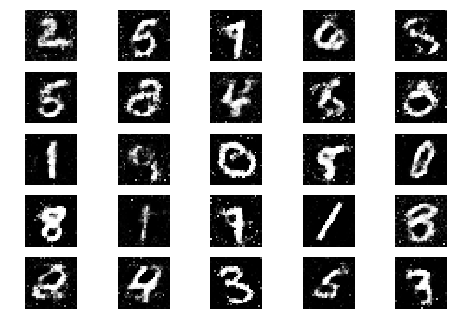

5451 [D loss: 0.655805, acc.: 64.84%] [G loss: 0.811584, acc.: 30.47%]
5452 [D loss: 0.635676, acc.: 66.80%] [G loss: 0.843332, acc.: 25.78%]
5453 [D loss: 0.644789, acc.: 59.77%] [G loss: 0.862204, acc.: 18.75%]
5454 [D loss: 0.659372, acc.: 62.50%] [G loss: 0.820919, acc.: 24.22%]
5455 [D loss: 0.682588, acc.: 52.34%] [G loss: 0.817602, acc.: 28.91%]
5456 [D loss: 0.655150, acc.: 60.94%] [G loss: 0.822667, acc.: 27.34%]
5457 [D loss: 0.659205, acc.: 61.72%] [G loss: 0.835835, acc.: 28.12%]
5458 [D loss: 0.687306, acc.: 58.98%] [G loss: 0.831699, acc.: 27.34%]
5459 [D loss: 0.657023, acc.: 59.38%] [G loss: 0.841068, acc.: 25.00%]
5460 [D loss: 0.674182, acc.: 57.42%] [G loss: 0.819796, acc.: 27.34%]
5461 [D loss: 0.666735, acc.: 60.55%] [G loss: 0.829418, acc.: 25.78%]
5462 [D loss: 0.658090, acc.: 61.72%] [G loss: 0.825242, acc.: 26.56%]
5463 [D loss: 0.644453, acc.: 62.11%] [G loss: 0.879687, acc.: 20.31%]
5464 [D loss: 0.661020, acc.: 59.38%] [G loss: 0.854769, acc.: 22.66%]
5465 [

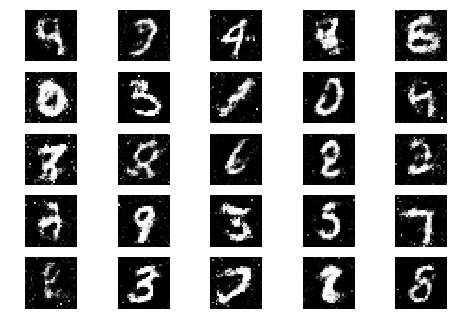

5501 [D loss: 0.693922, acc.: 53.91%] [G loss: 0.835570, acc.: 22.66%]
5502 [D loss: 0.707195, acc.: 49.22%] [G loss: 0.823047, acc.: 25.00%]
5503 [D loss: 0.653089, acc.: 60.94%] [G loss: 0.847379, acc.: 25.78%]
5504 [D loss: 0.655940, acc.: 62.50%] [G loss: 0.841012, acc.: 25.78%]
5505 [D loss: 0.650881, acc.: 62.50%] [G loss: 0.835413, acc.: 23.44%]
5506 [D loss: 0.677854, acc.: 56.25%] [G loss: 0.830449, acc.: 25.00%]
5507 [D loss: 0.676491, acc.: 53.91%] [G loss: 0.840150, acc.: 25.78%]
5508 [D loss: 0.662595, acc.: 58.98%] [G loss: 0.850069, acc.: 28.91%]
5509 [D loss: 0.658297, acc.: 62.89%] [G loss: 0.819422, acc.: 30.47%]
5510 [D loss: 0.665174, acc.: 60.55%] [G loss: 0.842303, acc.: 25.78%]
5511 [D loss: 0.654999, acc.: 64.45%] [G loss: 0.837415, acc.: 26.56%]
5512 [D loss: 0.678148, acc.: 58.59%] [G loss: 0.829031, acc.: 28.91%]
5513 [D loss: 0.678732, acc.: 54.69%] [G loss: 0.829148, acc.: 21.88%]
5514 [D loss: 0.673397, acc.: 57.81%] [G loss: 0.878688, acc.: 21.09%]
5515 [

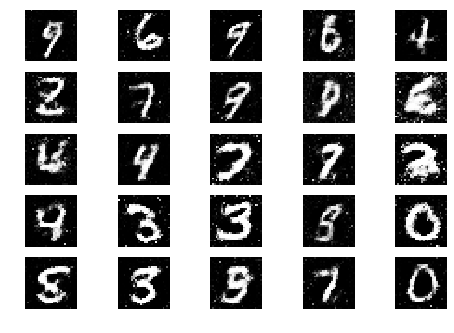

5551 [D loss: 0.660401, acc.: 64.84%] [G loss: 0.803318, acc.: 32.03%]
5552 [D loss: 0.673513, acc.: 57.81%] [G loss: 0.821400, acc.: 31.25%]
5553 [D loss: 0.653653, acc.: 62.89%] [G loss: 0.811956, acc.: 28.91%]
5554 [D loss: 0.673539, acc.: 55.86%] [G loss: 0.829896, acc.: 29.69%]
5555 [D loss: 0.648744, acc.: 63.67%] [G loss: 0.818137, acc.: 33.59%]
5556 [D loss: 0.679365, acc.: 54.69%] [G loss: 0.811099, acc.: 31.25%]
5557 [D loss: 0.660121, acc.: 59.77%] [G loss: 0.846115, acc.: 24.22%]
5558 [D loss: 0.692498, acc.: 53.12%] [G loss: 0.808638, acc.: 29.69%]
5559 [D loss: 0.660383, acc.: 61.72%] [G loss: 0.880862, acc.: 18.75%]
5560 [D loss: 0.664293, acc.: 60.94%] [G loss: 0.808585, acc.: 35.16%]
5561 [D loss: 0.654418, acc.: 60.55%] [G loss: 0.816853, acc.: 32.03%]
5562 [D loss: 0.663273, acc.: 63.67%] [G loss: 0.820887, acc.: 31.25%]
5563 [D loss: 0.652439, acc.: 63.28%] [G loss: 0.833529, acc.: 27.34%]
5564 [D loss: 0.661548, acc.: 61.72%] [G loss: 0.816095, acc.: 28.91%]
5565 [

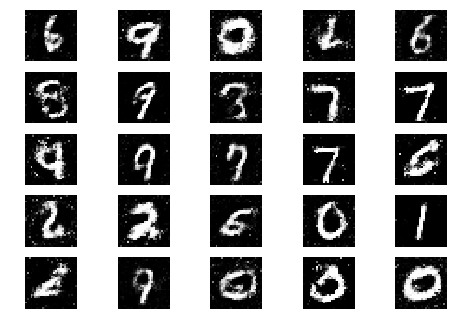

5601 [D loss: 0.657666, acc.: 61.72%] [G loss: 0.859859, acc.: 25.00%]
5602 [D loss: 0.674262, acc.: 56.64%] [G loss: 0.848741, acc.: 21.88%]
5603 [D loss: 0.674660, acc.: 56.64%] [G loss: 0.828119, acc.: 29.69%]
5604 [D loss: 0.690036, acc.: 54.30%] [G loss: 0.806334, acc.: 35.16%]
5605 [D loss: 0.682601, acc.: 55.47%] [G loss: 0.876413, acc.: 22.66%]
5606 [D loss: 0.683620, acc.: 56.64%] [G loss: 0.836404, acc.: 26.56%]
5607 [D loss: 0.676389, acc.: 55.08%] [G loss: 0.850966, acc.: 21.88%]
5608 [D loss: 0.653277, acc.: 62.11%] [G loss: 0.833000, acc.: 29.69%]
5609 [D loss: 0.687542, acc.: 56.25%] [G loss: 0.819941, acc.: 29.69%]
5610 [D loss: 0.700524, acc.: 50.39%] [G loss: 0.846981, acc.: 25.00%]
5611 [D loss: 0.658571, acc.: 60.16%] [G loss: 0.856604, acc.: 29.69%]
5612 [D loss: 0.672497, acc.: 59.38%] [G loss: 0.832903, acc.: 26.56%]
5613 [D loss: 0.651397, acc.: 62.11%] [G loss: 0.835727, acc.: 23.44%]
5614 [D loss: 0.656371, acc.: 63.67%] [G loss: 0.848092, acc.: 25.00%]
5615 [

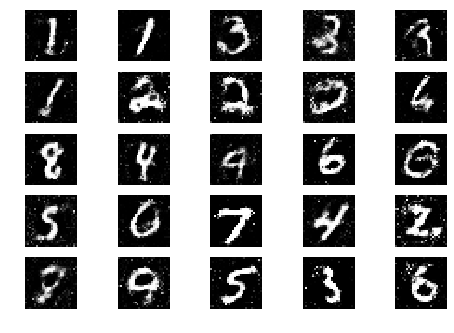

5651 [D loss: 0.655676, acc.: 59.77%] [G loss: 0.850619, acc.: 25.78%]
5652 [D loss: 0.682395, acc.: 55.47%] [G loss: 0.831045, acc.: 28.12%]
5653 [D loss: 0.654291, acc.: 62.89%] [G loss: 0.819548, acc.: 29.69%]
5654 [D loss: 0.655326, acc.: 59.77%] [G loss: 0.832104, acc.: 25.00%]
5655 [D loss: 0.657735, acc.: 61.33%] [G loss: 0.825900, acc.: 23.44%]
5656 [D loss: 0.653373, acc.: 58.98%] [G loss: 0.835021, acc.: 29.69%]
5657 [D loss: 0.652662, acc.: 60.94%] [G loss: 0.806543, acc.: 36.72%]
5658 [D loss: 0.662386, acc.: 61.33%] [G loss: 0.801190, acc.: 31.25%]
5659 [D loss: 0.698248, acc.: 53.12%] [G loss: 0.806660, acc.: 34.38%]
5660 [D loss: 0.691700, acc.: 57.42%] [G loss: 0.823569, acc.: 27.34%]
5661 [D loss: 0.676501, acc.: 55.86%] [G loss: 0.868210, acc.: 17.97%]
5662 [D loss: 0.679515, acc.: 57.03%] [G loss: 0.878798, acc.: 25.00%]
5663 [D loss: 0.685832, acc.: 55.08%] [G loss: 0.854866, acc.: 28.12%]
5664 [D loss: 0.672987, acc.: 55.86%] [G loss: 0.839234, acc.: 29.69%]
5665 [

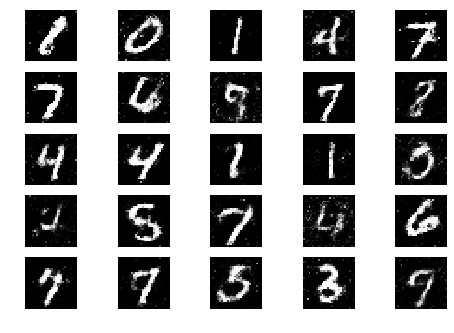

5701 [D loss: 0.663961, acc.: 61.33%] [G loss: 0.815115, acc.: 35.94%]
5702 [D loss: 0.659154, acc.: 61.33%] [G loss: 0.839471, acc.: 29.69%]
5703 [D loss: 0.671306, acc.: 56.64%] [G loss: 0.827485, acc.: 28.12%]
5704 [D loss: 0.673968, acc.: 58.59%] [G loss: 0.837578, acc.: 25.78%]
5705 [D loss: 0.674613, acc.: 57.03%] [G loss: 0.859574, acc.: 26.56%]
5706 [D loss: 0.686925, acc.: 57.03%] [G loss: 0.834747, acc.: 30.47%]
5707 [D loss: 0.669384, acc.: 60.16%] [G loss: 0.827672, acc.: 26.56%]
5708 [D loss: 0.706708, acc.: 53.12%] [G loss: 0.829383, acc.: 31.25%]
5709 [D loss: 0.681666, acc.: 57.81%] [G loss: 0.831870, acc.: 25.00%]
5710 [D loss: 0.676726, acc.: 55.86%] [G loss: 0.831595, acc.: 25.78%]
5711 [D loss: 0.681016, acc.: 58.20%] [G loss: 0.828791, acc.: 29.69%]
5712 [D loss: 0.679210, acc.: 55.47%] [G loss: 0.814827, acc.: 27.34%]
5713 [D loss: 0.666693, acc.: 57.42%] [G loss: 0.846455, acc.: 21.09%]
5714 [D loss: 0.662445, acc.: 61.33%] [G loss: 0.830640, acc.: 28.12%]
5715 [

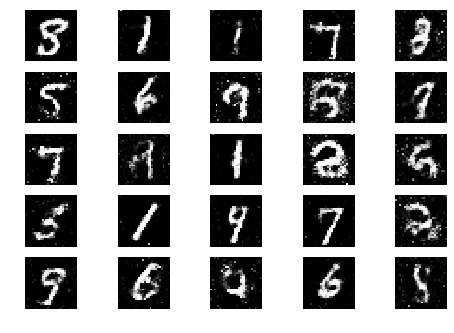

5751 [D loss: 0.655035, acc.: 58.98%] [G loss: 0.844707, acc.: 28.12%]
5752 [D loss: 0.663648, acc.: 59.38%] [G loss: 0.869244, acc.: 21.09%]
5753 [D loss: 0.671830, acc.: 60.94%] [G loss: 0.815244, acc.: 29.69%]
5754 [D loss: 0.640085, acc.: 65.62%] [G loss: 0.824112, acc.: 30.47%]
5755 [D loss: 0.668442, acc.: 56.25%] [G loss: 0.841950, acc.: 27.34%]
5756 [D loss: 0.670647, acc.: 58.98%] [G loss: 0.866472, acc.: 26.56%]
5757 [D loss: 0.648224, acc.: 65.62%] [G loss: 0.858807, acc.: 19.53%]
5758 [D loss: 0.669852, acc.: 61.72%] [G loss: 0.836408, acc.: 24.22%]
5759 [D loss: 0.657089, acc.: 59.77%] [G loss: 0.866854, acc.: 22.66%]
5760 [D loss: 0.658597, acc.: 61.72%] [G loss: 0.831235, acc.: 25.78%]
5761 [D loss: 0.648973, acc.: 64.06%] [G loss: 0.867556, acc.: 22.66%]
5762 [D loss: 0.673448, acc.: 57.42%] [G loss: 0.837879, acc.: 24.22%]
5763 [D loss: 0.688545, acc.: 55.86%] [G loss: 0.845005, acc.: 25.00%]
5764 [D loss: 0.659792, acc.: 61.33%] [G loss: 0.798936, acc.: 33.59%]
5765 [

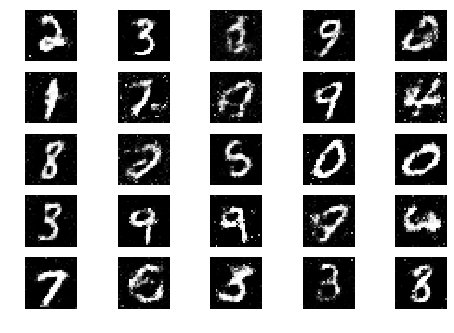

5801 [D loss: 0.686454, acc.: 54.30%] [G loss: 0.827000, acc.: 29.69%]
5802 [D loss: 0.675947, acc.: 59.38%] [G loss: 0.810472, acc.: 28.12%]
5803 [D loss: 0.675321, acc.: 57.81%] [G loss: 0.822641, acc.: 32.81%]
5804 [D loss: 0.683383, acc.: 58.20%] [G loss: 0.855627, acc.: 26.56%]
5805 [D loss: 0.665373, acc.: 63.28%] [G loss: 0.828715, acc.: 29.69%]
5806 [D loss: 0.667040, acc.: 62.11%] [G loss: 0.809053, acc.: 30.47%]
5807 [D loss: 0.683545, acc.: 53.52%] [G loss: 0.833288, acc.: 31.25%]
5808 [D loss: 0.676719, acc.: 56.64%] [G loss: 0.830032, acc.: 27.34%]
5809 [D loss: 0.665355, acc.: 59.77%] [G loss: 0.870466, acc.: 21.88%]
5810 [D loss: 0.642843, acc.: 66.41%] [G loss: 0.845420, acc.: 23.44%]
5811 [D loss: 0.689313, acc.: 55.47%] [G loss: 0.827173, acc.: 23.44%]
5812 [D loss: 0.682996, acc.: 56.25%] [G loss: 0.820230, acc.: 32.03%]
5813 [D loss: 0.656989, acc.: 59.77%] [G loss: 0.842547, acc.: 23.44%]
5814 [D loss: 0.666461, acc.: 59.77%] [G loss: 0.834504, acc.: 28.12%]
5815 [

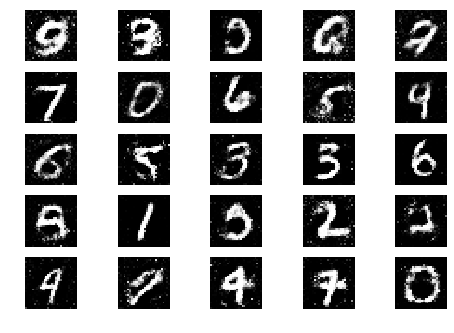

5851 [D loss: 0.691244, acc.: 54.30%] [G loss: 0.821505, acc.: 30.47%]
5852 [D loss: 0.672503, acc.: 58.59%] [G loss: 0.838660, acc.: 25.00%]
5853 [D loss: 0.684659, acc.: 56.64%] [G loss: 0.828383, acc.: 26.56%]
5854 [D loss: 0.675033, acc.: 56.25%] [G loss: 0.828324, acc.: 24.22%]
5855 [D loss: 0.693094, acc.: 56.64%] [G loss: 0.826135, acc.: 25.00%]
5856 [D loss: 0.682845, acc.: 52.73%] [G loss: 0.861654, acc.: 24.22%]
5857 [D loss: 0.636917, acc.: 64.84%] [G loss: 0.838585, acc.: 23.44%]
5858 [D loss: 0.666262, acc.: 59.77%] [G loss: 0.830919, acc.: 21.09%]
5859 [D loss: 0.652572, acc.: 60.94%] [G loss: 0.828404, acc.: 26.56%]
5860 [D loss: 0.678324, acc.: 55.47%] [G loss: 0.794664, acc.: 35.16%]
5861 [D loss: 0.675874, acc.: 57.81%] [G loss: 0.816923, acc.: 30.47%]
5862 [D loss: 0.662452, acc.: 58.59%] [G loss: 0.826640, acc.: 28.91%]
5863 [D loss: 0.652011, acc.: 62.89%] [G loss: 0.817221, acc.: 32.81%]
5864 [D loss: 0.657279, acc.: 61.33%] [G loss: 0.826479, acc.: 30.47%]
5865 [

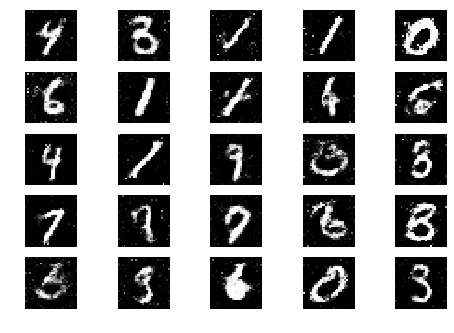

5901 [D loss: 0.678272, acc.: 55.47%] [G loss: 0.821747, acc.: 32.81%]
5902 [D loss: 0.683149, acc.: 55.86%] [G loss: 0.822977, acc.: 29.69%]
5903 [D loss: 0.666985, acc.: 61.72%] [G loss: 0.844285, acc.: 25.78%]
5904 [D loss: 0.677582, acc.: 55.86%] [G loss: 0.829106, acc.: 28.91%]
5905 [D loss: 0.653553, acc.: 62.89%] [G loss: 0.799999, acc.: 32.03%]
5906 [D loss: 0.651539, acc.: 65.62%] [G loss: 0.828847, acc.: 32.81%]
5907 [D loss: 0.657450, acc.: 61.72%] [G loss: 0.815279, acc.: 34.38%]
5908 [D loss: 0.645750, acc.: 62.50%] [G loss: 0.812669, acc.: 28.91%]
5909 [D loss: 0.685459, acc.: 52.73%] [G loss: 0.817396, acc.: 32.03%]
5910 [D loss: 0.656624, acc.: 62.11%] [G loss: 0.836520, acc.: 25.78%]
5911 [D loss: 0.678010, acc.: 57.81%] [G loss: 0.810900, acc.: 26.56%]
5912 [D loss: 0.665720, acc.: 61.33%] [G loss: 0.835263, acc.: 29.69%]
5913 [D loss: 0.677307, acc.: 57.03%] [G loss: 0.815673, acc.: 27.34%]
5914 [D loss: 0.663508, acc.: 63.67%] [G loss: 0.828652, acc.: 28.91%]
5915 [

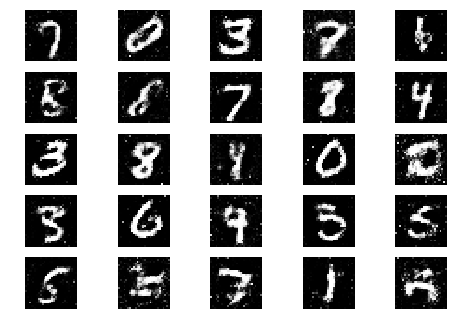

5951 [D loss: 0.674827, acc.: 56.64%] [G loss: 0.847854, acc.: 23.44%]
5952 [D loss: 0.665946, acc.: 59.77%] [G loss: 0.828767, acc.: 21.09%]
5953 [D loss: 0.658400, acc.: 55.47%] [G loss: 0.817870, acc.: 22.66%]
5954 [D loss: 0.659648, acc.: 59.77%] [G loss: 0.834515, acc.: 27.34%]
5955 [D loss: 0.652820, acc.: 62.50%] [G loss: 0.860473, acc.: 25.78%]
5956 [D loss: 0.688832, acc.: 56.64%] [G loss: 0.823720, acc.: 27.34%]
5957 [D loss: 0.680276, acc.: 51.56%] [G loss: 0.806994, acc.: 28.91%]
5958 [D loss: 0.659659, acc.: 59.38%] [G loss: 0.878998, acc.: 24.22%]
5959 [D loss: 0.681530, acc.: 55.08%] [G loss: 0.859968, acc.: 24.22%]
5960 [D loss: 0.671398, acc.: 55.86%] [G loss: 0.811744, acc.: 30.47%]
5961 [D loss: 0.673800, acc.: 59.38%] [G loss: 0.849399, acc.: 28.12%]
5962 [D loss: 0.658938, acc.: 62.50%] [G loss: 0.829675, acc.: 25.00%]
5963 [D loss: 0.663890, acc.: 61.33%] [G loss: 0.816743, acc.: 28.91%]
5964 [D loss: 0.653721, acc.: 64.06%] [G loss: 0.842314, acc.: 28.12%]
5965 [

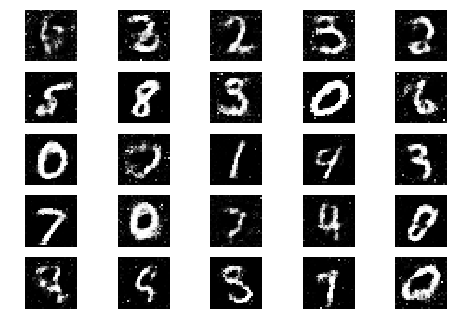

6001 [D loss: 0.683813, acc.: 53.91%] [G loss: 0.810503, acc.: 32.03%]
6002 [D loss: 0.668701, acc.: 61.33%] [G loss: 0.850894, acc.: 28.12%]
6003 [D loss: 0.671259, acc.: 56.25%] [G loss: 0.894138, acc.: 17.19%]
6004 [D loss: 0.655142, acc.: 60.16%] [G loss: 0.845449, acc.: 27.34%]
6005 [D loss: 0.653824, acc.: 59.38%] [G loss: 0.868745, acc.: 20.31%]
6006 [D loss: 0.695091, acc.: 55.08%] [G loss: 0.869998, acc.: 27.34%]
6007 [D loss: 0.687689, acc.: 55.08%] [G loss: 0.840965, acc.: 25.00%]
6008 [D loss: 0.658313, acc.: 60.16%] [G loss: 0.892694, acc.: 24.22%]
6009 [D loss: 0.645351, acc.: 60.55%] [G loss: 0.852656, acc.: 25.00%]
6010 [D loss: 0.670372, acc.: 57.81%] [G loss: 0.804770, acc.: 31.25%]
6011 [D loss: 0.659543, acc.: 57.81%] [G loss: 0.853532, acc.: 25.00%]
6012 [D loss: 0.672773, acc.: 59.38%] [G loss: 0.818368, acc.: 31.25%]
6013 [D loss: 0.663660, acc.: 58.20%] [G loss: 0.847153, acc.: 25.78%]
6014 [D loss: 0.669561, acc.: 58.59%] [G loss: 0.838875, acc.: 28.12%]
6015 [

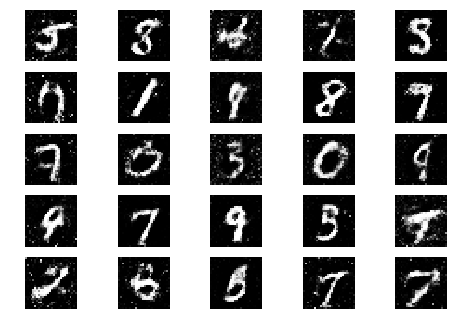

6051 [D loss: 0.697186, acc.: 55.47%] [G loss: 0.819180, acc.: 28.91%]
6052 [D loss: 0.665822, acc.: 60.94%] [G loss: 0.836211, acc.: 25.78%]
6053 [D loss: 0.643714, acc.: 63.28%] [G loss: 0.846041, acc.: 31.25%]
6054 [D loss: 0.663130, acc.: 59.38%] [G loss: 0.850891, acc.: 28.91%]
6055 [D loss: 0.660237, acc.: 61.72%] [G loss: 0.862351, acc.: 25.00%]
6056 [D loss: 0.672702, acc.: 58.59%] [G loss: 0.835637, acc.: 25.00%]
6057 [D loss: 0.649068, acc.: 64.45%] [G loss: 0.822083, acc.: 31.25%]
6058 [D loss: 0.658529, acc.: 60.55%] [G loss: 0.820709, acc.: 29.69%]
6059 [D loss: 0.674272, acc.: 61.33%] [G loss: 0.846408, acc.: 23.44%]
6060 [D loss: 0.676770, acc.: 57.03%] [G loss: 0.830686, acc.: 26.56%]
6061 [D loss: 0.676728, acc.: 56.25%] [G loss: 0.826496, acc.: 22.66%]
6062 [D loss: 0.672492, acc.: 56.64%] [G loss: 0.847834, acc.: 20.31%]
6063 [D loss: 0.670460, acc.: 62.89%] [G loss: 0.829085, acc.: 24.22%]
6064 [D loss: 0.687136, acc.: 56.25%] [G loss: 0.841517, acc.: 23.44%]
6065 [

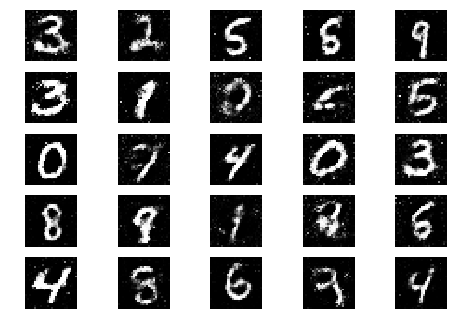

6101 [D loss: 0.666905, acc.: 59.77%] [G loss: 0.850073, acc.: 24.22%]
6102 [D loss: 0.677241, acc.: 56.25%] [G loss: 0.809658, acc.: 33.59%]
6103 [D loss: 0.677180, acc.: 59.38%] [G loss: 0.818556, acc.: 27.34%]
6104 [D loss: 0.677465, acc.: 54.30%] [G loss: 0.858798, acc.: 29.69%]
6105 [D loss: 0.667805, acc.: 59.77%] [G loss: 0.838551, acc.: 32.81%]
6106 [D loss: 0.668708, acc.: 55.47%] [G loss: 0.827291, acc.: 31.25%]
6107 [D loss: 0.663148, acc.: 60.55%] [G loss: 0.809238, acc.: 36.72%]
6108 [D loss: 0.663992, acc.: 61.72%] [G loss: 0.813903, acc.: 36.72%]
6109 [D loss: 0.658822, acc.: 62.50%] [G loss: 0.818096, acc.: 34.38%]
6110 [D loss: 0.697750, acc.: 52.34%] [G loss: 0.810532, acc.: 28.12%]
6111 [D loss: 0.683765, acc.: 60.94%] [G loss: 0.815064, acc.: 28.91%]
6112 [D loss: 0.681996, acc.: 56.25%] [G loss: 0.872207, acc.: 22.66%]
6113 [D loss: 0.677201, acc.: 56.25%] [G loss: 0.853293, acc.: 21.88%]
6114 [D loss: 0.680872, acc.: 54.69%] [G loss: 0.821619, acc.: 22.66%]
6115 [

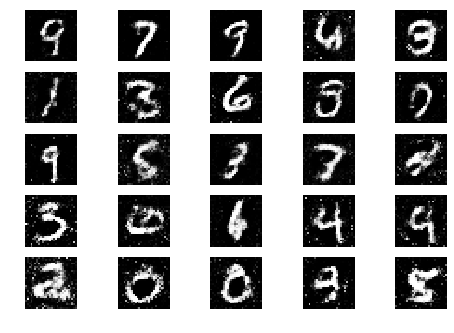

6151 [D loss: 0.659303, acc.: 60.55%] [G loss: 0.816826, acc.: 28.12%]
6152 [D loss: 0.686144, acc.: 58.59%] [G loss: 0.830433, acc.: 24.22%]
6153 [D loss: 0.689581, acc.: 53.12%] [G loss: 0.803233, acc.: 28.91%]
6154 [D loss: 0.686878, acc.: 57.03%] [G loss: 0.817511, acc.: 29.69%]
6155 [D loss: 0.685894, acc.: 51.56%] [G loss: 0.854316, acc.: 22.66%]
6156 [D loss: 0.672550, acc.: 56.64%] [G loss: 0.841561, acc.: 24.22%]
6157 [D loss: 0.664862, acc.: 62.11%] [G loss: 0.819269, acc.: 27.34%]
6158 [D loss: 0.658831, acc.: 58.59%] [G loss: 0.832030, acc.: 25.78%]
6159 [D loss: 0.673122, acc.: 57.03%] [G loss: 0.826607, acc.: 25.78%]
6160 [D loss: 0.669343, acc.: 57.81%] [G loss: 0.820327, acc.: 29.69%]
6161 [D loss: 0.660856, acc.: 62.89%] [G loss: 0.831457, acc.: 32.03%]
6162 [D loss: 0.678506, acc.: 58.20%] [G loss: 0.827199, acc.: 29.69%]
6163 [D loss: 0.655816, acc.: 62.89%] [G loss: 0.802001, acc.: 34.38%]
6164 [D loss: 0.663058, acc.: 60.55%] [G loss: 0.809741, acc.: 30.47%]
6165 [

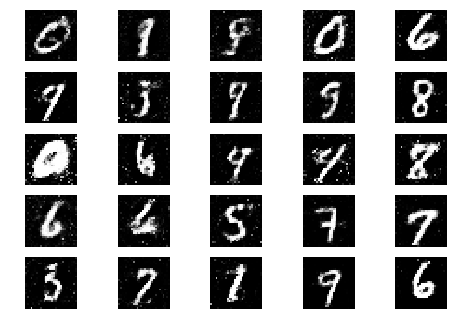

6201 [D loss: 0.634721, acc.: 64.84%] [G loss: 0.807976, acc.: 36.72%]
6202 [D loss: 0.630683, acc.: 68.36%] [G loss: 0.815816, acc.: 37.50%]
6203 [D loss: 0.687869, acc.: 60.16%] [G loss: 0.852998, acc.: 26.56%]
6204 [D loss: 0.631979, acc.: 67.97%] [G loss: 0.837123, acc.: 31.25%]
6205 [D loss: 0.664546, acc.: 57.81%] [G loss: 0.827276, acc.: 30.47%]
6206 [D loss: 0.687140, acc.: 55.08%] [G loss: 0.801900, acc.: 38.28%]
6207 [D loss: 0.664833, acc.: 60.55%] [G loss: 0.832771, acc.: 28.12%]
6208 [D loss: 0.669473, acc.: 63.67%] [G loss: 0.787521, acc.: 39.84%]
6209 [D loss: 0.659331, acc.: 60.16%] [G loss: 0.849732, acc.: 25.78%]
6210 [D loss: 0.664777, acc.: 61.33%] [G loss: 0.849137, acc.: 26.56%]
6211 [D loss: 0.699623, acc.: 52.73%] [G loss: 0.824647, acc.: 24.22%]
6212 [D loss: 0.664369, acc.: 58.98%] [G loss: 0.840542, acc.: 25.78%]
6213 [D loss: 0.681074, acc.: 57.42%] [G loss: 0.830084, acc.: 26.56%]
6214 [D loss: 0.683587, acc.: 54.30%] [G loss: 0.829812, acc.: 23.44%]
6215 [

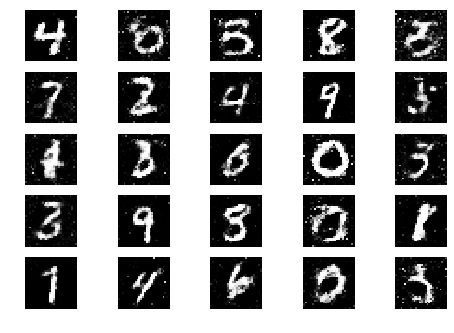

6251 [D loss: 0.670598, acc.: 56.25%] [G loss: 0.848445, acc.: 20.31%]
6252 [D loss: 0.683938, acc.: 53.52%] [G loss: 0.867876, acc.: 19.53%]
6253 [D loss: 0.675372, acc.: 58.59%] [G loss: 0.838609, acc.: 25.00%]
6254 [D loss: 0.661834, acc.: 63.28%] [G loss: 0.836138, acc.: 26.56%]
6255 [D loss: 0.676250, acc.: 54.30%] [G loss: 0.836052, acc.: 27.34%]
6256 [D loss: 0.672236, acc.: 54.30%] [G loss: 0.853884, acc.: 25.78%]
6257 [D loss: 0.665480, acc.: 58.59%] [G loss: 0.823747, acc.: 28.12%]
6258 [D loss: 0.671908, acc.: 58.59%] [G loss: 0.864576, acc.: 27.34%]
6259 [D loss: 0.691808, acc.: 52.73%] [G loss: 0.825228, acc.: 31.25%]
6260 [D loss: 0.659625, acc.: 58.98%] [G loss: 0.803759, acc.: 32.03%]
6261 [D loss: 0.677504, acc.: 56.25%] [G loss: 0.839558, acc.: 25.78%]
6262 [D loss: 0.671694, acc.: 58.20%] [G loss: 0.801818, acc.: 32.03%]
6263 [D loss: 0.654208, acc.: 62.89%] [G loss: 0.820667, acc.: 28.91%]
6264 [D loss: 0.668727, acc.: 61.33%] [G loss: 0.821435, acc.: 28.12%]
6265 [

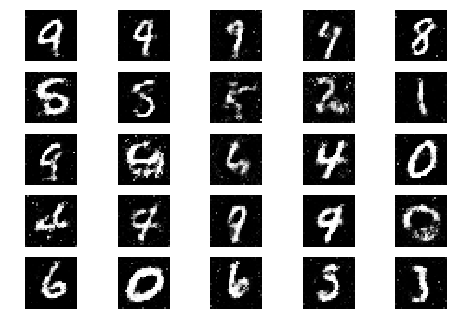

6301 [D loss: 0.682800, acc.: 57.42%] [G loss: 0.802438, acc.: 34.38%]
6302 [D loss: 0.670769, acc.: 58.59%] [G loss: 0.794265, acc.: 32.03%]
6303 [D loss: 0.683934, acc.: 55.47%] [G loss: 0.832644, acc.: 32.03%]
6304 [D loss: 0.671429, acc.: 56.64%] [G loss: 0.849799, acc.: 28.91%]
6305 [D loss: 0.672842, acc.: 60.94%] [G loss: 0.815304, acc.: 28.12%]
6306 [D loss: 0.683268, acc.: 57.42%] [G loss: 0.844029, acc.: 25.78%]
6307 [D loss: 0.684360, acc.: 54.30%] [G loss: 0.855150, acc.: 25.78%]
6308 [D loss: 0.650916, acc.: 64.06%] [G loss: 0.867970, acc.: 22.66%]
6309 [D loss: 0.675511, acc.: 61.72%] [G loss: 0.816522, acc.: 29.69%]
6310 [D loss: 0.677770, acc.: 58.20%] [G loss: 0.814234, acc.: 32.81%]
6311 [D loss: 0.671213, acc.: 55.47%] [G loss: 0.809868, acc.: 28.12%]
6312 [D loss: 0.668635, acc.: 60.94%] [G loss: 0.826141, acc.: 34.38%]
6313 [D loss: 0.685768, acc.: 55.08%] [G loss: 0.810600, acc.: 34.38%]
6314 [D loss: 0.669410, acc.: 60.16%] [G loss: 0.819096, acc.: 28.12%]
6315 [

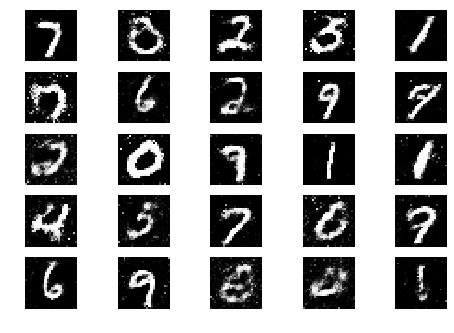

6351 [D loss: 0.680247, acc.: 57.81%] [G loss: 0.817062, acc.: 27.34%]
6352 [D loss: 0.687721, acc.: 53.12%] [G loss: 0.825799, acc.: 24.22%]
6353 [D loss: 0.660424, acc.: 61.72%] [G loss: 0.819941, acc.: 32.81%]
6354 [D loss: 0.682513, acc.: 57.03%] [G loss: 0.818967, acc.: 31.25%]
6355 [D loss: 0.667507, acc.: 60.94%] [G loss: 0.829398, acc.: 32.03%]
6356 [D loss: 0.654963, acc.: 62.11%] [G loss: 0.818023, acc.: 25.78%]
6357 [D loss: 0.678271, acc.: 55.08%] [G loss: 0.846809, acc.: 29.69%]
6358 [D loss: 0.653878, acc.: 60.16%] [G loss: 0.807345, acc.: 25.78%]
6359 [D loss: 0.674862, acc.: 55.86%] [G loss: 0.851286, acc.: 17.97%]
6360 [D loss: 0.677718, acc.: 55.47%] [G loss: 0.833820, acc.: 24.22%]
6361 [D loss: 0.652080, acc.: 64.84%] [G loss: 0.851117, acc.: 24.22%]
6362 [D loss: 0.671996, acc.: 57.42%] [G loss: 0.844388, acc.: 22.66%]
6363 [D loss: 0.671233, acc.: 56.25%] [G loss: 0.862934, acc.: 17.19%]
6364 [D loss: 0.653903, acc.: 60.55%] [G loss: 0.835146, acc.: 21.09%]
6365 [

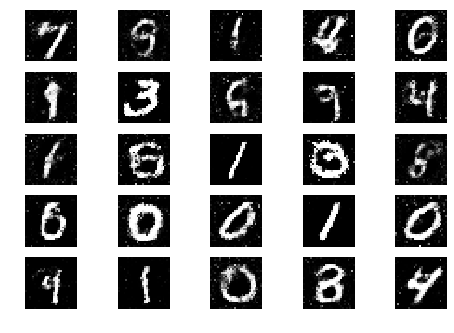

6401 [D loss: 0.665077, acc.: 57.03%] [G loss: 0.822128, acc.: 33.59%]
6402 [D loss: 0.700063, acc.: 52.34%] [G loss: 0.807121, acc.: 29.69%]
6403 [D loss: 0.682564, acc.: 58.98%] [G loss: 0.810275, acc.: 33.59%]
6404 [D loss: 0.674554, acc.: 55.86%] [G loss: 0.869342, acc.: 21.09%]
6405 [D loss: 0.663038, acc.: 59.77%] [G loss: 0.823072, acc.: 28.91%]
6406 [D loss: 0.658842, acc.: 63.67%] [G loss: 0.838657, acc.: 26.56%]
6407 [D loss: 0.687416, acc.: 56.64%] [G loss: 0.816799, acc.: 32.03%]
6408 [D loss: 0.667338, acc.: 60.16%] [G loss: 0.845205, acc.: 27.34%]
6409 [D loss: 0.682001, acc.: 53.52%] [G loss: 0.816938, acc.: 28.91%]
6410 [D loss: 0.660106, acc.: 59.38%] [G loss: 0.852972, acc.: 21.88%]
6411 [D loss: 0.677964, acc.: 55.86%] [G loss: 0.840478, acc.: 33.59%]
6412 [D loss: 0.673013, acc.: 60.16%] [G loss: 0.861702, acc.: 24.22%]
6413 [D loss: 0.657345, acc.: 60.55%] [G loss: 0.888683, acc.: 20.31%]
6414 [D loss: 0.672602, acc.: 60.16%] [G loss: 0.873537, acc.: 21.88%]
6415 [

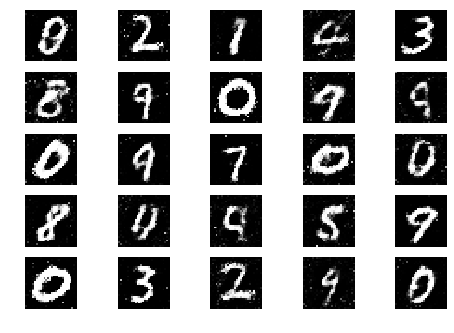

6451 [D loss: 0.669444, acc.: 57.81%] [G loss: 0.838306, acc.: 27.34%]
6452 [D loss: 0.636720, acc.: 66.02%] [G loss: 0.807046, acc.: 33.59%]
6453 [D loss: 0.687896, acc.: 55.86%] [G loss: 0.797813, acc.: 37.50%]
6454 [D loss: 0.662662, acc.: 60.94%] [G loss: 0.803561, acc.: 31.25%]
6455 [D loss: 0.656841, acc.: 62.11%] [G loss: 0.865643, acc.: 28.91%]
6456 [D loss: 0.660967, acc.: 59.77%] [G loss: 0.829546, acc.: 32.81%]
6457 [D loss: 0.683845, acc.: 53.52%] [G loss: 0.847610, acc.: 26.56%]
6458 [D loss: 0.678734, acc.: 55.47%] [G loss: 0.838104, acc.: 21.88%]
6459 [D loss: 0.664868, acc.: 60.55%] [G loss: 0.883245, acc.: 22.66%]
6460 [D loss: 0.650561, acc.: 61.33%] [G loss: 0.860201, acc.: 25.00%]
6461 [D loss: 0.682200, acc.: 57.42%] [G loss: 0.840489, acc.: 28.12%]
6462 [D loss: 0.666379, acc.: 59.77%] [G loss: 0.814674, acc.: 33.59%]
6463 [D loss: 0.661463, acc.: 60.55%] [G loss: 0.822288, acc.: 30.47%]
6464 [D loss: 0.668892, acc.: 62.50%] [G loss: 0.820889, acc.: 28.91%]
6465 [

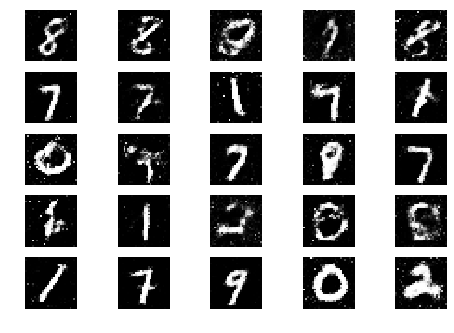

6501 [D loss: 0.685897, acc.: 56.25%] [G loss: 0.820621, acc.: 28.91%]
6502 [D loss: 0.679489, acc.: 54.30%] [G loss: 0.831241, acc.: 29.69%]
6503 [D loss: 0.705832, acc.: 51.95%] [G loss: 0.832044, acc.: 21.09%]
6504 [D loss: 0.662828, acc.: 60.55%] [G loss: 0.816495, acc.: 24.22%]
6505 [D loss: 0.676131, acc.: 55.86%] [G loss: 0.817916, acc.: 28.91%]
6506 [D loss: 0.682083, acc.: 54.30%] [G loss: 0.810711, acc.: 30.47%]
6507 [D loss: 0.684338, acc.: 52.73%] [G loss: 0.808424, acc.: 32.81%]
6508 [D loss: 0.659982, acc.: 60.55%] [G loss: 0.836510, acc.: 30.47%]
6509 [D loss: 0.686991, acc.: 57.42%] [G loss: 0.826262, acc.: 25.78%]
6510 [D loss: 0.660283, acc.: 59.77%] [G loss: 0.811939, acc.: 27.34%]
6511 [D loss: 0.655214, acc.: 63.28%] [G loss: 0.785592, acc.: 32.03%]
6512 [D loss: 0.693457, acc.: 55.86%] [G loss: 0.813537, acc.: 32.81%]
6513 [D loss: 0.652133, acc.: 58.98%] [G loss: 0.833835, acc.: 30.47%]
6514 [D loss: 0.660695, acc.: 59.77%] [G loss: 0.853626, acc.: 28.91%]
6515 [

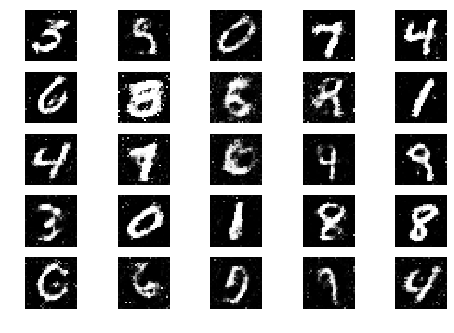

6551 [D loss: 0.662156, acc.: 60.16%] [G loss: 0.826326, acc.: 32.81%]
6552 [D loss: 0.676409, acc.: 58.20%] [G loss: 0.817437, acc.: 32.81%]
6553 [D loss: 0.647208, acc.: 62.11%] [G loss: 0.849144, acc.: 21.88%]
6554 [D loss: 0.690782, acc.: 52.73%] [G loss: 0.831546, acc.: 32.03%]
6555 [D loss: 0.672706, acc.: 58.98%] [G loss: 0.858747, acc.: 22.66%]
6556 [D loss: 0.685009, acc.: 54.69%] [G loss: 0.822289, acc.: 33.59%]
6557 [D loss: 0.662616, acc.: 60.94%] [G loss: 0.866472, acc.: 22.66%]
6558 [D loss: 0.665220, acc.: 61.33%] [G loss: 0.827726, acc.: 28.12%]
6559 [D loss: 0.689850, acc.: 55.47%] [G loss: 0.789600, acc.: 28.12%]
6560 [D loss: 0.686409, acc.: 56.25%] [G loss: 0.814075, acc.: 33.59%]
6561 [D loss: 0.680431, acc.: 52.73%] [G loss: 0.811921, acc.: 28.91%]
6562 [D loss: 0.666161, acc.: 57.42%] [G loss: 0.839689, acc.: 25.78%]
6563 [D loss: 0.685890, acc.: 55.86%] [G loss: 0.815957, acc.: 28.91%]
6564 [D loss: 0.670160, acc.: 55.86%] [G loss: 0.831655, acc.: 26.56%]
6565 [

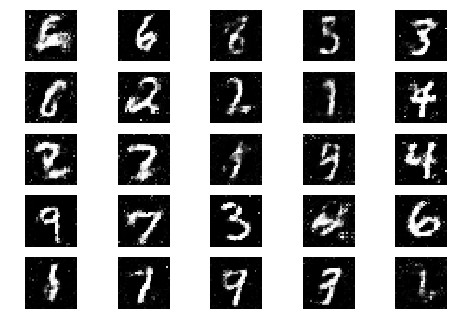

6601 [D loss: 0.669469, acc.: 58.59%] [G loss: 0.852214, acc.: 21.88%]
6602 [D loss: 0.676979, acc.: 57.03%] [G loss: 0.803627, acc.: 32.81%]
6603 [D loss: 0.674355, acc.: 57.42%] [G loss: 0.809870, acc.: 32.03%]
6604 [D loss: 0.677144, acc.: 59.77%] [G loss: 0.828478, acc.: 28.91%]
6605 [D loss: 0.656624, acc.: 60.16%] [G loss: 0.829551, acc.: 28.91%]
6606 [D loss: 0.640534, acc.: 63.28%] [G loss: 0.832020, acc.: 29.69%]
6607 [D loss: 0.672846, acc.: 60.16%] [G loss: 0.837030, acc.: 28.12%]
6608 [D loss: 0.674171, acc.: 60.16%] [G loss: 0.803353, acc.: 32.03%]
6609 [D loss: 0.673919, acc.: 59.77%] [G loss: 0.809478, acc.: 33.59%]
6610 [D loss: 0.668545, acc.: 61.33%] [G loss: 0.831563, acc.: 27.34%]
6611 [D loss: 0.660835, acc.: 60.55%] [G loss: 0.823086, acc.: 30.47%]
6612 [D loss: 0.679818, acc.: 58.20%] [G loss: 0.830512, acc.: 30.47%]
6613 [D loss: 0.656513, acc.: 60.55%] [G loss: 0.839953, acc.: 26.56%]
6614 [D loss: 0.672759, acc.: 60.16%] [G loss: 0.841115, acc.: 28.12%]
6615 [

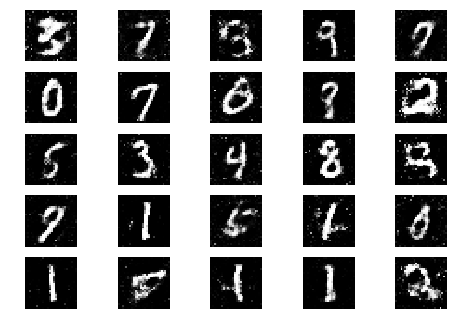

6651 [D loss: 0.679781, acc.: 57.42%] [G loss: 0.846777, acc.: 30.47%]
6652 [D loss: 0.681426, acc.: 51.95%] [G loss: 0.850939, acc.: 28.91%]
6653 [D loss: 0.674805, acc.: 59.38%] [G loss: 0.797411, acc.: 32.03%]
6654 [D loss: 0.680534, acc.: 55.08%] [G loss: 0.777059, acc.: 30.47%]
6655 [D loss: 0.662904, acc.: 59.77%] [G loss: 0.827867, acc.: 28.12%]
6656 [D loss: 0.653169, acc.: 63.67%] [G loss: 0.838011, acc.: 28.12%]
6657 [D loss: 0.686253, acc.: 54.69%] [G loss: 0.813114, acc.: 29.69%]
6658 [D loss: 0.673621, acc.: 57.81%] [G loss: 0.806802, acc.: 32.03%]
6659 [D loss: 0.678616, acc.: 60.94%] [G loss: 0.802105, acc.: 34.38%]
6660 [D loss: 0.681257, acc.: 54.30%] [G loss: 0.833527, acc.: 24.22%]
6661 [D loss: 0.674083, acc.: 58.59%] [G loss: 0.818651, acc.: 23.44%]
6662 [D loss: 0.659515, acc.: 62.50%] [G loss: 0.831907, acc.: 31.25%]
6663 [D loss: 0.664132, acc.: 60.55%] [G loss: 0.849757, acc.: 25.00%]
6664 [D loss: 0.668308, acc.: 56.64%] [G loss: 0.823292, acc.: 27.34%]
6665 [

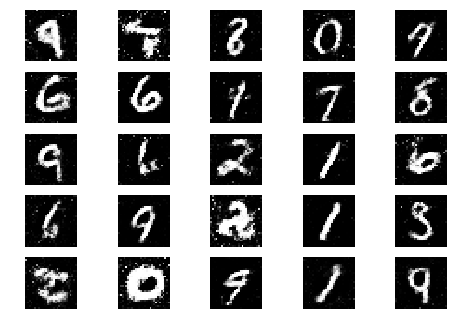

6701 [D loss: 0.670642, acc.: 60.94%] [G loss: 0.839850, acc.: 28.12%]
6702 [D loss: 0.659024, acc.: 61.33%] [G loss: 0.834968, acc.: 25.78%]
6703 [D loss: 0.668833, acc.: 58.20%] [G loss: 0.813610, acc.: 27.34%]
6704 [D loss: 0.681546, acc.: 55.47%] [G loss: 0.838557, acc.: 27.34%]
6705 [D loss: 0.675581, acc.: 62.50%] [G loss: 0.841197, acc.: 34.38%]
6706 [D loss: 0.709749, acc.: 53.52%] [G loss: 0.837728, acc.: 26.56%]
6707 [D loss: 0.648671, acc.: 61.72%] [G loss: 0.892830, acc.: 19.53%]
6708 [D loss: 0.648680, acc.: 62.89%] [G loss: 0.819801, acc.: 28.12%]
6709 [D loss: 0.683620, acc.: 57.03%] [G loss: 0.872370, acc.: 24.22%]
6710 [D loss: 0.693081, acc.: 53.91%] [G loss: 0.877702, acc.: 22.66%]
6711 [D loss: 0.655854, acc.: 60.55%] [G loss: 0.832267, acc.: 28.12%]
6712 [D loss: 0.672139, acc.: 56.25%] [G loss: 0.804799, acc.: 31.25%]
6713 [D loss: 0.674142, acc.: 57.42%] [G loss: 0.803664, acc.: 32.81%]
6714 [D loss: 0.674861, acc.: 53.12%] [G loss: 0.827260, acc.: 28.91%]
6715 [

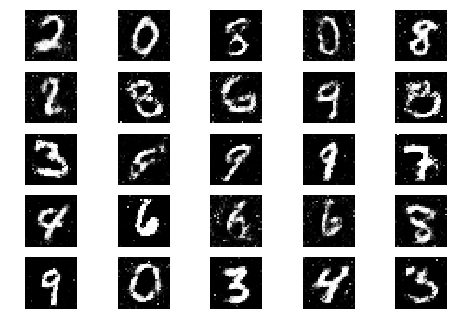

6751 [D loss: 0.665201, acc.: 58.20%] [G loss: 0.854584, acc.: 26.56%]
6752 [D loss: 0.669739, acc.: 60.55%] [G loss: 0.839552, acc.: 29.69%]
6753 [D loss: 0.646672, acc.: 65.23%] [G loss: 0.845908, acc.: 29.69%]
6754 [D loss: 0.681455, acc.: 58.20%] [G loss: 0.832157, acc.: 30.47%]
6755 [D loss: 0.682387, acc.: 58.59%] [G loss: 0.856013, acc.: 24.22%]
6756 [D loss: 0.695129, acc.: 51.17%] [G loss: 0.835365, acc.: 30.47%]
6757 [D loss: 0.671127, acc.: 58.59%] [G loss: 0.830002, acc.: 26.56%]
6758 [D loss: 0.681886, acc.: 59.38%] [G loss: 0.827817, acc.: 29.69%]
6759 [D loss: 0.677237, acc.: 57.42%] [G loss: 0.848176, acc.: 21.09%]
6760 [D loss: 0.674863, acc.: 54.69%] [G loss: 0.834051, acc.: 23.44%]
6761 [D loss: 0.662616, acc.: 62.50%] [G loss: 0.831624, acc.: 30.47%]
6762 [D loss: 0.681750, acc.: 55.47%] [G loss: 0.843591, acc.: 26.56%]
6763 [D loss: 0.676020, acc.: 56.64%] [G loss: 0.860952, acc.: 22.66%]
6764 [D loss: 0.665791, acc.: 61.33%] [G loss: 0.847889, acc.: 25.00%]
6765 [

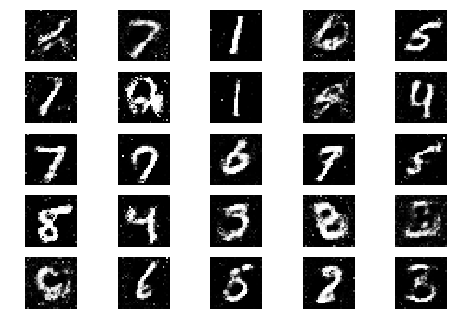

6801 [D loss: 0.683673, acc.: 58.98%] [G loss: 0.801040, acc.: 29.69%]
6802 [D loss: 0.658791, acc.: 61.33%] [G loss: 0.864654, acc.: 25.78%]
6803 [D loss: 0.683032, acc.: 56.64%] [G loss: 0.830920, acc.: 26.56%]
6804 [D loss: 0.693181, acc.: 48.44%] [G loss: 0.843484, acc.: 30.47%]
6805 [D loss: 0.690124, acc.: 55.47%] [G loss: 0.847619, acc.: 28.12%]
6806 [D loss: 0.640861, acc.: 62.50%] [G loss: 0.803126, acc.: 32.03%]
6807 [D loss: 0.666852, acc.: 57.42%] [G loss: 0.790336, acc.: 33.59%]
6808 [D loss: 0.680378, acc.: 55.86%] [G loss: 0.812697, acc.: 28.12%]
6809 [D loss: 0.662778, acc.: 60.55%] [G loss: 0.818185, acc.: 27.34%]
6810 [D loss: 0.692792, acc.: 53.91%] [G loss: 0.842143, acc.: 20.31%]
6811 [D loss: 0.674653, acc.: 56.64%] [G loss: 0.818627, acc.: 25.00%]
6812 [D loss: 0.680180, acc.: 56.64%] [G loss: 0.823588, acc.: 30.47%]
6813 [D loss: 0.643292, acc.: 65.23%] [G loss: 0.853506, acc.: 27.34%]
6814 [D loss: 0.650225, acc.: 63.28%] [G loss: 0.860883, acc.: 24.22%]
6815 [

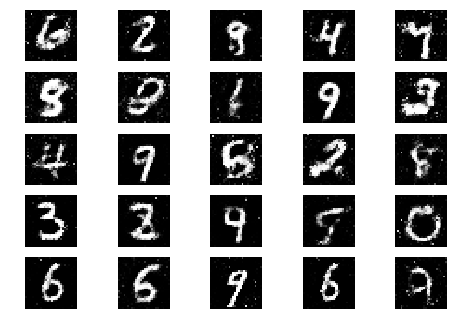

6851 [D loss: 0.682661, acc.: 55.47%] [G loss: 0.814113, acc.: 26.56%]
6852 [D loss: 0.697056, acc.: 55.08%] [G loss: 0.835233, acc.: 29.69%]
6853 [D loss: 0.678133, acc.: 58.98%] [G loss: 0.849182, acc.: 19.53%]
6854 [D loss: 0.660617, acc.: 60.55%] [G loss: 0.845729, acc.: 23.44%]
6855 [D loss: 0.656561, acc.: 60.55%] [G loss: 0.877255, acc.: 24.22%]
6856 [D loss: 0.700602, acc.: 52.34%] [G loss: 0.853026, acc.: 24.22%]
6857 [D loss: 0.698585, acc.: 50.00%] [G loss: 0.811561, acc.: 28.91%]
6858 [D loss: 0.649907, acc.: 63.28%] [G loss: 0.808556, acc.: 29.69%]
6859 [D loss: 0.689472, acc.: 55.08%] [G loss: 0.809070, acc.: 29.69%]
6860 [D loss: 0.673056, acc.: 57.03%] [G loss: 0.843110, acc.: 25.78%]
6861 [D loss: 0.660751, acc.: 62.11%] [G loss: 0.824227, acc.: 26.56%]
6862 [D loss: 0.684745, acc.: 54.69%] [G loss: 0.809697, acc.: 30.47%]
6863 [D loss: 0.672133, acc.: 59.77%] [G loss: 0.854644, acc.: 30.47%]
6864 [D loss: 0.684221, acc.: 55.47%] [G loss: 0.816277, acc.: 30.47%]
6865 [

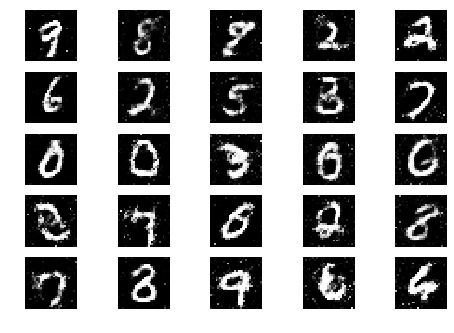

6901 [D loss: 0.662322, acc.: 59.77%] [G loss: 0.844330, acc.: 20.31%]
6902 [D loss: 0.670028, acc.: 57.81%] [G loss: 0.859922, acc.: 25.00%]
6903 [D loss: 0.643678, acc.: 61.72%] [G loss: 0.841156, acc.: 29.69%]
6904 [D loss: 0.677402, acc.: 60.55%] [G loss: 0.844544, acc.: 30.47%]
6905 [D loss: 0.686681, acc.: 58.59%] [G loss: 0.832890, acc.: 27.34%]
6906 [D loss: 0.670785, acc.: 56.25%] [G loss: 0.834503, acc.: 25.78%]
6907 [D loss: 0.660216, acc.: 59.77%] [G loss: 0.806055, acc.: 31.25%]
6908 [D loss: 0.664413, acc.: 60.55%] [G loss: 0.782936, acc.: 37.50%]
6909 [D loss: 0.654003, acc.: 60.94%] [G loss: 0.800153, acc.: 35.16%]
6910 [D loss: 0.656235, acc.: 55.08%] [G loss: 0.845912, acc.: 30.47%]
6911 [D loss: 0.694145, acc.: 55.86%] [G loss: 0.833590, acc.: 25.78%]
6912 [D loss: 0.662534, acc.: 59.38%] [G loss: 0.825913, acc.: 28.12%]
6913 [D loss: 0.681357, acc.: 53.91%] [G loss: 0.818166, acc.: 25.78%]
6914 [D loss: 0.662374, acc.: 66.80%] [G loss: 0.792431, acc.: 35.16%]
6915 [

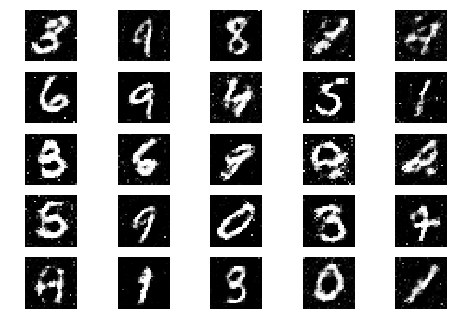

6951 [D loss: 0.657983, acc.: 60.94%] [G loss: 0.825904, acc.: 33.59%]
6952 [D loss: 0.687296, acc.: 55.47%] [G loss: 0.843108, acc.: 26.56%]
6953 [D loss: 0.674195, acc.: 57.03%] [G loss: 0.859966, acc.: 22.66%]
6954 [D loss: 0.671116, acc.: 59.38%] [G loss: 0.853278, acc.: 23.44%]
6955 [D loss: 0.668478, acc.: 57.42%] [G loss: 0.827031, acc.: 29.69%]
6956 [D loss: 0.673221, acc.: 57.81%] [G loss: 0.844917, acc.: 23.44%]
6957 [D loss: 0.660608, acc.: 60.16%] [G loss: 0.850057, acc.: 27.34%]
6958 [D loss: 0.684913, acc.: 57.81%] [G loss: 0.860417, acc.: 26.56%]
6959 [D loss: 0.697392, acc.: 53.91%] [G loss: 0.812492, acc.: 28.12%]
6960 [D loss: 0.673402, acc.: 55.47%] [G loss: 0.800267, acc.: 36.72%]
6961 [D loss: 0.682918, acc.: 56.64%] [G loss: 0.807598, acc.: 32.03%]
6962 [D loss: 0.674827, acc.: 57.81%] [G loss: 0.821760, acc.: 27.34%]
6963 [D loss: 0.663160, acc.: 60.55%] [G loss: 0.859368, acc.: 20.31%]
6964 [D loss: 0.688882, acc.: 53.52%] [G loss: 0.843979, acc.: 23.44%]
6965 [

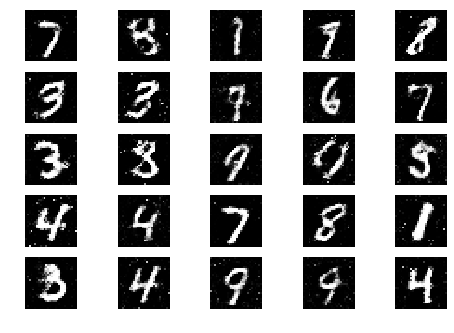

7001 [D loss: 0.683370, acc.: 55.47%] [G loss: 0.833030, acc.: 28.91%]
7002 [D loss: 0.687793, acc.: 54.69%] [G loss: 0.838682, acc.: 28.91%]
7003 [D loss: 0.673390, acc.: 56.25%] [G loss: 0.841686, acc.: 28.12%]
7004 [D loss: 0.677217, acc.: 58.59%] [G loss: 0.831038, acc.: 34.38%]
7005 [D loss: 0.662888, acc.: 58.59%] [G loss: 0.829152, acc.: 27.34%]
7006 [D loss: 0.665296, acc.: 57.81%] [G loss: 0.830978, acc.: 27.34%]
7007 [D loss: 0.692986, acc.: 57.81%] [G loss: 0.830346, acc.: 32.03%]
7008 [D loss: 0.691353, acc.: 55.47%] [G loss: 0.846072, acc.: 25.00%]
7009 [D loss: 0.689107, acc.: 55.47%] [G loss: 0.846346, acc.: 25.00%]
7010 [D loss: 0.655407, acc.: 58.98%] [G loss: 0.797431, acc.: 28.91%]
7011 [D loss: 0.678109, acc.: 60.94%] [G loss: 0.824417, acc.: 30.47%]
7012 [D loss: 0.659551, acc.: 61.33%] [G loss: 0.847890, acc.: 30.47%]
7013 [D loss: 0.677554, acc.: 60.16%] [G loss: 0.814932, acc.: 28.12%]
7014 [D loss: 0.646149, acc.: 60.16%] [G loss: 0.814868, acc.: 27.34%]
7015 [

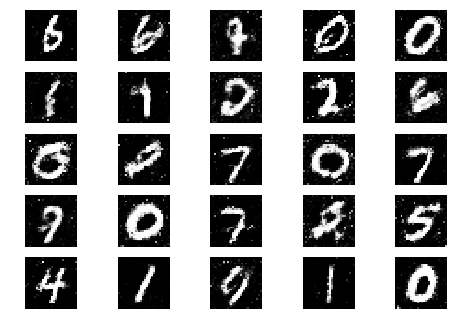

7051 [D loss: 0.673123, acc.: 61.33%] [G loss: 0.819014, acc.: 33.59%]
7052 [D loss: 0.663731, acc.: 59.38%] [G loss: 0.818796, acc.: 32.03%]
7053 [D loss: 0.661876, acc.: 60.94%] [G loss: 0.784269, acc.: 34.38%]
7054 [D loss: 0.679392, acc.: 58.59%] [G loss: 0.815058, acc.: 27.34%]
7055 [D loss: 0.679217, acc.: 56.64%] [G loss: 0.811205, acc.: 25.00%]
7056 [D loss: 0.679992, acc.: 55.08%] [G loss: 0.843683, acc.: 25.00%]
7057 [D loss: 0.672592, acc.: 52.73%] [G loss: 0.824691, acc.: 28.12%]
7058 [D loss: 0.662251, acc.: 59.38%] [G loss: 0.835831, acc.: 28.12%]
7059 [D loss: 0.655113, acc.: 62.89%] [G loss: 0.854277, acc.: 23.44%]
7060 [D loss: 0.660699, acc.: 60.94%] [G loss: 0.819256, acc.: 25.78%]
7061 [D loss: 0.671584, acc.: 56.64%] [G loss: 0.838588, acc.: 25.00%]
7062 [D loss: 0.663569, acc.: 65.23%] [G loss: 0.810976, acc.: 35.16%]
7063 [D loss: 0.647471, acc.: 62.50%] [G loss: 0.813709, acc.: 32.03%]
7064 [D loss: 0.671945, acc.: 58.98%] [G loss: 0.821506, acc.: 32.81%]
7065 [

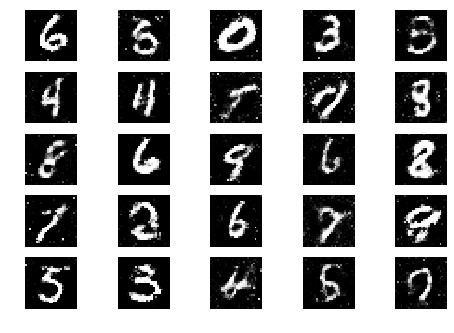

7101 [D loss: 0.646003, acc.: 65.62%] [G loss: 0.846329, acc.: 25.78%]
7102 [D loss: 0.641829, acc.: 62.50%] [G loss: 0.846035, acc.: 33.59%]
7103 [D loss: 0.701685, acc.: 50.78%] [G loss: 0.789810, acc.: 32.81%]
7104 [D loss: 0.660944, acc.: 60.55%] [G loss: 0.827297, acc.: 27.34%]
7105 [D loss: 0.677749, acc.: 56.64%] [G loss: 0.810578, acc.: 32.81%]
7106 [D loss: 0.659297, acc.: 62.50%] [G loss: 0.824409, acc.: 29.69%]
7107 [D loss: 0.681215, acc.: 53.52%] [G loss: 0.789458, acc.: 32.81%]
7108 [D loss: 0.682640, acc.: 54.30%] [G loss: 0.816765, acc.: 25.00%]
7109 [D loss: 0.684531, acc.: 53.52%] [G loss: 0.805303, acc.: 34.38%]
7110 [D loss: 0.672573, acc.: 57.81%] [G loss: 0.810207, acc.: 26.56%]
7111 [D loss: 0.671626, acc.: 60.16%] [G loss: 0.823374, acc.: 28.12%]
7112 [D loss: 0.652407, acc.: 61.72%] [G loss: 0.829817, acc.: 29.69%]
7113 [D loss: 0.677321, acc.: 55.86%] [G loss: 0.803961, acc.: 26.56%]
7114 [D loss: 0.654666, acc.: 61.72%] [G loss: 0.825618, acc.: 27.34%]
7115 [

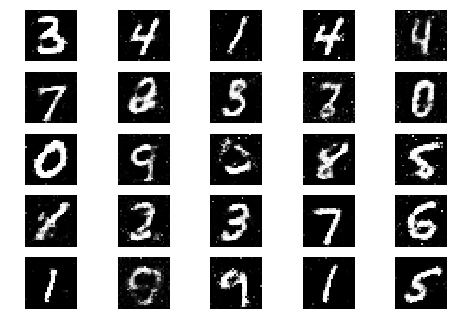

7151 [D loss: 0.668884, acc.: 60.94%] [G loss: 0.825283, acc.: 29.69%]
7152 [D loss: 0.705559, acc.: 49.22%] [G loss: 0.816913, acc.: 28.91%]
7153 [D loss: 0.664867, acc.: 58.59%] [G loss: 0.812157, acc.: 33.59%]
7154 [D loss: 0.645656, acc.: 63.67%] [G loss: 0.805153, acc.: 29.69%]
7155 [D loss: 0.683185, acc.: 53.12%] [G loss: 0.862108, acc.: 22.66%]
7156 [D loss: 0.657930, acc.: 62.11%] [G loss: 0.823757, acc.: 32.03%]
7157 [D loss: 0.689686, acc.: 54.69%] [G loss: 0.818064, acc.: 25.00%]
7158 [D loss: 0.682327, acc.: 58.59%] [G loss: 0.821200, acc.: 25.00%]
7159 [D loss: 0.685718, acc.: 60.16%] [G loss: 0.816822, acc.: 34.38%]
7160 [D loss: 0.684714, acc.: 56.25%] [G loss: 0.815134, acc.: 33.59%]
7161 [D loss: 0.701004, acc.: 55.08%] [G loss: 0.816248, acc.: 25.00%]
7162 [D loss: 0.673953, acc.: 57.42%] [G loss: 0.801931, acc.: 31.25%]
7163 [D loss: 0.676740, acc.: 59.38%] [G loss: 0.821759, acc.: 28.12%]
7164 [D loss: 0.669776, acc.: 61.72%] [G loss: 0.816367, acc.: 31.25%]
7165 [

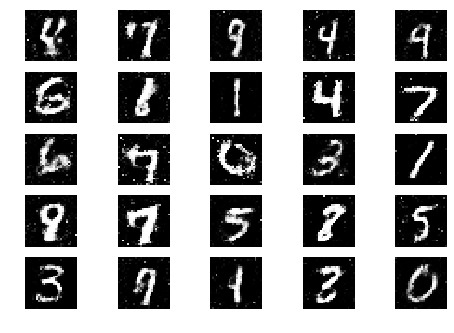

7201 [D loss: 0.709984, acc.: 51.56%] [G loss: 0.823333, acc.: 27.34%]
7202 [D loss: 0.703697, acc.: 50.00%] [G loss: 0.828565, acc.: 25.78%]
7203 [D loss: 0.674215, acc.: 55.08%] [G loss: 0.845803, acc.: 28.12%]
7204 [D loss: 0.669608, acc.: 60.55%] [G loss: 0.846731, acc.: 25.00%]
7205 [D loss: 0.665493, acc.: 59.38%] [G loss: 0.822159, acc.: 28.91%]
7206 [D loss: 0.654665, acc.: 60.55%] [G loss: 0.829743, acc.: 21.88%]
7207 [D loss: 0.668187, acc.: 60.94%] [G loss: 0.813758, acc.: 28.91%]
7208 [D loss: 0.672458, acc.: 54.69%] [G loss: 0.803875, acc.: 34.38%]
7209 [D loss: 0.689795, acc.: 55.08%] [G loss: 0.818122, acc.: 30.47%]
7210 [D loss: 0.677396, acc.: 59.77%] [G loss: 0.859838, acc.: 22.66%]
7211 [D loss: 0.673251, acc.: 59.77%] [G loss: 0.840799, acc.: 27.34%]
7212 [D loss: 0.646707, acc.: 64.84%] [G loss: 0.845422, acc.: 31.25%]
7213 [D loss: 0.664946, acc.: 60.16%] [G loss: 0.826620, acc.: 26.56%]
7214 [D loss: 0.679407, acc.: 56.64%] [G loss: 0.861436, acc.: 25.78%]
7215 [

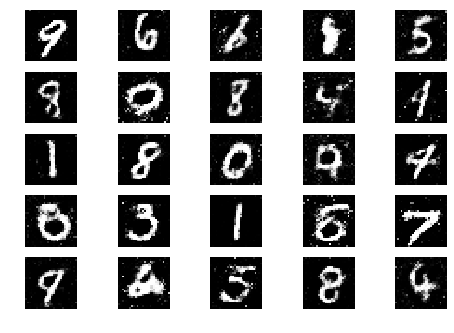

7251 [D loss: 0.650852, acc.: 64.84%] [G loss: 0.843696, acc.: 25.00%]
7252 [D loss: 0.672861, acc.: 59.77%] [G loss: 0.841511, acc.: 33.59%]
7253 [D loss: 0.692376, acc.: 54.30%] [G loss: 0.824614, acc.: 30.47%]
7254 [D loss: 0.692230, acc.: 53.91%] [G loss: 0.810837, acc.: 32.03%]
7255 [D loss: 0.635134, acc.: 68.36%] [G loss: 0.808930, acc.: 40.62%]
7256 [D loss: 0.668320, acc.: 56.25%] [G loss: 0.851528, acc.: 22.66%]
7257 [D loss: 0.681300, acc.: 55.47%] [G loss: 0.804867, acc.: 34.38%]
7258 [D loss: 0.661134, acc.: 58.98%] [G loss: 0.820988, acc.: 25.00%]
7259 [D loss: 0.667530, acc.: 56.64%] [G loss: 0.814409, acc.: 30.47%]
7260 [D loss: 0.695743, acc.: 55.47%] [G loss: 0.797836, acc.: 35.94%]
7261 [D loss: 0.676873, acc.: 59.38%] [G loss: 0.780770, acc.: 33.59%]
7262 [D loss: 0.666882, acc.: 59.38%] [G loss: 0.830418, acc.: 29.69%]
7263 [D loss: 0.682387, acc.: 56.64%] [G loss: 0.827730, acc.: 27.34%]
7264 [D loss: 0.662183, acc.: 58.98%] [G loss: 0.854063, acc.: 21.88%]
7265 [

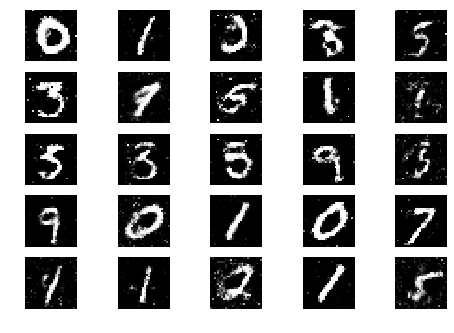

7301 [D loss: 0.660800, acc.: 59.77%] [G loss: 0.835209, acc.: 26.56%]
7302 [D loss: 0.687379, acc.: 53.91%] [G loss: 0.812966, acc.: 34.38%]
7303 [D loss: 0.687865, acc.: 54.69%] [G loss: 0.829228, acc.: 28.91%]
7304 [D loss: 0.669568, acc.: 62.50%] [G loss: 0.839082, acc.: 36.72%]
7305 [D loss: 0.686904, acc.: 58.98%] [G loss: 0.813160, acc.: 34.38%]
7306 [D loss: 0.673378, acc.: 57.42%] [G loss: 0.842103, acc.: 27.34%]
7307 [D loss: 0.671370, acc.: 58.20%] [G loss: 0.806134, acc.: 38.28%]
7308 [D loss: 0.685615, acc.: 55.47%] [G loss: 0.817195, acc.: 28.91%]
7309 [D loss: 0.678236, acc.: 60.94%] [G loss: 0.843391, acc.: 25.78%]
7310 [D loss: 0.651674, acc.: 62.89%] [G loss: 0.860948, acc.: 24.22%]
7311 [D loss: 0.696973, acc.: 55.86%] [G loss: 0.812866, acc.: 32.03%]
7312 [D loss: 0.673111, acc.: 57.81%] [G loss: 0.826185, acc.: 31.25%]
7313 [D loss: 0.689236, acc.: 54.69%] [G loss: 0.824902, acc.: 30.47%]
7314 [D loss: 0.681106, acc.: 53.12%] [G loss: 0.856785, acc.: 25.78%]
7315 [

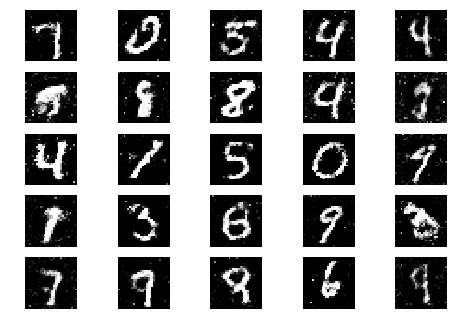

7351 [D loss: 0.661451, acc.: 56.25%] [G loss: 0.850199, acc.: 25.00%]
7352 [D loss: 0.682868, acc.: 56.25%] [G loss: 0.830380, acc.: 24.22%]
7353 [D loss: 0.665947, acc.: 57.03%] [G loss: 0.795560, acc.: 32.81%]
7354 [D loss: 0.678616, acc.: 58.20%] [G loss: 0.849990, acc.: 24.22%]
7355 [D loss: 0.688503, acc.: 56.25%] [G loss: 0.810127, acc.: 28.91%]
7356 [D loss: 0.664436, acc.: 61.33%] [G loss: 0.812514, acc.: 29.69%]
7357 [D loss: 0.649984, acc.: 69.53%] [G loss: 0.845356, acc.: 25.78%]
7358 [D loss: 0.685867, acc.: 55.47%] [G loss: 0.810057, acc.: 25.78%]
7359 [D loss: 0.686686, acc.: 59.38%] [G loss: 0.860200, acc.: 23.44%]
7360 [D loss: 0.660005, acc.: 61.72%] [G loss: 0.837797, acc.: 27.34%]
7361 [D loss: 0.664028, acc.: 60.94%] [G loss: 0.804157, acc.: 35.16%]
7362 [D loss: 0.661672, acc.: 61.72%] [G loss: 0.800174, acc.: 34.38%]
7363 [D loss: 0.673017, acc.: 62.50%] [G loss: 0.783872, acc.: 40.62%]
7364 [D loss: 0.673363, acc.: 61.33%] [G loss: 0.806172, acc.: 29.69%]
7365 [

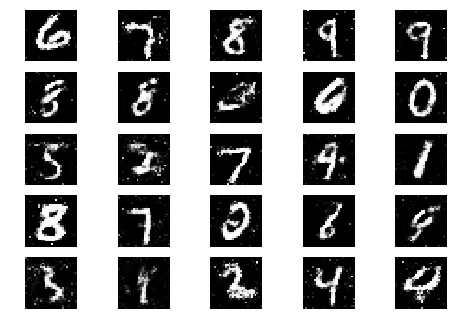

7401 [D loss: 0.679684, acc.: 57.03%] [G loss: 0.852490, acc.: 23.44%]
7402 [D loss: 0.684298, acc.: 57.03%] [G loss: 0.812242, acc.: 27.34%]
7403 [D loss: 0.658614, acc.: 60.16%] [G loss: 0.825034, acc.: 30.47%]
7404 [D loss: 0.669673, acc.: 58.59%] [G loss: 0.827820, acc.: 27.34%]
7405 [D loss: 0.674332, acc.: 58.20%] [G loss: 0.851523, acc.: 23.44%]
7406 [D loss: 0.662918, acc.: 59.38%] [G loss: 0.803853, acc.: 36.72%]
7407 [D loss: 0.666841, acc.: 58.59%] [G loss: 0.820379, acc.: 29.69%]
7408 [D loss: 0.692369, acc.: 53.52%] [G loss: 0.864609, acc.: 23.44%]
7409 [D loss: 0.684345, acc.: 58.20%] [G loss: 0.821354, acc.: 28.91%]
7410 [D loss: 0.672545, acc.: 55.08%] [G loss: 0.823295, acc.: 29.69%]
7411 [D loss: 0.678825, acc.: 57.81%] [G loss: 0.858464, acc.: 21.09%]
7412 [D loss: 0.660777, acc.: 61.33%] [G loss: 0.817619, acc.: 29.69%]
7413 [D loss: 0.650100, acc.: 66.80%] [G loss: 0.851836, acc.: 27.34%]
7414 [D loss: 0.686405, acc.: 53.52%] [G loss: 0.828821, acc.: 29.69%]
7415 [

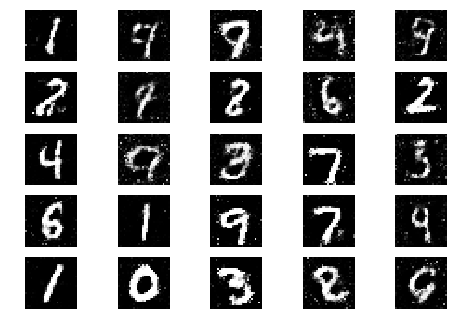

7451 [D loss: 0.651332, acc.: 64.06%] [G loss: 0.839416, acc.: 31.25%]
7452 [D loss: 0.677691, acc.: 60.55%] [G loss: 0.830175, acc.: 26.56%]
7453 [D loss: 0.663078, acc.: 64.45%] [G loss: 0.813746, acc.: 28.91%]
7454 [D loss: 0.678673, acc.: 55.86%] [G loss: 0.826534, acc.: 28.12%]
7455 [D loss: 0.682757, acc.: 52.34%] [G loss: 0.792364, acc.: 36.72%]
7456 [D loss: 0.682840, acc.: 60.16%] [G loss: 0.804421, acc.: 32.81%]
7457 [D loss: 0.669170, acc.: 57.81%] [G loss: 0.809263, acc.: 32.03%]
7458 [D loss: 0.706420, acc.: 50.39%] [G loss: 0.773045, acc.: 36.72%]
7459 [D loss: 0.677497, acc.: 55.08%] [G loss: 0.835909, acc.: 33.59%]
7460 [D loss: 0.670496, acc.: 60.94%] [G loss: 0.837978, acc.: 21.09%]
7461 [D loss: 0.682791, acc.: 54.69%] [G loss: 0.872570, acc.: 22.66%]
7462 [D loss: 0.676024, acc.: 56.64%] [G loss: 0.817024, acc.: 32.03%]
7463 [D loss: 0.654736, acc.: 60.94%] [G loss: 0.841241, acc.: 25.78%]
7464 [D loss: 0.676739, acc.: 60.55%] [G loss: 0.829997, acc.: 26.56%]
7465 [

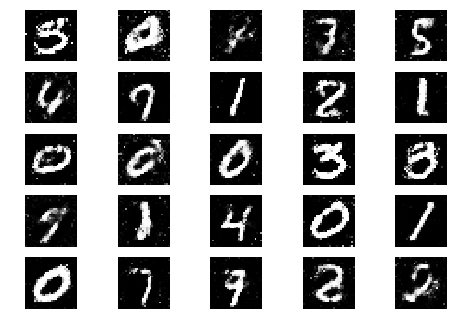

7501 [D loss: 0.694668, acc.: 52.73%] [G loss: 0.815206, acc.: 26.56%]
7502 [D loss: 0.674773, acc.: 58.59%] [G loss: 0.830213, acc.: 28.91%]
7503 [D loss: 0.714855, acc.: 48.83%] [G loss: 0.842724, acc.: 30.47%]
7504 [D loss: 0.696209, acc.: 55.86%] [G loss: 0.855414, acc.: 22.66%]
7505 [D loss: 0.650179, acc.: 62.50%] [G loss: 0.861884, acc.: 25.00%]
7506 [D loss: 0.673214, acc.: 59.77%] [G loss: 0.831030, acc.: 27.34%]
7507 [D loss: 0.671721, acc.: 60.16%] [G loss: 0.812958, acc.: 33.59%]
7508 [D loss: 0.687897, acc.: 56.25%] [G loss: 0.808394, acc.: 28.91%]
7509 [D loss: 0.678243, acc.: 56.25%] [G loss: 0.831036, acc.: 25.00%]
7510 [D loss: 0.670978, acc.: 56.64%] [G loss: 0.805952, acc.: 31.25%]
7511 [D loss: 0.673851, acc.: 55.86%] [G loss: 0.837629, acc.: 29.69%]
7512 [D loss: 0.680390, acc.: 57.81%] [G loss: 0.809914, acc.: 32.81%]
7513 [D loss: 0.665213, acc.: 62.50%] [G loss: 0.854970, acc.: 23.44%]
7514 [D loss: 0.705116, acc.: 51.95%] [G loss: 0.869904, acc.: 21.09%]
7515 [

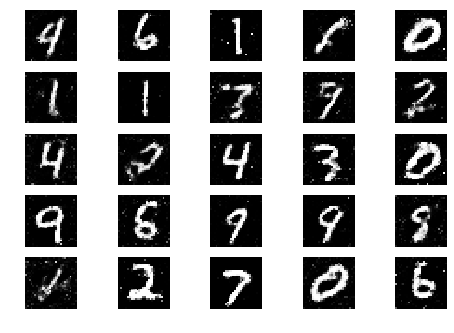

7551 [D loss: 0.682640, acc.: 55.47%] [G loss: 0.857309, acc.: 25.78%]
7552 [D loss: 0.690404, acc.: 55.08%] [G loss: 0.824808, acc.: 29.69%]
7553 [D loss: 0.653533, acc.: 62.11%] [G loss: 0.824067, acc.: 30.47%]
7554 [D loss: 0.678366, acc.: 57.42%] [G loss: 0.819491, acc.: 27.34%]
7555 [D loss: 0.653104, acc.: 62.50%] [G loss: 0.812346, acc.: 31.25%]
7556 [D loss: 0.693481, acc.: 51.95%] [G loss: 0.817894, acc.: 31.25%]
7557 [D loss: 0.668343, acc.: 64.06%] [G loss: 0.810445, acc.: 28.12%]
7558 [D loss: 0.663792, acc.: 57.81%] [G loss: 0.812630, acc.: 28.91%]
7559 [D loss: 0.664093, acc.: 59.77%] [G loss: 0.819418, acc.: 33.59%]
7560 [D loss: 0.679964, acc.: 59.38%] [G loss: 0.839442, acc.: 27.34%]
7561 [D loss: 0.686941, acc.: 54.69%] [G loss: 0.854303, acc.: 17.97%]
7562 [D loss: 0.660940, acc.: 61.72%] [G loss: 0.845935, acc.: 22.66%]
7563 [D loss: 0.665480, acc.: 58.59%] [G loss: 0.823025, acc.: 30.47%]
7564 [D loss: 0.681604, acc.: 57.03%] [G loss: 0.797394, acc.: 39.06%]
7565 [

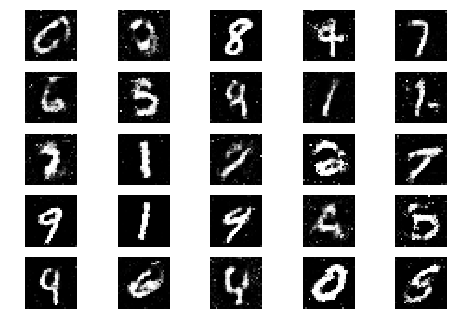

7601 [D loss: 0.686243, acc.: 55.47%] [G loss: 0.791608, acc.: 36.72%]
7602 [D loss: 0.675380, acc.: 56.64%] [G loss: 0.805308, acc.: 35.16%]
7603 [D loss: 0.683347, acc.: 54.30%] [G loss: 0.810648, acc.: 28.91%]
7604 [D loss: 0.672856, acc.: 57.42%] [G loss: 0.827568, acc.: 28.91%]
7605 [D loss: 0.657900, acc.: 57.81%] [G loss: 0.806771, acc.: 29.69%]
7606 [D loss: 0.679378, acc.: 57.81%] [G loss: 0.815585, acc.: 26.56%]
7607 [D loss: 0.683213, acc.: 57.81%] [G loss: 0.821401, acc.: 32.03%]
7608 [D loss: 0.672525, acc.: 55.86%] [G loss: 0.843067, acc.: 28.12%]
7609 [D loss: 0.675978, acc.: 59.77%] [G loss: 0.817819, acc.: 34.38%]
7610 [D loss: 0.676543, acc.: 57.03%] [G loss: 0.851357, acc.: 25.78%]
7611 [D loss: 0.684806, acc.: 49.61%] [G loss: 0.862496, acc.: 16.41%]
7612 [D loss: 0.677415, acc.: 57.81%] [G loss: 0.827122, acc.: 18.75%]
7613 [D loss: 0.665519, acc.: 60.94%] [G loss: 0.818087, acc.: 28.91%]
7614 [D loss: 0.668159, acc.: 60.55%] [G loss: 0.841529, acc.: 27.34%]
7615 [

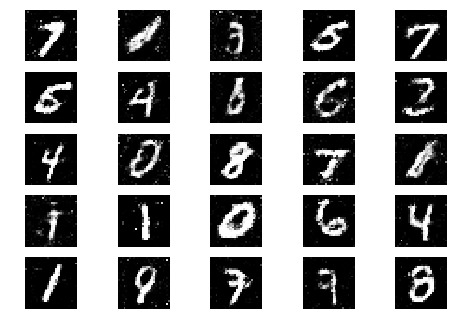

7651 [D loss: 0.652172, acc.: 62.89%] [G loss: 0.855301, acc.: 25.00%]
7652 [D loss: 0.676093, acc.: 55.86%] [G loss: 0.810344, acc.: 29.69%]
7653 [D loss: 0.693177, acc.: 56.25%] [G loss: 0.790528, acc.: 26.56%]
7654 [D loss: 0.668687, acc.: 60.16%] [G loss: 0.790418, acc.: 34.38%]
7655 [D loss: 0.670559, acc.: 57.03%] [G loss: 0.835745, acc.: 26.56%]
7656 [D loss: 0.645833, acc.: 66.80%] [G loss: 0.817114, acc.: 26.56%]
7657 [D loss: 0.680804, acc.: 57.42%] [G loss: 0.833393, acc.: 28.91%]
7658 [D loss: 0.683894, acc.: 60.94%] [G loss: 0.806556, acc.: 27.34%]
7659 [D loss: 0.656457, acc.: 62.50%] [G loss: 0.845565, acc.: 25.00%]
7660 [D loss: 0.675498, acc.: 57.03%] [G loss: 0.796948, acc.: 36.72%]
7661 [D loss: 0.668968, acc.: 58.59%] [G loss: 0.833573, acc.: 25.00%]
7662 [D loss: 0.670059, acc.: 60.16%] [G loss: 0.817525, acc.: 32.81%]
7663 [D loss: 0.667273, acc.: 58.20%] [G loss: 0.832911, acc.: 23.44%]
7664 [D loss: 0.662729, acc.: 61.72%] [G loss: 0.854047, acc.: 29.69%]
7665 [

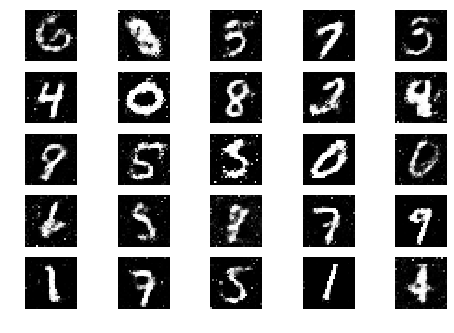

7701 [D loss: 0.663379, acc.: 59.38%] [G loss: 0.835137, acc.: 29.69%]
7702 [D loss: 0.678287, acc.: 54.30%] [G loss: 0.836709, acc.: 27.34%]
7703 [D loss: 0.652466, acc.: 62.89%] [G loss: 0.804079, acc.: 32.03%]
7704 [D loss: 0.672628, acc.: 60.55%] [G loss: 0.826156, acc.: 25.78%]
7705 [D loss: 0.673616, acc.: 57.81%] [G loss: 0.839532, acc.: 26.56%]
7706 [D loss: 0.675634, acc.: 56.64%] [G loss: 0.863184, acc.: 23.44%]
7707 [D loss: 0.677822, acc.: 57.03%] [G loss: 0.803653, acc.: 37.50%]
7708 [D loss: 0.683651, acc.: 54.30%] [G loss: 0.814022, acc.: 35.16%]
7709 [D loss: 0.671013, acc.: 59.38%] [G loss: 0.847625, acc.: 33.59%]
7710 [D loss: 0.673510, acc.: 59.77%] [G loss: 0.821886, acc.: 28.91%]
7711 [D loss: 0.688506, acc.: 53.12%] [G loss: 0.820251, acc.: 29.69%]
7712 [D loss: 0.659787, acc.: 62.11%] [G loss: 0.836134, acc.: 33.59%]
7713 [D loss: 0.679070, acc.: 55.08%] [G loss: 0.843895, acc.: 25.00%]
7714 [D loss: 0.654381, acc.: 59.38%] [G loss: 0.886460, acc.: 21.88%]
7715 [

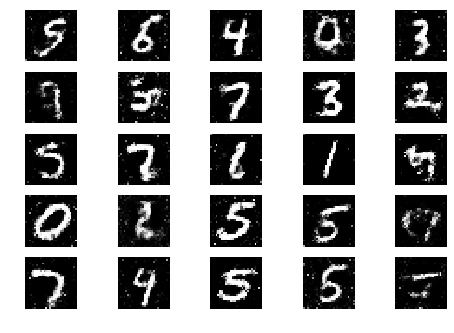

7751 [D loss: 0.680300, acc.: 56.64%] [G loss: 0.795952, acc.: 29.69%]
7752 [D loss: 0.671034, acc.: 59.38%] [G loss: 0.833393, acc.: 28.12%]
7753 [D loss: 0.690943, acc.: 54.69%] [G loss: 0.787436, acc.: 27.34%]
7754 [D loss: 0.662534, acc.: 60.55%] [G loss: 0.824889, acc.: 32.81%]
7755 [D loss: 0.670996, acc.: 57.81%] [G loss: 0.831118, acc.: 23.44%]
7756 [D loss: 0.679184, acc.: 54.30%] [G loss: 0.821835, acc.: 26.56%]
7757 [D loss: 0.673938, acc.: 60.16%] [G loss: 0.810949, acc.: 25.00%]
7758 [D loss: 0.669676, acc.: 54.30%] [G loss: 0.829162, acc.: 27.34%]
7759 [D loss: 0.647840, acc.: 64.45%] [G loss: 0.802853, acc.: 29.69%]
7760 [D loss: 0.672962, acc.: 57.81%] [G loss: 0.768981, acc.: 36.72%]
7761 [D loss: 0.704366, acc.: 50.39%] [G loss: 0.837060, acc.: 24.22%]
7762 [D loss: 0.676004, acc.: 54.30%] [G loss: 0.815995, acc.: 25.78%]
7763 [D loss: 0.678480, acc.: 56.64%] [G loss: 0.859035, acc.: 25.00%]
7764 [D loss: 0.690813, acc.: 54.30%] [G loss: 0.816675, acc.: 25.00%]
7765 [

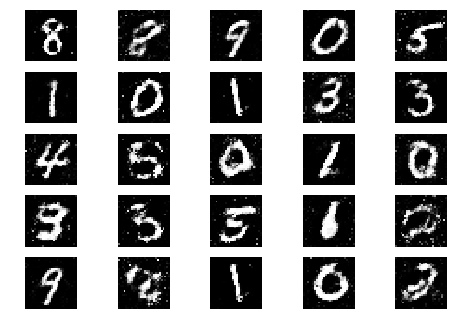

7801 [D loss: 0.665357, acc.: 57.42%] [G loss: 0.804925, acc.: 37.50%]
7802 [D loss: 0.676976, acc.: 60.94%] [G loss: 0.818398, acc.: 31.25%]
7803 [D loss: 0.649792, acc.: 64.84%] [G loss: 0.859641, acc.: 20.31%]
7804 [D loss: 0.640150, acc.: 64.84%] [G loss: 0.880498, acc.: 17.19%]
7805 [D loss: 0.688697, acc.: 53.91%] [G loss: 0.897120, acc.: 15.62%]
7806 [D loss: 0.693807, acc.: 53.52%] [G loss: 0.838195, acc.: 28.91%]
7807 [D loss: 0.669558, acc.: 58.20%] [G loss: 0.856727, acc.: 26.56%]
7808 [D loss: 0.696615, acc.: 53.91%] [G loss: 0.871704, acc.: 26.56%]
7809 [D loss: 0.676158, acc.: 55.86%] [G loss: 0.839225, acc.: 30.47%]
7810 [D loss: 0.674775, acc.: 57.81%] [G loss: 0.823978, acc.: 34.38%]
7811 [D loss: 0.682513, acc.: 55.47%] [G loss: 0.818032, acc.: 35.94%]
7812 [D loss: 0.663717, acc.: 58.20%] [G loss: 0.830218, acc.: 33.59%]
7813 [D loss: 0.663068, acc.: 58.59%] [G loss: 0.809668, acc.: 28.12%]
7814 [D loss: 0.661806, acc.: 60.94%] [G loss: 0.821889, acc.: 29.69%]
7815 [

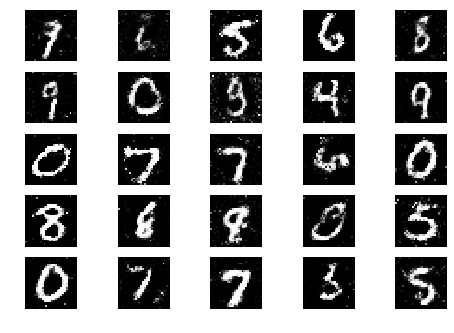

7851 [D loss: 0.705981, acc.: 55.08%] [G loss: 0.796748, acc.: 33.59%]
7852 [D loss: 0.658767, acc.: 61.33%] [G loss: 0.807073, acc.: 30.47%]
7853 [D loss: 0.656600, acc.: 60.55%] [G loss: 0.793489, acc.: 30.47%]
7854 [D loss: 0.682259, acc.: 57.03%] [G loss: 0.830900, acc.: 28.12%]
7855 [D loss: 0.670662, acc.: 57.81%] [G loss: 0.857258, acc.: 27.34%]
7856 [D loss: 0.684847, acc.: 56.64%] [G loss: 0.861873, acc.: 25.00%]
7857 [D loss: 0.654948, acc.: 60.94%] [G loss: 0.835349, acc.: 25.78%]
7858 [D loss: 0.665826, acc.: 60.94%] [G loss: 0.824333, acc.: 26.56%]
7859 [D loss: 0.646602, acc.: 63.28%] [G loss: 0.811385, acc.: 35.94%]
7860 [D loss: 0.702962, acc.: 54.30%] [G loss: 0.821724, acc.: 28.12%]
7861 [D loss: 0.647541, acc.: 64.45%] [G loss: 0.833296, acc.: 25.00%]
7862 [D loss: 0.674089, acc.: 55.86%] [G loss: 0.816449, acc.: 25.78%]
7863 [D loss: 0.654986, acc.: 61.33%] [G loss: 0.813873, acc.: 34.38%]
7864 [D loss: 0.671869, acc.: 57.81%] [G loss: 0.839996, acc.: 27.34%]
7865 [

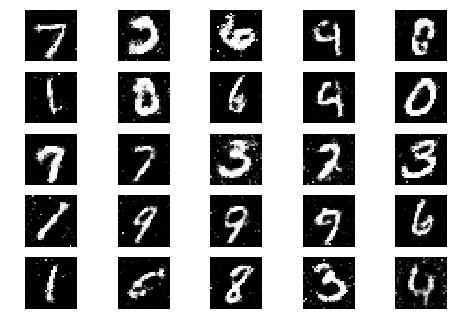

7901 [D loss: 0.677629, acc.: 58.20%] [G loss: 0.814955, acc.: 33.59%]
7902 [D loss: 0.665461, acc.: 58.59%] [G loss: 0.872399, acc.: 26.56%]
7903 [D loss: 0.686713, acc.: 58.59%] [G loss: 0.815142, acc.: 34.38%]
7904 [D loss: 0.692773, acc.: 53.12%] [G loss: 0.832648, acc.: 23.44%]
7905 [D loss: 0.693707, acc.: 53.91%] [G loss: 0.839237, acc.: 29.69%]
7906 [D loss: 0.675054, acc.: 55.08%] [G loss: 0.834217, acc.: 25.78%]
7907 [D loss: 0.683531, acc.: 56.64%] [G loss: 0.833031, acc.: 28.12%]
7908 [D loss: 0.664082, acc.: 58.59%] [G loss: 0.859469, acc.: 24.22%]
7909 [D loss: 0.667978, acc.: 57.03%] [G loss: 0.853078, acc.: 28.12%]
7910 [D loss: 0.682500, acc.: 55.47%] [G loss: 0.844984, acc.: 25.00%]
7911 [D loss: 0.653169, acc.: 61.33%] [G loss: 0.830724, acc.: 25.78%]
7912 [D loss: 0.680981, acc.: 56.25%] [G loss: 0.824302, acc.: 28.91%]
7913 [D loss: 0.665557, acc.: 58.59%] [G loss: 0.803737, acc.: 28.91%]
7914 [D loss: 0.665460, acc.: 60.94%] [G loss: 0.821961, acc.: 30.47%]
7915 [

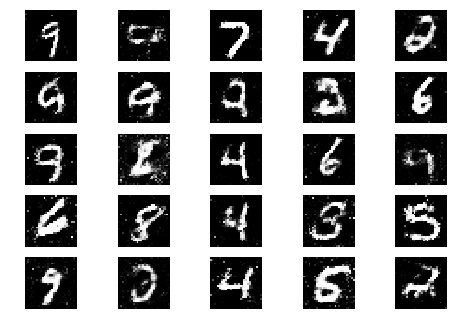

7951 [D loss: 0.672258, acc.: 55.47%] [G loss: 0.841030, acc.: 21.88%]
7952 [D loss: 0.657902, acc.: 61.72%] [G loss: 0.839699, acc.: 25.00%]
7953 [D loss: 0.654221, acc.: 64.45%] [G loss: 0.875984, acc.: 22.66%]
7954 [D loss: 0.689868, acc.: 54.69%] [G loss: 0.824156, acc.: 26.56%]
7955 [D loss: 0.667673, acc.: 59.77%] [G loss: 0.820095, acc.: 28.91%]
7956 [D loss: 0.699354, acc.: 48.83%] [G loss: 0.814956, acc.: 30.47%]
7957 [D loss: 0.658368, acc.: 61.72%] [G loss: 0.786565, acc.: 33.59%]
7958 [D loss: 0.669200, acc.: 59.38%] [G loss: 0.843852, acc.: 25.00%]
7959 [D loss: 0.670993, acc.: 63.67%] [G loss: 0.801666, acc.: 32.03%]
7960 [D loss: 0.689987, acc.: 53.12%] [G loss: 0.818523, acc.: 25.00%]
7961 [D loss: 0.651742, acc.: 60.16%] [G loss: 0.793275, acc.: 33.59%]
7962 [D loss: 0.654921, acc.: 61.72%] [G loss: 0.806394, acc.: 35.16%]
7963 [D loss: 0.678833, acc.: 55.47%] [G loss: 0.844853, acc.: 24.22%]
7964 [D loss: 0.674589, acc.: 56.25%] [G loss: 0.830303, acc.: 27.34%]
7965 [

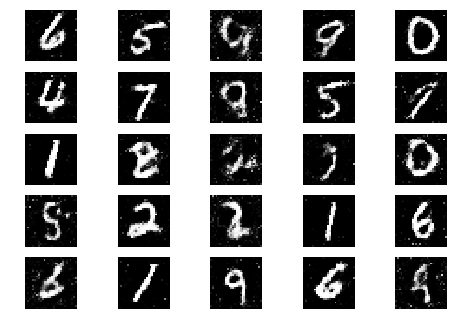

8001 [D loss: 0.657914, acc.: 62.11%] [G loss: 0.820799, acc.: 29.69%]
8002 [D loss: 0.696954, acc.: 51.56%] [G loss: 0.818986, acc.: 25.00%]
8003 [D loss: 0.679249, acc.: 56.64%] [G loss: 0.798252, acc.: 33.59%]
8004 [D loss: 0.694870, acc.: 52.34%] [G loss: 0.799303, acc.: 32.81%]
8005 [D loss: 0.676451, acc.: 54.69%] [G loss: 0.797818, acc.: 35.94%]
8006 [D loss: 0.653829, acc.: 62.50%] [G loss: 0.809557, acc.: 34.38%]
8007 [D loss: 0.692985, acc.: 51.56%] [G loss: 0.832146, acc.: 26.56%]
8008 [D loss: 0.674642, acc.: 53.12%] [G loss: 0.816674, acc.: 31.25%]
8009 [D loss: 0.655120, acc.: 62.11%] [G loss: 0.846457, acc.: 23.44%]
8010 [D loss: 0.698819, acc.: 51.95%] [G loss: 0.828945, acc.: 22.66%]
8011 [D loss: 0.676475, acc.: 59.77%] [G loss: 0.806491, acc.: 32.81%]
8012 [D loss: 0.663419, acc.: 61.72%] [G loss: 0.828331, acc.: 23.44%]
8013 [D loss: 0.693850, acc.: 50.78%] [G loss: 0.834663, acc.: 18.75%]
8014 [D loss: 0.681859, acc.: 55.08%] [G loss: 0.866654, acc.: 18.75%]
8015 [

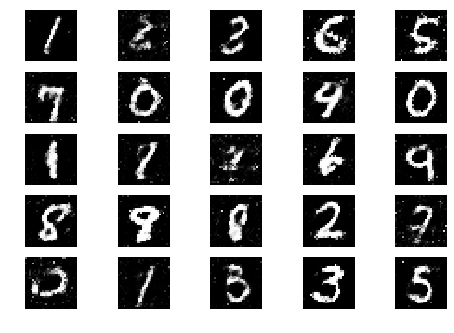

8051 [D loss: 0.668317, acc.: 58.98%] [G loss: 0.830758, acc.: 21.09%]
8052 [D loss: 0.674119, acc.: 58.59%] [G loss: 0.816705, acc.: 28.12%]
8053 [D loss: 0.662772, acc.: 60.94%] [G loss: 0.847699, acc.: 21.09%]
8054 [D loss: 0.665391, acc.: 60.16%] [G loss: 0.814695, acc.: 29.69%]
8055 [D loss: 0.689196, acc.: 56.25%] [G loss: 0.818741, acc.: 25.00%]
8056 [D loss: 0.677261, acc.: 57.03%] [G loss: 0.827454, acc.: 25.00%]
8057 [D loss: 0.674815, acc.: 58.20%] [G loss: 0.859347, acc.: 21.88%]
8058 [D loss: 0.677560, acc.: 57.03%] [G loss: 0.875319, acc.: 28.91%]
8059 [D loss: 0.687765, acc.: 55.08%] [G loss: 0.821082, acc.: 29.69%]
8060 [D loss: 0.666558, acc.: 60.94%] [G loss: 0.854707, acc.: 26.56%]
8061 [D loss: 0.656891, acc.: 59.38%] [G loss: 0.826443, acc.: 25.78%]
8062 [D loss: 0.654755, acc.: 60.94%] [G loss: 0.848826, acc.: 26.56%]
8063 [D loss: 0.678481, acc.: 56.25%] [G loss: 0.849806, acc.: 25.78%]
8064 [D loss: 0.675089, acc.: 56.25%] [G loss: 0.837286, acc.: 15.62%]
8065 [

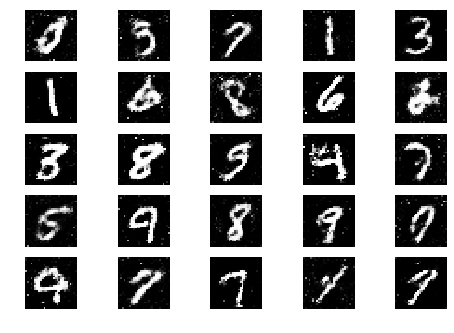

8101 [D loss: 0.657712, acc.: 62.50%] [G loss: 0.833849, acc.: 29.69%]
8102 [D loss: 0.677572, acc.: 62.11%] [G loss: 0.837180, acc.: 27.34%]
8103 [D loss: 0.661715, acc.: 62.11%] [G loss: 0.841885, acc.: 26.56%]
8104 [D loss: 0.685933, acc.: 58.98%] [G loss: 0.828137, acc.: 30.47%]
8105 [D loss: 0.675505, acc.: 58.59%] [G loss: 0.783477, acc.: 32.03%]
8106 [D loss: 0.674462, acc.: 56.64%] [G loss: 0.838730, acc.: 25.78%]
8107 [D loss: 0.673232, acc.: 60.16%] [G loss: 0.832943, acc.: 28.91%]
8108 [D loss: 0.645148, acc.: 61.33%] [G loss: 0.836066, acc.: 37.50%]
8109 [D loss: 0.689874, acc.: 58.59%] [G loss: 0.847898, acc.: 25.78%]
8110 [D loss: 0.669223, acc.: 58.59%] [G loss: 0.811332, acc.: 28.91%]
8111 [D loss: 0.681139, acc.: 53.52%] [G loss: 0.862693, acc.: 25.78%]
8112 [D loss: 0.660274, acc.: 62.89%] [G loss: 0.889936, acc.: 22.66%]
8113 [D loss: 0.679515, acc.: 57.03%] [G loss: 0.858850, acc.: 24.22%]
8114 [D loss: 0.700374, acc.: 52.73%] [G loss: 0.829277, acc.: 31.25%]
8115 [

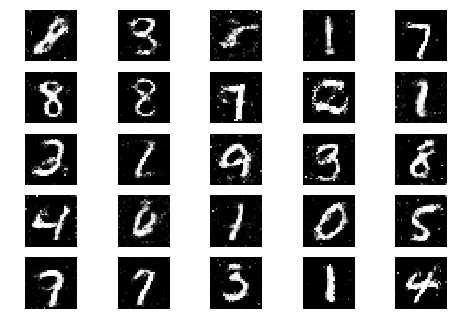

8151 [D loss: 0.682838, acc.: 56.64%] [G loss: 0.801013, acc.: 35.94%]
8152 [D loss: 0.678450, acc.: 53.91%] [G loss: 0.793200, acc.: 32.81%]
8153 [D loss: 0.709673, acc.: 51.95%] [G loss: 0.845128, acc.: 27.34%]
8154 [D loss: 0.680362, acc.: 52.73%] [G loss: 0.822541, acc.: 29.69%]
8155 [D loss: 0.670619, acc.: 55.47%] [G loss: 0.868782, acc.: 21.88%]
8156 [D loss: 0.681010, acc.: 55.47%] [G loss: 0.861612, acc.: 27.34%]
8157 [D loss: 0.688704, acc.: 54.30%] [G loss: 0.822868, acc.: 32.03%]
8158 [D loss: 0.676837, acc.: 61.72%] [G loss: 0.841711, acc.: 24.22%]
8159 [D loss: 0.674667, acc.: 58.59%] [G loss: 0.841437, acc.: 21.88%]
8160 [D loss: 0.669295, acc.: 59.77%] [G loss: 0.873594, acc.: 22.66%]
8161 [D loss: 0.669398, acc.: 58.59%] [G loss: 0.814515, acc.: 29.69%]
8162 [D loss: 0.683528, acc.: 55.86%] [G loss: 0.835703, acc.: 25.78%]
8163 [D loss: 0.690032, acc.: 57.81%] [G loss: 0.811356, acc.: 36.72%]
8164 [D loss: 0.647759, acc.: 62.89%] [G loss: 0.839500, acc.: 27.34%]
8165 [

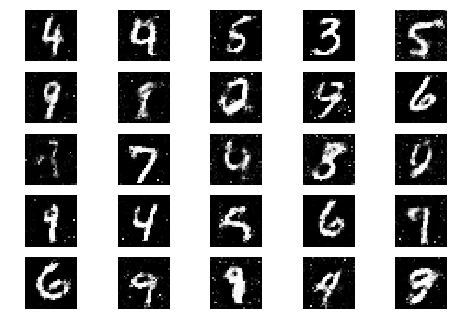

8201 [D loss: 0.671406, acc.: 57.81%] [G loss: 0.818696, acc.: 33.59%]
8202 [D loss: 0.644895, acc.: 61.72%] [G loss: 0.826657, acc.: 29.69%]
8203 [D loss: 0.687178, acc.: 56.25%] [G loss: 0.831862, acc.: 28.91%]
8204 [D loss: 0.666019, acc.: 58.20%] [G loss: 0.813771, acc.: 29.69%]
8205 [D loss: 0.691890, acc.: 54.69%] [G loss: 0.812631, acc.: 28.12%]
8206 [D loss: 0.670979, acc.: 58.59%] [G loss: 0.828563, acc.: 25.00%]
8207 [D loss: 0.668121, acc.: 57.03%] [G loss: 0.829947, acc.: 25.00%]
8208 [D loss: 0.670532, acc.: 58.59%] [G loss: 0.808408, acc.: 28.12%]
8209 [D loss: 0.653905, acc.: 61.72%] [G loss: 0.812068, acc.: 34.38%]
8210 [D loss: 0.688307, acc.: 57.03%] [G loss: 0.809701, acc.: 32.81%]
8211 [D loss: 0.674751, acc.: 58.59%] [G loss: 0.798361, acc.: 32.03%]
8212 [D loss: 0.646589, acc.: 63.67%] [G loss: 0.861520, acc.: 26.56%]
8213 [D loss: 0.697113, acc.: 55.08%] [G loss: 0.840134, acc.: 25.00%]
8214 [D loss: 0.678063, acc.: 57.81%] [G loss: 0.801185, acc.: 32.03%]
8215 [

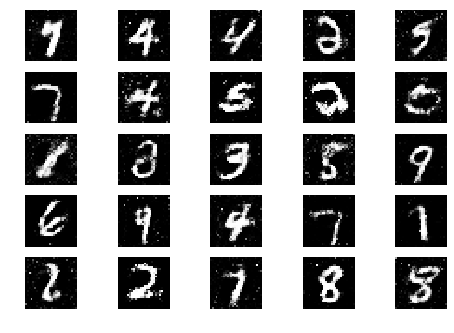

8251 [D loss: 0.662072, acc.: 62.11%] [G loss: 0.855943, acc.: 25.00%]
8252 [D loss: 0.656119, acc.: 59.77%] [G loss: 0.865963, acc.: 24.22%]
8253 [D loss: 0.651959, acc.: 64.45%] [G loss: 0.862507, acc.: 26.56%]
8254 [D loss: 0.662277, acc.: 61.33%] [G loss: 0.817584, acc.: 29.69%]
8255 [D loss: 0.683087, acc.: 58.98%] [G loss: 0.814538, acc.: 31.25%]
8256 [D loss: 0.644746, acc.: 62.50%] [G loss: 0.802529, acc.: 34.38%]
8257 [D loss: 0.686377, acc.: 56.64%] [G loss: 0.819433, acc.: 35.16%]
8258 [D loss: 0.701026, acc.: 55.08%] [G loss: 0.851542, acc.: 28.12%]
8259 [D loss: 0.661589, acc.: 62.11%] [G loss: 0.859703, acc.: 25.00%]
8260 [D loss: 0.669672, acc.: 58.98%] [G loss: 0.847691, acc.: 28.12%]
8261 [D loss: 0.706029, acc.: 51.95%] [G loss: 0.822366, acc.: 29.69%]
8262 [D loss: 0.662825, acc.: 57.81%] [G loss: 0.840048, acc.: 25.00%]
8263 [D loss: 0.680600, acc.: 56.64%] [G loss: 0.809917, acc.: 31.25%]
8264 [D loss: 0.664908, acc.: 58.59%] [G loss: 0.813702, acc.: 34.38%]
8265 [

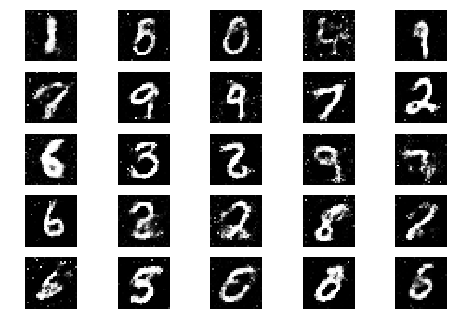

8301 [D loss: 0.659670, acc.: 60.94%] [G loss: 0.803746, acc.: 31.25%]
8302 [D loss: 0.683749, acc.: 58.20%] [G loss: 0.822297, acc.: 27.34%]
8303 [D loss: 0.692059, acc.: 55.86%] [G loss: 0.829823, acc.: 28.91%]
8304 [D loss: 0.696015, acc.: 50.00%] [G loss: 0.822675, acc.: 31.25%]
8305 [D loss: 0.658430, acc.: 60.16%] [G loss: 0.843065, acc.: 27.34%]
8306 [D loss: 0.669659, acc.: 57.42%] [G loss: 0.850758, acc.: 33.59%]
8307 [D loss: 0.701110, acc.: 58.20%] [G loss: 0.832505, acc.: 26.56%]
8308 [D loss: 0.711773, acc.: 49.61%] [G loss: 0.813693, acc.: 28.12%]
8309 [D loss: 0.654501, acc.: 61.33%] [G loss: 0.814010, acc.: 28.12%]
8310 [D loss: 0.687351, acc.: 55.08%] [G loss: 0.835766, acc.: 23.44%]
8311 [D loss: 0.669051, acc.: 57.81%] [G loss: 0.807108, acc.: 31.25%]
8312 [D loss: 0.675328, acc.: 56.25%] [G loss: 0.827687, acc.: 25.00%]
8313 [D loss: 0.664502, acc.: 61.72%] [G loss: 0.825421, acc.: 24.22%]
8314 [D loss: 0.668456, acc.: 59.77%] [G loss: 0.821660, acc.: 28.12%]
8315 [

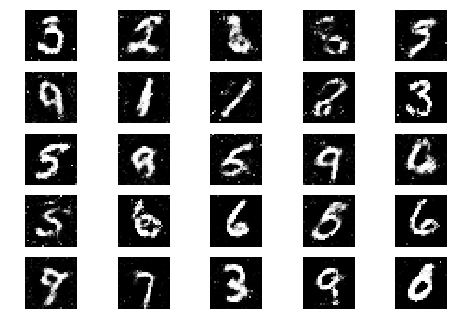

8351 [D loss: 0.675822, acc.: 58.59%] [G loss: 0.849601, acc.: 24.22%]
8352 [D loss: 0.685471, acc.: 54.30%] [G loss: 0.822257, acc.: 28.91%]
8353 [D loss: 0.661135, acc.: 60.55%] [G loss: 0.815410, acc.: 31.25%]
8354 [D loss: 0.683254, acc.: 56.64%] [G loss: 0.845872, acc.: 25.78%]
8355 [D loss: 0.682309, acc.: 52.73%] [G loss: 0.823810, acc.: 28.12%]
8356 [D loss: 0.682603, acc.: 53.12%] [G loss: 0.828891, acc.: 28.12%]
8357 [D loss: 0.682980, acc.: 58.20%] [G loss: 0.843052, acc.: 25.78%]
8358 [D loss: 0.660138, acc.: 58.98%] [G loss: 0.882432, acc.: 19.53%]
8359 [D loss: 0.679813, acc.: 55.86%] [G loss: 0.827178, acc.: 28.12%]
8360 [D loss: 0.655101, acc.: 61.72%] [G loss: 0.836035, acc.: 26.56%]
8361 [D loss: 0.670995, acc.: 56.25%] [G loss: 0.821160, acc.: 29.69%]
8362 [D loss: 0.679924, acc.: 55.08%] [G loss: 0.808618, acc.: 32.03%]
8363 [D loss: 0.672931, acc.: 55.47%] [G loss: 0.853478, acc.: 26.56%]
8364 [D loss: 0.681379, acc.: 53.52%] [G loss: 0.836165, acc.: 29.69%]
8365 [

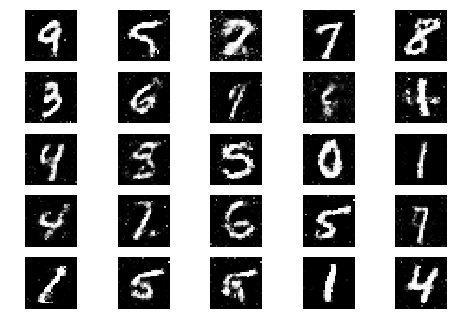

8401 [D loss: 0.659431, acc.: 60.94%] [G loss: 0.797567, acc.: 34.38%]
8402 [D loss: 0.692023, acc.: 56.25%] [G loss: 0.824473, acc.: 26.56%]
8403 [D loss: 0.690373, acc.: 58.20%] [G loss: 0.807469, acc.: 28.12%]
8404 [D loss: 0.693257, acc.: 51.56%] [G loss: 0.820646, acc.: 25.00%]
8405 [D loss: 0.683350, acc.: 53.91%] [G loss: 0.811227, acc.: 33.59%]
8406 [D loss: 0.673355, acc.: 54.69%] [G loss: 0.805568, acc.: 34.38%]
8407 [D loss: 0.671967, acc.: 60.55%] [G loss: 0.818658, acc.: 28.91%]
8408 [D loss: 0.693301, acc.: 54.69%] [G loss: 0.837283, acc.: 20.31%]
8409 [D loss: 0.675039, acc.: 55.47%] [G loss: 0.834419, acc.: 26.56%]
8410 [D loss: 0.686956, acc.: 52.34%] [G loss: 0.841632, acc.: 23.44%]
8411 [D loss: 0.662667, acc.: 60.55%] [G loss: 0.819901, acc.: 35.16%]
8412 [D loss: 0.708276, acc.: 51.95%] [G loss: 0.861200, acc.: 18.75%]
8413 [D loss: 0.641364, acc.: 64.45%] [G loss: 0.843106, acc.: 23.44%]
8414 [D loss: 0.689509, acc.: 51.95%] [G loss: 0.826953, acc.: 30.47%]
8415 [

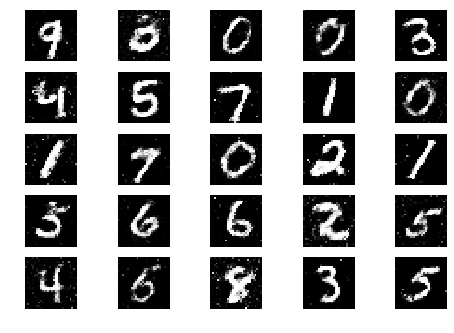

8451 [D loss: 0.693460, acc.: 55.08%] [G loss: 0.824393, acc.: 26.56%]
8452 [D loss: 0.677805, acc.: 55.08%] [G loss: 0.823076, acc.: 25.00%]
8453 [D loss: 0.671221, acc.: 54.30%] [G loss: 0.802524, acc.: 31.25%]
8454 [D loss: 0.692460, acc.: 54.30%] [G loss: 0.836526, acc.: 23.44%]
8455 [D loss: 0.669152, acc.: 59.77%] [G loss: 0.827025, acc.: 28.12%]
8456 [D loss: 0.654990, acc.: 58.98%] [G loss: 0.838044, acc.: 32.03%]
8457 [D loss: 0.661277, acc.: 59.77%] [G loss: 0.844241, acc.: 31.25%]
8458 [D loss: 0.659418, acc.: 58.20%] [G loss: 0.835428, acc.: 31.25%]
8459 [D loss: 0.675229, acc.: 54.30%] [G loss: 0.784230, acc.: 35.16%]
8460 [D loss: 0.695750, acc.: 56.25%] [G loss: 0.832126, acc.: 23.44%]
8461 [D loss: 0.683238, acc.: 55.08%] [G loss: 0.809695, acc.: 28.12%]
8462 [D loss: 0.674366, acc.: 60.55%] [G loss: 0.839936, acc.: 32.81%]
8463 [D loss: 0.678103, acc.: 57.03%] [G loss: 0.830924, acc.: 31.25%]
8464 [D loss: 0.673010, acc.: 60.55%] [G loss: 0.844787, acc.: 27.34%]
8465 [

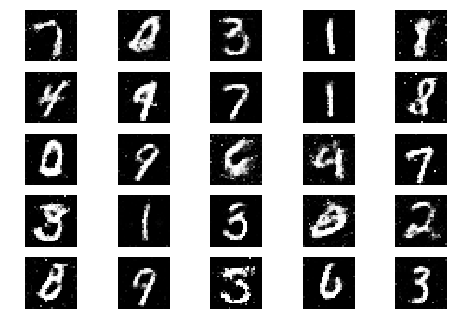

8501 [D loss: 0.669068, acc.: 60.55%] [G loss: 0.826458, acc.: 30.47%]
8502 [D loss: 0.661247, acc.: 64.84%] [G loss: 0.831300, acc.: 25.78%]
8503 [D loss: 0.700754, acc.: 50.00%] [G loss: 0.794947, acc.: 31.25%]
8504 [D loss: 0.673836, acc.: 58.59%] [G loss: 0.809456, acc.: 30.47%]
8505 [D loss: 0.661453, acc.: 61.72%] [G loss: 0.830004, acc.: 26.56%]
8506 [D loss: 0.656324, acc.: 62.50%] [G loss: 0.832543, acc.: 29.69%]
8507 [D loss: 0.662327, acc.: 60.55%] [G loss: 0.862415, acc.: 26.56%]
8508 [D loss: 0.688659, acc.: 54.69%] [G loss: 0.783673, acc.: 34.38%]
8509 [D loss: 0.678634, acc.: 57.42%] [G loss: 0.824779, acc.: 25.78%]
8510 [D loss: 0.654106, acc.: 65.23%] [G loss: 0.852569, acc.: 27.34%]
8511 [D loss: 0.675050, acc.: 61.72%] [G loss: 0.822485, acc.: 31.25%]
8512 [D loss: 0.675396, acc.: 55.86%] [G loss: 0.781363, acc.: 35.16%]
8513 [D loss: 0.702076, acc.: 54.30%] [G loss: 0.818406, acc.: 25.00%]
8514 [D loss: 0.686820, acc.: 56.64%] [G loss: 0.843012, acc.: 23.44%]
8515 [

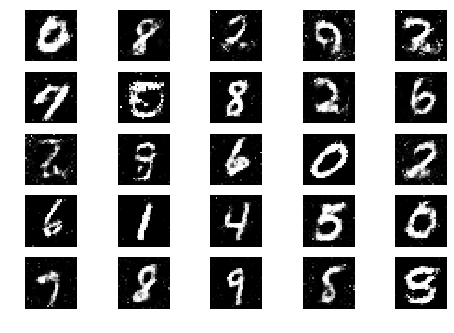

8551 [D loss: 0.665781, acc.: 58.98%] [G loss: 0.856437, acc.: 26.56%]
8552 [D loss: 0.678362, acc.: 58.20%] [G loss: 0.834326, acc.: 28.91%]
8553 [D loss: 0.670661, acc.: 62.50%] [G loss: 0.824703, acc.: 31.25%]
8554 [D loss: 0.676038, acc.: 53.91%] [G loss: 0.833698, acc.: 28.91%]
8555 [D loss: 0.657416, acc.: 64.45%] [G loss: 0.820525, acc.: 35.16%]
8556 [D loss: 0.692929, acc.: 53.12%] [G loss: 0.792853, acc.: 35.16%]
8557 [D loss: 0.648827, acc.: 58.20%] [G loss: 0.785826, acc.: 35.94%]
8558 [D loss: 0.669458, acc.: 58.98%] [G loss: 0.841236, acc.: 22.66%]
8559 [D loss: 0.673589, acc.: 57.42%] [G loss: 0.818140, acc.: 25.78%]
8560 [D loss: 0.676273, acc.: 59.38%] [G loss: 0.833632, acc.: 30.47%]
8561 [D loss: 0.643173, acc.: 64.06%] [G loss: 0.848799, acc.: 25.00%]
8562 [D loss: 0.647502, acc.: 64.45%] [G loss: 0.833616, acc.: 31.25%]
8563 [D loss: 0.687737, acc.: 55.86%] [G loss: 0.812120, acc.: 28.91%]
8564 [D loss: 0.673869, acc.: 57.81%] [G loss: 0.833549, acc.: 29.69%]
8565 [

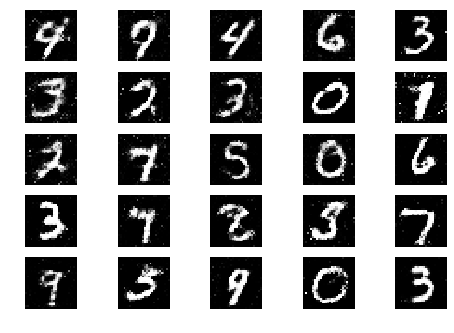

8601 [D loss: 0.684952, acc.: 55.08%] [G loss: 0.845839, acc.: 22.66%]
8602 [D loss: 0.680890, acc.: 52.73%] [G loss: 0.841929, acc.: 27.34%]
8603 [D loss: 0.678339, acc.: 56.25%] [G loss: 0.849284, acc.: 22.66%]
8604 [D loss: 0.652731, acc.: 61.72%] [G loss: 0.822614, acc.: 30.47%]
8605 [D loss: 0.680943, acc.: 57.42%] [G loss: 0.816084, acc.: 35.94%]
8606 [D loss: 0.694336, acc.: 55.86%] [G loss: 0.836010, acc.: 28.12%]
8607 [D loss: 0.671659, acc.: 63.67%] [G loss: 0.813477, acc.: 32.03%]
8608 [D loss: 0.687713, acc.: 52.34%] [G loss: 0.814874, acc.: 37.50%]
8609 [D loss: 0.688938, acc.: 52.34%] [G loss: 0.861172, acc.: 22.66%]
8610 [D loss: 0.666817, acc.: 61.33%] [G loss: 0.866497, acc.: 25.00%]
8611 [D loss: 0.696124, acc.: 49.22%] [G loss: 0.856685, acc.: 21.88%]
8612 [D loss: 0.694315, acc.: 50.78%] [G loss: 0.799556, acc.: 33.59%]
8613 [D loss: 0.695740, acc.: 52.73%] [G loss: 0.794640, acc.: 35.94%]
8614 [D loss: 0.668315, acc.: 59.38%] [G loss: 0.808755, acc.: 35.16%]
8615 [

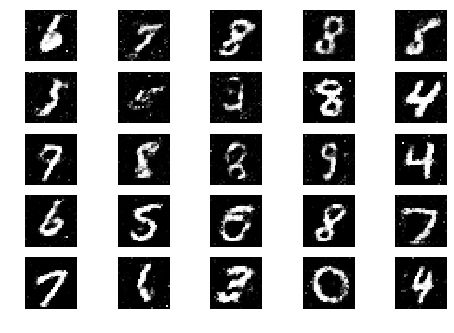

8651 [D loss: 0.662787, acc.: 60.94%] [G loss: 0.835942, acc.: 25.00%]
8652 [D loss: 0.662182, acc.: 61.33%] [G loss: 0.849525, acc.: 21.88%]
8653 [D loss: 0.689392, acc.: 56.25%] [G loss: 0.801150, acc.: 32.03%]
8654 [D loss: 0.661873, acc.: 61.72%] [G loss: 0.785151, acc.: 36.72%]
8655 [D loss: 0.666246, acc.: 60.94%] [G loss: 0.820425, acc.: 29.69%]
8656 [D loss: 0.672169, acc.: 59.38%] [G loss: 0.833796, acc.: 25.00%]
8657 [D loss: 0.688778, acc.: 53.91%] [G loss: 0.872164, acc.: 27.34%]
8658 [D loss: 0.679693, acc.: 57.42%] [G loss: 0.821616, acc.: 29.69%]
8659 [D loss: 0.650799, acc.: 62.50%] [G loss: 0.837576, acc.: 25.78%]
8660 [D loss: 0.660930, acc.: 60.16%] [G loss: 0.853441, acc.: 30.47%]
8661 [D loss: 0.694849, acc.: 49.61%] [G loss: 0.837700, acc.: 32.03%]
8662 [D loss: 0.682148, acc.: 54.69%] [G loss: 0.835322, acc.: 24.22%]
8663 [D loss: 0.689104, acc.: 54.30%] [G loss: 0.825249, acc.: 25.78%]
8664 [D loss: 0.685511, acc.: 56.25%] [G loss: 0.818928, acc.: 24.22%]
8665 [

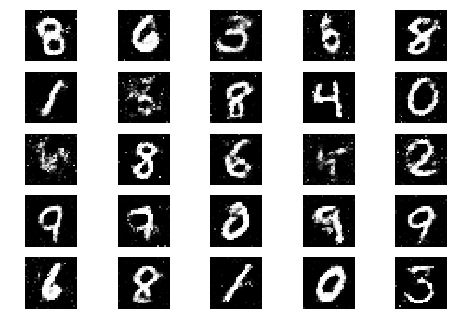

8701 [D loss: 0.667404, acc.: 58.98%] [G loss: 0.825812, acc.: 28.12%]
8702 [D loss: 0.677286, acc.: 57.42%] [G loss: 0.838611, acc.: 29.69%]
8703 [D loss: 0.671043, acc.: 58.59%] [G loss: 0.804936, acc.: 35.16%]
8704 [D loss: 0.657922, acc.: 61.33%] [G loss: 0.817976, acc.: 28.91%]
8705 [D loss: 0.657957, acc.: 61.33%] [G loss: 0.844023, acc.: 28.12%]
8706 [D loss: 0.696833, acc.: 54.30%] [G loss: 0.848986, acc.: 32.81%]
8707 [D loss: 0.676095, acc.: 59.38%] [G loss: 0.860840, acc.: 26.56%]
8708 [D loss: 0.655349, acc.: 60.94%] [G loss: 0.852675, acc.: 26.56%]
8709 [D loss: 0.684181, acc.: 60.16%] [G loss: 0.830849, acc.: 28.91%]
8710 [D loss: 0.690131, acc.: 55.47%] [G loss: 0.865565, acc.: 25.00%]
8711 [D loss: 0.687607, acc.: 52.34%] [G loss: 0.857229, acc.: 30.47%]
8712 [D loss: 0.670309, acc.: 56.25%] [G loss: 0.881606, acc.: 26.56%]
8713 [D loss: 0.666819, acc.: 58.20%] [G loss: 0.811596, acc.: 27.34%]
8714 [D loss: 0.664551, acc.: 61.33%] [G loss: 0.819288, acc.: 37.50%]
8715 [

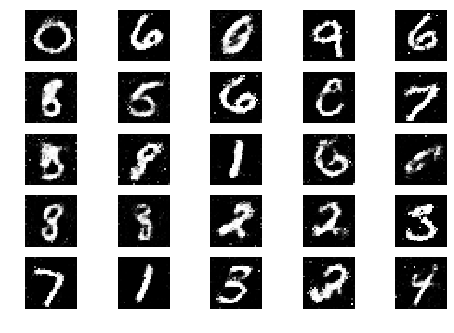

8751 [D loss: 0.659338, acc.: 61.72%] [G loss: 0.797143, acc.: 28.91%]
8752 [D loss: 0.666278, acc.: 56.25%] [G loss: 0.835499, acc.: 32.03%]
8753 [D loss: 0.645444, acc.: 63.67%] [G loss: 0.817860, acc.: 28.12%]
8754 [D loss: 0.653749, acc.: 58.98%] [G loss: 0.816758, acc.: 28.12%]
8755 [D loss: 0.676798, acc.: 55.86%] [G loss: 0.833755, acc.: 24.22%]
8756 [D loss: 0.652849, acc.: 60.16%] [G loss: 0.811816, acc.: 32.03%]
8757 [D loss: 0.674977, acc.: 56.64%] [G loss: 0.782514, acc.: 29.69%]
8758 [D loss: 0.696746, acc.: 53.12%] [G loss: 0.817262, acc.: 30.47%]
8759 [D loss: 0.679070, acc.: 55.08%] [G loss: 0.841921, acc.: 21.88%]
8760 [D loss: 0.678048, acc.: 53.52%] [G loss: 0.806878, acc.: 30.47%]
8761 [D loss: 0.688278, acc.: 51.56%] [G loss: 0.826520, acc.: 25.78%]
8762 [D loss: 0.694196, acc.: 53.91%] [G loss: 0.858036, acc.: 26.56%]
8763 [D loss: 0.680675, acc.: 55.86%] [G loss: 0.857205, acc.: 21.88%]
8764 [D loss: 0.669526, acc.: 61.72%] [G loss: 0.849279, acc.: 25.78%]
8765 [

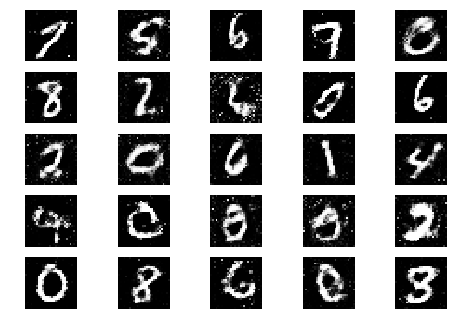

8801 [D loss: 0.693904, acc.: 53.12%] [G loss: 0.821734, acc.: 29.69%]
8802 [D loss: 0.669464, acc.: 56.25%] [G loss: 0.841107, acc.: 28.12%]
8803 [D loss: 0.672136, acc.: 61.72%] [G loss: 0.835052, acc.: 27.34%]
8804 [D loss: 0.673632, acc.: 60.16%] [G loss: 0.839375, acc.: 27.34%]
8805 [D loss: 0.688848, acc.: 54.69%] [G loss: 0.843776, acc.: 28.12%]
8806 [D loss: 0.675855, acc.: 57.03%] [G loss: 0.799315, acc.: 31.25%]
8807 [D loss: 0.701851, acc.: 51.17%] [G loss: 0.827625, acc.: 26.56%]
8808 [D loss: 0.658983, acc.: 61.33%] [G loss: 0.868139, acc.: 25.00%]
8809 [D loss: 0.677312, acc.: 61.33%] [G loss: 0.802082, acc.: 36.72%]
8810 [D loss: 0.662339, acc.: 58.59%] [G loss: 0.826243, acc.: 28.12%]
8811 [D loss: 0.699374, acc.: 53.52%] [G loss: 0.823086, acc.: 27.34%]
8812 [D loss: 0.680933, acc.: 57.03%] [G loss: 0.807055, acc.: 28.12%]
8813 [D loss: 0.687547, acc.: 54.30%] [G loss: 0.803741, acc.: 30.47%]
8814 [D loss: 0.679029, acc.: 55.47%] [G loss: 0.786030, acc.: 34.38%]
8815 [

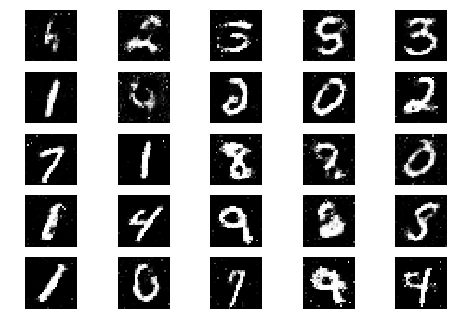

8851 [D loss: 0.678468, acc.: 57.81%] [G loss: 0.815400, acc.: 28.91%]
8852 [D loss: 0.690745, acc.: 53.12%] [G loss: 0.799509, acc.: 35.16%]
8853 [D loss: 0.669238, acc.: 62.50%] [G loss: 0.831302, acc.: 33.59%]
8854 [D loss: 0.686785, acc.: 56.64%] [G loss: 0.831414, acc.: 28.91%]
8855 [D loss: 0.674520, acc.: 54.30%] [G loss: 0.835875, acc.: 29.69%]
8856 [D loss: 0.661526, acc.: 62.11%] [G loss: 0.843342, acc.: 24.22%]
8857 [D loss: 0.664641, acc.: 59.77%] [G loss: 0.858088, acc.: 26.56%]
8858 [D loss: 0.659029, acc.: 59.38%] [G loss: 0.811625, acc.: 35.16%]
8859 [D loss: 0.696315, acc.: 57.42%] [G loss: 0.845804, acc.: 25.00%]
8860 [D loss: 0.681562, acc.: 55.47%] [G loss: 0.858249, acc.: 23.44%]
8861 [D loss: 0.673401, acc.: 55.86%] [G loss: 0.848781, acc.: 18.75%]
8862 [D loss: 0.663130, acc.: 56.64%] [G loss: 0.825709, acc.: 25.00%]
8863 [D loss: 0.674925, acc.: 59.77%] [G loss: 0.844835, acc.: 23.44%]
8864 [D loss: 0.666711, acc.: 60.16%] [G loss: 0.837574, acc.: 32.81%]
8865 [

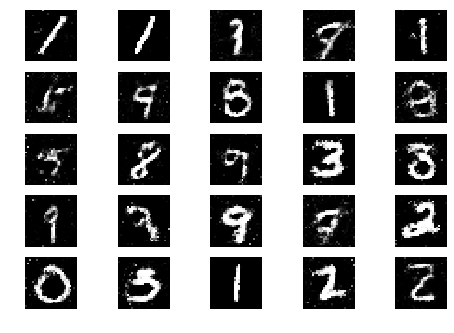

8901 [D loss: 0.676565, acc.: 57.42%] [G loss: 0.836892, acc.: 25.78%]
8902 [D loss: 0.690253, acc.: 49.61%] [G loss: 0.842300, acc.: 25.78%]
8903 [D loss: 0.679576, acc.: 55.47%] [G loss: 0.846132, acc.: 27.34%]
8904 [D loss: 0.678101, acc.: 58.59%] [G loss: 0.813637, acc.: 37.50%]
8905 [D loss: 0.682103, acc.: 55.47%] [G loss: 0.823193, acc.: 30.47%]
8906 [D loss: 0.683412, acc.: 57.03%] [G loss: 0.820800, acc.: 25.78%]
8907 [D loss: 0.685744, acc.: 51.95%] [G loss: 0.849636, acc.: 30.47%]
8908 [D loss: 0.652268, acc.: 61.72%] [G loss: 0.826410, acc.: 24.22%]
8909 [D loss: 0.698432, acc.: 52.34%] [G loss: 0.813877, acc.: 33.59%]
8910 [D loss: 0.686269, acc.: 56.64%] [G loss: 0.810460, acc.: 26.56%]
8911 [D loss: 0.681033, acc.: 55.86%] [G loss: 0.797389, acc.: 29.69%]
8912 [D loss: 0.667834, acc.: 62.89%] [G loss: 0.819241, acc.: 26.56%]
8913 [D loss: 0.684543, acc.: 55.86%] [G loss: 0.841036, acc.: 23.44%]
8914 [D loss: 0.676660, acc.: 55.47%] [G loss: 0.839514, acc.: 26.56%]
8915 [

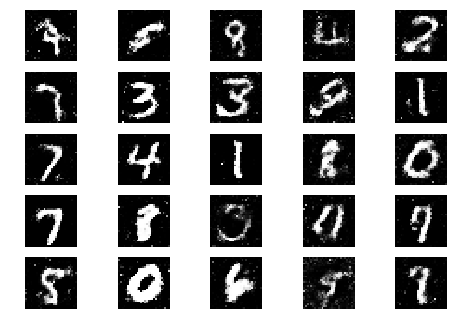

8951 [D loss: 0.697404, acc.: 51.95%] [G loss: 0.815038, acc.: 29.69%]
8952 [D loss: 0.672044, acc.: 58.59%] [G loss: 0.818773, acc.: 30.47%]
8953 [D loss: 0.667810, acc.: 58.59%] [G loss: 0.819373, acc.: 34.38%]
8954 [D loss: 0.647019, acc.: 63.67%] [G loss: 0.845401, acc.: 31.25%]
8955 [D loss: 0.673538, acc.: 59.38%] [G loss: 0.837770, acc.: 27.34%]
8956 [D loss: 0.679073, acc.: 57.81%] [G loss: 0.808575, acc.: 32.81%]
8957 [D loss: 0.666705, acc.: 56.25%] [G loss: 0.852329, acc.: 27.34%]
8958 [D loss: 0.691122, acc.: 56.25%] [G loss: 0.794827, acc.: 35.94%]
8959 [D loss: 0.670741, acc.: 56.64%] [G loss: 0.813418, acc.: 25.78%]
8960 [D loss: 0.680448, acc.: 57.42%] [G loss: 0.825350, acc.: 28.91%]
8961 [D loss: 0.672522, acc.: 56.25%] [G loss: 0.811856, acc.: 30.47%]
8962 [D loss: 0.703512, acc.: 51.56%] [G loss: 0.849026, acc.: 24.22%]
8963 [D loss: 0.666195, acc.: 57.81%] [G loss: 0.849523, acc.: 27.34%]
8964 [D loss: 0.658965, acc.: 59.77%] [G loss: 0.823462, acc.: 30.47%]
8965 [

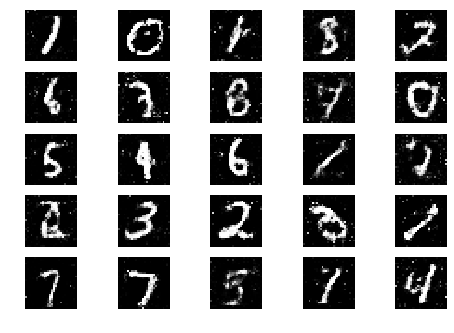

9001 [D loss: 0.673064, acc.: 58.98%] [G loss: 0.853610, acc.: 28.12%]
9002 [D loss: 0.678055, acc.: 60.16%] [G loss: 0.800317, acc.: 31.25%]
9003 [D loss: 0.701079, acc.: 56.25%] [G loss: 0.859469, acc.: 21.88%]
9004 [D loss: 0.669327, acc.: 57.81%] [G loss: 0.804896, acc.: 29.69%]
9005 [D loss: 0.687831, acc.: 57.81%] [G loss: 0.831005, acc.: 22.66%]
9006 [D loss: 0.668650, acc.: 58.59%] [G loss: 0.821230, acc.: 31.25%]
9007 [D loss: 0.661819, acc.: 61.33%] [G loss: 0.826887, acc.: 31.25%]
9008 [D loss: 0.669984, acc.: 59.77%] [G loss: 0.838197, acc.: 29.69%]
9009 [D loss: 0.670782, acc.: 57.42%] [G loss: 0.814036, acc.: 24.22%]
9010 [D loss: 0.663256, acc.: 58.98%] [G loss: 0.846372, acc.: 36.72%]
9011 [D loss: 0.678794, acc.: 58.20%] [G loss: 0.798990, acc.: 29.69%]
9012 [D loss: 0.678305, acc.: 57.42%] [G loss: 0.809382, acc.: 26.56%]
9013 [D loss: 0.671265, acc.: 57.81%] [G loss: 0.804232, acc.: 32.81%]
9014 [D loss: 0.654920, acc.: 64.06%] [G loss: 0.828073, acc.: 29.69%]
9015 [

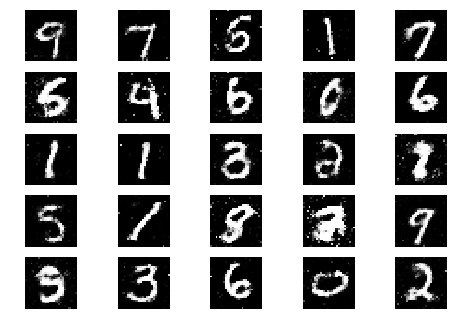

9051 [D loss: 0.665691, acc.: 60.55%] [G loss: 0.843347, acc.: 26.56%]
9052 [D loss: 0.678419, acc.: 58.98%] [G loss: 0.833957, acc.: 26.56%]
9053 [D loss: 0.671093, acc.: 61.72%] [G loss: 0.803958, acc.: 29.69%]
9054 [D loss: 0.674279, acc.: 58.59%] [G loss: 0.838458, acc.: 27.34%]
9055 [D loss: 0.700085, acc.: 55.08%] [G loss: 0.840889, acc.: 26.56%]
9056 [D loss: 0.685354, acc.: 56.25%] [G loss: 0.817109, acc.: 34.38%]
9057 [D loss: 0.685874, acc.: 55.86%] [G loss: 0.838973, acc.: 29.69%]
9058 [D loss: 0.658956, acc.: 58.20%] [G loss: 0.821463, acc.: 29.69%]
9059 [D loss: 0.670804, acc.: 59.38%] [G loss: 0.826287, acc.: 31.25%]
9060 [D loss: 0.653884, acc.: 59.38%] [G loss: 0.847623, acc.: 21.09%]
9061 [D loss: 0.667989, acc.: 58.98%] [G loss: 0.846479, acc.: 27.34%]
9062 [D loss: 0.667561, acc.: 58.98%] [G loss: 0.849405, acc.: 28.12%]
9063 [D loss: 0.661258, acc.: 57.81%] [G loss: 0.844053, acc.: 29.69%]
9064 [D loss: 0.673846, acc.: 56.25%] [G loss: 0.813359, acc.: 28.91%]
9065 [

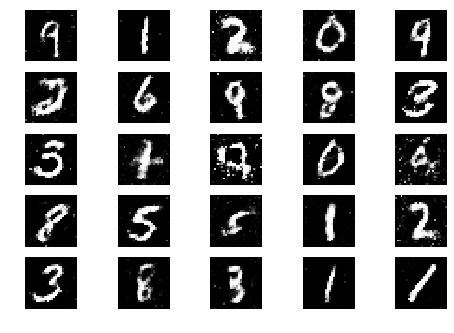

9101 [D loss: 0.670318, acc.: 56.64%] [G loss: 0.839597, acc.: 32.03%]
9102 [D loss: 0.652328, acc.: 62.89%] [G loss: 0.837876, acc.: 31.25%]
9103 [D loss: 0.687157, acc.: 54.30%] [G loss: 0.820480, acc.: 31.25%]
9104 [D loss: 0.686773, acc.: 56.64%] [G loss: 0.815148, acc.: 31.25%]
9105 [D loss: 0.693205, acc.: 55.86%] [G loss: 0.829259, acc.: 27.34%]
9106 [D loss: 0.650628, acc.: 64.45%] [G loss: 0.804532, acc.: 35.94%]
9107 [D loss: 0.695678, acc.: 54.30%] [G loss: 0.833494, acc.: 29.69%]
9108 [D loss: 0.674419, acc.: 58.59%] [G loss: 0.848556, acc.: 26.56%]
9109 [D loss: 0.681961, acc.: 51.17%] [G loss: 0.810450, acc.: 31.25%]
9110 [D loss: 0.682008, acc.: 53.91%] [G loss: 0.813118, acc.: 31.25%]
9111 [D loss: 0.688621, acc.: 55.08%] [G loss: 0.808682, acc.: 34.38%]
9112 [D loss: 0.664080, acc.: 57.42%] [G loss: 0.812101, acc.: 31.25%]
9113 [D loss: 0.673973, acc.: 57.42%] [G loss: 0.794669, acc.: 35.16%]
9114 [D loss: 0.655479, acc.: 62.11%] [G loss: 0.831922, acc.: 26.56%]
9115 [

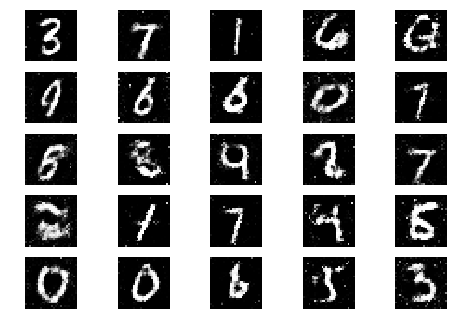

9151 [D loss: 0.691931, acc.: 52.73%] [G loss: 0.844084, acc.: 25.78%]
9152 [D loss: 0.703843, acc.: 52.34%] [G loss: 0.831162, acc.: 20.31%]
9153 [D loss: 0.683044, acc.: 53.91%] [G loss: 0.809136, acc.: 28.12%]
9154 [D loss: 0.671898, acc.: 55.47%] [G loss: 0.811530, acc.: 31.25%]
9155 [D loss: 0.674981, acc.: 57.81%] [G loss: 0.821551, acc.: 30.47%]
9156 [D loss: 0.678510, acc.: 57.81%] [G loss: 0.867241, acc.: 17.97%]
9157 [D loss: 0.679075, acc.: 57.81%] [G loss: 0.834781, acc.: 28.91%]
9158 [D loss: 0.669709, acc.: 58.20%] [G loss: 0.821732, acc.: 32.81%]
9159 [D loss: 0.681533, acc.: 60.94%] [G loss: 0.823220, acc.: 27.34%]
9160 [D loss: 0.666538, acc.: 58.98%] [G loss: 0.790052, acc.: 35.16%]
9161 [D loss: 0.672894, acc.: 60.55%] [G loss: 0.840590, acc.: 27.34%]
9162 [D loss: 0.679447, acc.: 58.20%] [G loss: 0.818009, acc.: 28.12%]
9163 [D loss: 0.700664, acc.: 50.78%] [G loss: 0.822876, acc.: 24.22%]
9164 [D loss: 0.670783, acc.: 58.98%] [G loss: 0.812906, acc.: 29.69%]
9165 [

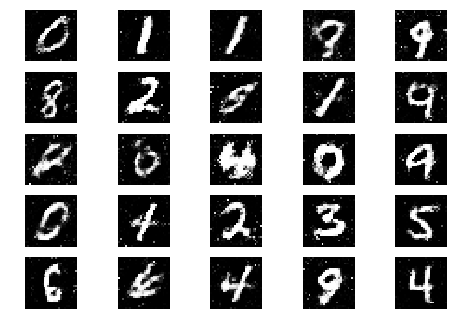

9201 [D loss: 0.688908, acc.: 54.30%] [G loss: 0.836966, acc.: 28.91%]
9202 [D loss: 0.688428, acc.: 52.34%] [G loss: 0.834625, acc.: 28.12%]
9203 [D loss: 0.680474, acc.: 55.08%] [G loss: 0.836820, acc.: 25.78%]
9204 [D loss: 0.691670, acc.: 53.12%] [G loss: 0.854241, acc.: 21.09%]
9205 [D loss: 0.658277, acc.: 61.72%] [G loss: 0.831694, acc.: 25.78%]
9206 [D loss: 0.646194, acc.: 61.72%] [G loss: 0.812042, acc.: 35.16%]
9207 [D loss: 0.680219, acc.: 56.25%] [G loss: 0.850447, acc.: 29.69%]
9208 [D loss: 0.676635, acc.: 58.59%] [G loss: 0.794393, acc.: 28.12%]
9209 [D loss: 0.668562, acc.: 61.72%] [G loss: 0.820642, acc.: 32.81%]
9210 [D loss: 0.671551, acc.: 57.03%] [G loss: 0.827285, acc.: 28.12%]
9211 [D loss: 0.673614, acc.: 54.30%] [G loss: 0.854645, acc.: 23.44%]
9212 [D loss: 0.670071, acc.: 59.38%] [G loss: 0.854021, acc.: 21.88%]
9213 [D loss: 0.678783, acc.: 54.69%] [G loss: 0.812595, acc.: 32.81%]
9214 [D loss: 0.682910, acc.: 53.12%] [G loss: 0.809790, acc.: 32.81%]
9215 [

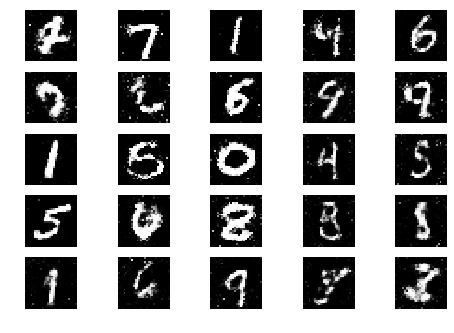

9251 [D loss: 0.649266, acc.: 62.11%] [G loss: 0.823592, acc.: 35.16%]
9252 [D loss: 0.693985, acc.: 58.20%] [G loss: 0.853874, acc.: 23.44%]
9253 [D loss: 0.674406, acc.: 57.03%] [G loss: 0.851934, acc.: 21.88%]
9254 [D loss: 0.693525, acc.: 55.47%] [G loss: 0.826468, acc.: 27.34%]
9255 [D loss: 0.675662, acc.: 57.42%] [G loss: 0.826328, acc.: 32.03%]
9256 [D loss: 0.682598, acc.: 56.64%] [G loss: 0.841002, acc.: 26.56%]
9257 [D loss: 0.678696, acc.: 58.20%] [G loss: 0.836605, acc.: 28.91%]
9258 [D loss: 0.674918, acc.: 57.81%] [G loss: 0.855757, acc.: 32.81%]
9259 [D loss: 0.674185, acc.: 57.42%] [G loss: 0.839518, acc.: 23.44%]
9260 [D loss: 0.680435, acc.: 60.94%] [G loss: 0.818960, acc.: 30.47%]
9261 [D loss: 0.683063, acc.: 52.34%] [G loss: 0.851602, acc.: 21.09%]
9262 [D loss: 0.654895, acc.: 62.50%] [G loss: 0.827363, acc.: 25.00%]
9263 [D loss: 0.658426, acc.: 59.38%] [G loss: 0.793637, acc.: 35.94%]
9264 [D loss: 0.648919, acc.: 61.72%] [G loss: 0.836067, acc.: 30.47%]
9265 [

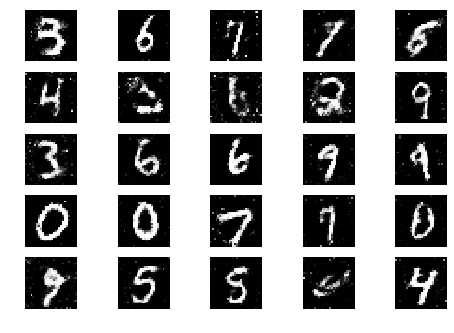

9301 [D loss: 0.659519, acc.: 61.33%] [G loss: 0.826933, acc.: 28.91%]
9302 [D loss: 0.679584, acc.: 58.59%] [G loss: 0.804905, acc.: 26.56%]
9303 [D loss: 0.668794, acc.: 62.50%] [G loss: 0.821656, acc.: 22.66%]
9304 [D loss: 0.666280, acc.: 56.64%] [G loss: 0.812416, acc.: 32.03%]
9305 [D loss: 0.688935, acc.: 54.69%] [G loss: 0.817064, acc.: 30.47%]
9306 [D loss: 0.685279, acc.: 56.64%] [G loss: 0.827335, acc.: 28.12%]
9307 [D loss: 0.687636, acc.: 53.12%] [G loss: 0.840851, acc.: 20.31%]
9308 [D loss: 0.670935, acc.: 56.64%] [G loss: 0.837657, acc.: 25.00%]
9309 [D loss: 0.665381, acc.: 59.77%] [G loss: 0.853163, acc.: 23.44%]
9310 [D loss: 0.693796, acc.: 54.69%] [G loss: 0.862705, acc.: 17.19%]
9311 [D loss: 0.684541, acc.: 55.08%] [G loss: 0.848575, acc.: 26.56%]
9312 [D loss: 0.656500, acc.: 59.77%] [G loss: 0.823298, acc.: 28.91%]
9313 [D loss: 0.701522, acc.: 52.34%] [G loss: 0.802185, acc.: 33.59%]
9314 [D loss: 0.677916, acc.: 56.25%] [G loss: 0.819990, acc.: 29.69%]
9315 [

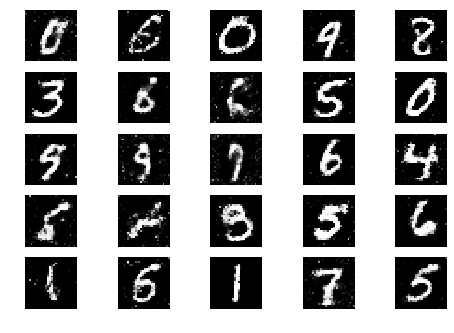

9351 [D loss: 0.681865, acc.: 57.42%] [G loss: 0.795811, acc.: 35.16%]
9352 [D loss: 0.682678, acc.: 60.94%] [G loss: 0.801663, acc.: 34.38%]
9353 [D loss: 0.660619, acc.: 58.98%] [G loss: 0.832008, acc.: 31.25%]
9354 [D loss: 0.678902, acc.: 57.81%] [G loss: 0.819346, acc.: 35.16%]
9355 [D loss: 0.645602, acc.: 65.23%] [G loss: 0.811055, acc.: 30.47%]
9356 [D loss: 0.682205, acc.: 53.91%] [G loss: 0.827788, acc.: 27.34%]
9357 [D loss: 0.678832, acc.: 55.86%] [G loss: 0.860565, acc.: 21.88%]
9358 [D loss: 0.672549, acc.: 58.20%] [G loss: 0.848531, acc.: 22.66%]
9359 [D loss: 0.655083, acc.: 63.28%] [G loss: 0.825839, acc.: 28.91%]
9360 [D loss: 0.685697, acc.: 55.86%] [G loss: 0.839770, acc.: 28.91%]
9361 [D loss: 0.693552, acc.: 50.00%] [G loss: 0.811169, acc.: 27.34%]
9362 [D loss: 0.648329, acc.: 60.55%] [G loss: 0.843137, acc.: 24.22%]
9363 [D loss: 0.665478, acc.: 58.20%] [G loss: 0.897331, acc.: 23.44%]
9364 [D loss: 0.690611, acc.: 58.59%] [G loss: 0.860369, acc.: 21.88%]
9365 [

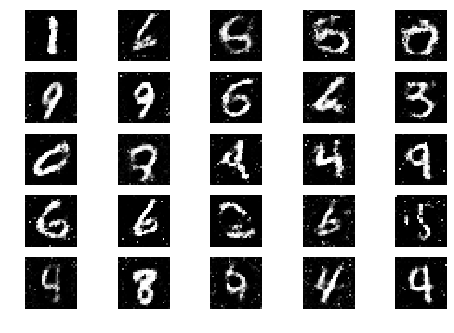

9401 [D loss: 0.679853, acc.: 55.47%] [G loss: 0.807240, acc.: 32.03%]
9402 [D loss: 0.670762, acc.: 58.20%] [G loss: 0.843006, acc.: 25.00%]
9403 [D loss: 0.665774, acc.: 57.03%] [G loss: 0.820625, acc.: 30.47%]
9404 [D loss: 0.669607, acc.: 60.16%] [G loss: 0.851752, acc.: 19.53%]
9405 [D loss: 0.661489, acc.: 57.42%] [G loss: 0.816399, acc.: 27.34%]
9406 [D loss: 0.663102, acc.: 58.98%] [G loss: 0.844162, acc.: 27.34%]
9407 [D loss: 0.690941, acc.: 53.12%] [G loss: 0.831302, acc.: 32.03%]
9408 [D loss: 0.655347, acc.: 60.94%] [G loss: 0.797772, acc.: 28.91%]
9409 [D loss: 0.670330, acc.: 58.59%] [G loss: 0.825879, acc.: 28.12%]
9410 [D loss: 0.692912, acc.: 52.34%] [G loss: 0.825366, acc.: 22.66%]
9411 [D loss: 0.685155, acc.: 56.25%] [G loss: 0.840358, acc.: 21.09%]
9412 [D loss: 0.692292, acc.: 48.44%] [G loss: 0.819781, acc.: 27.34%]
9413 [D loss: 0.674933, acc.: 55.47%] [G loss: 0.824646, acc.: 26.56%]
9414 [D loss: 0.679416, acc.: 54.69%] [G loss: 0.836421, acc.: 22.66%]
9415 [

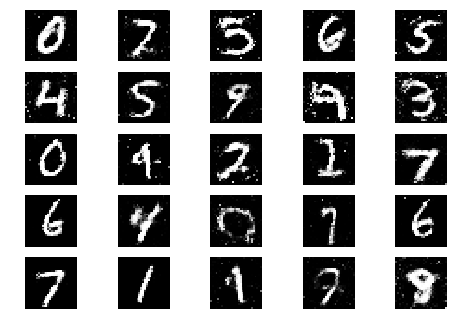

9451 [D loss: 0.658284, acc.: 57.42%] [G loss: 0.808819, acc.: 29.69%]
9452 [D loss: 0.681983, acc.: 53.52%] [G loss: 0.820027, acc.: 37.50%]
9453 [D loss: 0.662999, acc.: 62.50%] [G loss: 0.841750, acc.: 30.47%]
9454 [D loss: 0.681153, acc.: 56.25%] [G loss: 0.832006, acc.: 25.00%]
9455 [D loss: 0.705074, acc.: 51.95%] [G loss: 0.788407, acc.: 36.72%]
9456 [D loss: 0.671301, acc.: 56.64%] [G loss: 0.808006, acc.: 29.69%]
9457 [D loss: 0.673212, acc.: 57.81%] [G loss: 0.809809, acc.: 27.34%]
9458 [D loss: 0.665650, acc.: 60.55%] [G loss: 0.786305, acc.: 31.25%]
9459 [D loss: 0.668384, acc.: 57.42%] [G loss: 0.804514, acc.: 34.38%]
9460 [D loss: 0.667163, acc.: 58.20%] [G loss: 0.825163, acc.: 27.34%]
9461 [D loss: 0.660358, acc.: 61.72%] [G loss: 0.797074, acc.: 39.06%]
9462 [D loss: 0.673693, acc.: 57.81%] [G loss: 0.819675, acc.: 36.72%]
9463 [D loss: 0.668858, acc.: 55.08%] [G loss: 0.834113, acc.: 31.25%]
9464 [D loss: 0.669136, acc.: 57.03%] [G loss: 0.837521, acc.: 29.69%]
9465 [

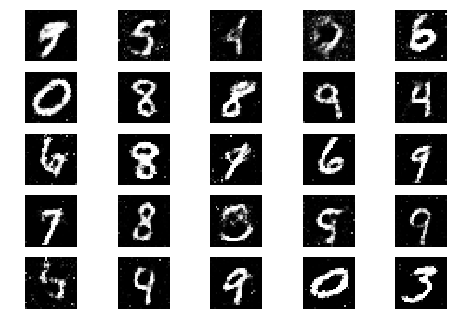

9501 [D loss: 0.684581, acc.: 52.73%] [G loss: 0.817528, acc.: 24.22%]
9502 [D loss: 0.672909, acc.: 55.08%] [G loss: 0.832838, acc.: 22.66%]
9503 [D loss: 0.670811, acc.: 55.47%] [G loss: 0.868268, acc.: 25.78%]
9504 [D loss: 0.673450, acc.: 58.98%] [G loss: 0.833976, acc.: 29.69%]
9505 [D loss: 0.671377, acc.: 59.77%] [G loss: 0.829526, acc.: 23.44%]
9506 [D loss: 0.688286, acc.: 55.86%] [G loss: 0.837936, acc.: 27.34%]
9507 [D loss: 0.674788, acc.: 58.20%] [G loss: 0.819855, acc.: 26.56%]
9508 [D loss: 0.676416, acc.: 58.59%] [G loss: 0.793298, acc.: 28.12%]
9509 [D loss: 0.679830, acc.: 57.42%] [G loss: 0.855291, acc.: 25.78%]
9510 [D loss: 0.647949, acc.: 64.06%] [G loss: 0.841349, acc.: 26.56%]
9511 [D loss: 0.694826, acc.: 51.56%] [G loss: 0.840501, acc.: 23.44%]
9512 [D loss: 0.665346, acc.: 60.16%] [G loss: 0.807756, acc.: 28.12%]
9513 [D loss: 0.663521, acc.: 60.16%] [G loss: 0.840203, acc.: 26.56%]
9514 [D loss: 0.685422, acc.: 55.08%] [G loss: 0.857141, acc.: 27.34%]
9515 [

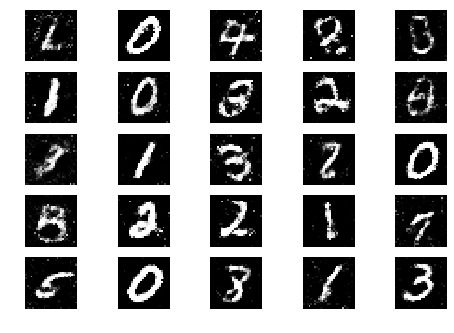

9551 [D loss: 0.663404, acc.: 56.64%] [G loss: 0.888908, acc.: 25.00%]
9552 [D loss: 0.685660, acc.: 57.81%] [G loss: 0.828207, acc.: 26.56%]
9553 [D loss: 0.652774, acc.: 60.55%] [G loss: 0.839346, acc.: 29.69%]
9554 [D loss: 0.688551, acc.: 54.30%] [G loss: 0.803717, acc.: 28.12%]
9555 [D loss: 0.645836, acc.: 66.41%] [G loss: 0.816790, acc.: 32.03%]
9556 [D loss: 0.685210, acc.: 57.81%] [G loss: 0.814532, acc.: 30.47%]
9557 [D loss: 0.682380, acc.: 61.33%] [G loss: 0.823258, acc.: 28.12%]
9558 [D loss: 0.682106, acc.: 59.77%] [G loss: 0.824349, acc.: 29.69%]
9559 [D loss: 0.671147, acc.: 58.59%] [G loss: 0.848570, acc.: 27.34%]
9560 [D loss: 0.699896, acc.: 48.44%] [G loss: 0.854524, acc.: 21.88%]
9561 [D loss: 0.688540, acc.: 55.08%] [G loss: 0.819093, acc.: 30.47%]
9562 [D loss: 0.657907, acc.: 62.50%] [G loss: 0.826607, acc.: 26.56%]
9563 [D loss: 0.664647, acc.: 58.98%] [G loss: 0.828832, acc.: 26.56%]
9564 [D loss: 0.676793, acc.: 59.38%] [G loss: 0.839506, acc.: 28.12%]
9565 [

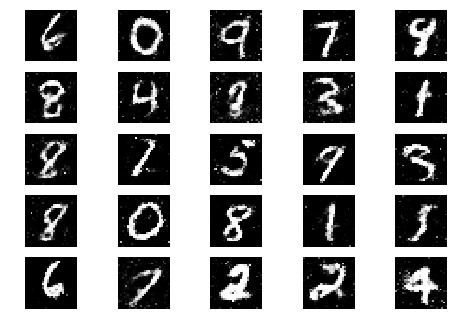

9601 [D loss: 0.671969, acc.: 61.33%] [G loss: 0.839147, acc.: 24.22%]
9602 [D loss: 0.664489, acc.: 58.59%] [G loss: 0.808326, acc.: 30.47%]
9603 [D loss: 0.681813, acc.: 57.03%] [G loss: 0.831351, acc.: 29.69%]
9604 [D loss: 0.685229, acc.: 53.12%] [G loss: 0.817084, acc.: 28.12%]
9605 [D loss: 0.678041, acc.: 54.69%] [G loss: 0.818582, acc.: 27.34%]
9606 [D loss: 0.674874, acc.: 58.98%] [G loss: 0.800792, acc.: 35.94%]
9607 [D loss: 0.684224, acc.: 54.69%] [G loss: 0.803770, acc.: 38.28%]
9608 [D loss: 0.674931, acc.: 57.81%] [G loss: 0.837698, acc.: 28.91%]
9609 [D loss: 0.677905, acc.: 59.38%] [G loss: 0.820978, acc.: 31.25%]
9610 [D loss: 0.673895, acc.: 56.64%] [G loss: 0.857416, acc.: 23.44%]
9611 [D loss: 0.694133, acc.: 55.47%] [G loss: 0.813701, acc.: 29.69%]
9612 [D loss: 0.656570, acc.: 63.28%] [G loss: 0.823184, acc.: 25.00%]
9613 [D loss: 0.663565, acc.: 61.72%] [G loss: 0.825796, acc.: 27.34%]
9614 [D loss: 0.693834, acc.: 54.30%] [G loss: 0.834157, acc.: 26.56%]
9615 [

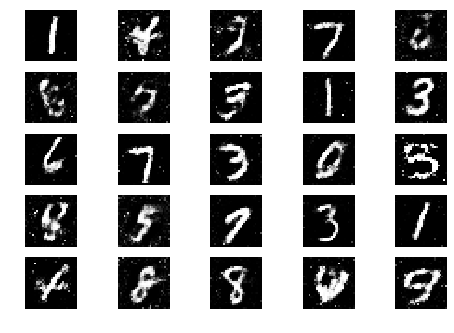

9651 [D loss: 0.688446, acc.: 51.56%] [G loss: 0.802780, acc.: 26.56%]
9652 [D loss: 0.670326, acc.: 59.38%] [G loss: 0.829181, acc.: 32.03%]
9653 [D loss: 0.673670, acc.: 56.25%] [G loss: 0.829762, acc.: 23.44%]
9654 [D loss: 0.674302, acc.: 51.17%] [G loss: 0.829979, acc.: 27.34%]
9655 [D loss: 0.682863, acc.: 57.81%] [G loss: 0.815669, acc.: 31.25%]
9656 [D loss: 0.681470, acc.: 58.59%] [G loss: 0.800634, acc.: 30.47%]
9657 [D loss: 0.685774, acc.: 53.52%] [G loss: 0.820336, acc.: 26.56%]
9658 [D loss: 0.660298, acc.: 61.72%] [G loss: 0.839469, acc.: 31.25%]
9659 [D loss: 0.683299, acc.: 58.20%] [G loss: 0.829419, acc.: 27.34%]
9660 [D loss: 0.665229, acc.: 60.16%] [G loss: 0.801126, acc.: 30.47%]
9661 [D loss: 0.646611, acc.: 63.67%] [G loss: 0.795409, acc.: 34.38%]
9662 [D loss: 0.674354, acc.: 57.42%] [G loss: 0.817116, acc.: 30.47%]
9663 [D loss: 0.685483, acc.: 53.52%] [G loss: 0.806095, acc.: 32.81%]
9664 [D loss: 0.671493, acc.: 58.98%] [G loss: 0.790379, acc.: 33.59%]
9665 [

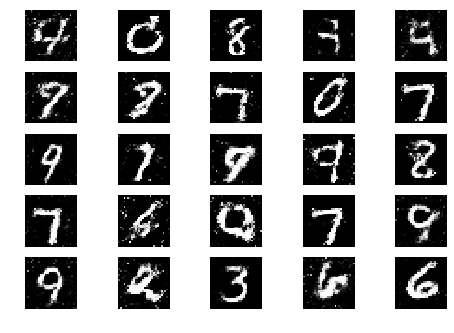

9701 [D loss: 0.712142, acc.: 48.05%] [G loss: 0.824894, acc.: 32.03%]
9702 [D loss: 0.663283, acc.: 58.59%] [G loss: 0.789206, acc.: 40.62%]
9703 [D loss: 0.675188, acc.: 56.25%] [G loss: 0.822793, acc.: 25.78%]
9704 [D loss: 0.675497, acc.: 55.08%] [G loss: 0.828812, acc.: 25.78%]
9705 [D loss: 0.677230, acc.: 58.59%] [G loss: 0.845983, acc.: 25.78%]
9706 [D loss: 0.672803, acc.: 57.81%] [G loss: 0.824550, acc.: 25.78%]
9707 [D loss: 0.668744, acc.: 58.98%] [G loss: 0.835720, acc.: 28.91%]
9708 [D loss: 0.652507, acc.: 59.77%] [G loss: 0.838243, acc.: 32.03%]
9709 [D loss: 0.702169, acc.: 53.12%] [G loss: 0.819115, acc.: 32.81%]
9710 [D loss: 0.684696, acc.: 53.52%] [G loss: 0.832866, acc.: 25.00%]
9711 [D loss: 0.643960, acc.: 63.28%] [G loss: 0.834830, acc.: 35.94%]
9712 [D loss: 0.684638, acc.: 57.42%] [G loss: 0.855783, acc.: 28.12%]
9713 [D loss: 0.681499, acc.: 57.03%] [G loss: 0.823478, acc.: 30.47%]
9714 [D loss: 0.684231, acc.: 54.69%] [G loss: 0.835872, acc.: 24.22%]
9715 [

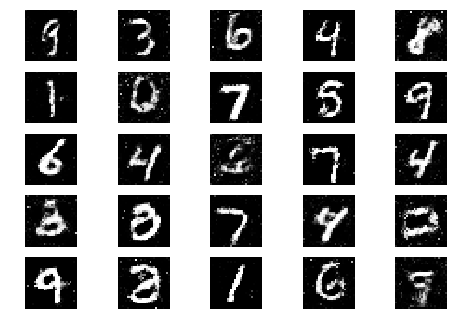

9751 [D loss: 0.680960, acc.: 55.47%] [G loss: 0.789149, acc.: 34.38%]
9752 [D loss: 0.702954, acc.: 53.52%] [G loss: 0.821959, acc.: 25.00%]
9753 [D loss: 0.662866, acc.: 62.11%] [G loss: 0.852732, acc.: 23.44%]
9754 [D loss: 0.666471, acc.: 58.20%] [G loss: 0.830550, acc.: 26.56%]
9755 [D loss: 0.714789, acc.: 57.42%] [G loss: 0.823666, acc.: 24.22%]
9756 [D loss: 0.662047, acc.: 58.20%] [G loss: 0.819431, acc.: 33.59%]
9757 [D loss: 0.655408, acc.: 60.55%] [G loss: 0.865471, acc.: 26.56%]
9758 [D loss: 0.676916, acc.: 59.77%] [G loss: 0.836941, acc.: 24.22%]
9759 [D loss: 0.681223, acc.: 57.03%] [G loss: 0.854478, acc.: 24.22%]
9760 [D loss: 0.684427, acc.: 53.12%] [G loss: 0.824826, acc.: 25.78%]
9761 [D loss: 0.686737, acc.: 56.25%] [G loss: 0.816199, acc.: 31.25%]
9762 [D loss: 0.658608, acc.: 61.33%] [G loss: 0.834741, acc.: 24.22%]
9763 [D loss: 0.689284, acc.: 50.78%] [G loss: 0.866768, acc.: 21.88%]
9764 [D loss: 0.660966, acc.: 60.55%] [G loss: 0.824185, acc.: 33.59%]
9765 [

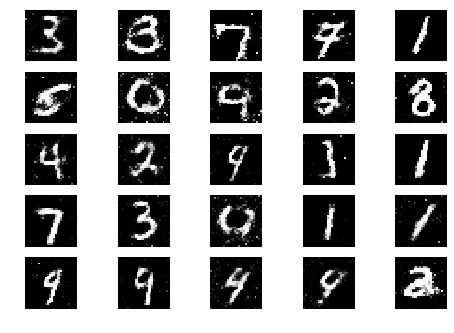

9801 [D loss: 0.679790, acc.: 55.47%] [G loss: 0.851969, acc.: 29.69%]
9802 [D loss: 0.671099, acc.: 59.77%] [G loss: 0.816743, acc.: 31.25%]
9803 [D loss: 0.678406, acc.: 56.25%] [G loss: 0.812938, acc.: 31.25%]
9804 [D loss: 0.690773, acc.: 54.69%] [G loss: 0.813359, acc.: 30.47%]
9805 [D loss: 0.662249, acc.: 58.98%] [G loss: 0.809761, acc.: 28.12%]
9806 [D loss: 0.723565, acc.: 48.83%] [G loss: 0.824960, acc.: 26.56%]
9807 [D loss: 0.686998, acc.: 56.25%] [G loss: 0.851797, acc.: 23.44%]
9808 [D loss: 0.682016, acc.: 57.03%] [G loss: 0.788768, acc.: 37.50%]
9809 [D loss: 0.666197, acc.: 56.64%] [G loss: 0.836228, acc.: 33.59%]
9810 [D loss: 0.711468, acc.: 54.30%] [G loss: 0.831155, acc.: 28.91%]
9811 [D loss: 0.669043, acc.: 55.86%] [G loss: 0.839814, acc.: 20.31%]
9812 [D loss: 0.690236, acc.: 56.64%] [G loss: 0.842622, acc.: 28.91%]
9813 [D loss: 0.675591, acc.: 57.81%] [G loss: 0.820093, acc.: 26.56%]
9814 [D loss: 0.663903, acc.: 57.81%] [G loss: 0.850528, acc.: 25.78%]
9815 [

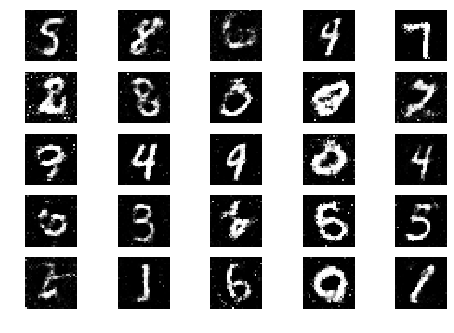

9851 [D loss: 0.656272, acc.: 62.11%] [G loss: 0.834214, acc.: 25.00%]
9852 [D loss: 0.668815, acc.: 59.38%] [G loss: 0.856498, acc.: 21.88%]
9853 [D loss: 0.685662, acc.: 56.64%] [G loss: 0.877419, acc.: 25.78%]
9854 [D loss: 0.678768, acc.: 55.47%] [G loss: 0.815671, acc.: 28.91%]
9855 [D loss: 0.678446, acc.: 57.42%] [G loss: 0.817552, acc.: 31.25%]
9856 [D loss: 0.686287, acc.: 59.77%] [G loss: 0.845901, acc.: 25.78%]
9857 [D loss: 0.671663, acc.: 59.38%] [G loss: 0.819036, acc.: 28.12%]
9858 [D loss: 0.667801, acc.: 59.38%] [G loss: 0.852210, acc.: 29.69%]
9859 [D loss: 0.694331, acc.: 51.95%] [G loss: 0.835247, acc.: 25.00%]
9860 [D loss: 0.683165, acc.: 53.12%] [G loss: 0.823881, acc.: 32.81%]
9861 [D loss: 0.664696, acc.: 61.33%] [G loss: 0.814552, acc.: 28.91%]
9862 [D loss: 0.693066, acc.: 57.42%] [G loss: 0.813040, acc.: 31.25%]
9863 [D loss: 0.680395, acc.: 55.47%] [G loss: 0.823206, acc.: 26.56%]
9864 [D loss: 0.655875, acc.: 61.33%] [G loss: 0.832570, acc.: 29.69%]
9865 [

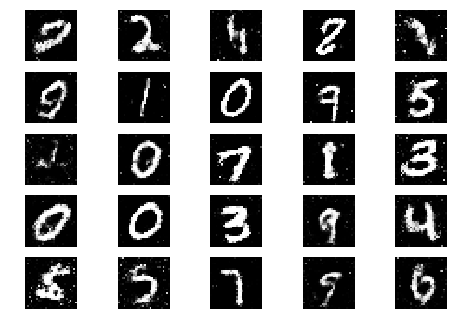

9901 [D loss: 0.679620, acc.: 57.03%] [G loss: 0.807425, acc.: 33.59%]
9902 [D loss: 0.688057, acc.: 56.25%] [G loss: 0.814574, acc.: 30.47%]
9903 [D loss: 0.658207, acc.: 60.16%] [G loss: 0.800362, acc.: 31.25%]
9904 [D loss: 0.670336, acc.: 60.94%] [G loss: 0.792866, acc.: 35.16%]
9905 [D loss: 0.679721, acc.: 53.12%] [G loss: 0.835482, acc.: 26.56%]
9906 [D loss: 0.681624, acc.: 55.08%] [G loss: 0.837568, acc.: 28.12%]
9907 [D loss: 0.677387, acc.: 57.03%] [G loss: 0.857912, acc.: 20.31%]
9908 [D loss: 0.677125, acc.: 56.25%] [G loss: 0.842856, acc.: 21.88%]
9909 [D loss: 0.685322, acc.: 55.47%] [G loss: 0.803250, acc.: 26.56%]
9910 [D loss: 0.668269, acc.: 57.03%] [G loss: 0.820228, acc.: 34.38%]
9911 [D loss: 0.680761, acc.: 57.42%] [G loss: 0.805326, acc.: 34.38%]
9912 [D loss: 0.664967, acc.: 60.55%] [G loss: 0.853238, acc.: 22.66%]
9913 [D loss: 0.672462, acc.: 58.98%] [G loss: 0.826097, acc.: 30.47%]
9914 [D loss: 0.671177, acc.: 59.38%] [G loss: 0.814861, acc.: 30.47%]
9915 [

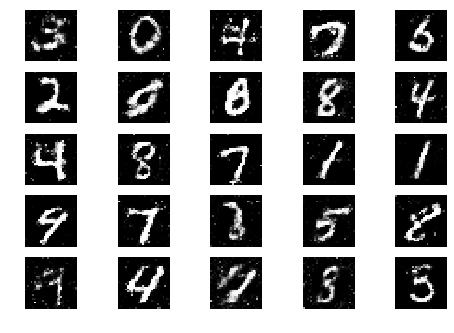

9951 [D loss: 0.688763, acc.: 53.52%] [G loss: 0.820704, acc.: 31.25%]
9952 [D loss: 0.675802, acc.: 60.55%] [G loss: 0.828703, acc.: 29.69%]
9953 [D loss: 0.670055, acc.: 58.20%] [G loss: 0.834748, acc.: 32.03%]
9954 [D loss: 0.699875, acc.: 51.56%] [G loss: 0.815231, acc.: 30.47%]
9955 [D loss: 0.672243, acc.: 56.64%] [G loss: 0.832708, acc.: 25.78%]
9956 [D loss: 0.687229, acc.: 57.03%] [G loss: 0.842194, acc.: 25.00%]
9957 [D loss: 0.673511, acc.: 58.20%] [G loss: 0.796431, acc.: 32.81%]
9958 [D loss: 0.679148, acc.: 57.81%] [G loss: 0.799487, acc.: 32.81%]
9959 [D loss: 0.645859, acc.: 67.58%] [G loss: 0.838180, acc.: 29.69%]
9960 [D loss: 0.665400, acc.: 61.33%] [G loss: 0.816156, acc.: 26.56%]
9961 [D loss: 0.673767, acc.: 56.25%] [G loss: 0.823935, acc.: 30.47%]
9962 [D loss: 0.674884, acc.: 57.03%] [G loss: 0.830889, acc.: 27.34%]
9963 [D loss: 0.685246, acc.: 54.30%] [G loss: 0.854457, acc.: 22.66%]
9964 [D loss: 0.682721, acc.: 52.73%] [G loss: 0.839074, acc.: 21.09%]
9965 [

In [30]:
for epoch in range(epochs):

    # ---------------------
    #  Train Discriminator
    # ---------------------

    # Select a random batch of images
    idx = np.random.randint(0, X_train.shape[0], batch_size)
    imgs = X_train[idx]
    
    noise = np.random.normal(0, 1, (batch_size, latent_dim))

    # Generate a batch of new images
    gen_images = generator.predict(noise)

    # Train the discriminator
    d_loss_real = discriminator.train_on_batch(imgs,valid)
    d_loss_fake = discriminator.train_on_batch(gen_images,fake)
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

    # ---------------------
    #  Train Generator
    # ---------------------

    noise = np.random.normal(0, 1, (batch_size, latent_dim))

    # Train the generator (to have the discriminator label samples as valid)
    g_loss = combined.train_on_batch(noise, valid)

    # Plot the progress
    print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f, acc.: %.2f%%]" % (epoch, d_loss[0], 100*d_loss[1], g_loss[0],100*g_loss[1]))

    # If at save interval => save generated image samples
    if epoch % sample_interval == 0:
        sample_images(epoch)